## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler

Using TensorFlow backend.


In [2]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [3]:
runs = [302634, 302635, 306125]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [4]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered", "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 302634
Loading 302635
Loading 306125
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [5]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [6]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [7]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [8]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [9]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [10]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

302634 2017-09-12 01:07:57 2017-09-12 05:17:46 1 644 644
302635 2017-09-12 05:18:01 2017-09-12 13:42:19 1 1299 1299
306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007


Reindexing the dataframe after removing some lines:

In [11]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [12]:
print len(int_lumi2.index)

4950


Filling end time column:

In [13]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [14]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [15]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Inst. Lumi. [E30 Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

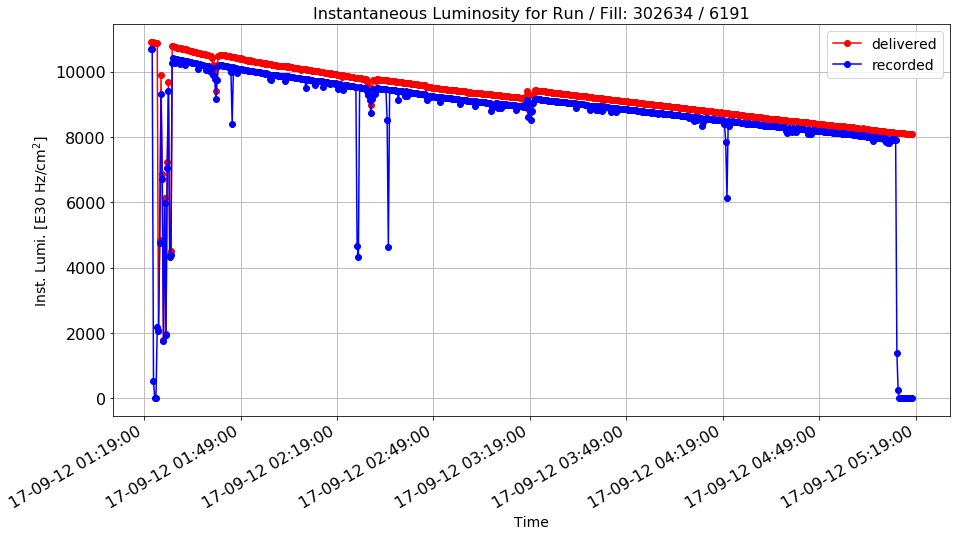

In [16]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302634]["time"], 
               int_lumi2[int_lumi2["run"] == 302634]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302634]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

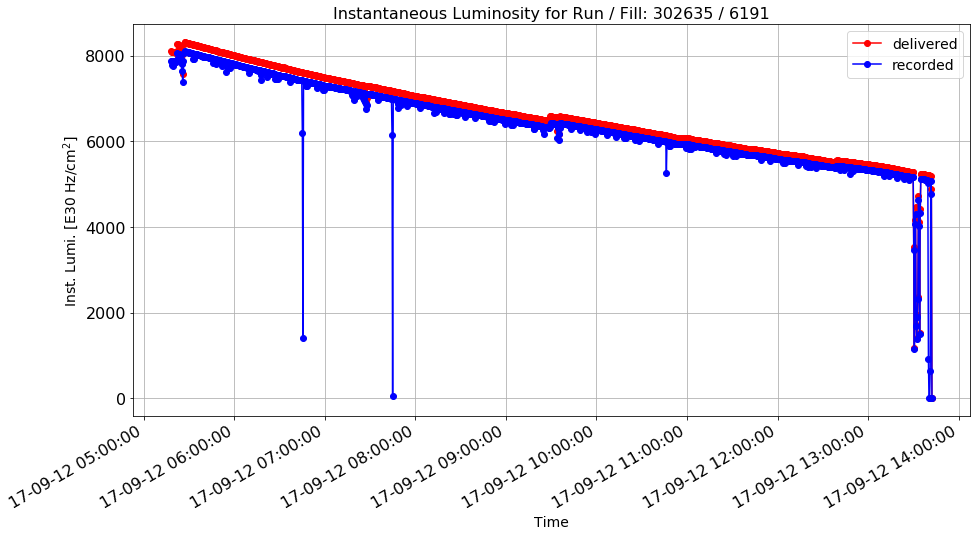

In [17]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302635]["time"], 
               int_lumi2[int_lumi2["run"] == 302635]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302635]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[0])))

In [18]:
int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [19]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [20]:
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [21]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

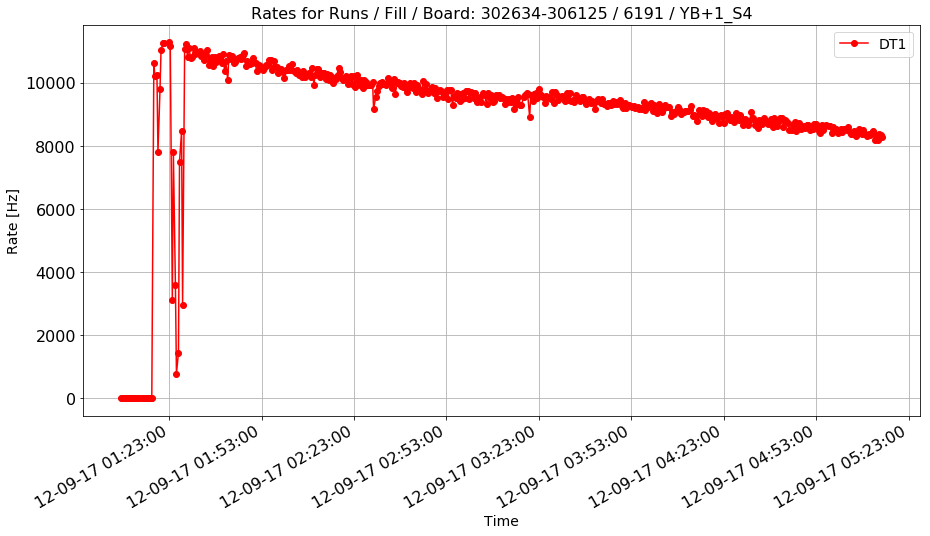

In [22]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 302634], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  (str(boundaries["run"].iloc[0])+"-"+str(boundaries["run"].iloc[2]),\
                   int_lumi2["fill"].iloc[2], "YB+1_S4"))

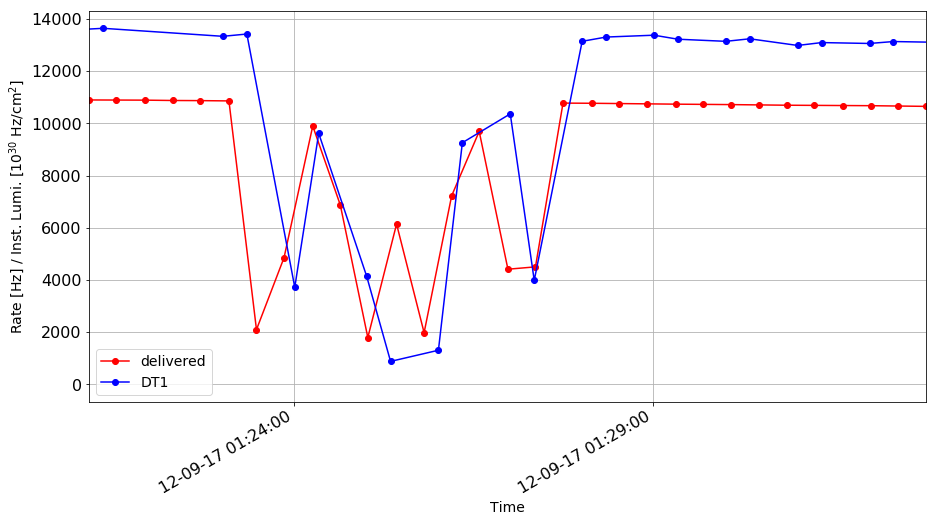

In [23]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Time")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[0],\
         int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[30])
ax.xaxis_date()
xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)
ax.grid()
fig.autofmt_xdate()
plt.plot(int_lumi2[int_lumi2["run"] == 302634]["time"],\
         int_lumi2[int_lumi2["run"] == 302634]["delivered"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["time"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

Associating a LS and an instantaneous luminosity to each rate:

In [24]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [25]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [26]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-09-12 01:07:57 2017-11-04 10:14:06
Duplicates: 1369390


In [27]:
print len(df_rates_noduplicates)

23210


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [28]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000


Removing the few cases not assigned and that are still at -1:

In [29]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

23176


Save in a csv file:

In [30]:
df_rates.to_csv("df_rates_issues.csv", sep='\t')
df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [31]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [32]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000


Save another backup copy:

In [33]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [34]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

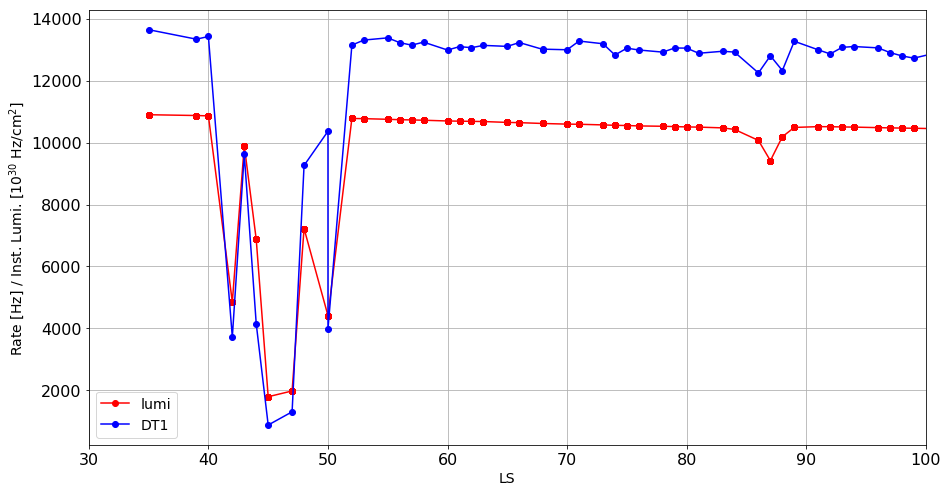

In [35]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("LS")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(30, 100)
ax.grid()
plt.plot(df_rates[df_rates["run"] == 302634]["ls"],\
         df_rates[df_rates["run"] == 302634]["lumi"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["ls"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

In [36]:
#print df_rates[df_rates.ls <= 0]
df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [37]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [38]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [39]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [40]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3", "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [41]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [42]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [43]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [44]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [45]:
print len(df_rates)

29520


Uncomment to check just one case:

In [46]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [158]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        df_temp["ratio"] = df_temp[x_val]/df_temp[y_val]
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0))
        plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        #plt.errorbar(df_temp[x_val], df_temp[y_val], xerr=x_err, yerr=df_temp[y_err], fmt='ro', ecolor='r')
    a, b, c = inter[0], inter[1], inter[0]/inter[1]-1
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c)

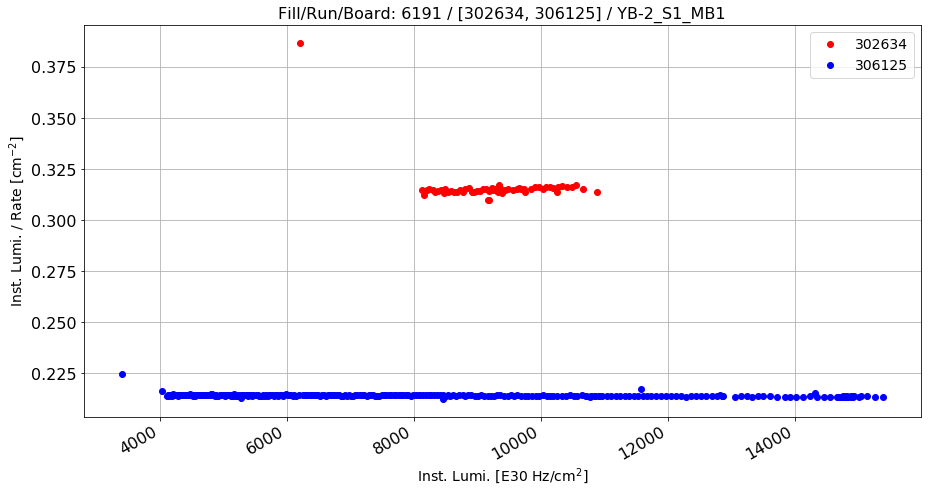

0.475527306301


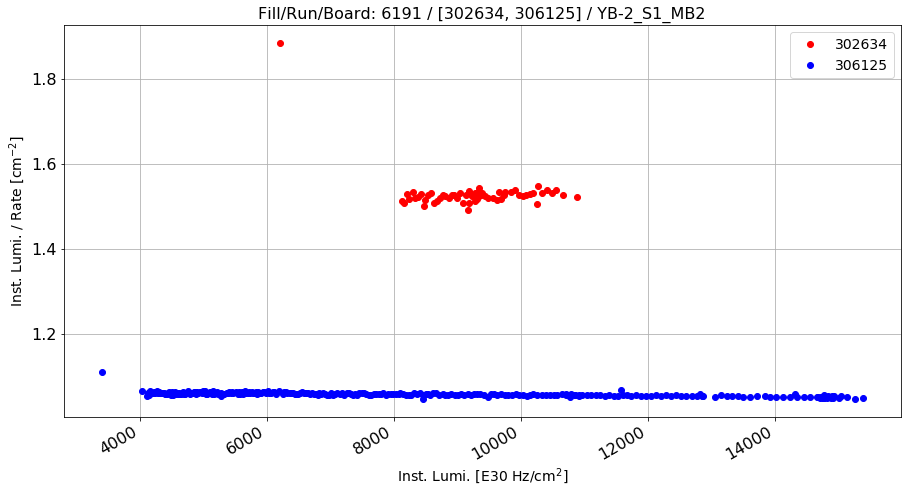

0.444894184754


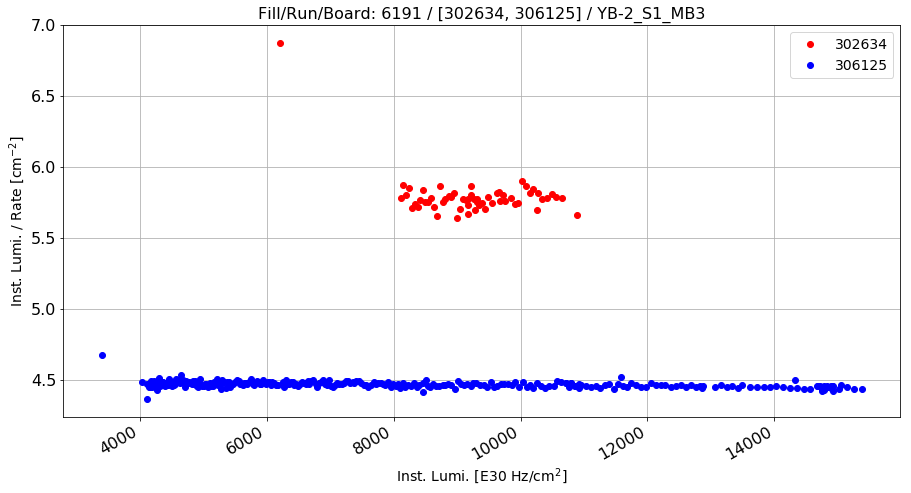

0.295803498783


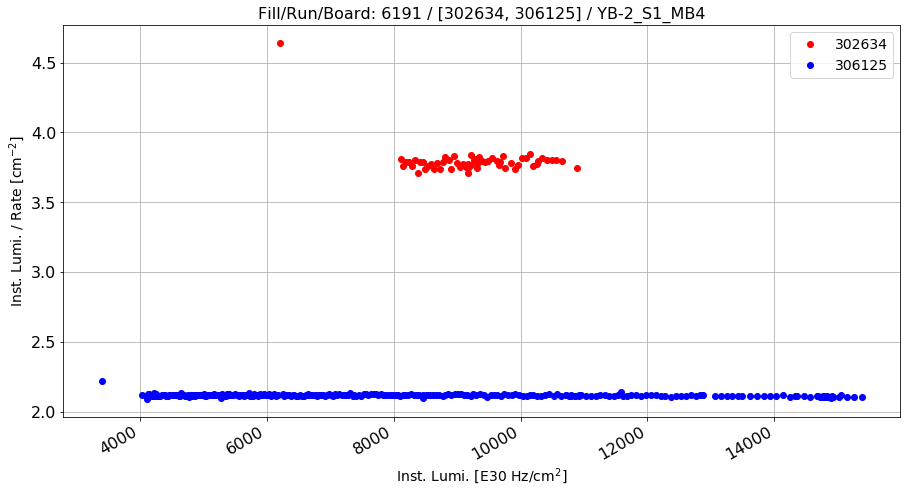

0.792770932541


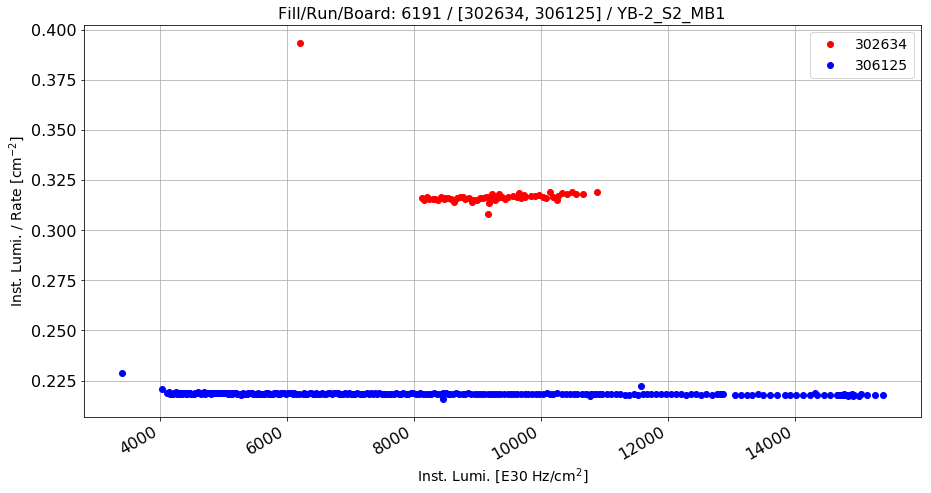

0.45379667998


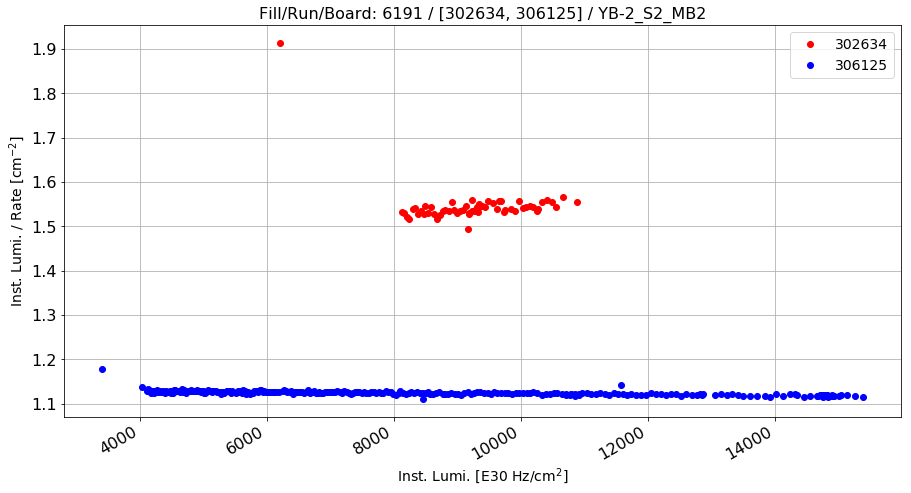

0.374923220939


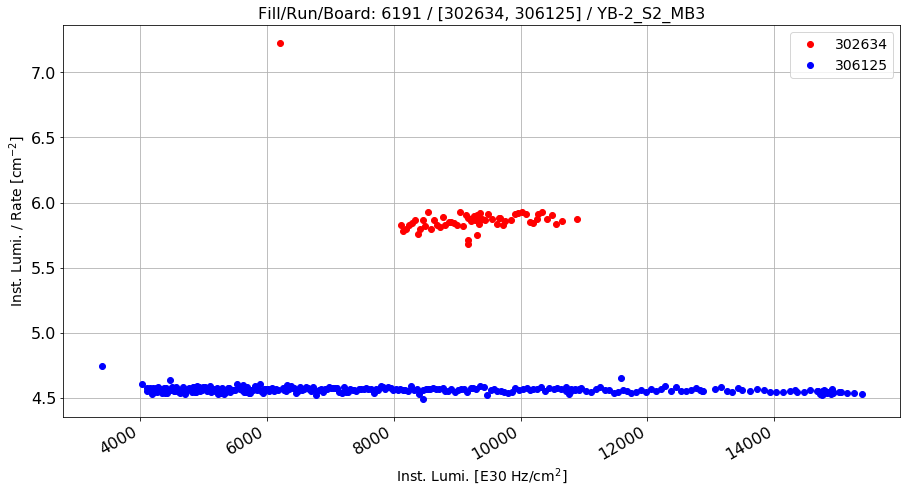

0.28858210474


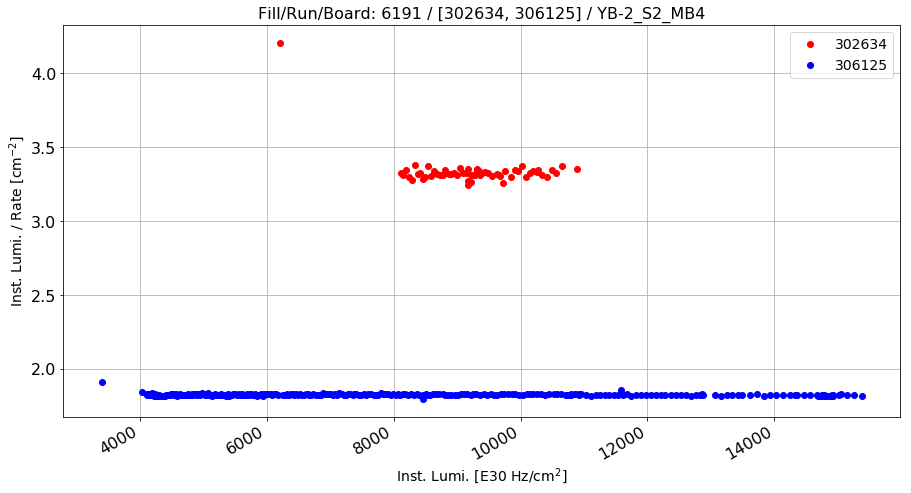

0.826243111393


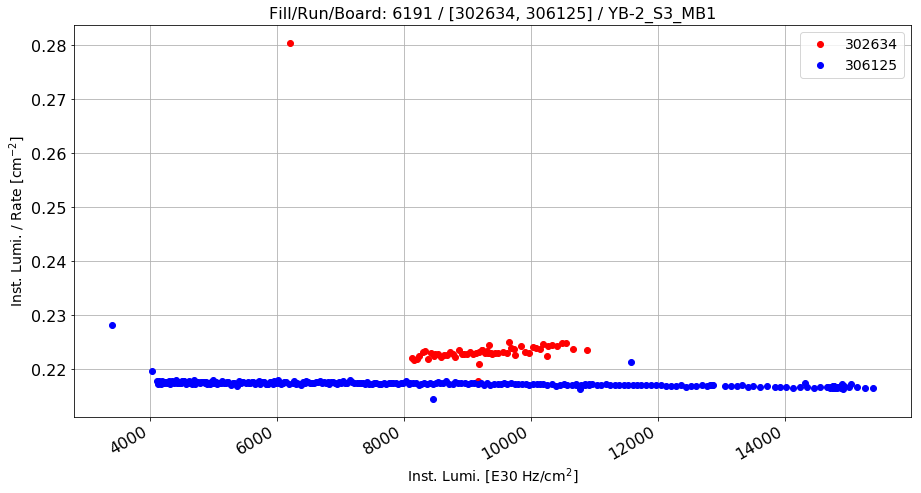

0.0308131350102


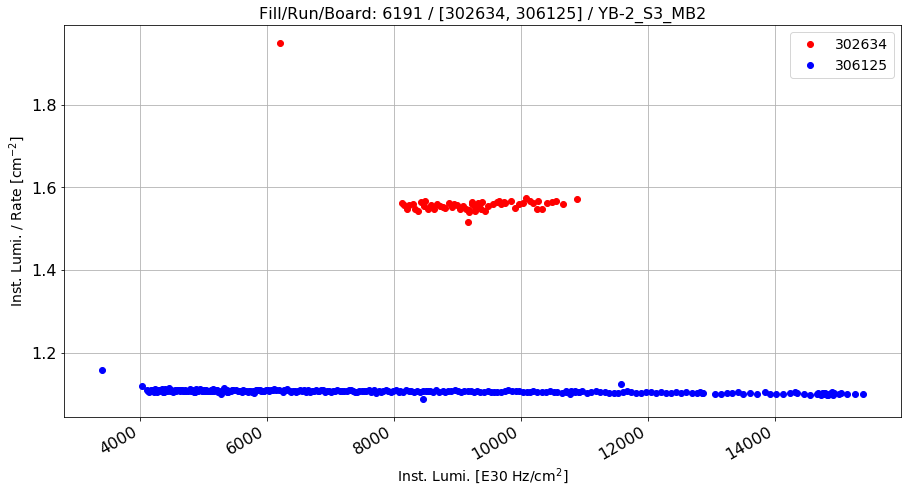

0.411800370886


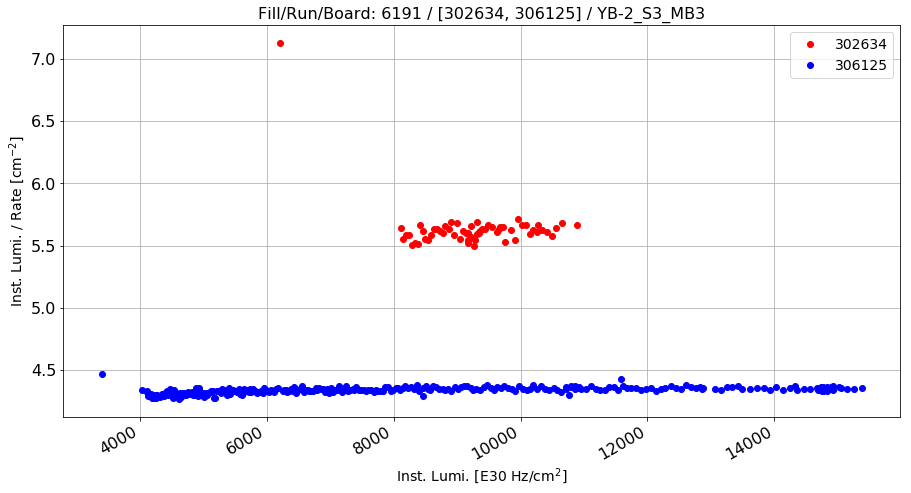

0.298566447957


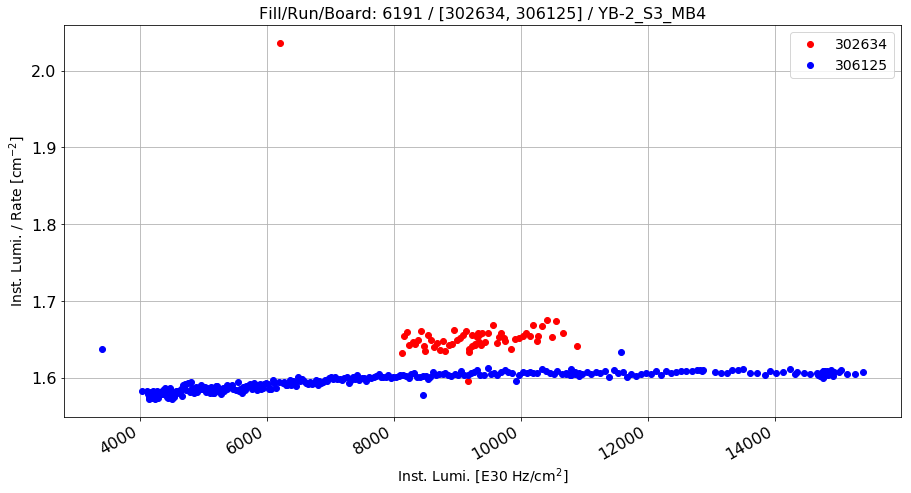

0.0371564572913


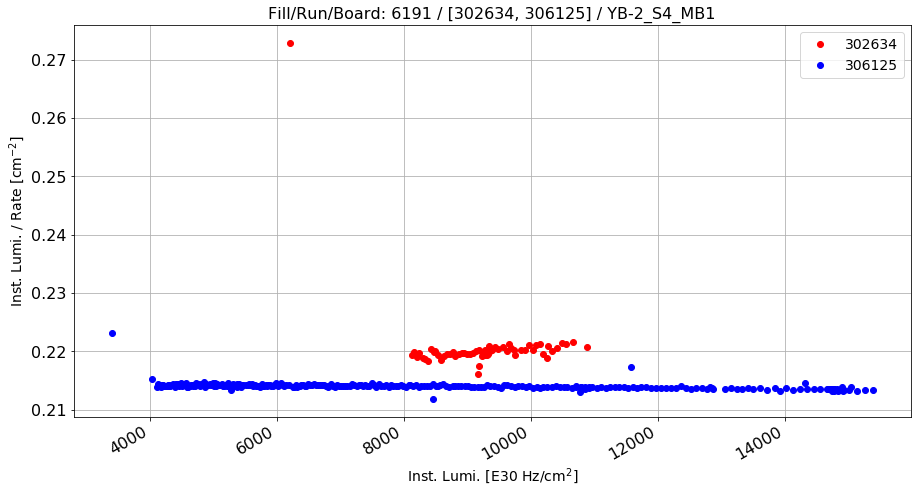

0.0314063938526


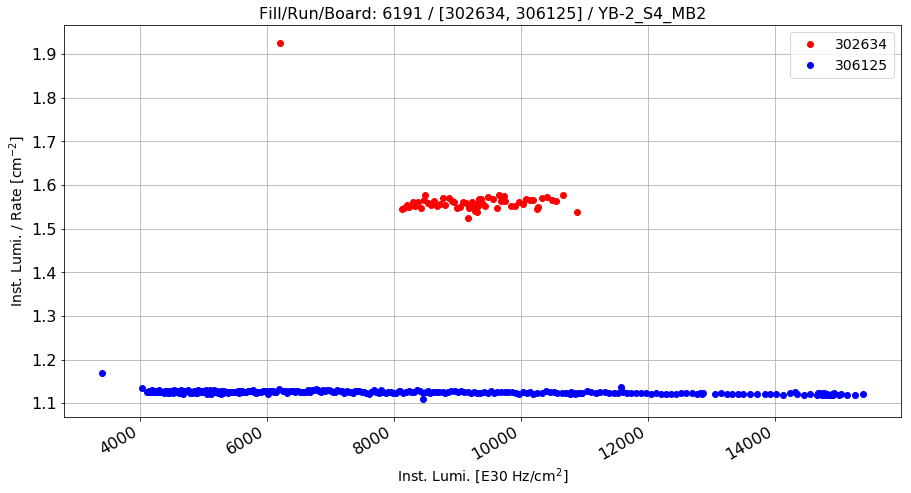

0.389962574736


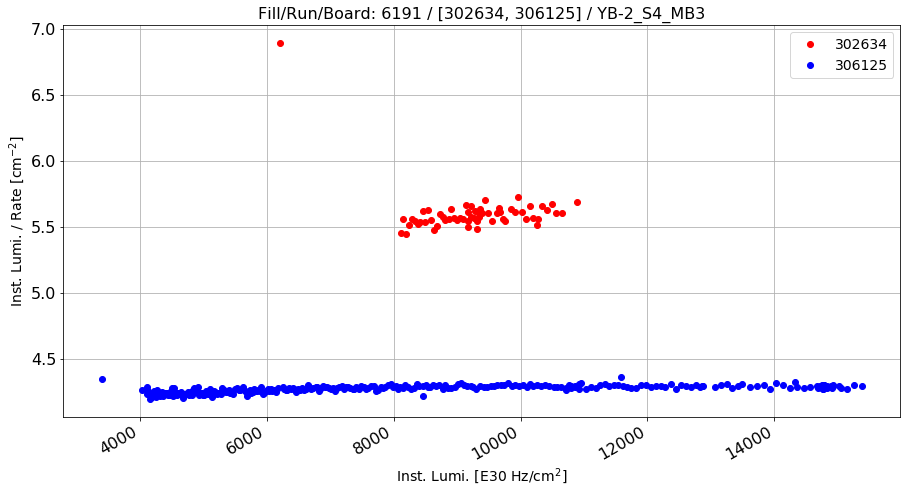

0.311030344068


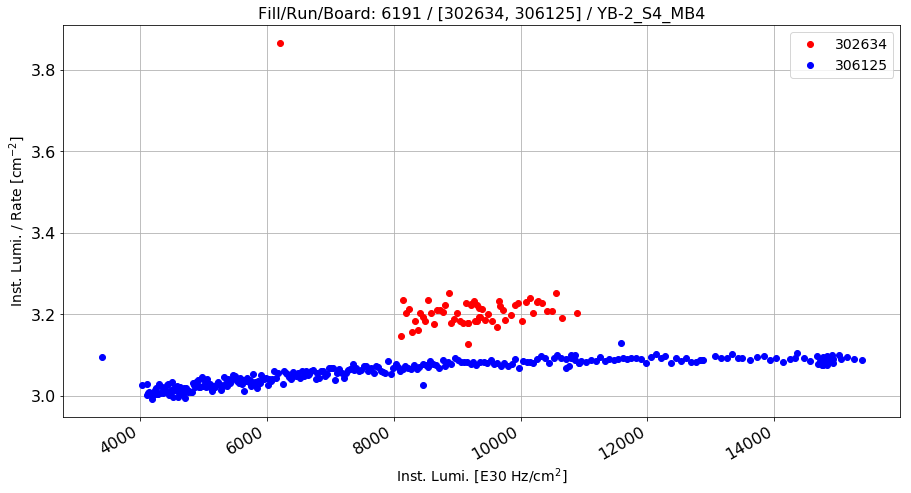

0.0507500274041


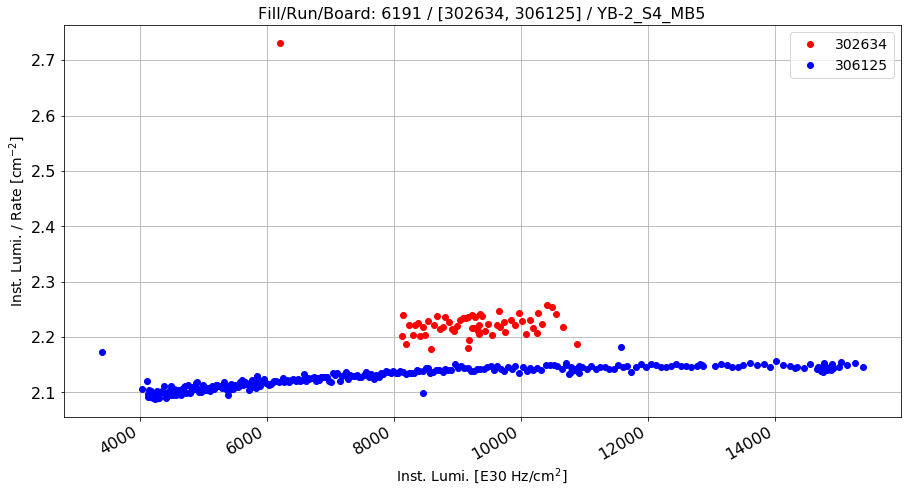

0.0475872514442


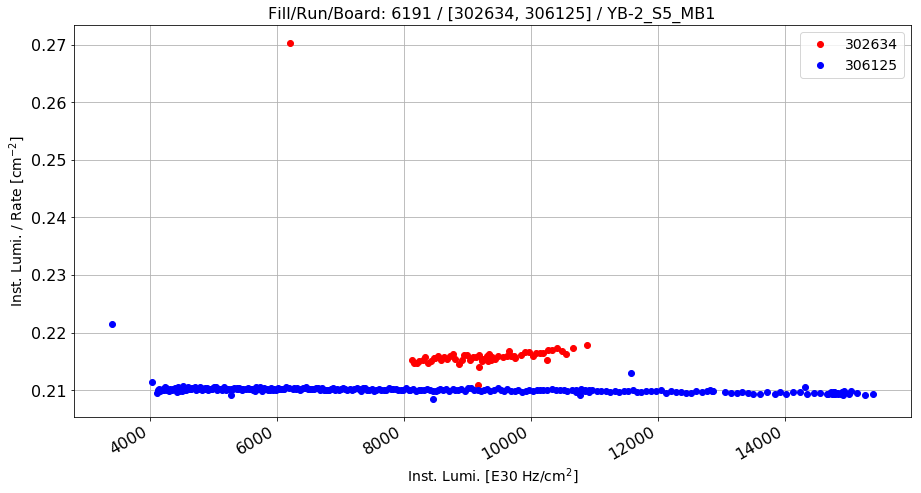

0.0312435203306


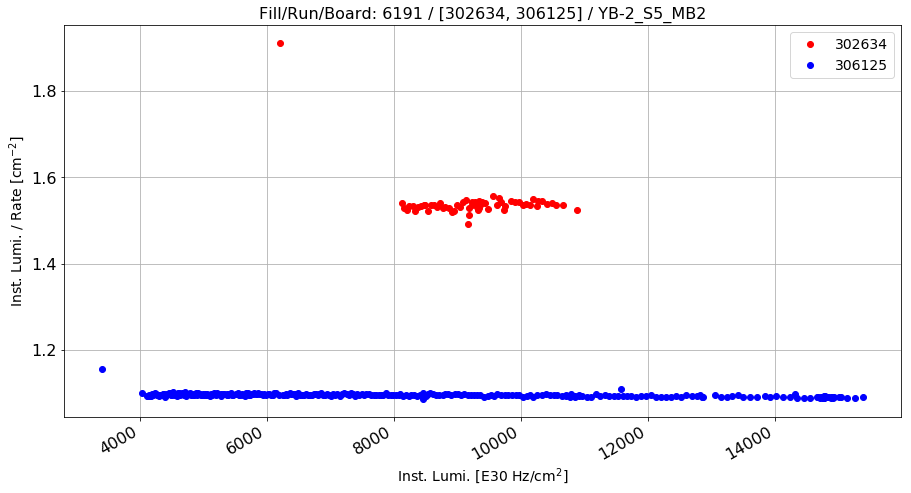

0.405831645878


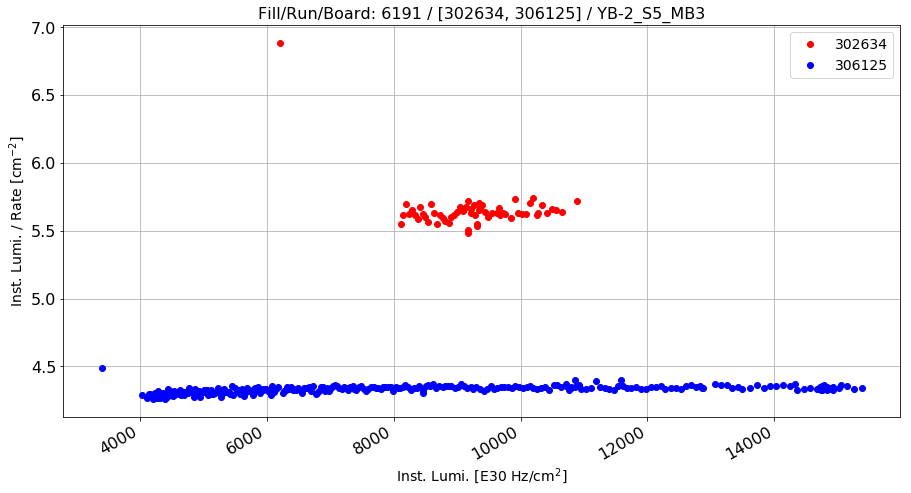

0.305133807536


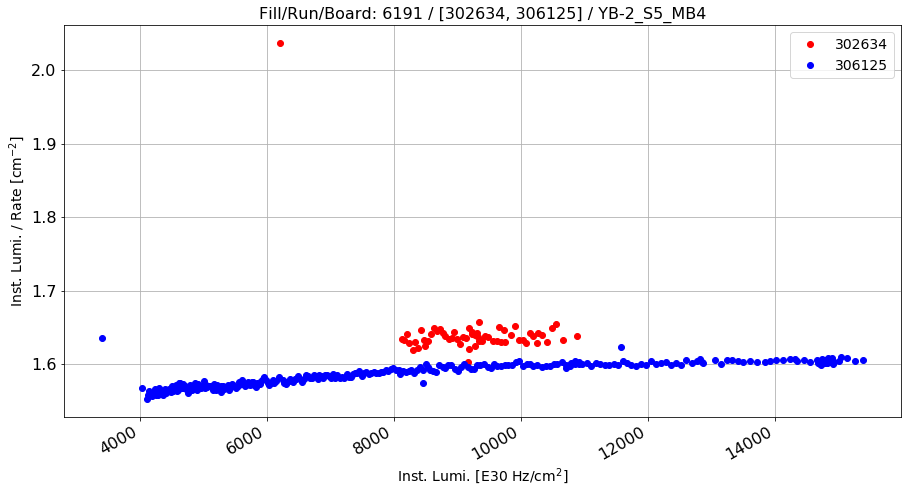

0.0359885850487


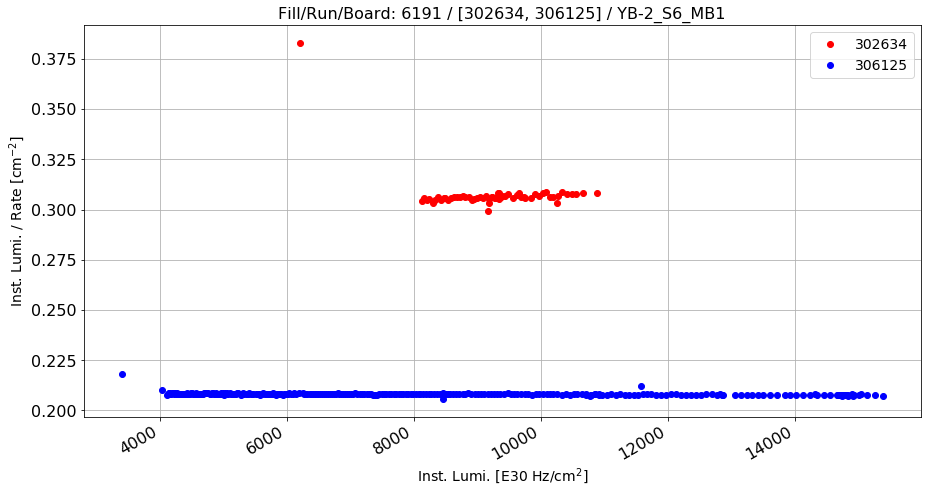

0.476581850801


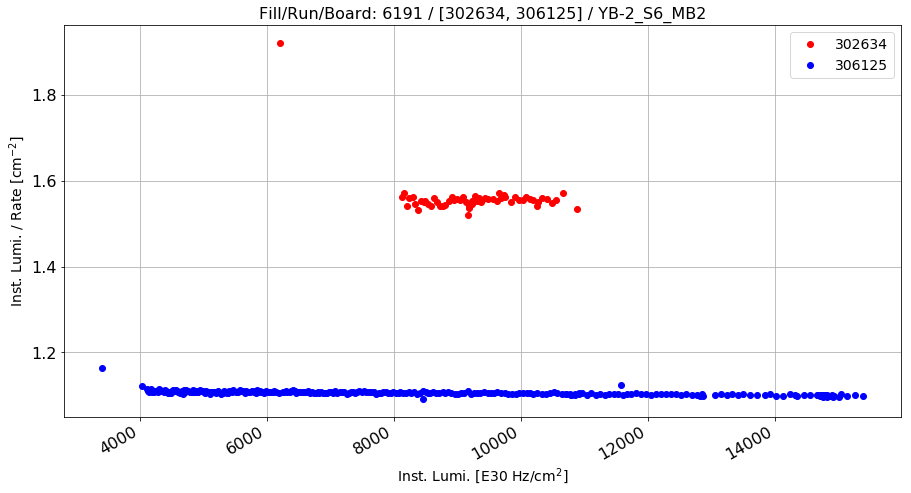

0.41009401108


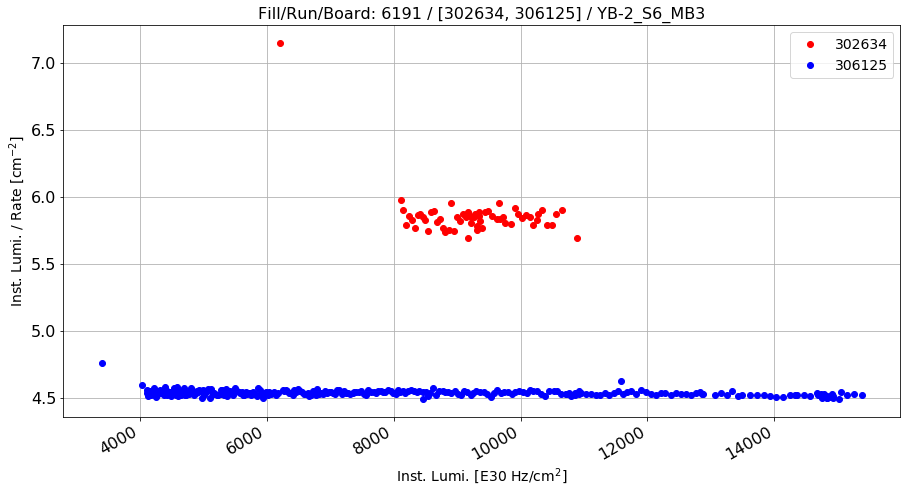

0.291492174131


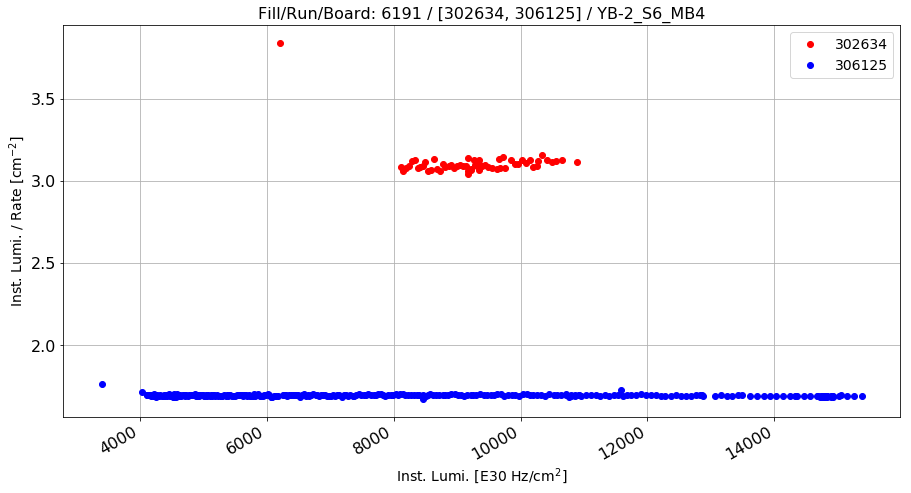

0.83269828574


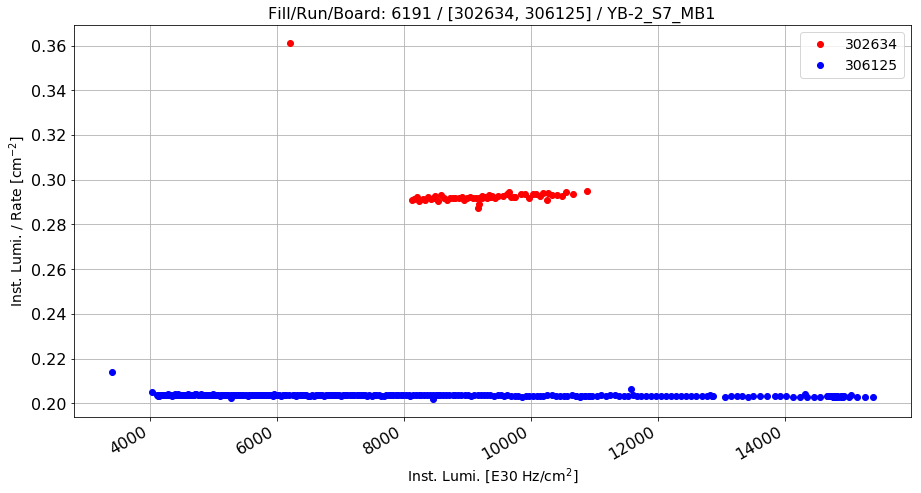

0.440854076545


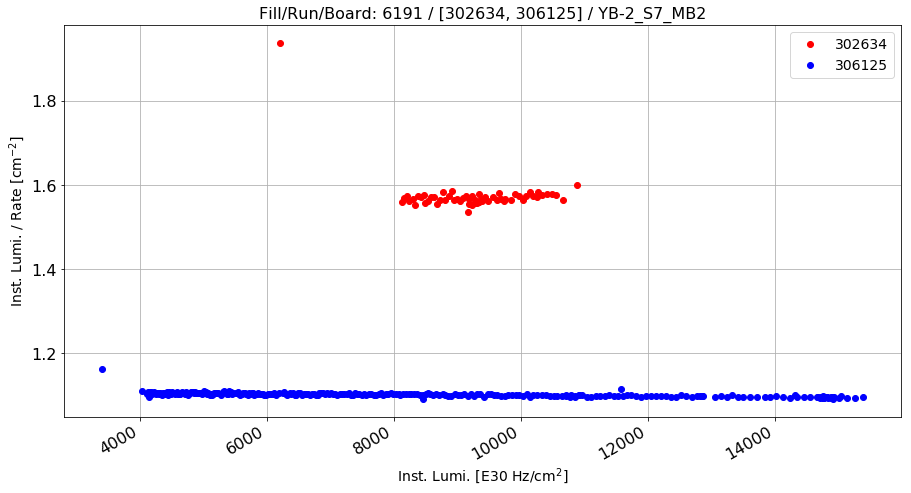

0.429130247757


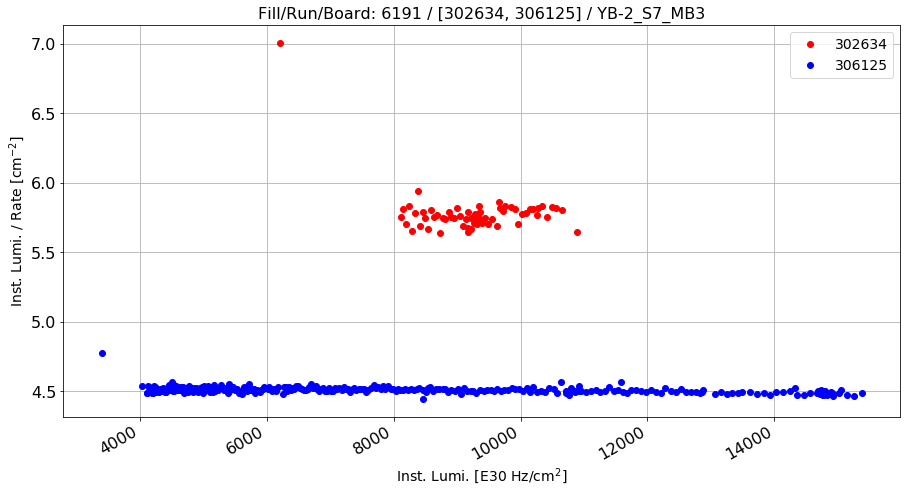

0.281886372313


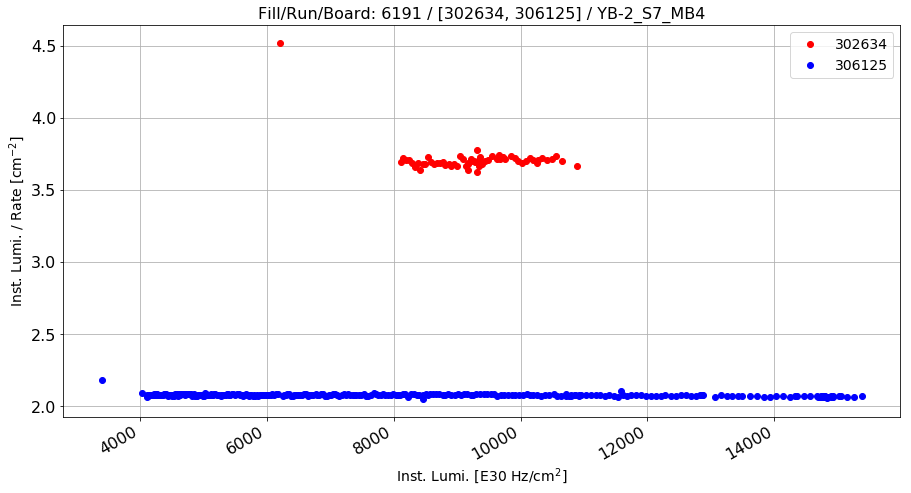

0.785911543355


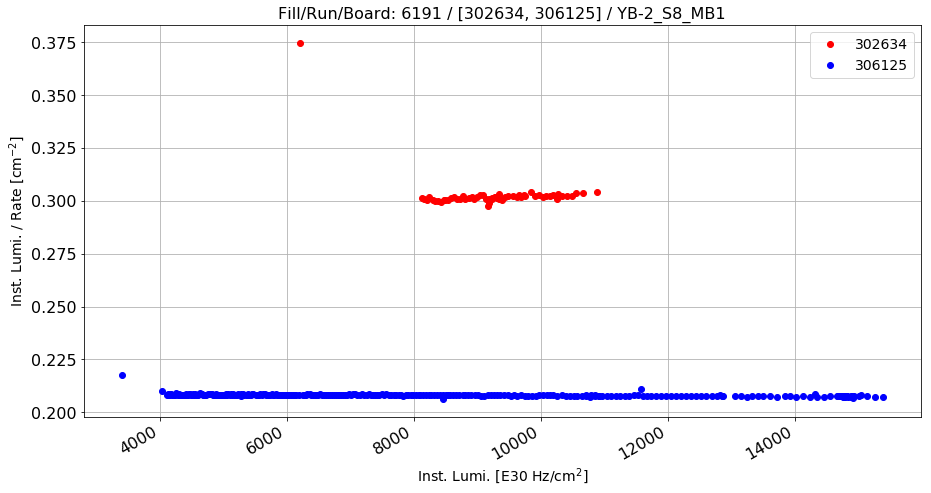

0.45497221552


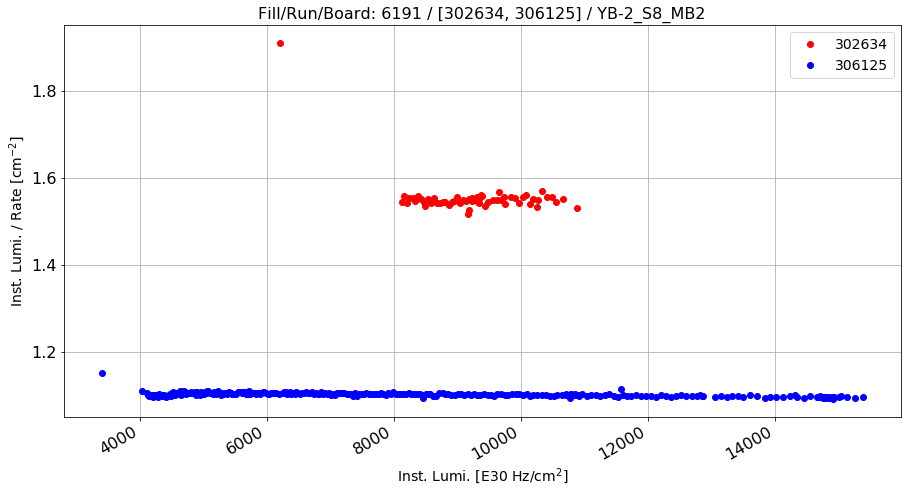

0.41060299733


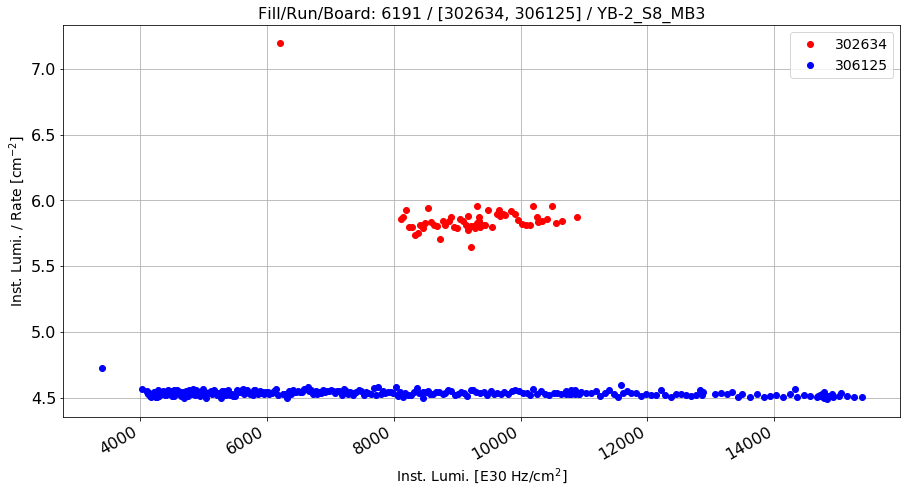

0.29258224866


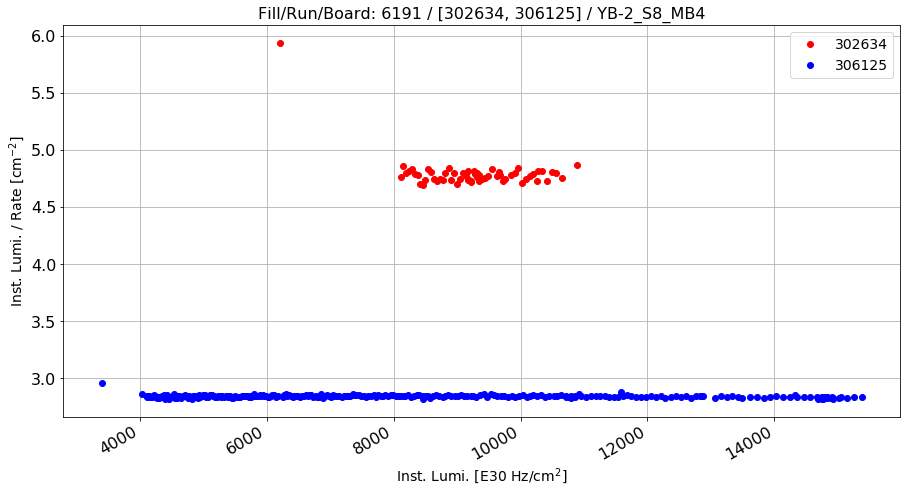

0.686607543188


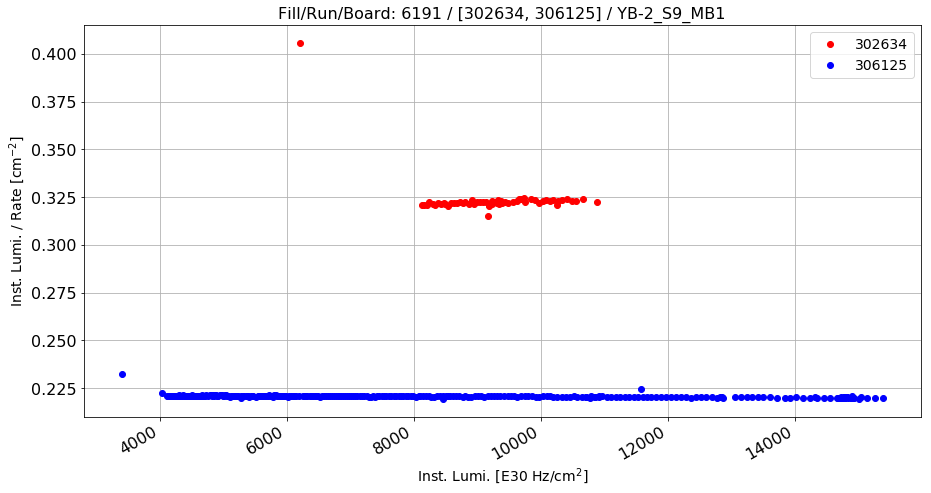

0.466025028878


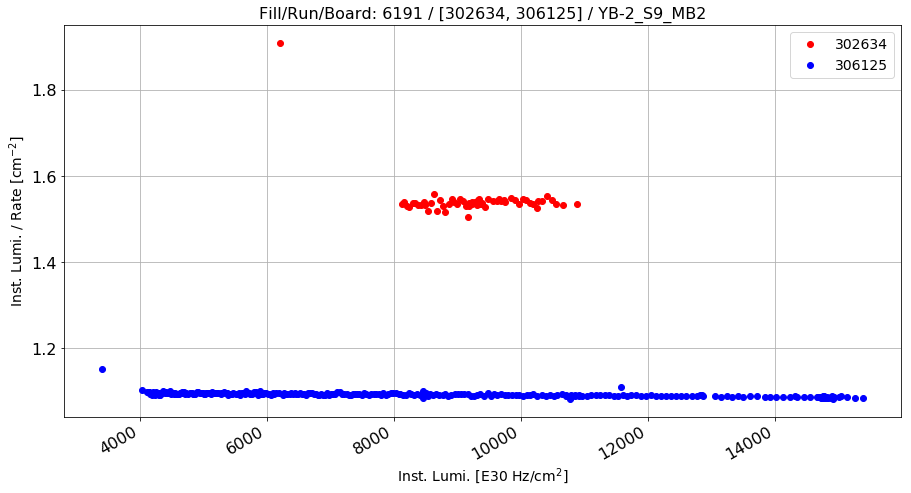

0.412077844059


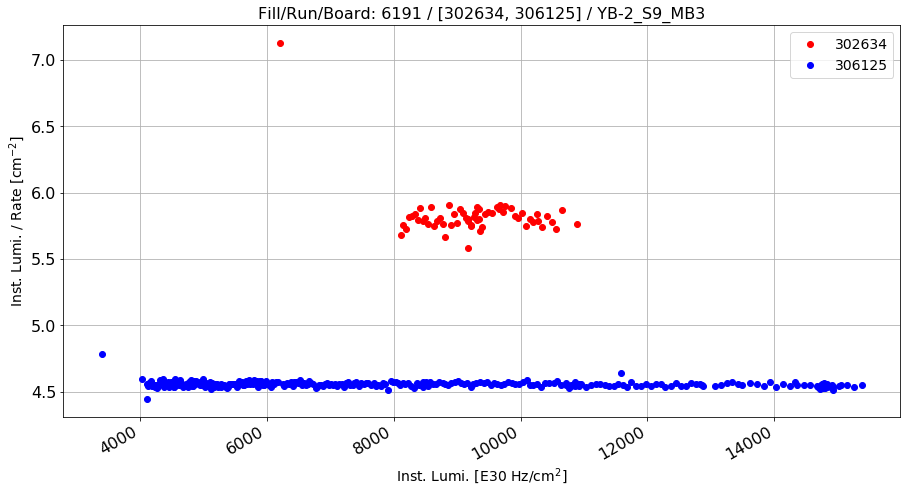

0.278630431105


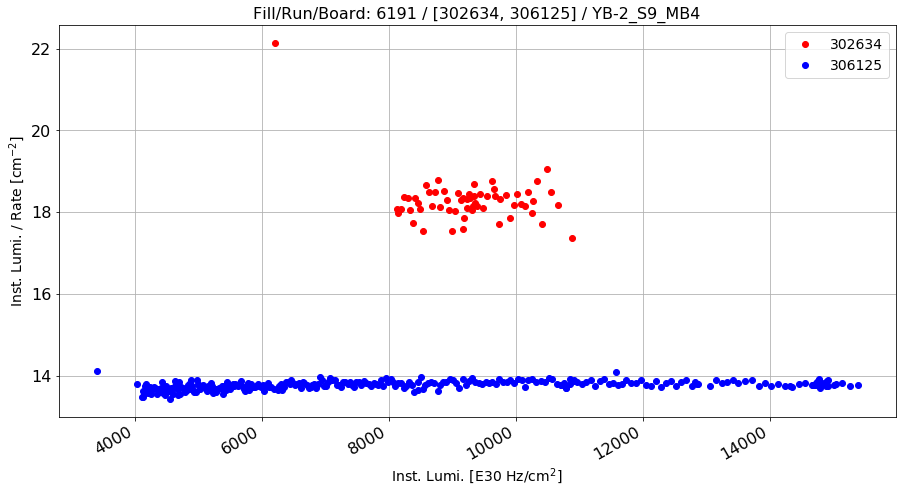

0.328350982663


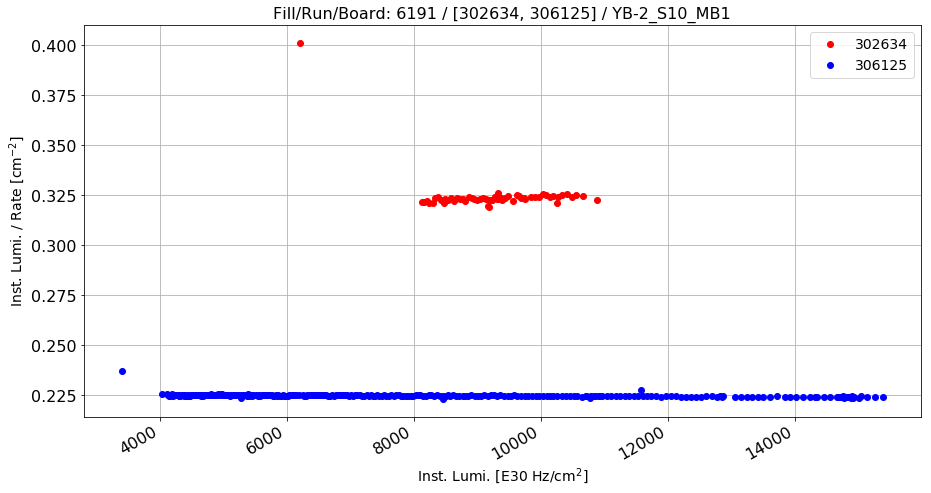

0.443947811929


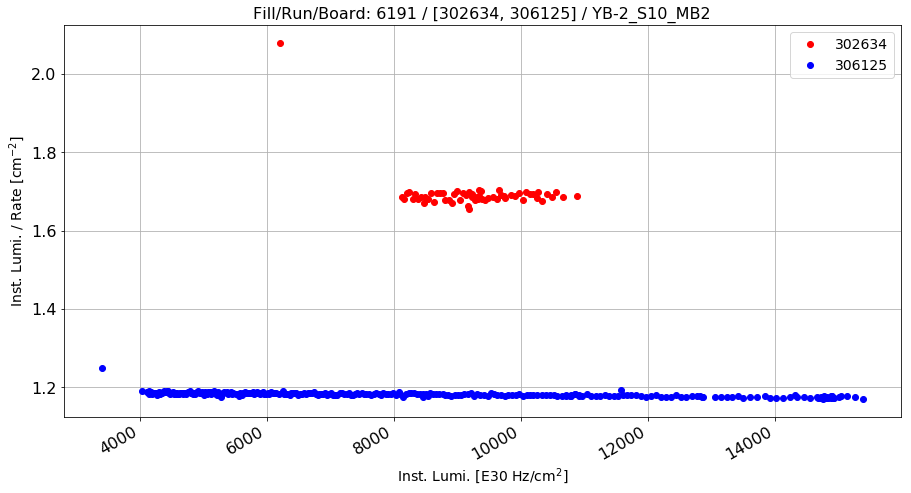

0.432420692249


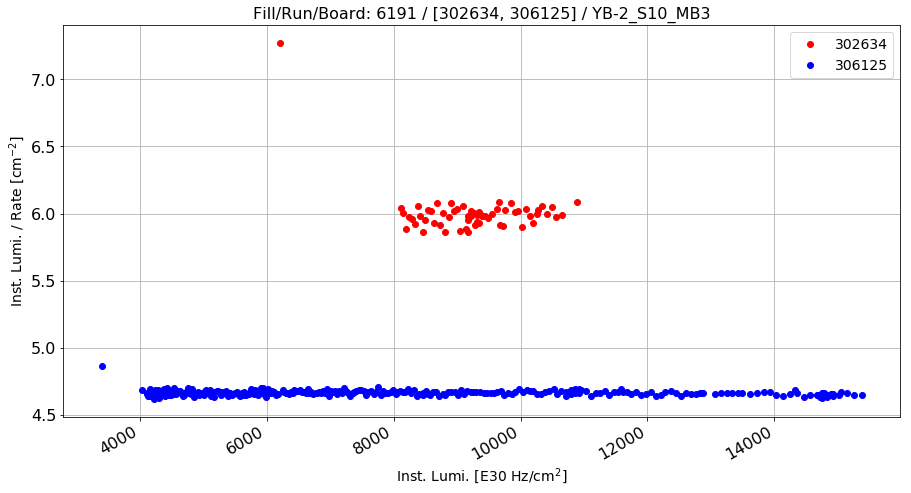

0.287707039144


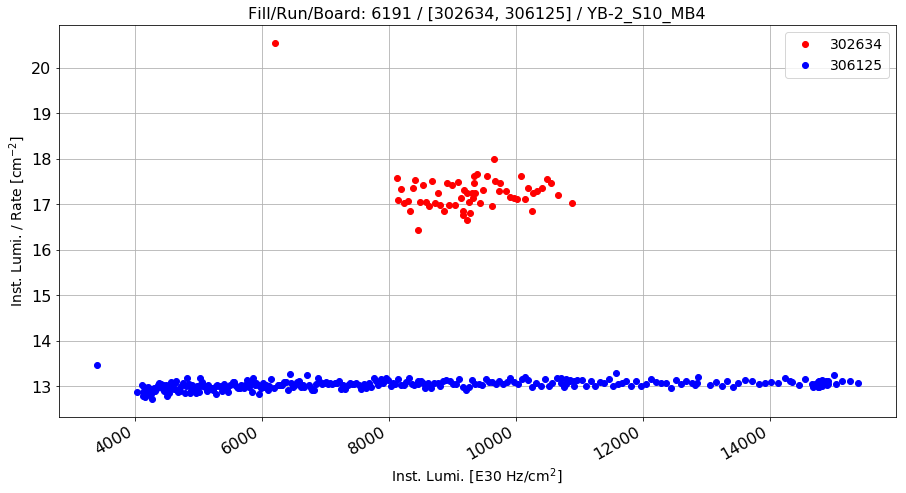

0.324997466646


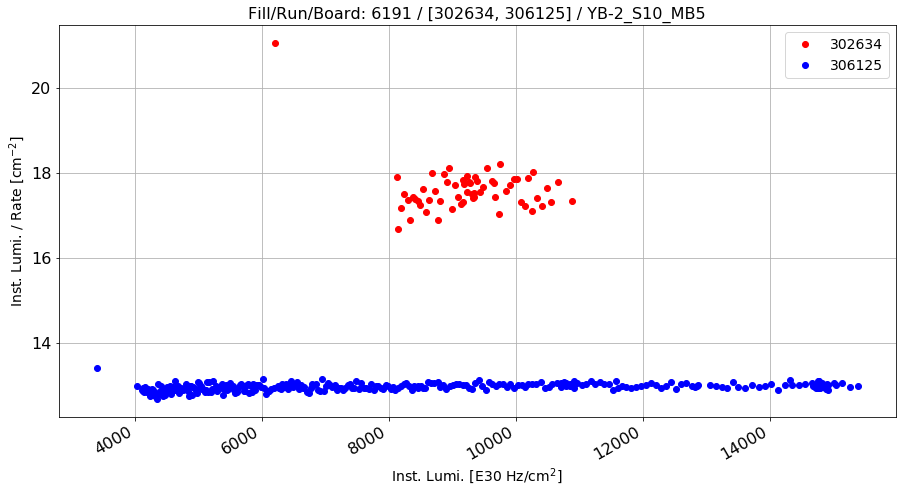

0.358491423117


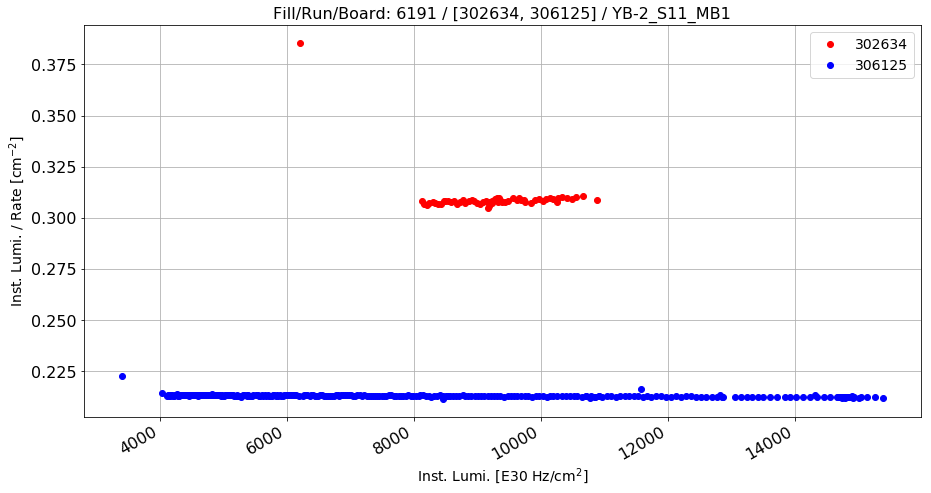

0.452854189844


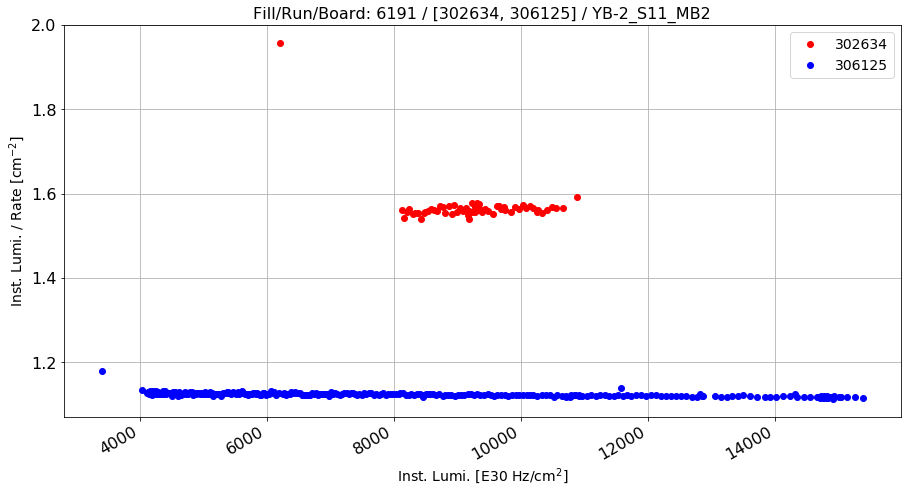

0.395238608758


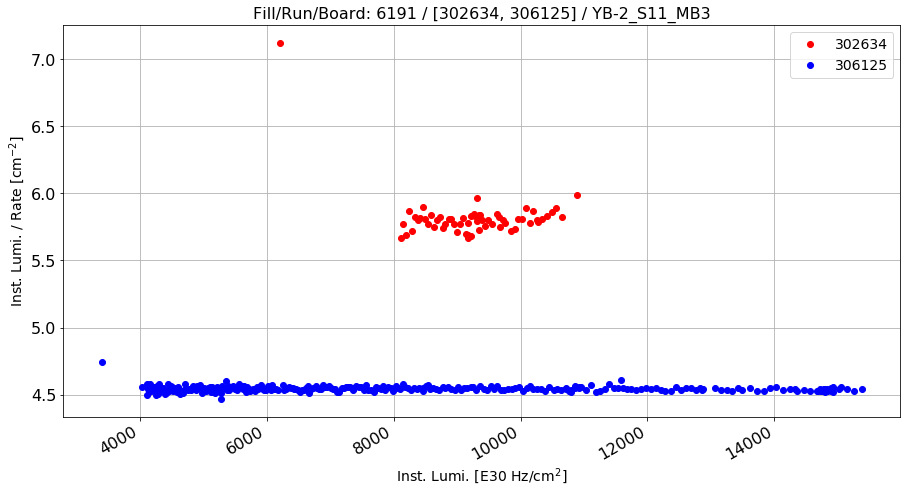

0.280349655816


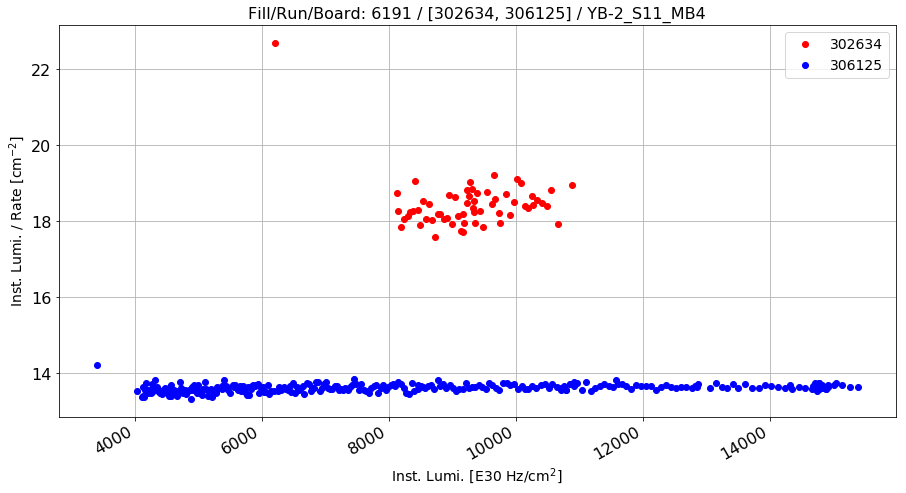

0.354634390441


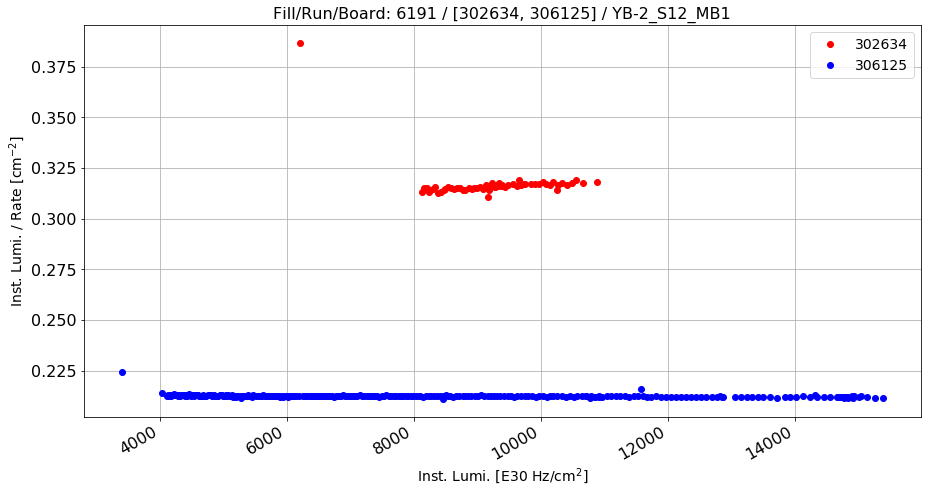

0.491837899458


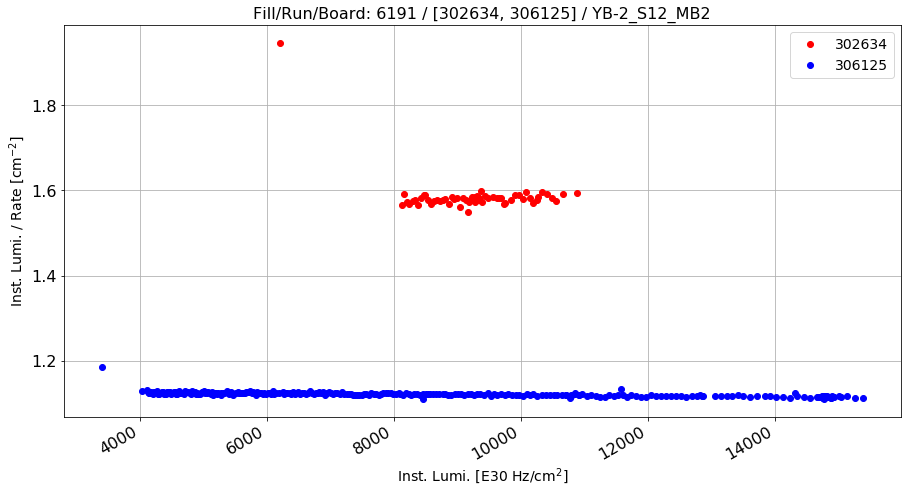

0.413903156842


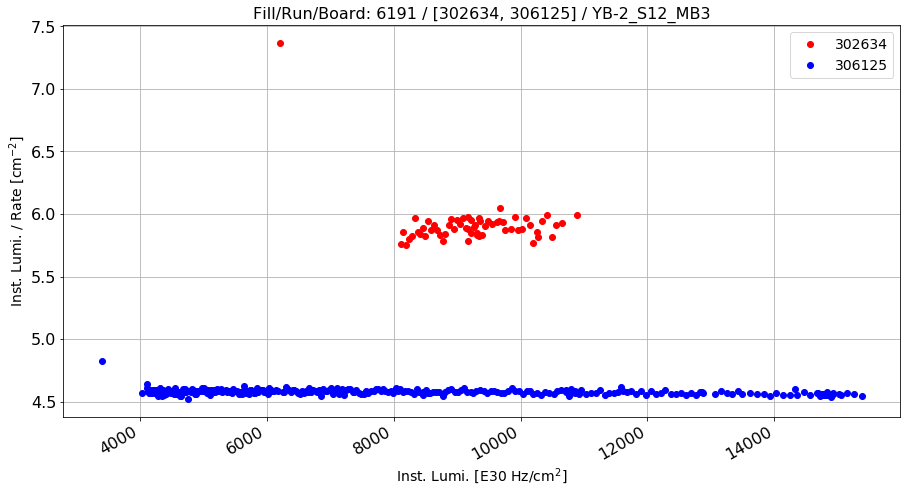

0.291916325798


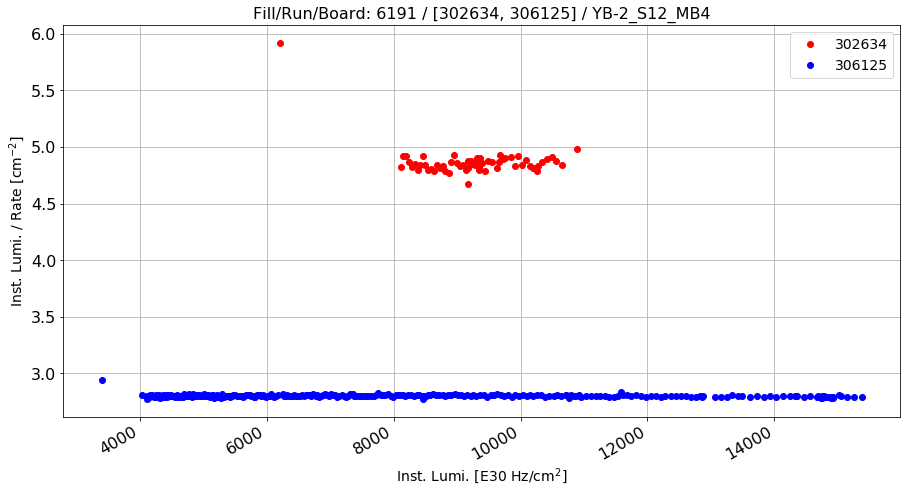

0.737716529532


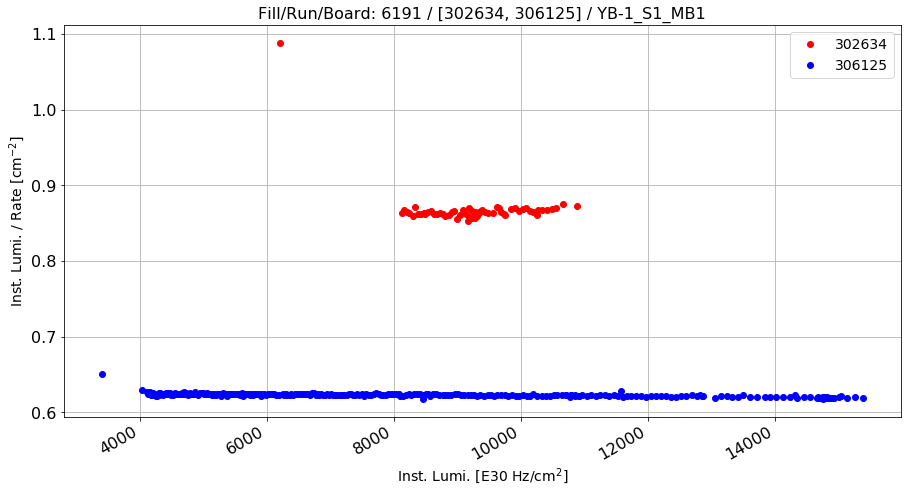

0.393538425319


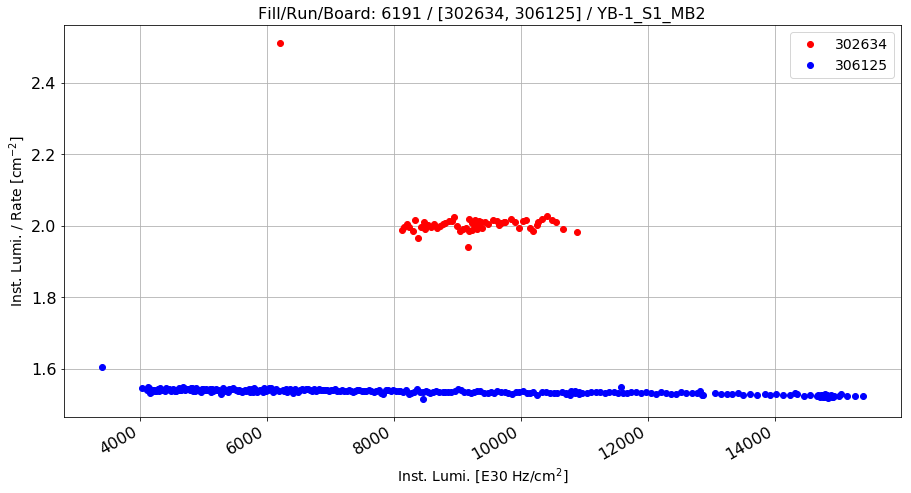

0.308228986341


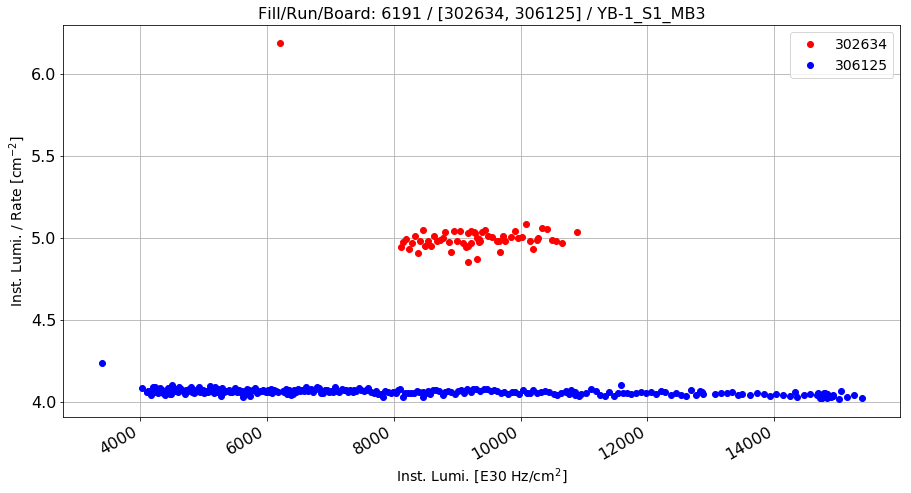

0.233549831038


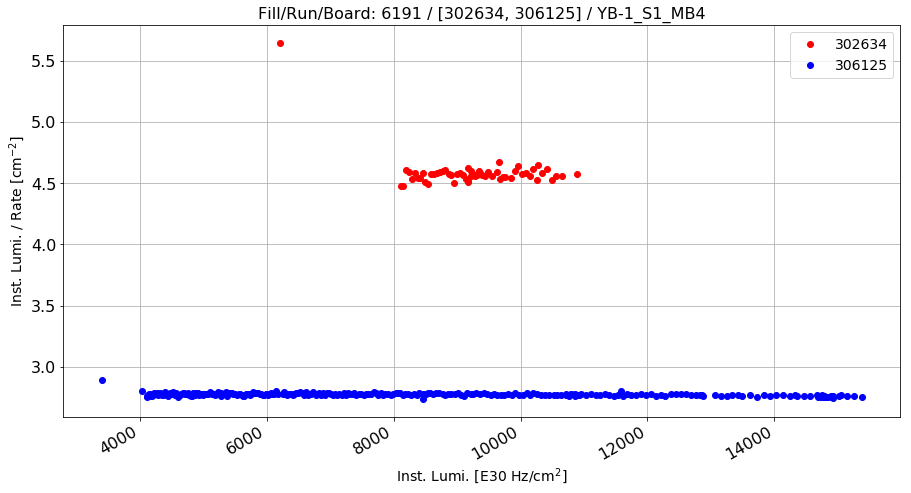

0.652532792995


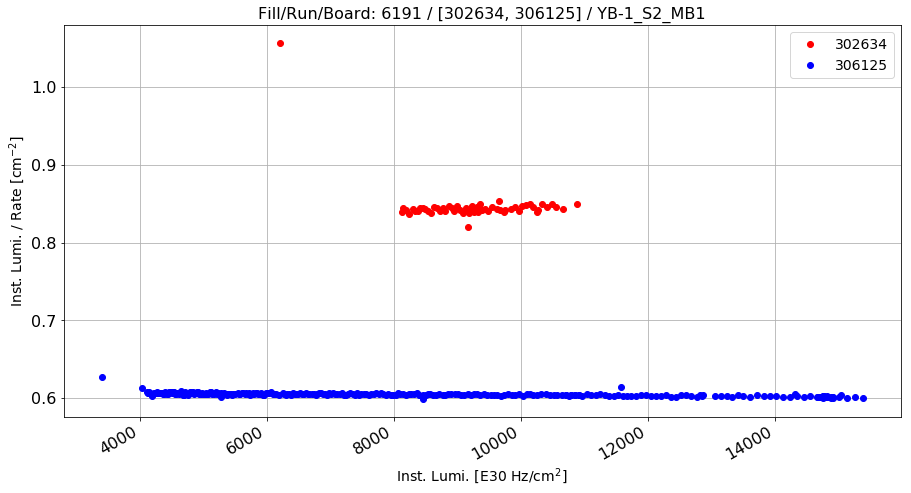

0.400468858141


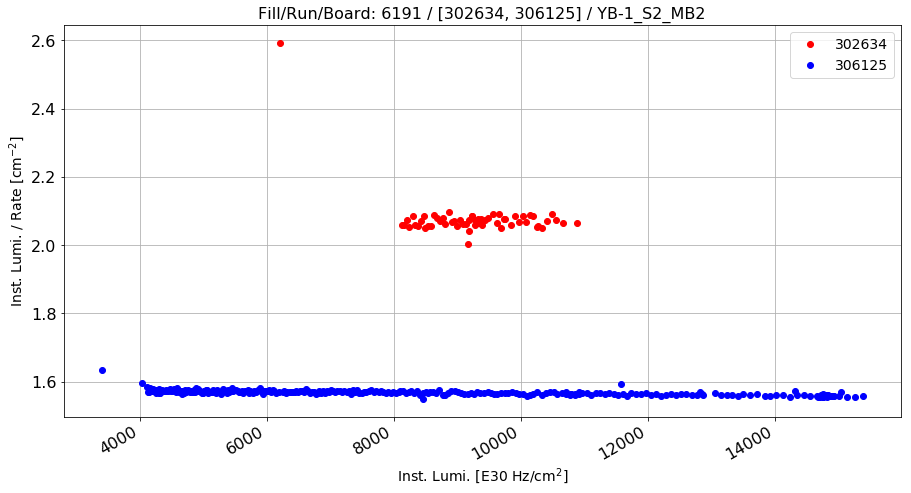

0.324449813051


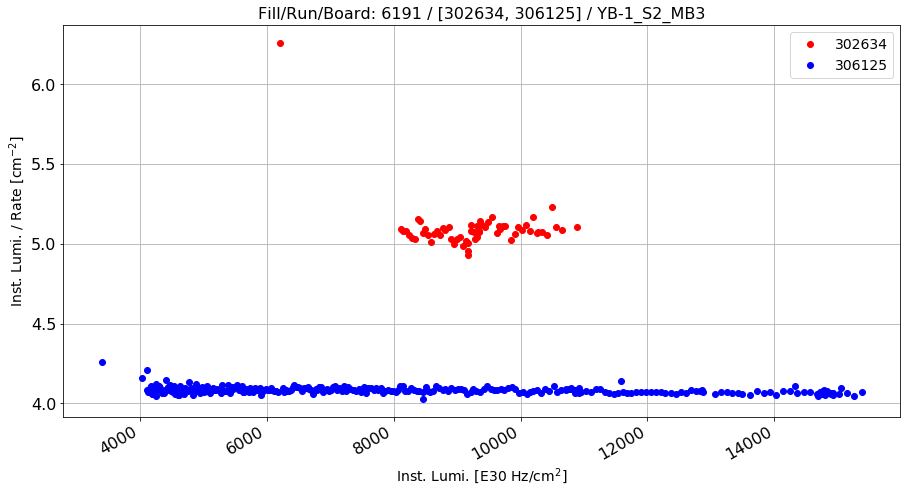

0.248118903178


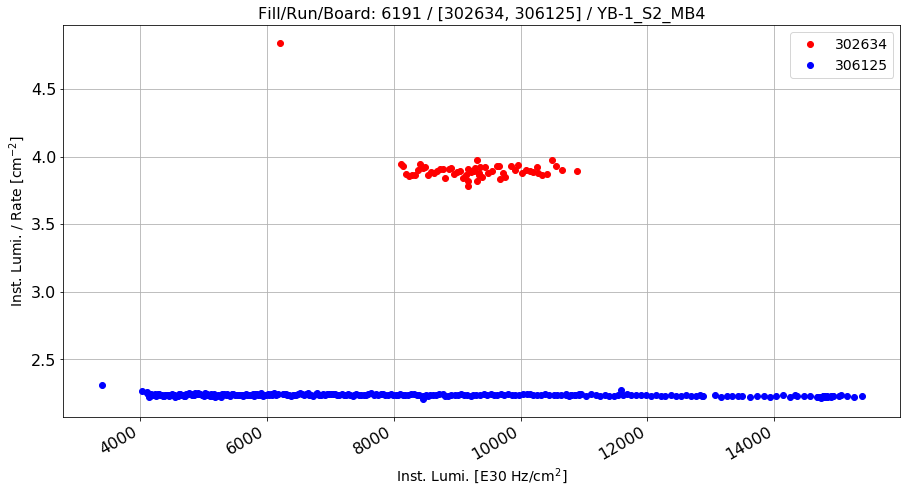

0.745588267375


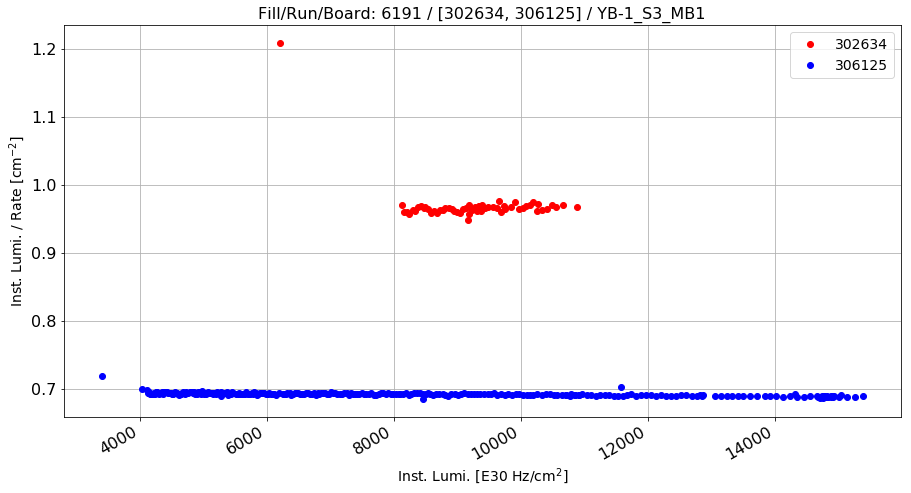

0.39970793503


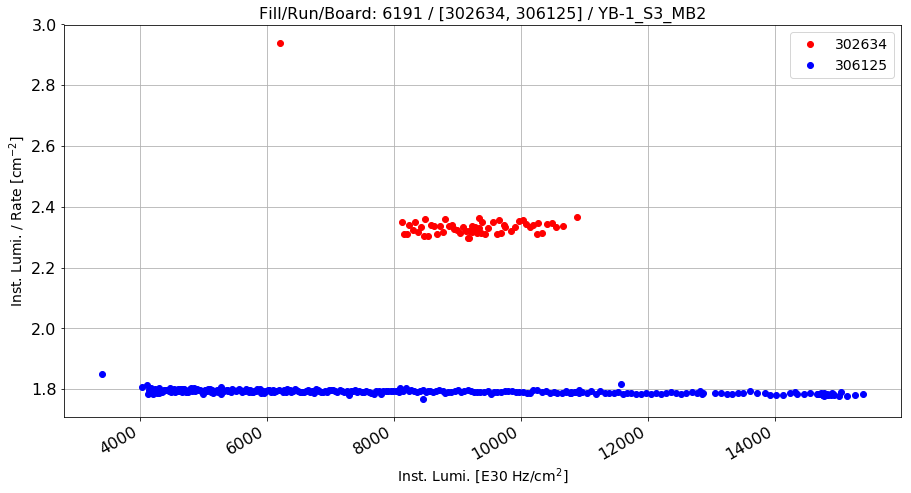

0.306253982139


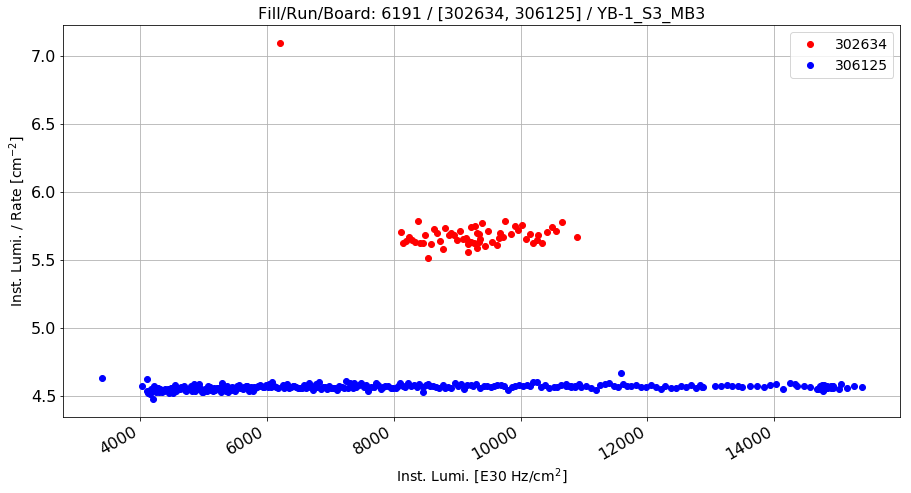

0.247589878749


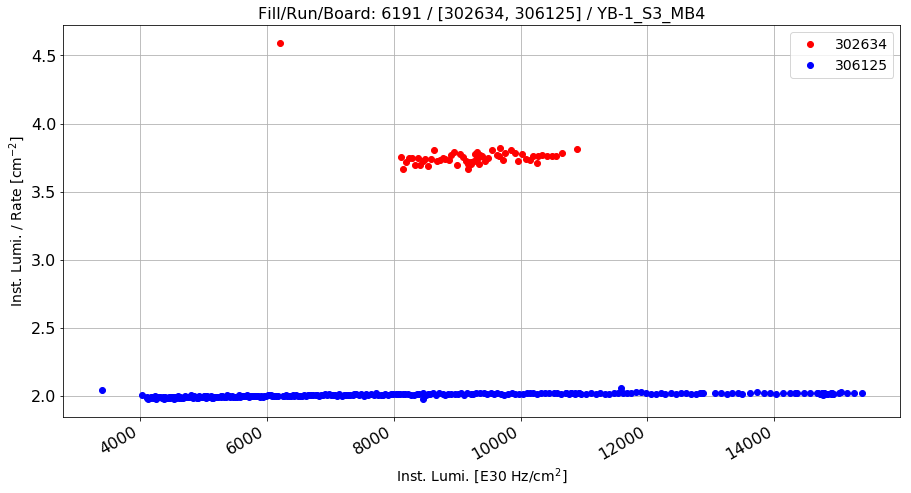

0.87173996371


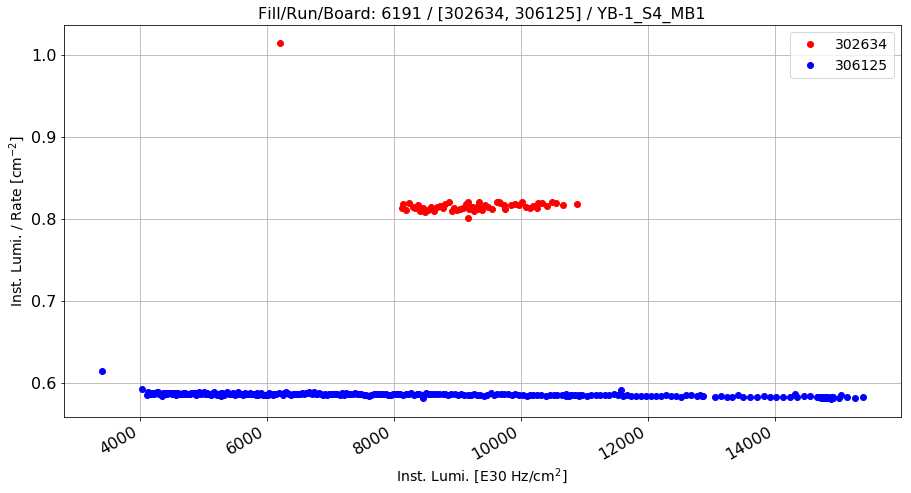

0.396886657235


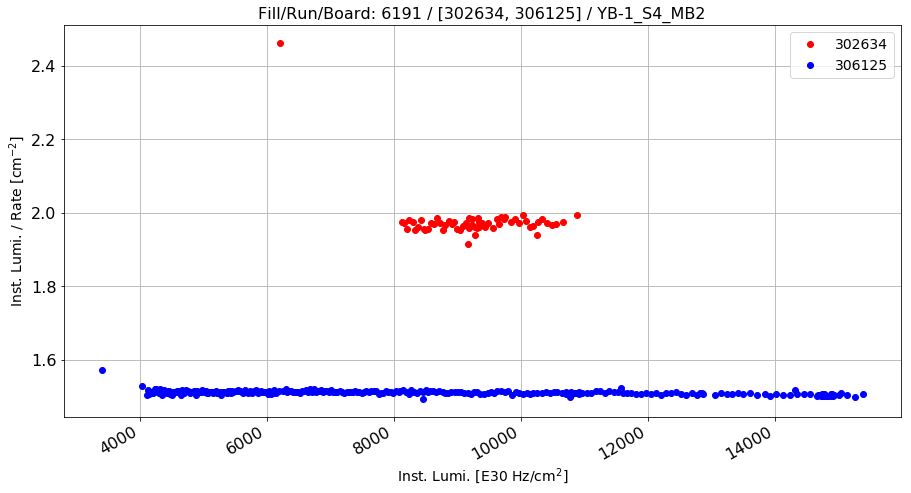

0.308015466659


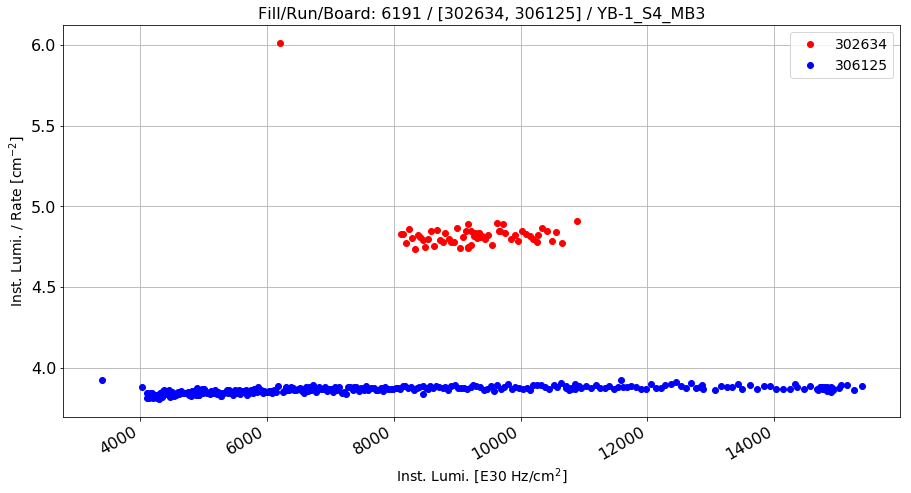

0.251068634753


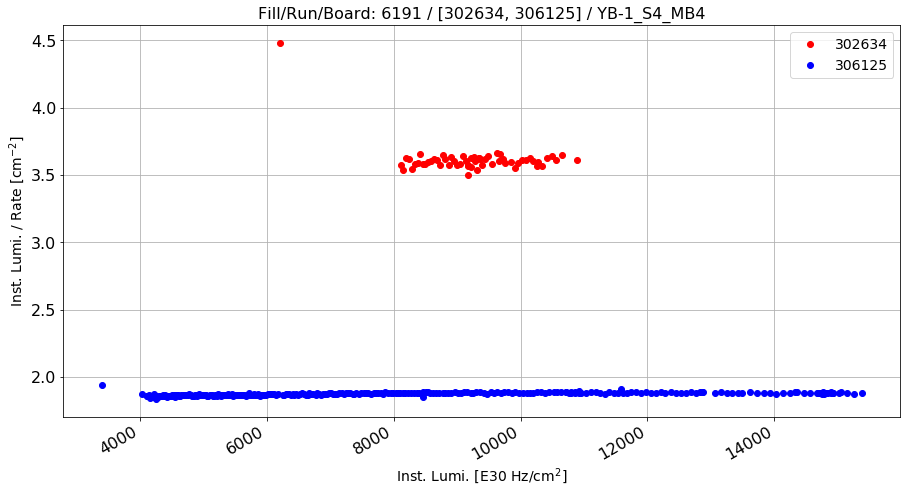

0.92816238489


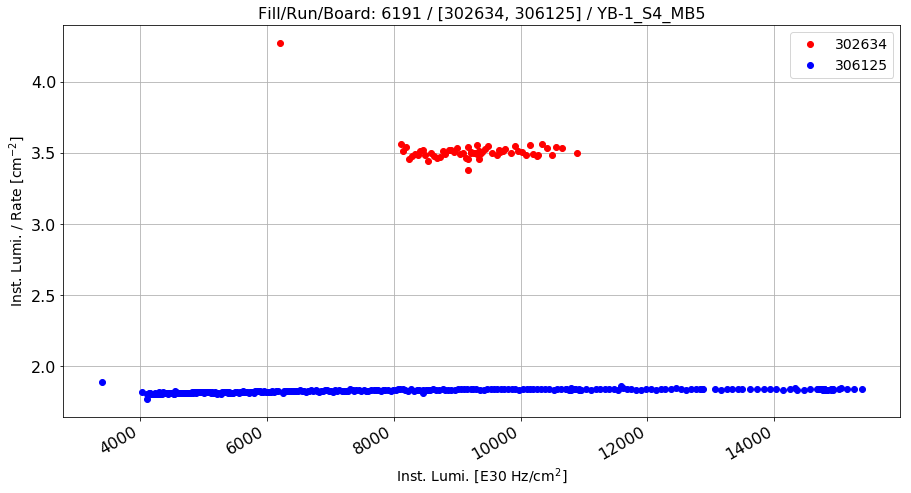

0.922918544318


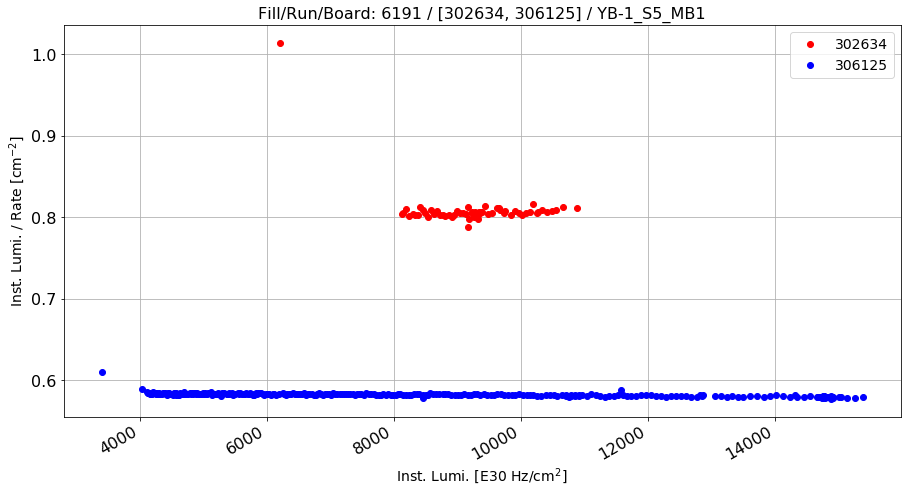

0.38907678748


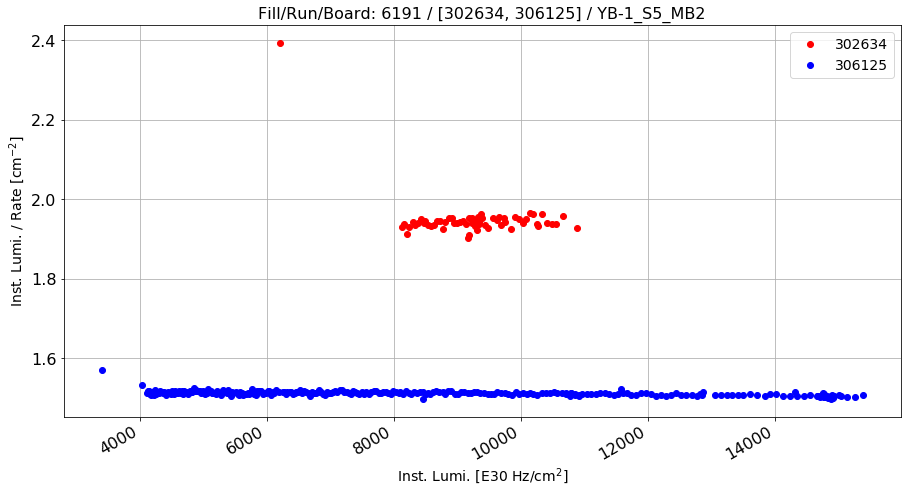

0.288703738163


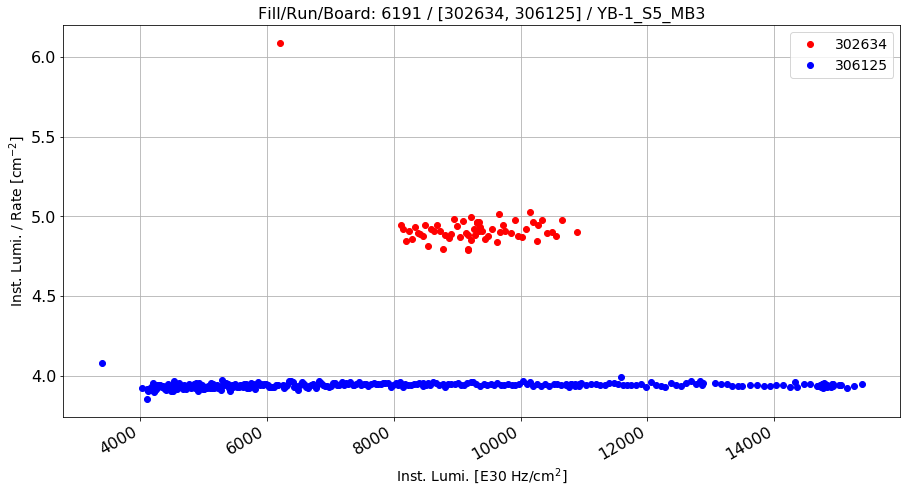

0.250369004152


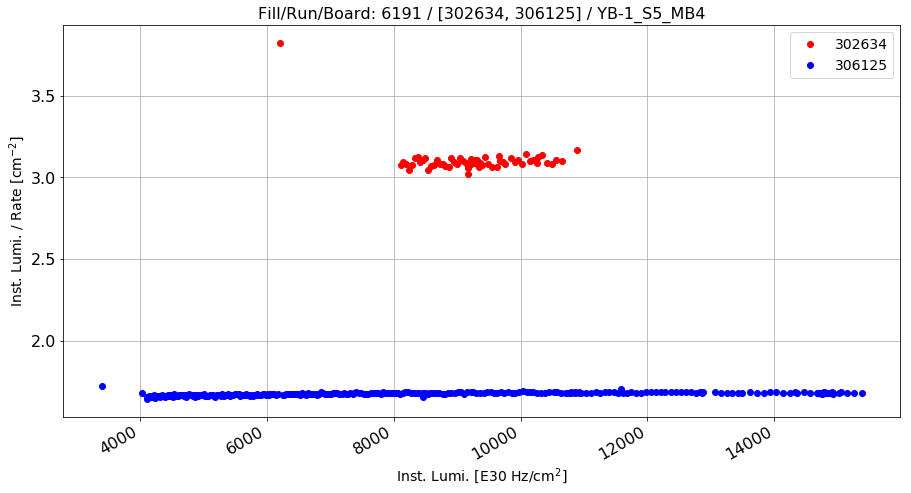

0.854857572654


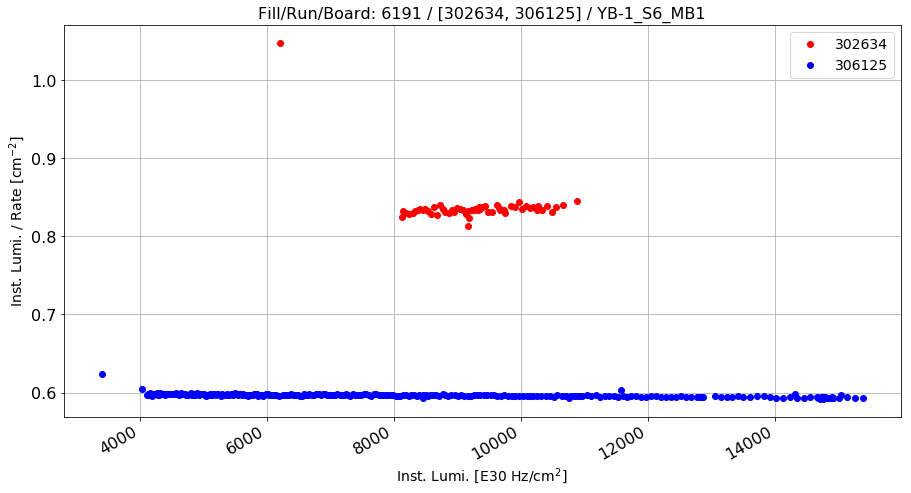

0.404349774885


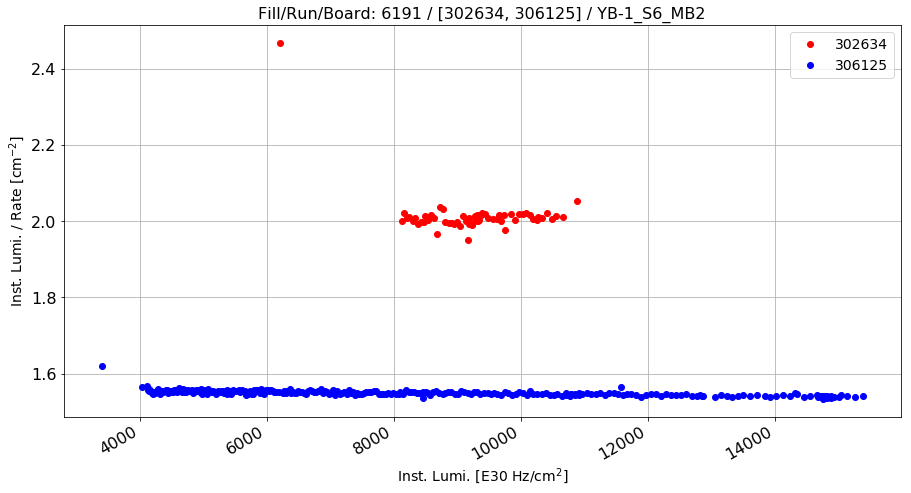

0.300072909836


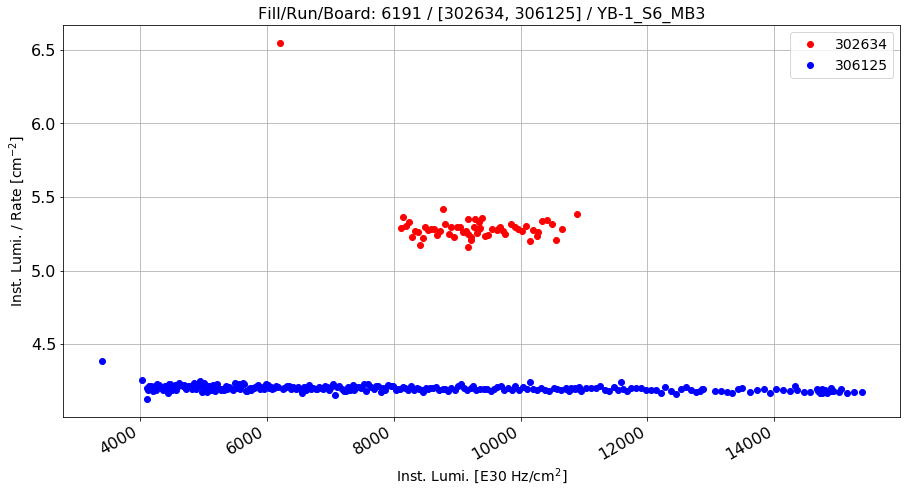

0.26191416829


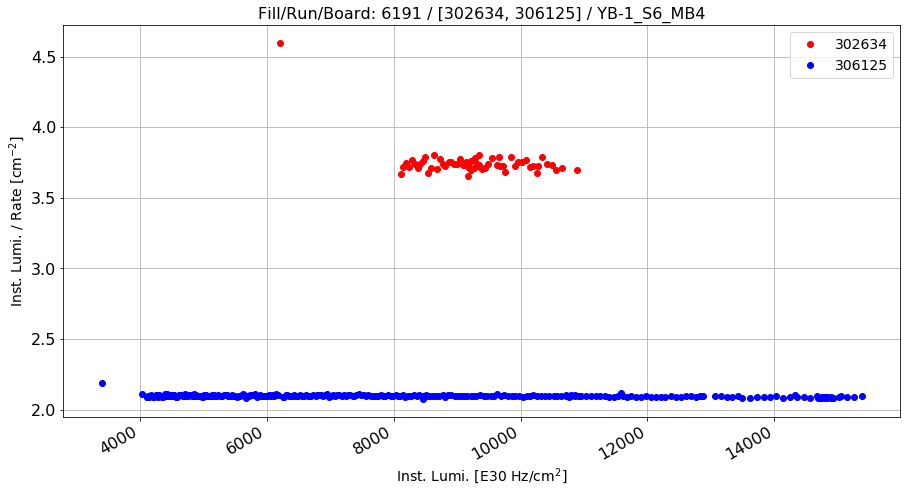

0.787657168061


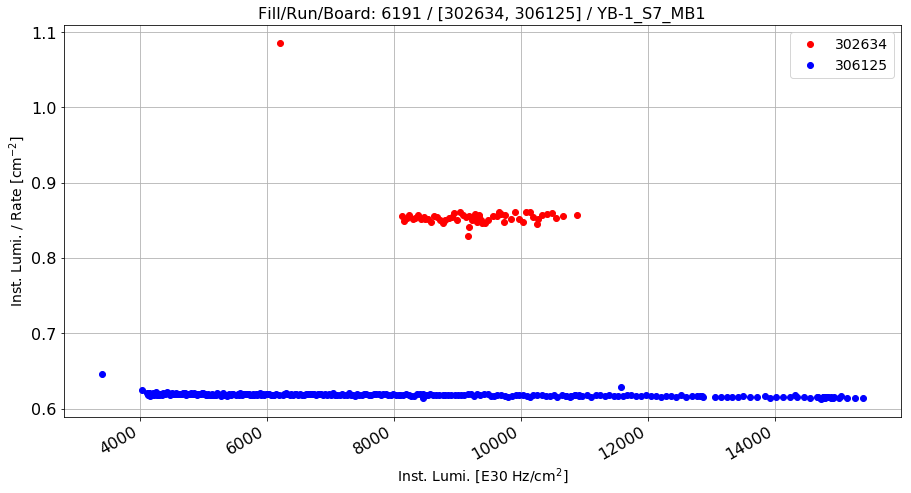

0.386802336101


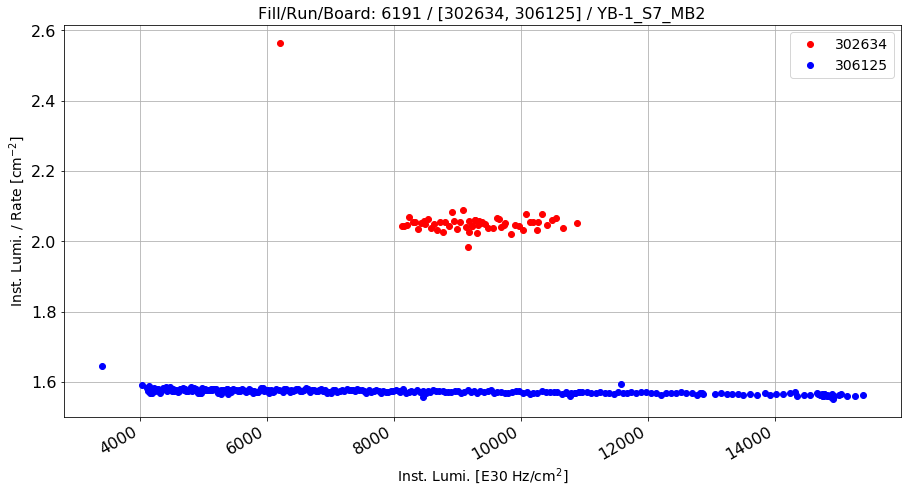

0.30842470526


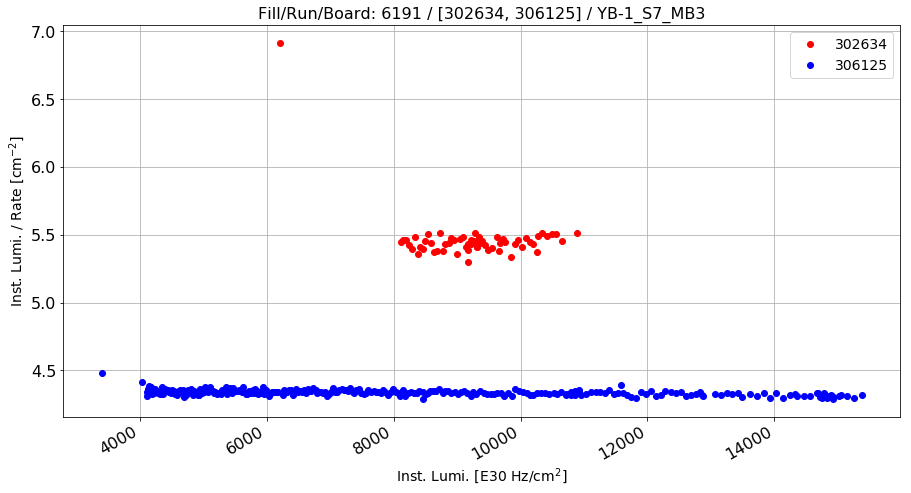

0.259636330968


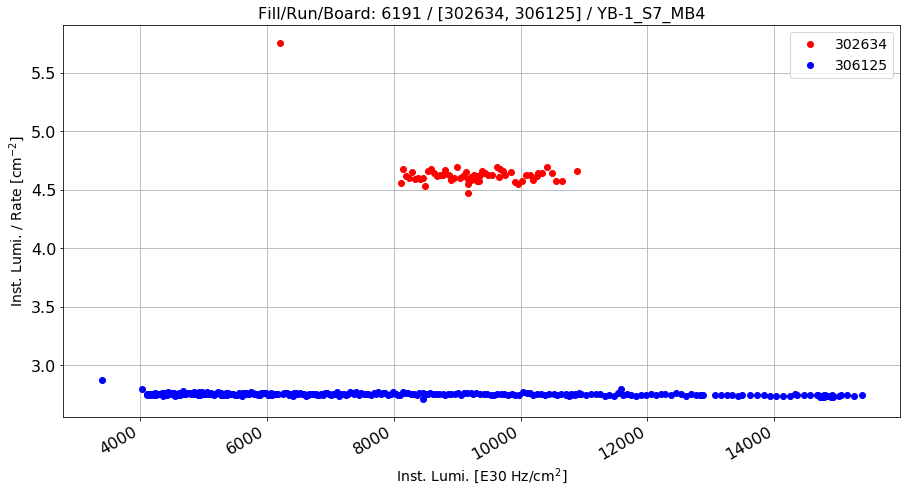

0.684354238918


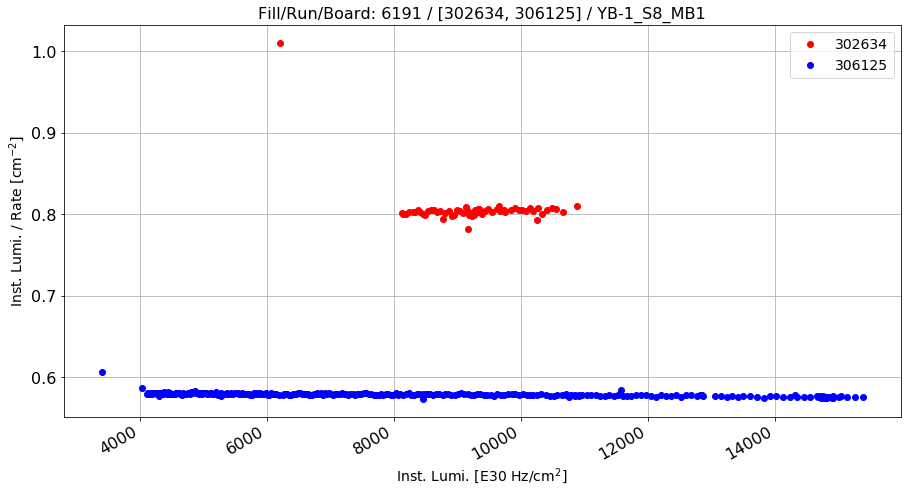

0.393219134792


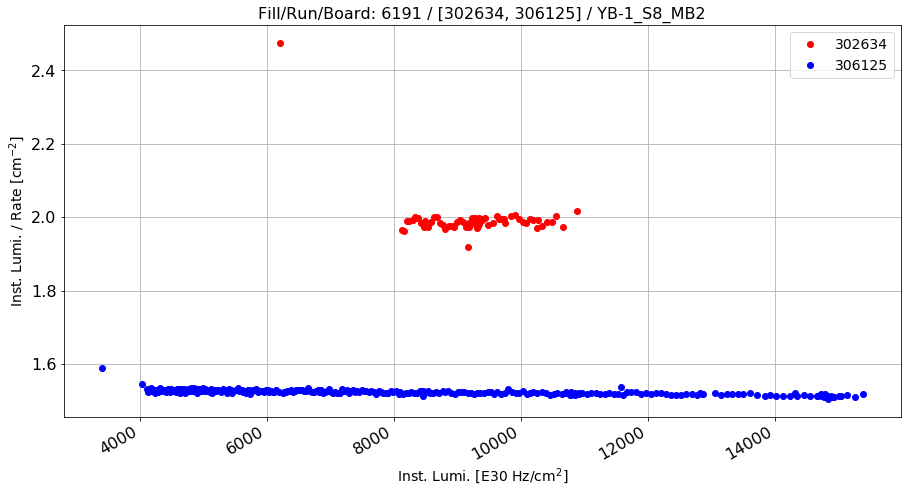

0.30889138461


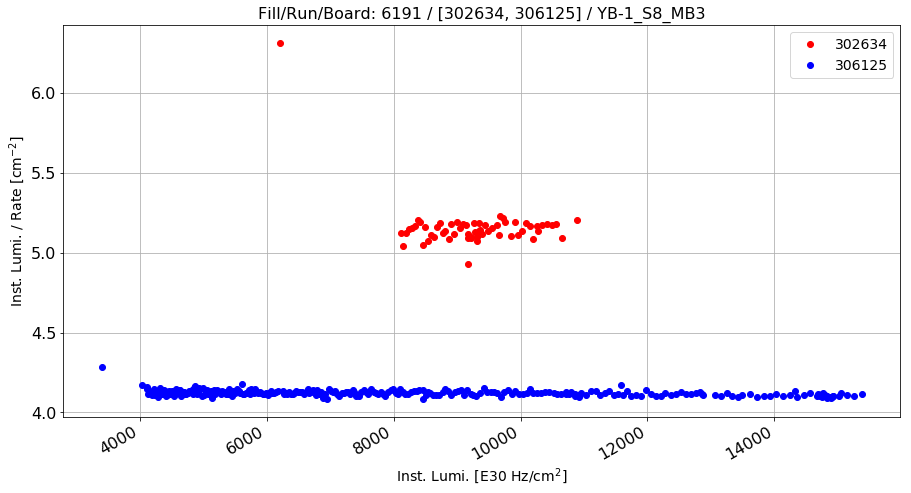

0.25150714455


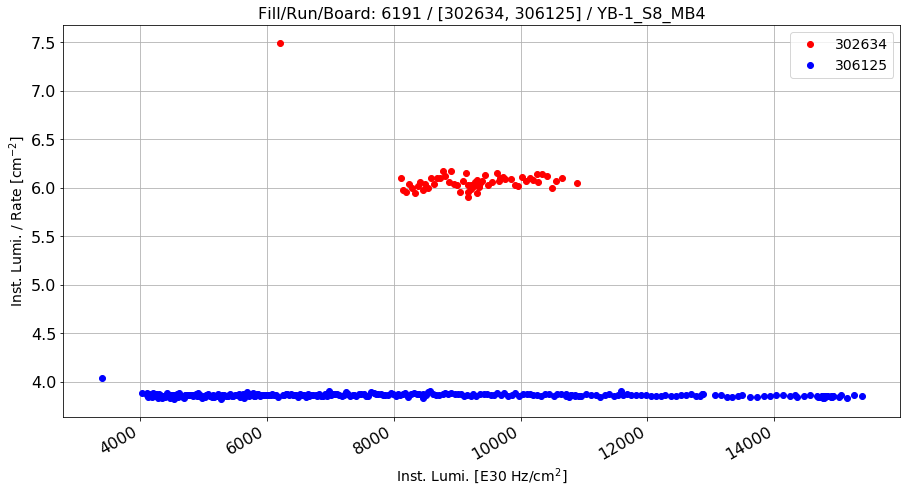

0.573410624778


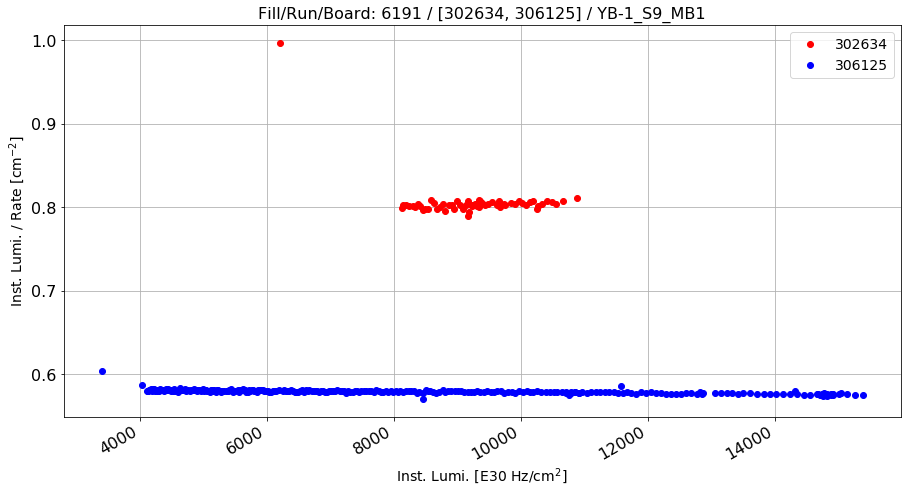

0.390903042823


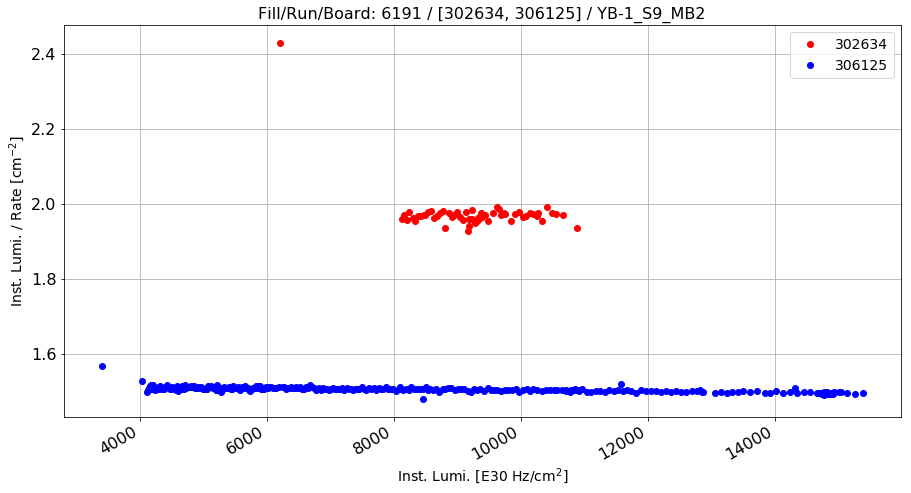

0.311111229901


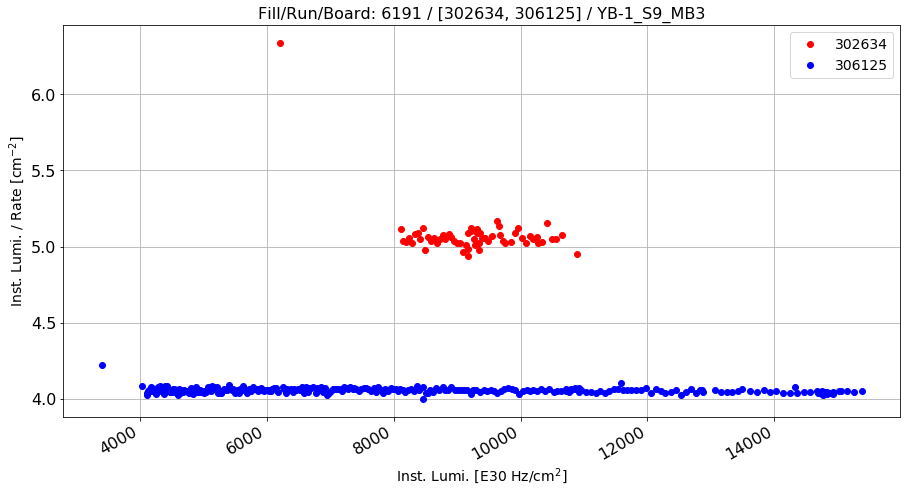

0.251455429158


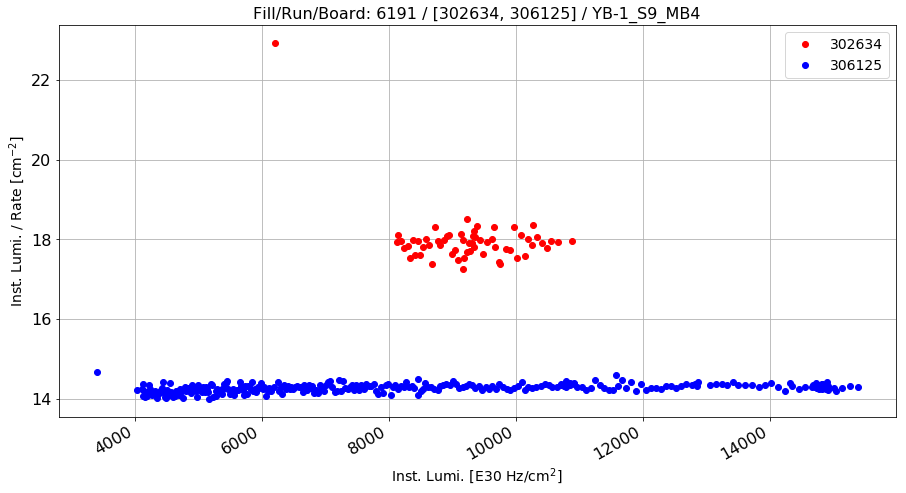

0.259031703771


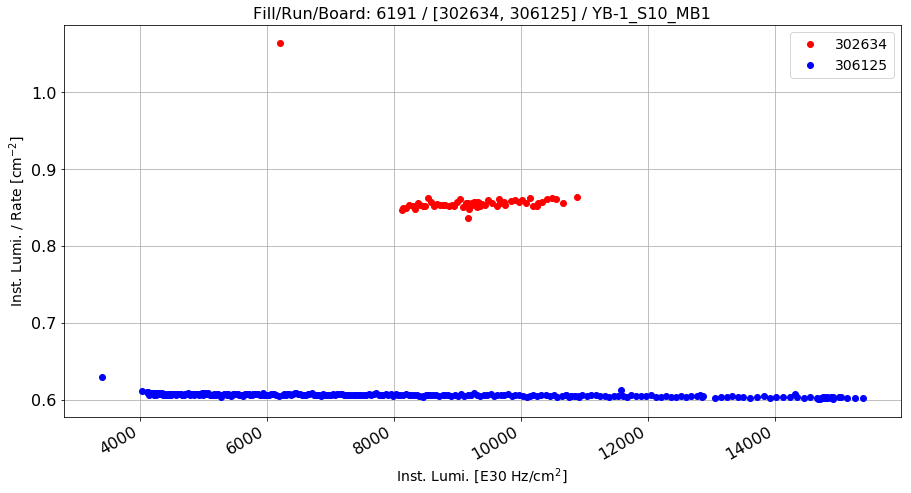

0.416924351299


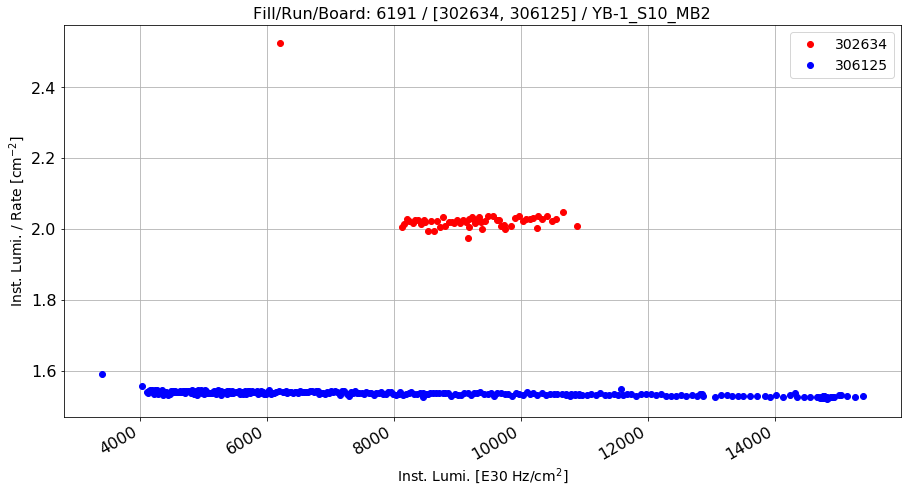

0.320613094663


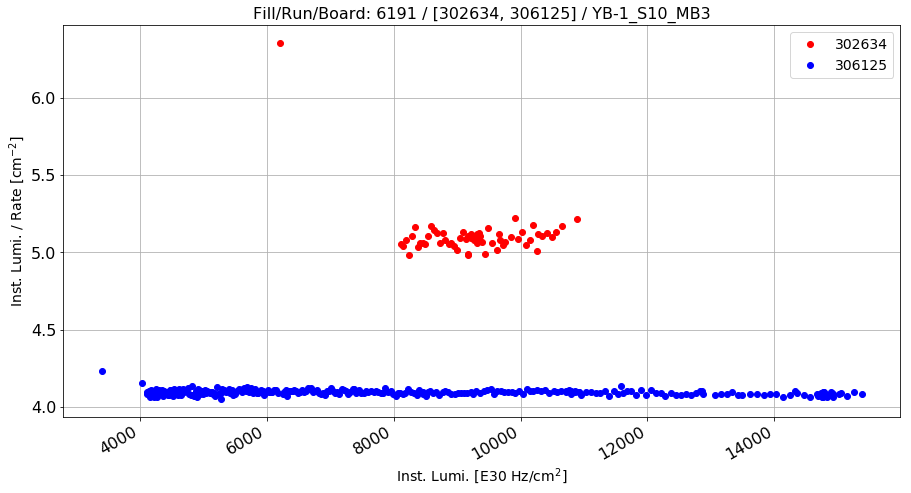

0.248104319121


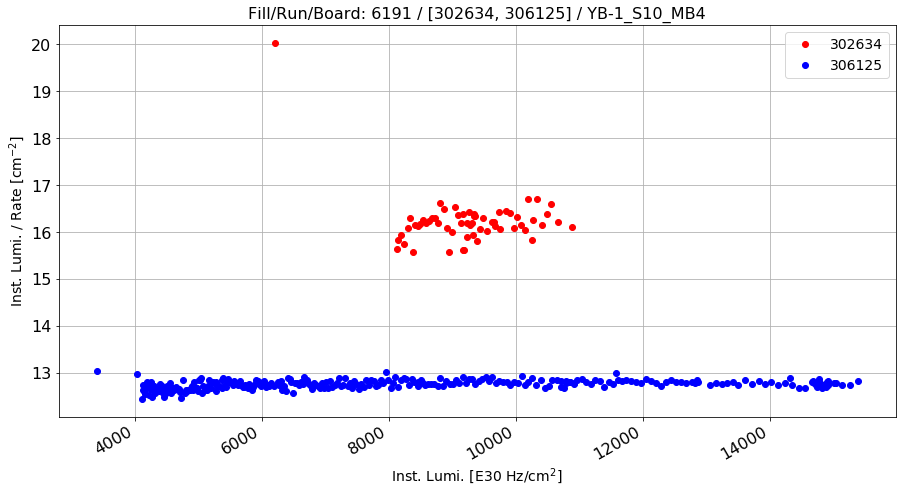

0.271935272624


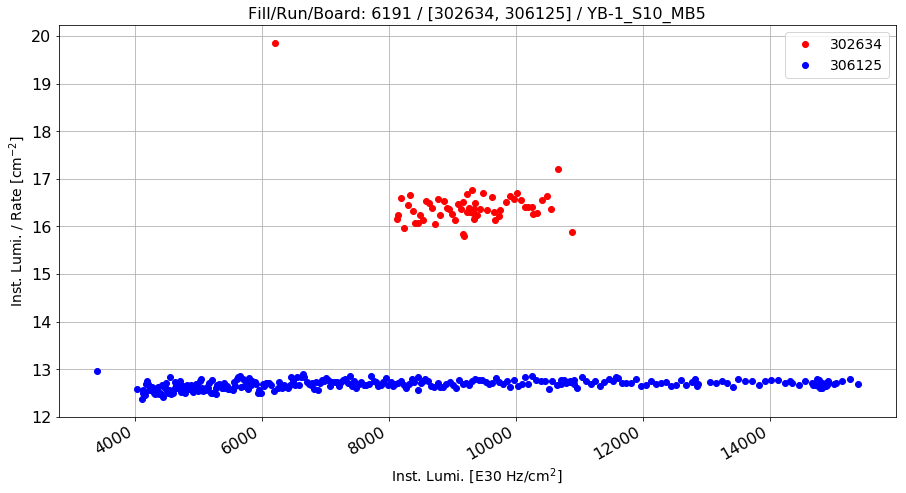

0.295156639561


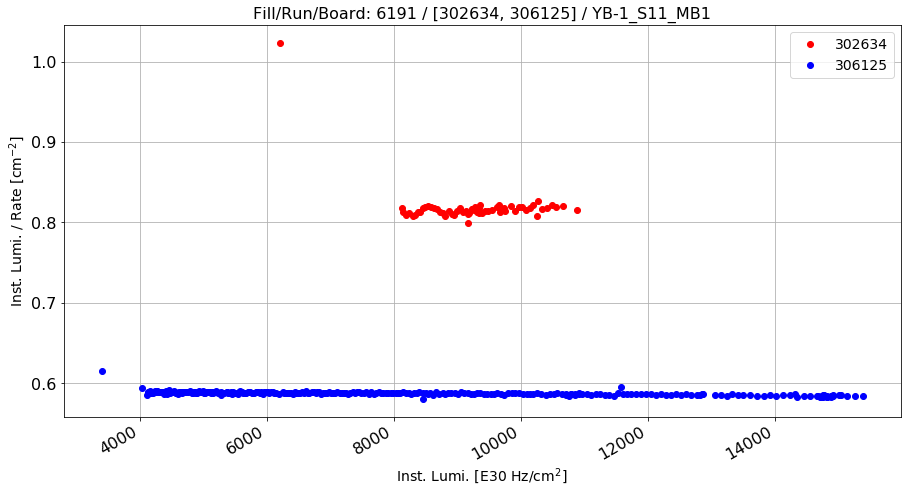

0.393758942353


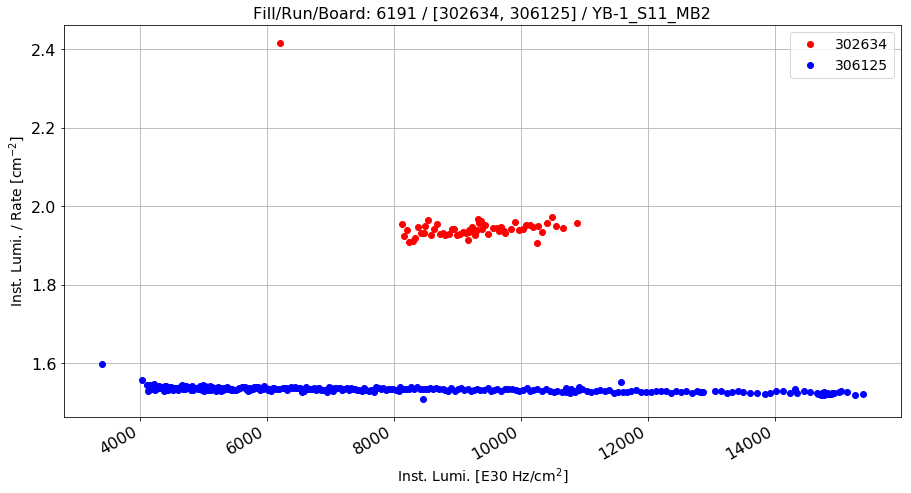

0.270899434284


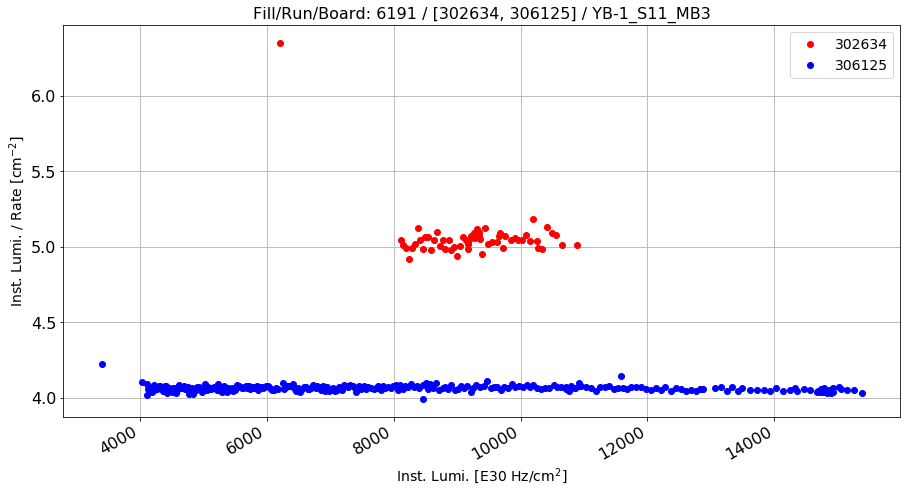

0.245307891127


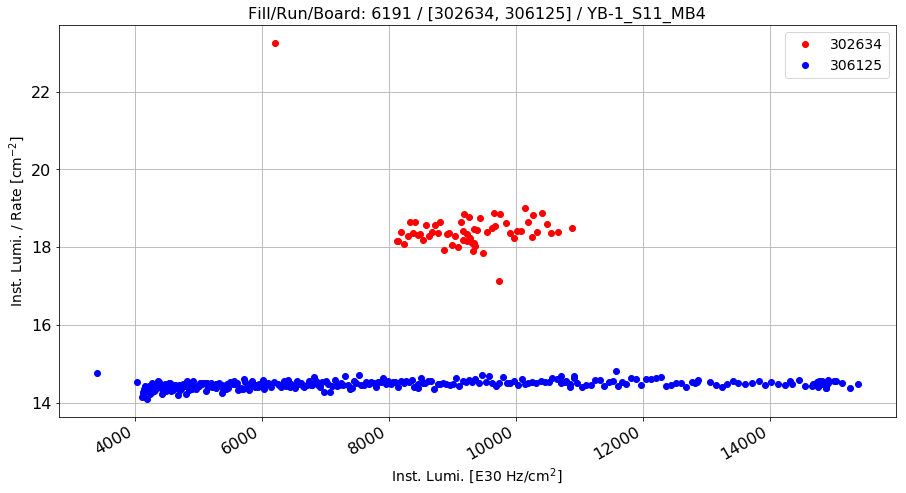

0.275449472797


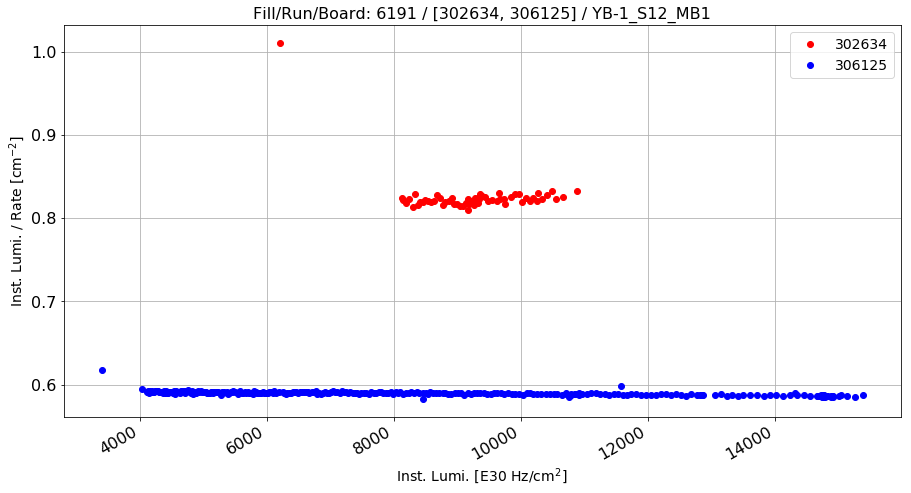

0.398938029136


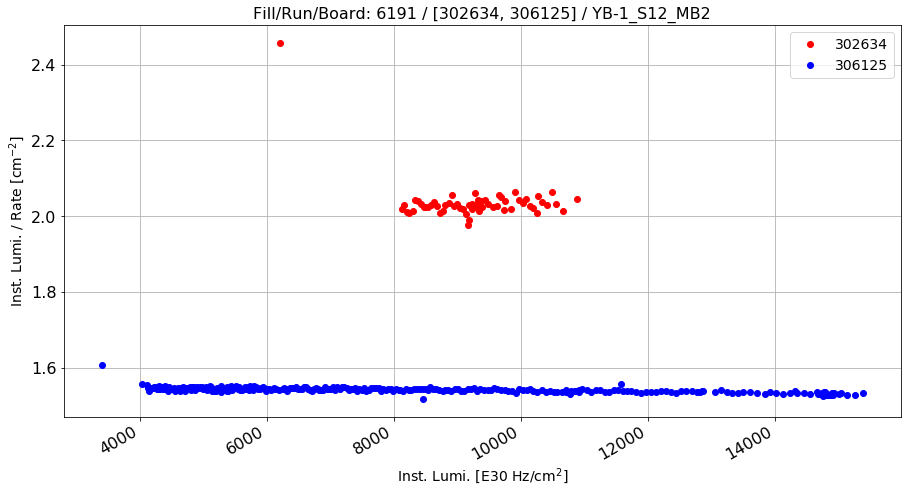

0.320207939327


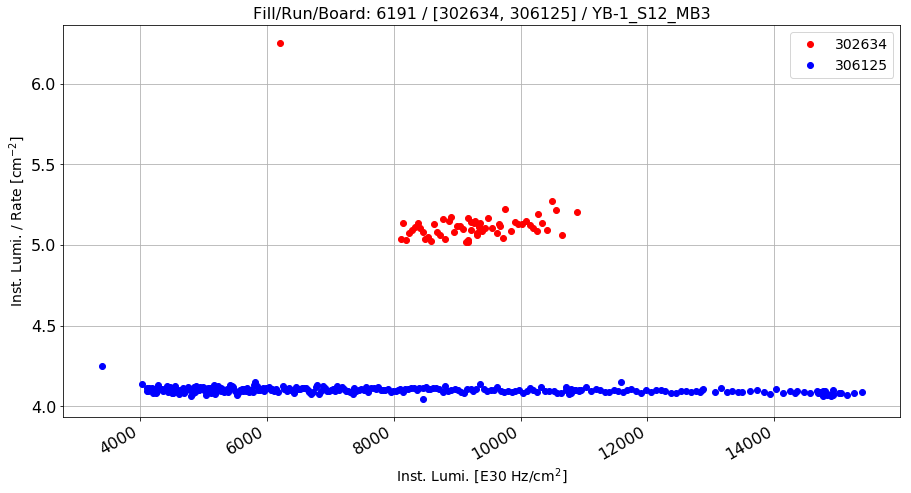

0.250901497165


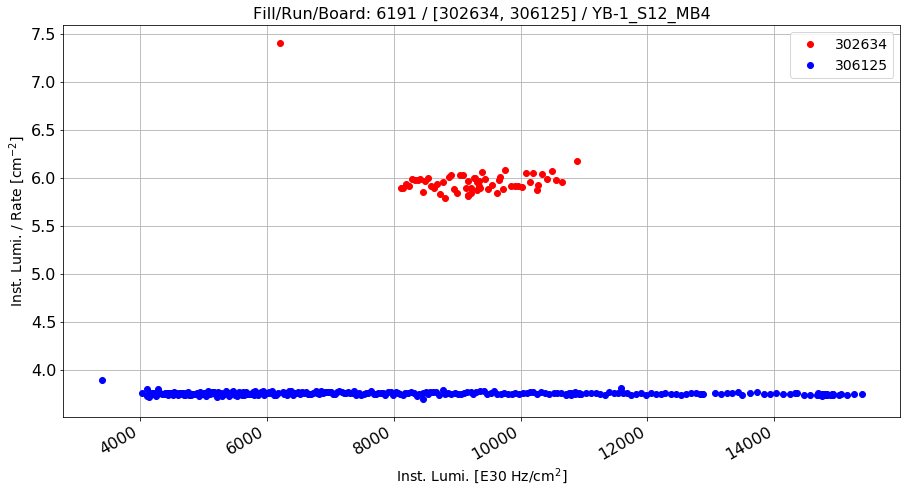

0.589766927279


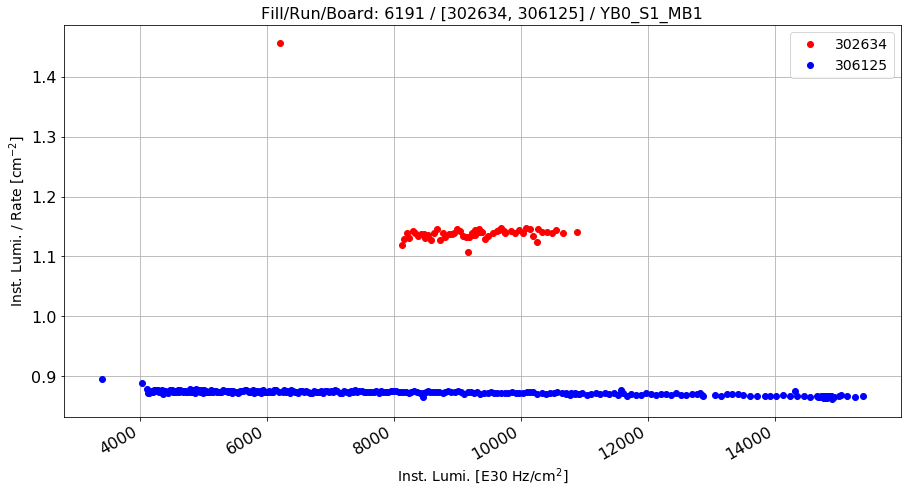

0.309175337895


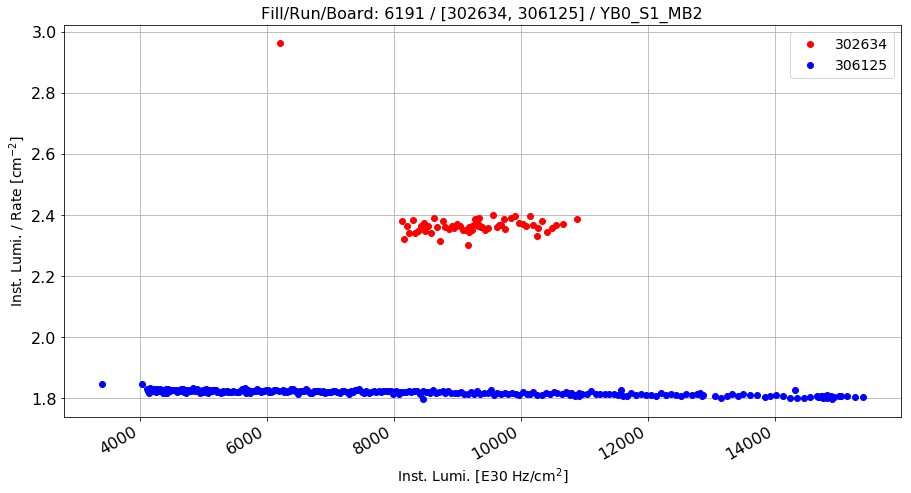

0.304701889737


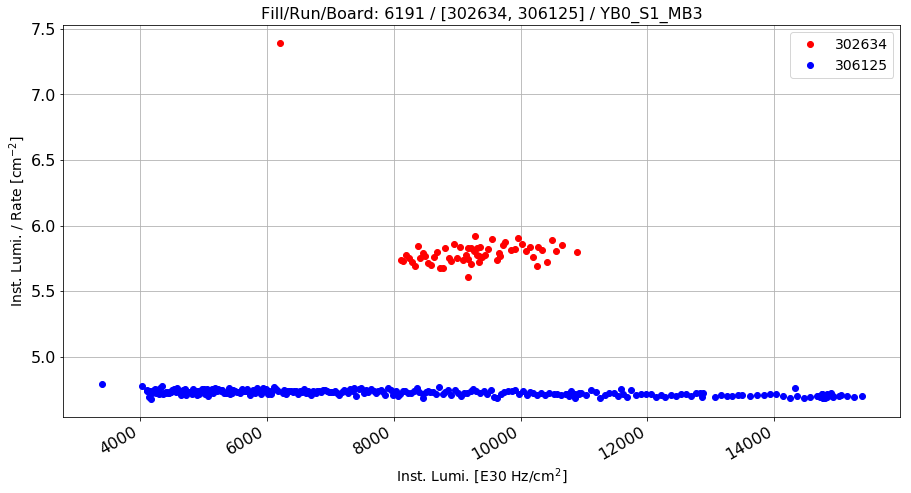

0.229185389746


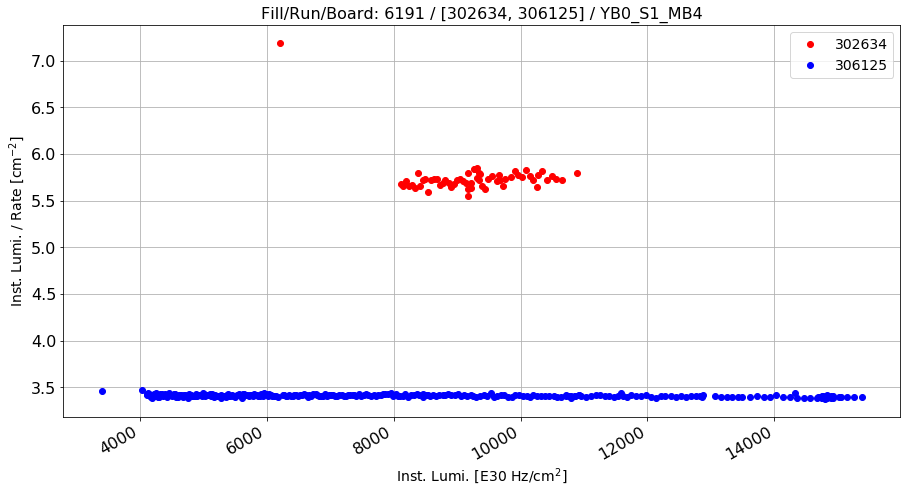

0.684894301773


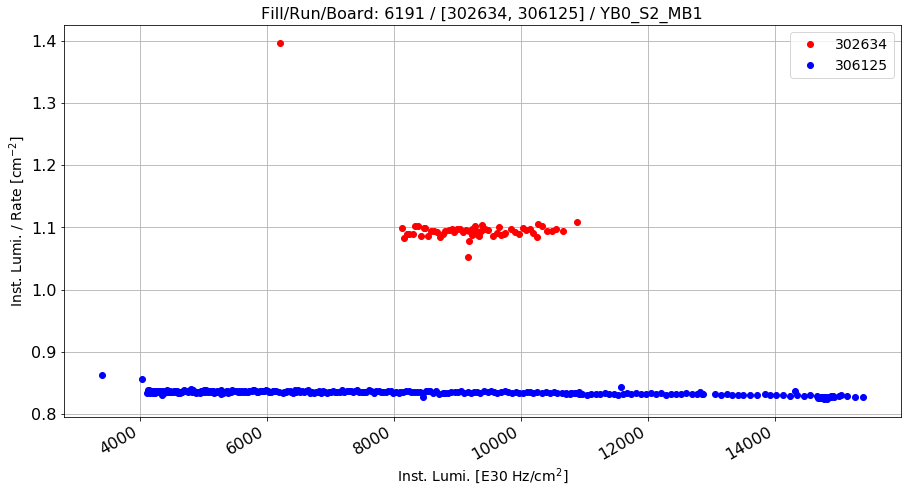

0.315549828456


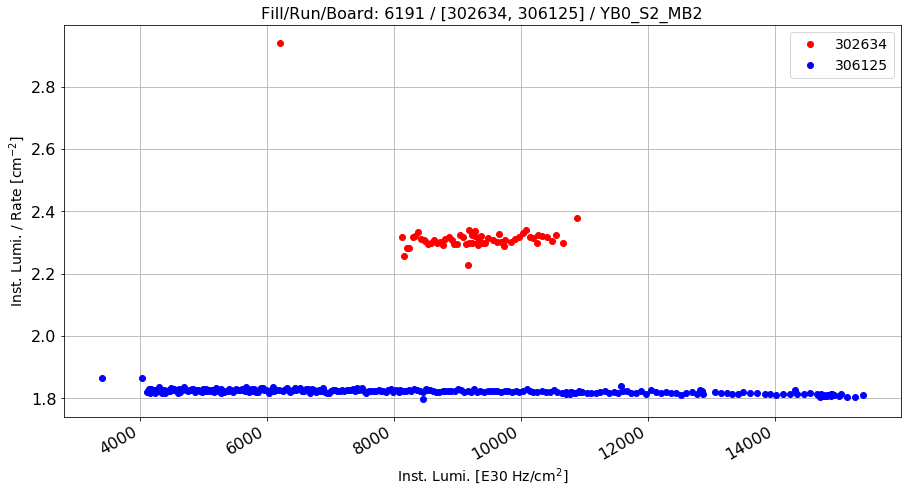

0.272002554751


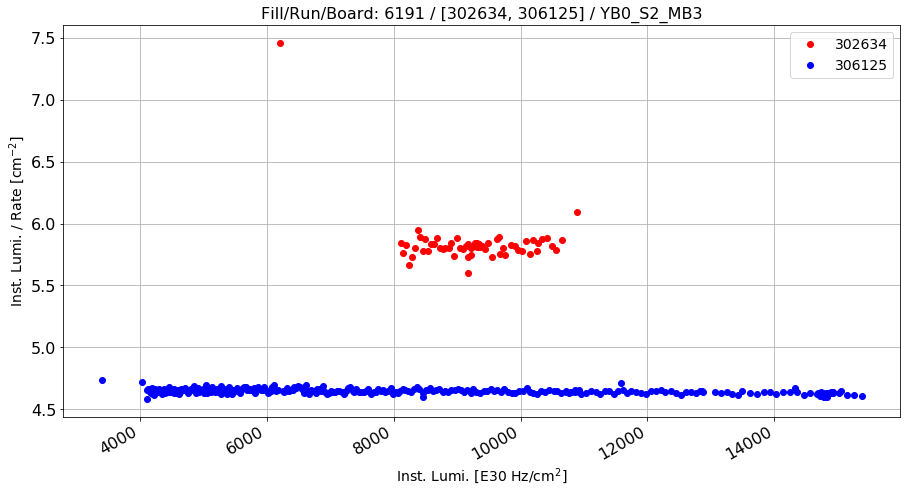

0.257152647257


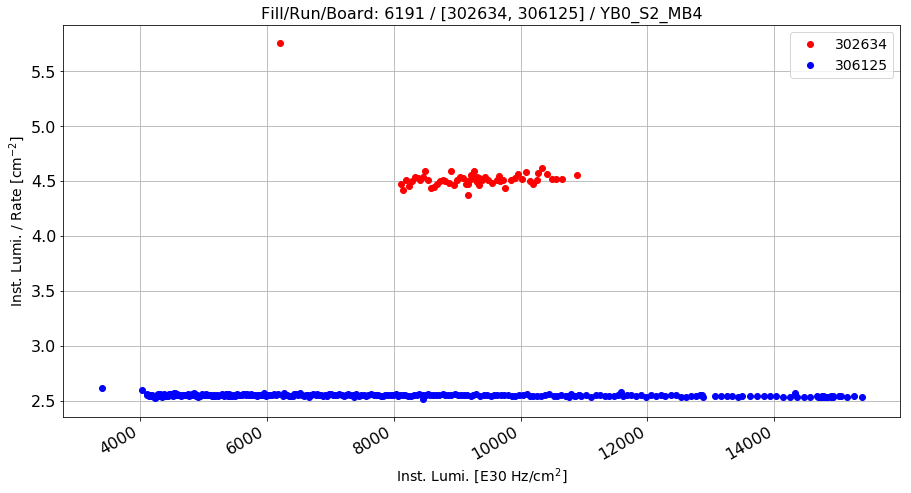

0.776737974689


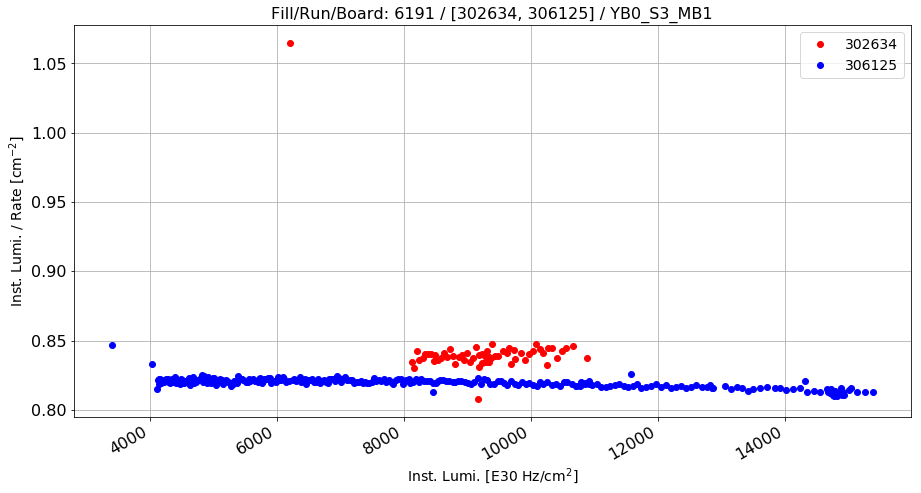

0.027964055512


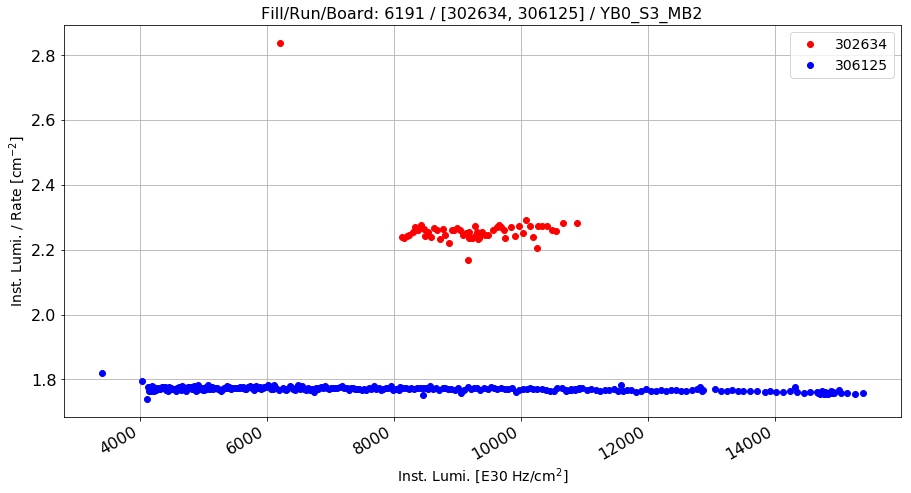

0.278386102283


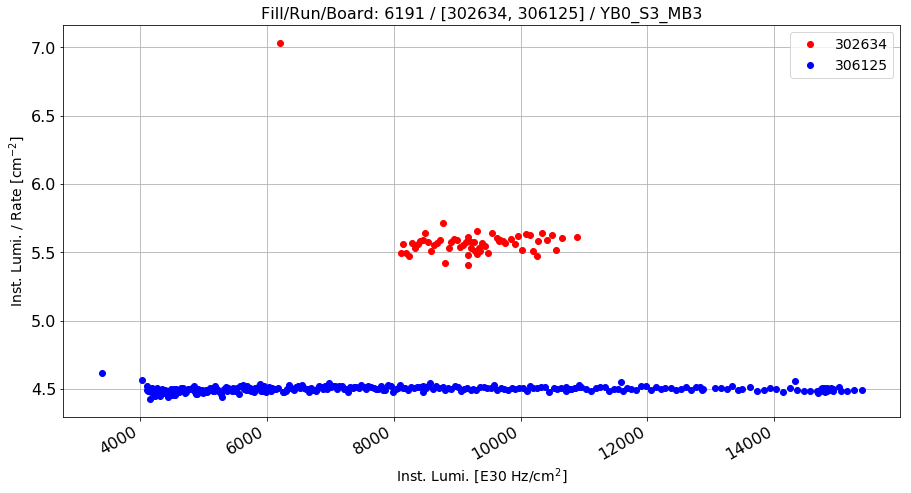

0.241009087565


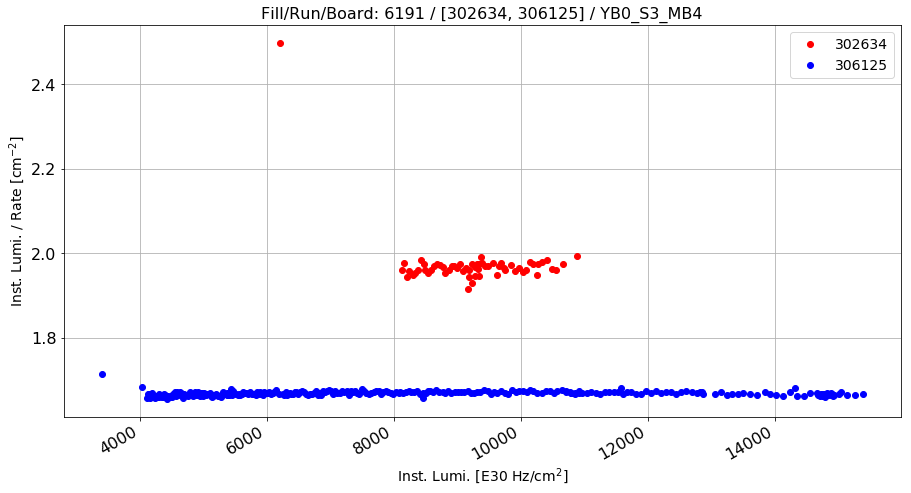

0.182476817763


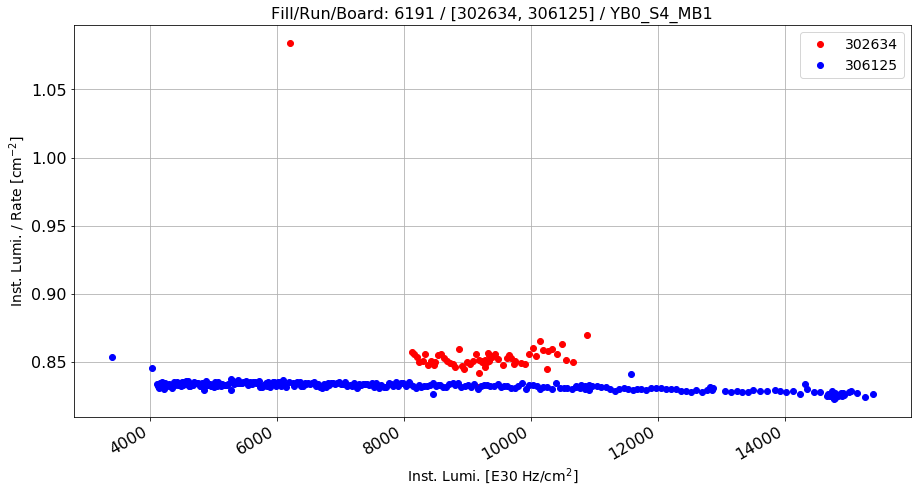

0.0287956839073


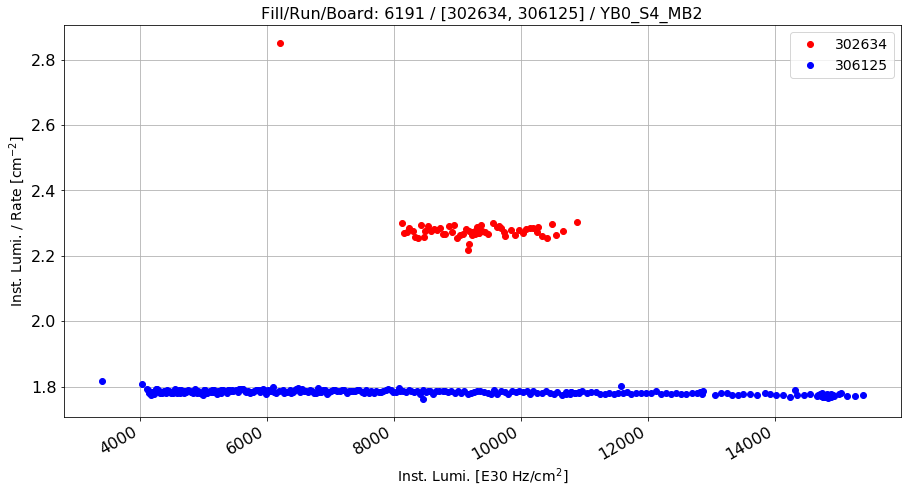

0.280932248701


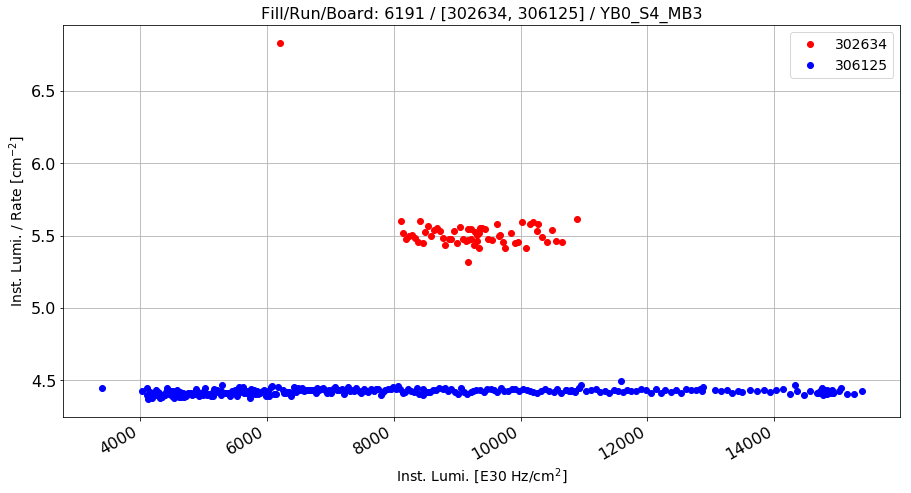

0.249120598944


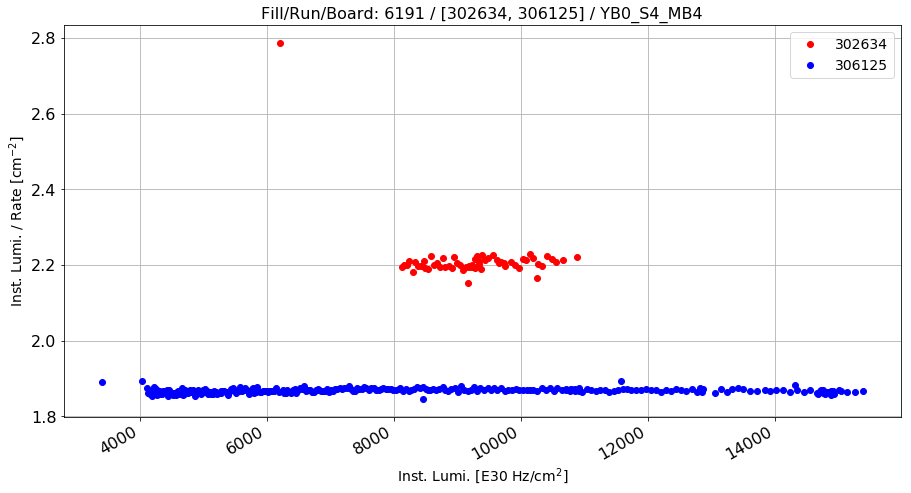

0.184935493074


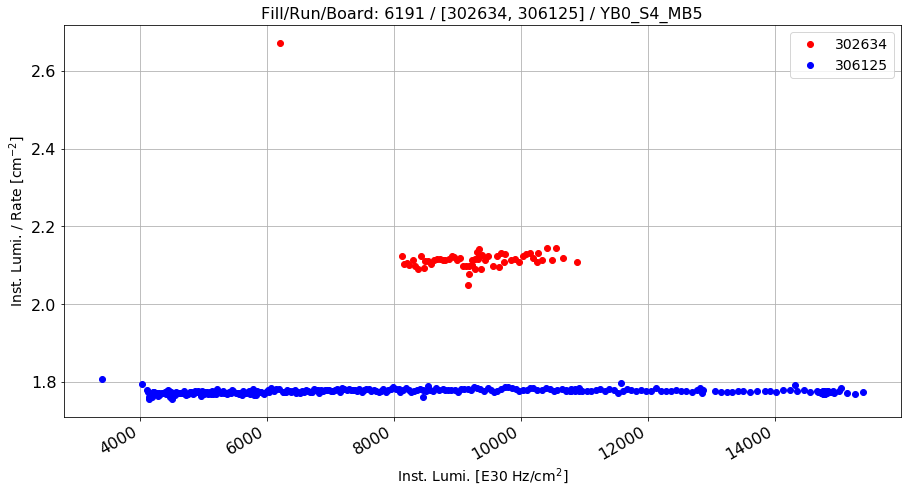

0.19463977007


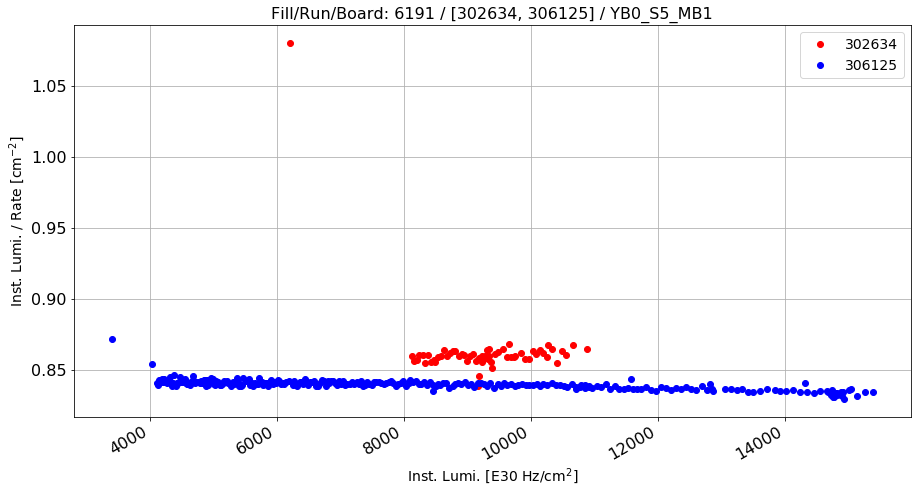

0.0282668979401


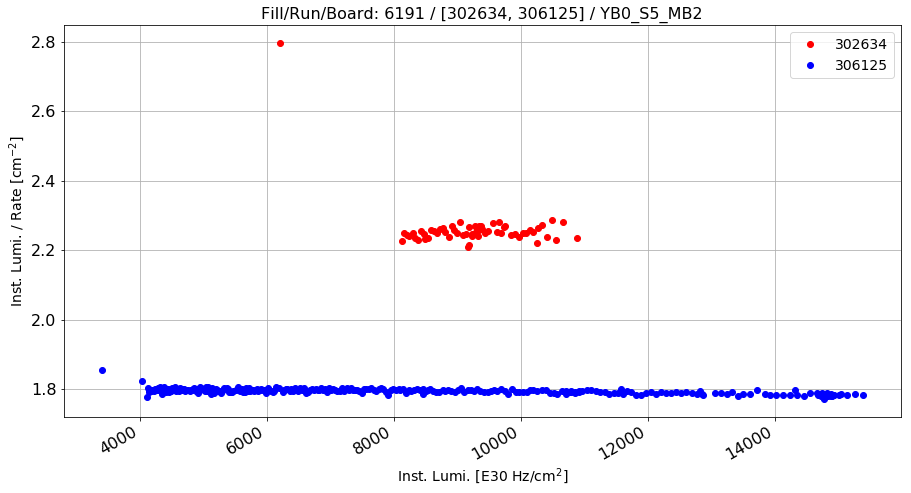

0.259546675826


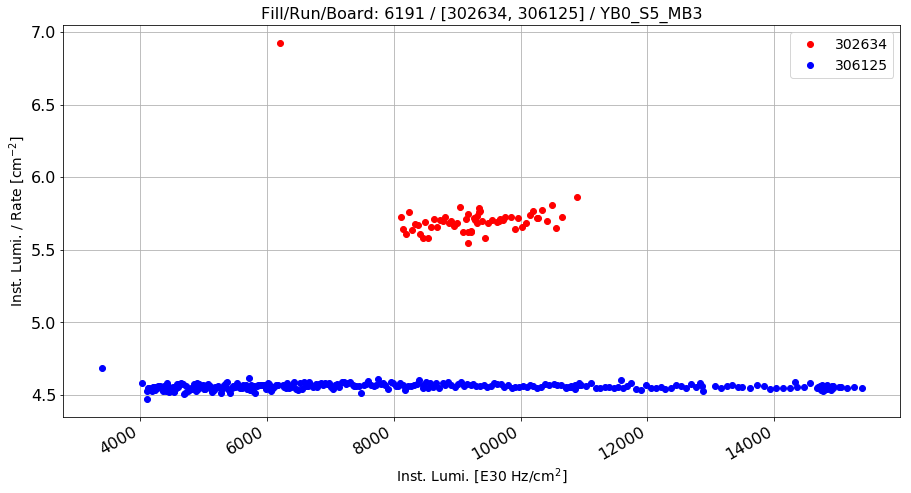

0.253187613408


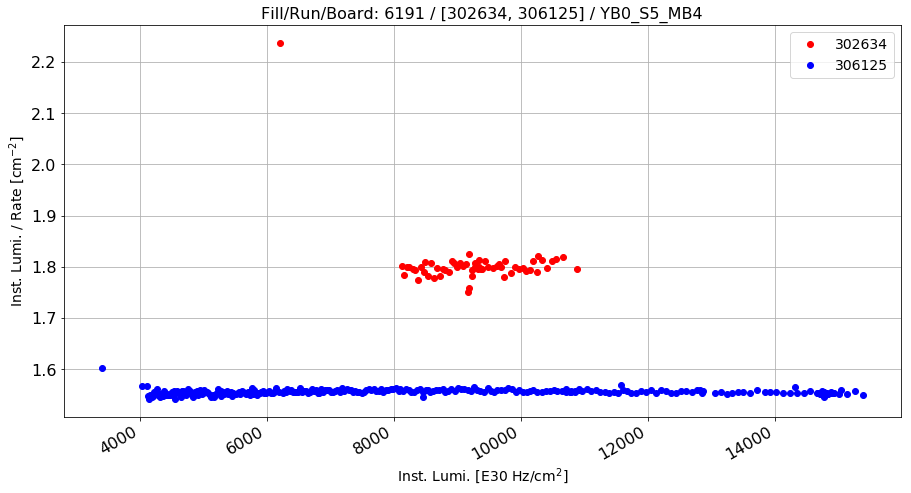

0.160139161409


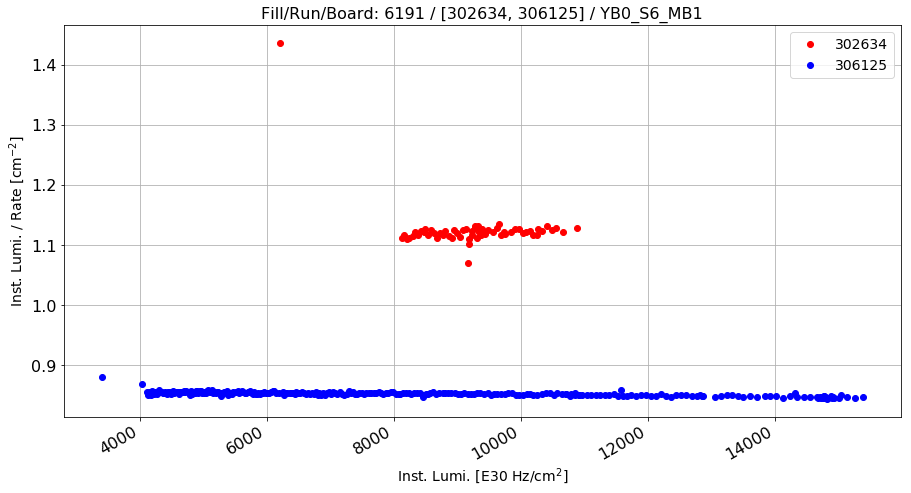

0.320043784503


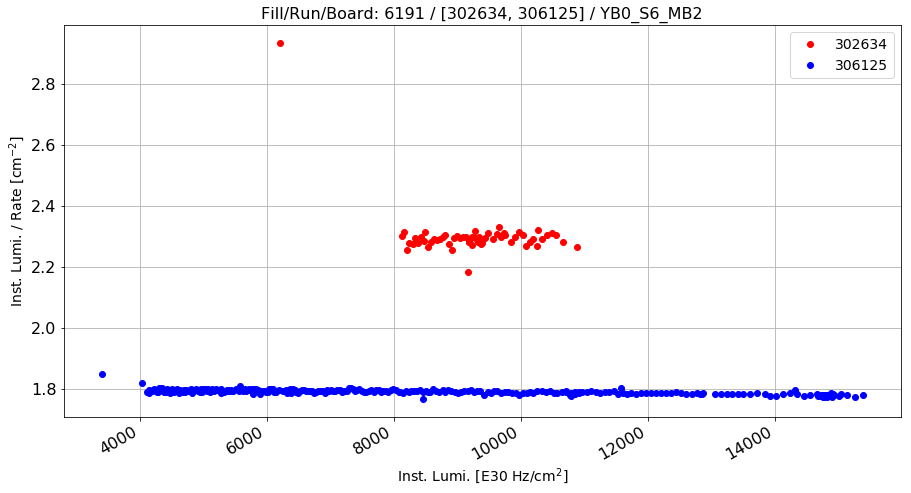

0.284556950598


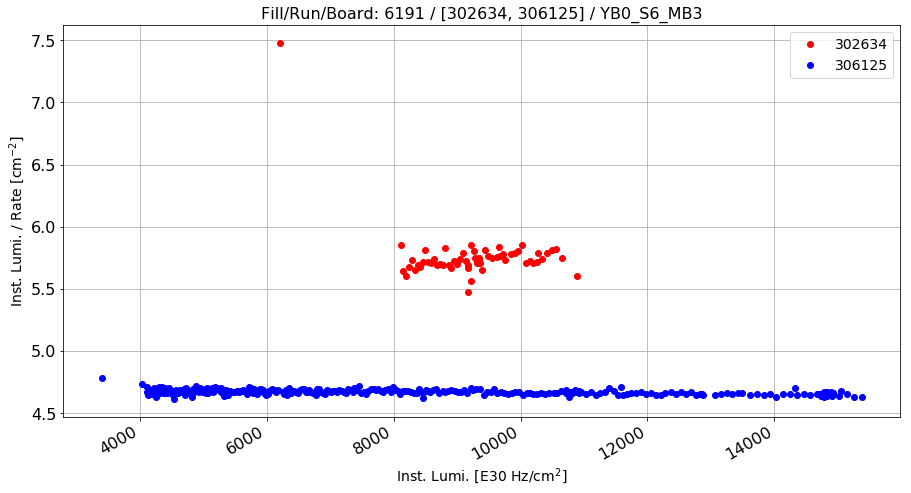

0.232885465488


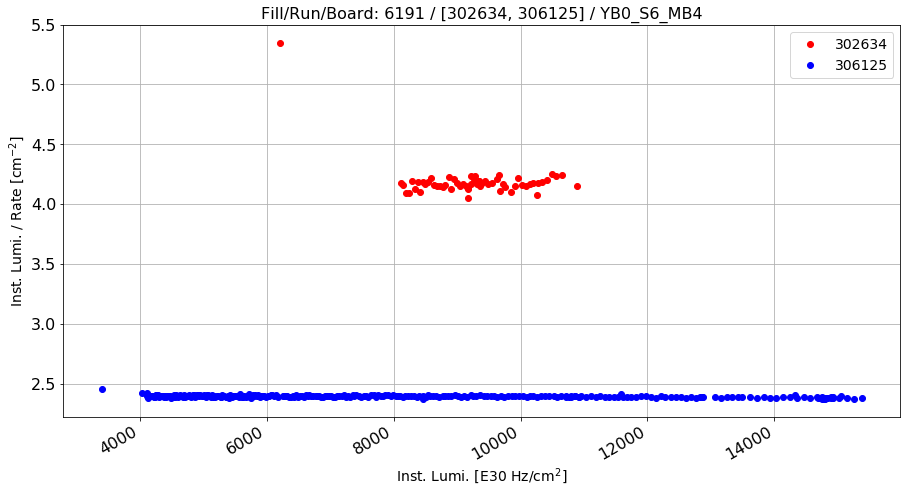

0.749727272157


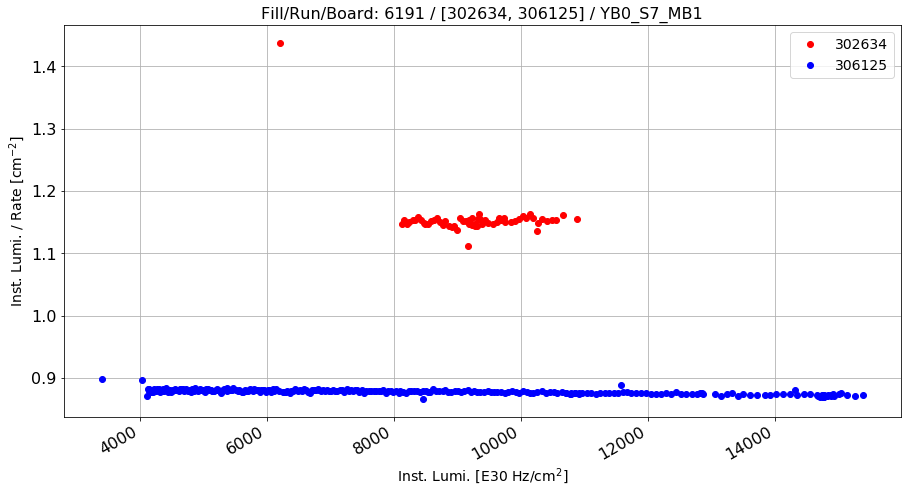

0.315918215617


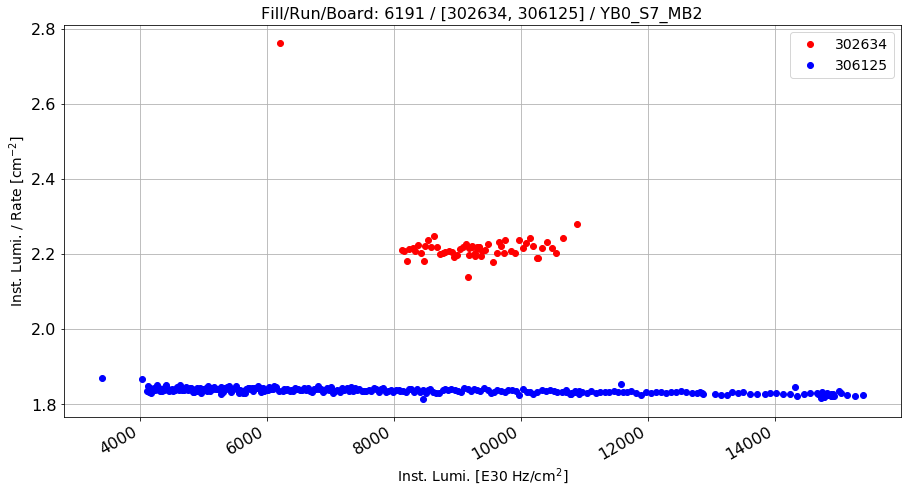

0.210069972792


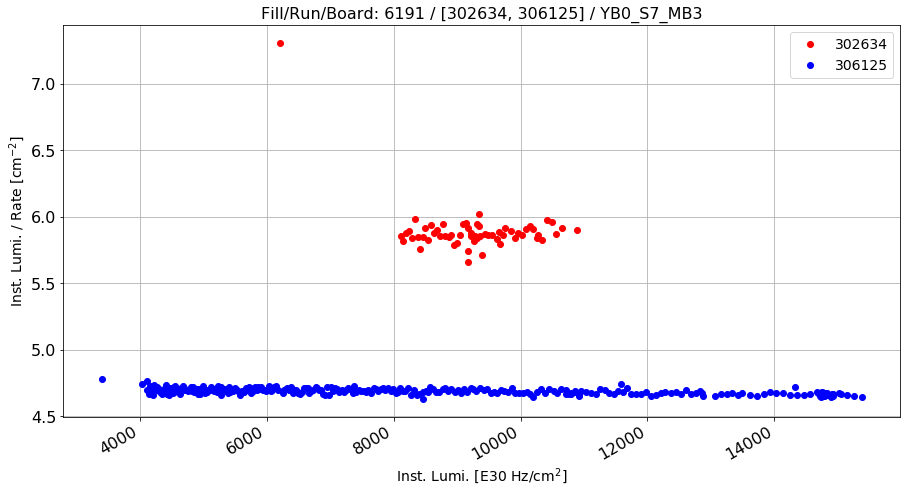

0.256549646819


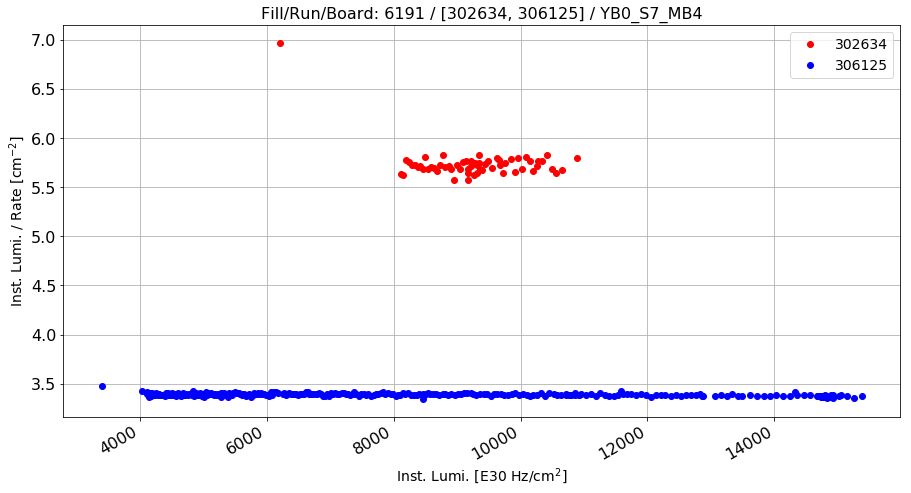

0.693586299541


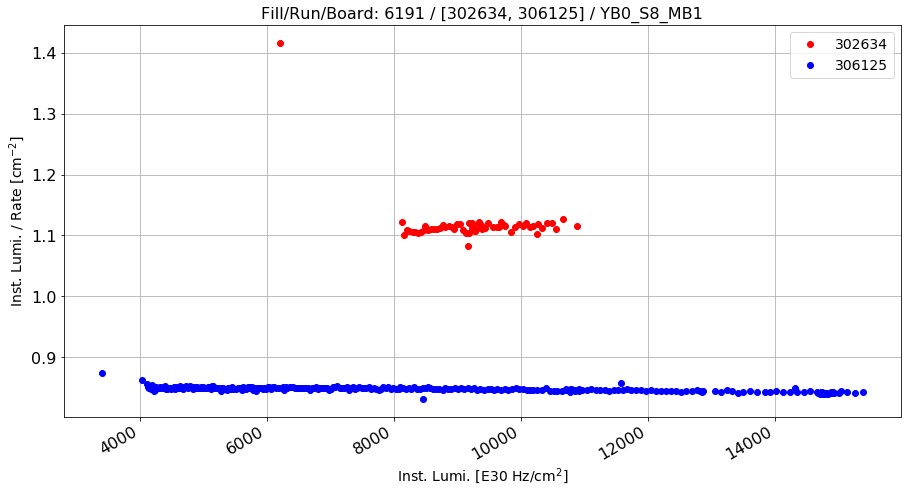

0.318004348242


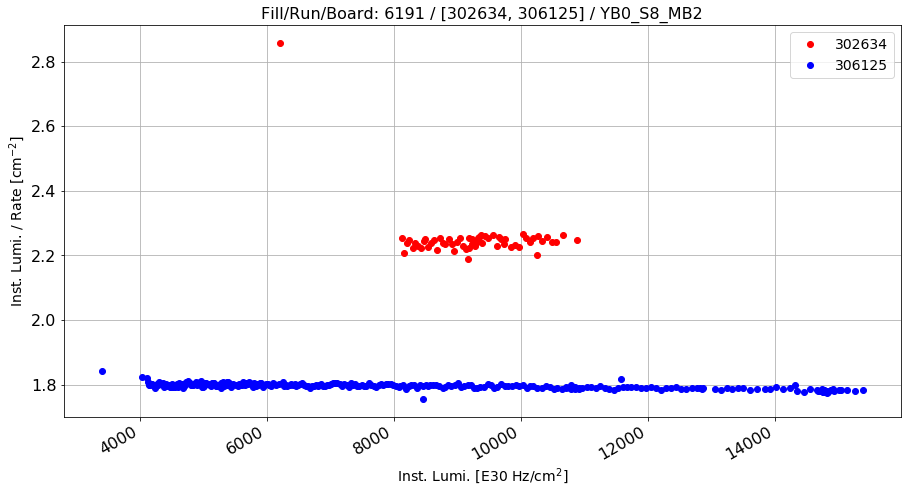

0.253821625843


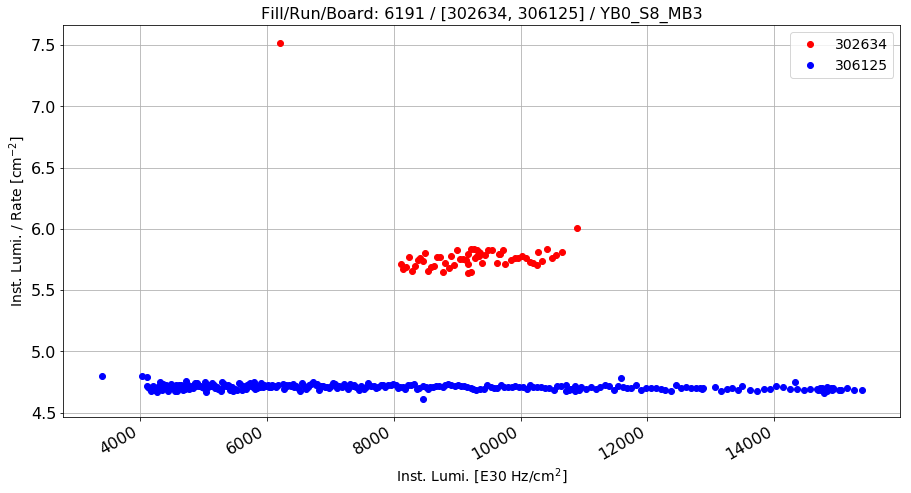

0.229016575369


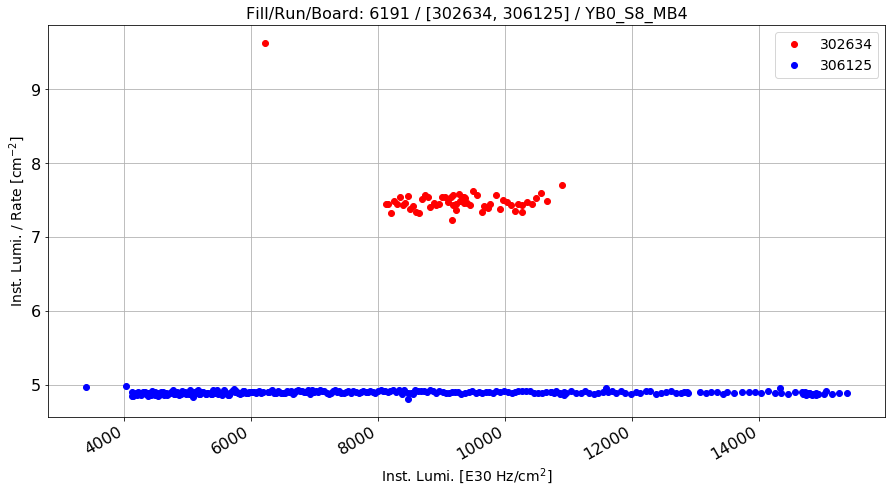

0.533300734815


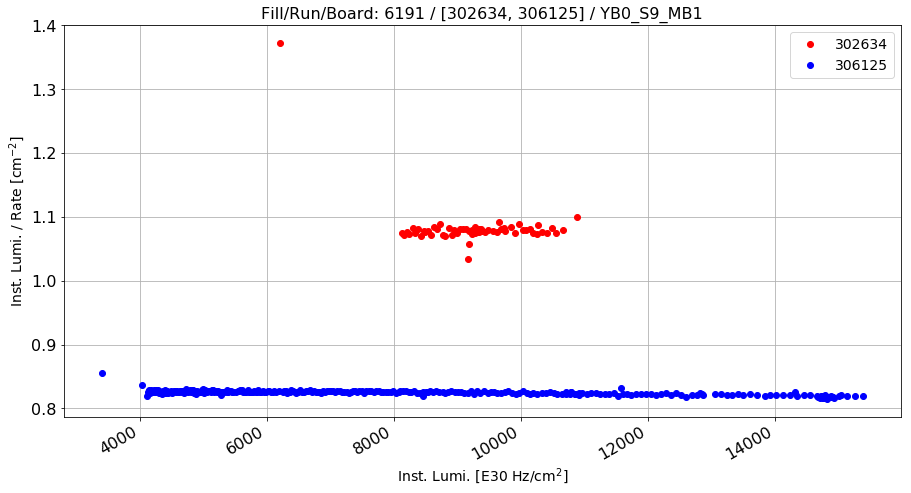

0.312623997569


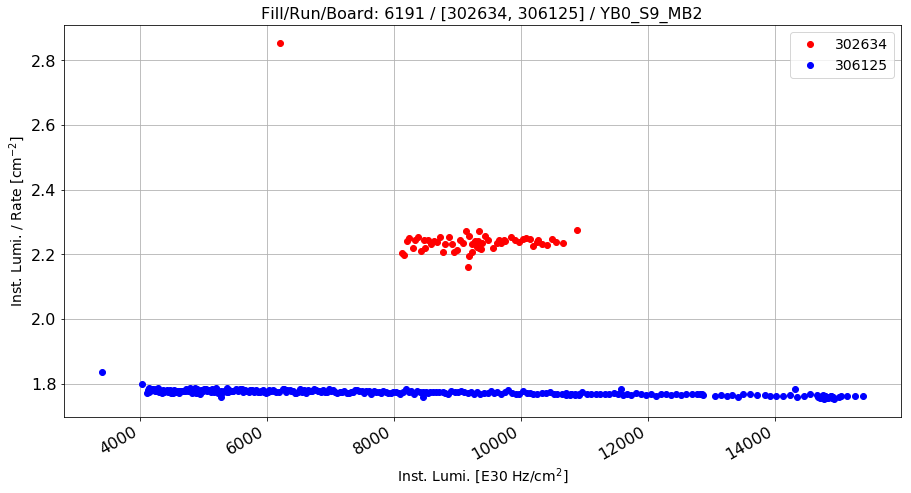

0.266349152355


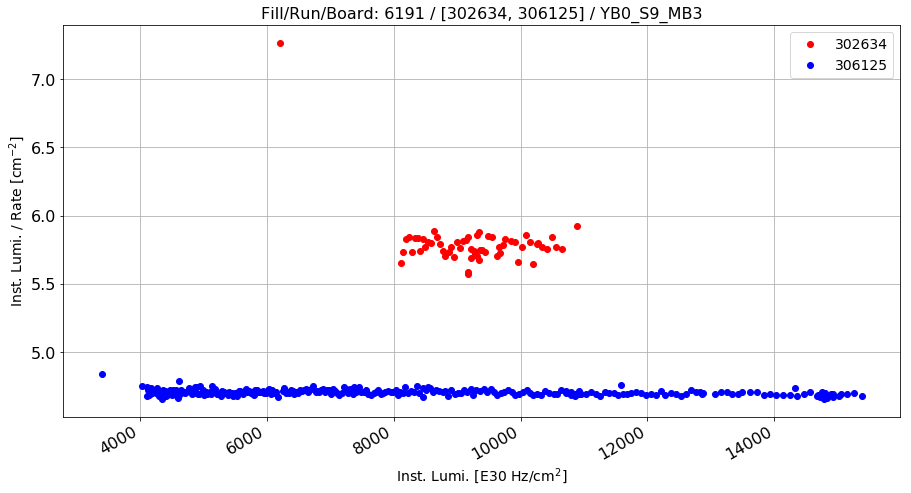

0.231463696714


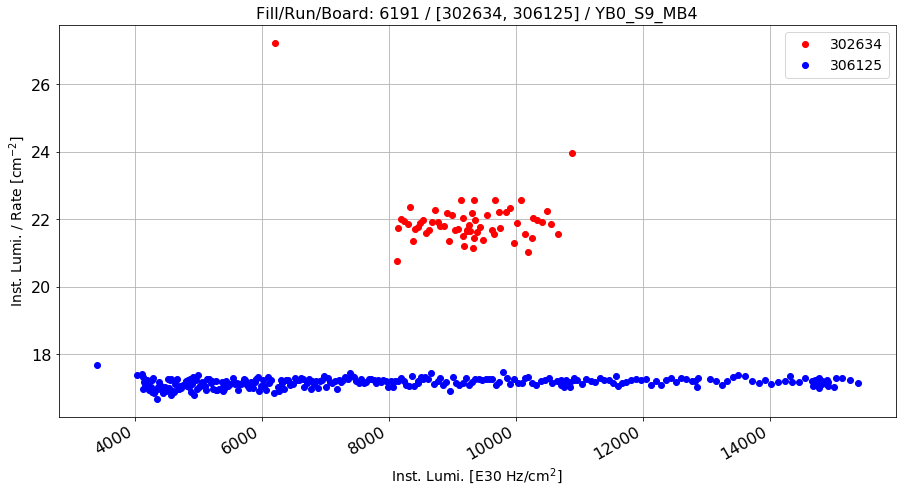

0.278925232993


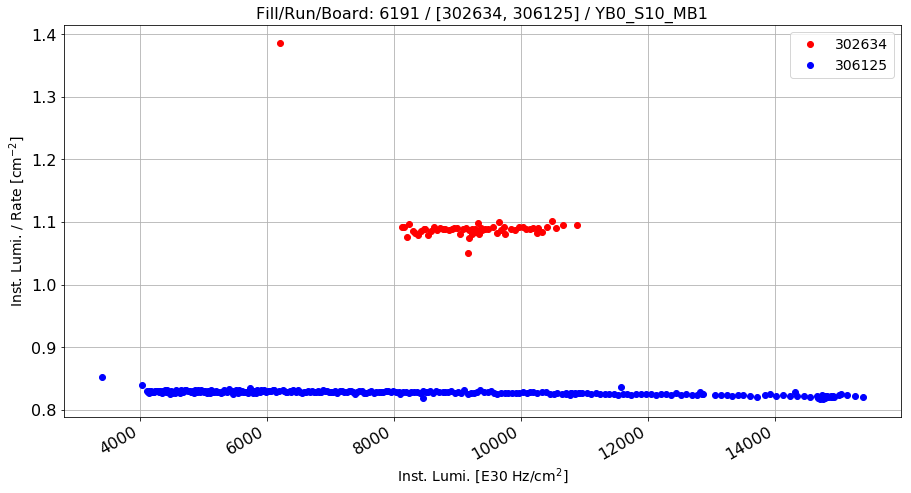

0.319792263175


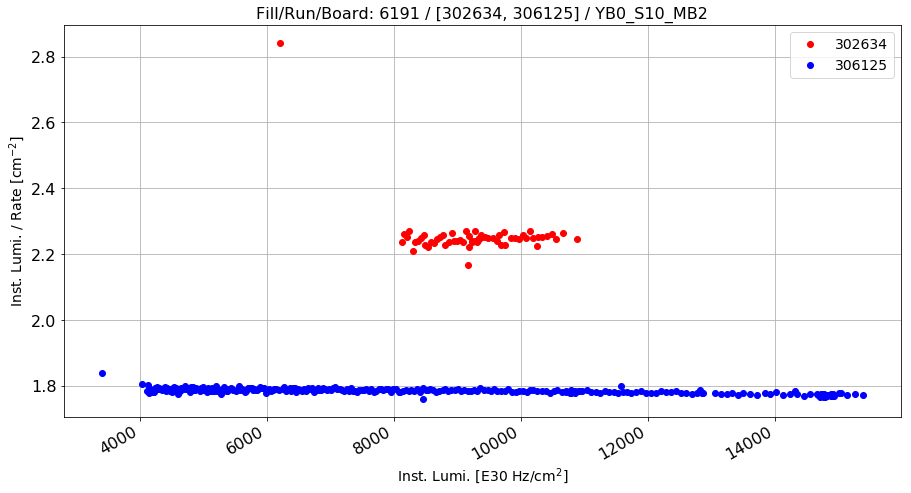

0.262703131705


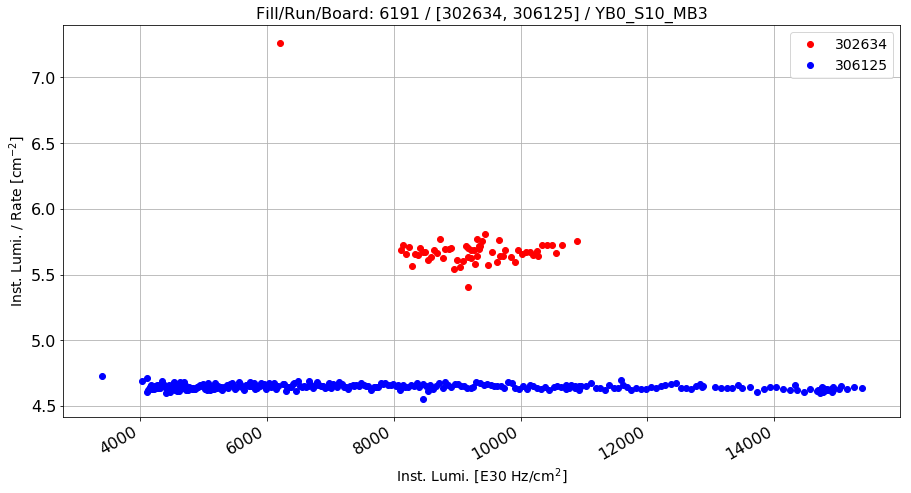

0.225283744993


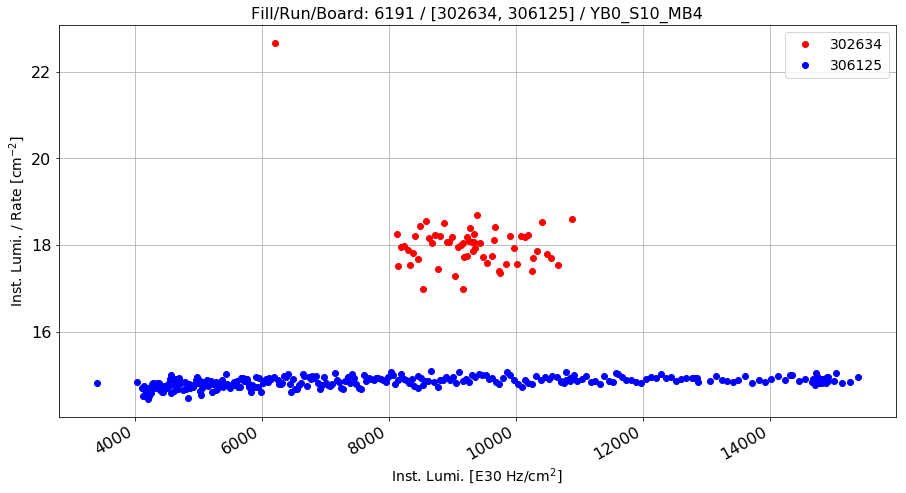

0.214354713825


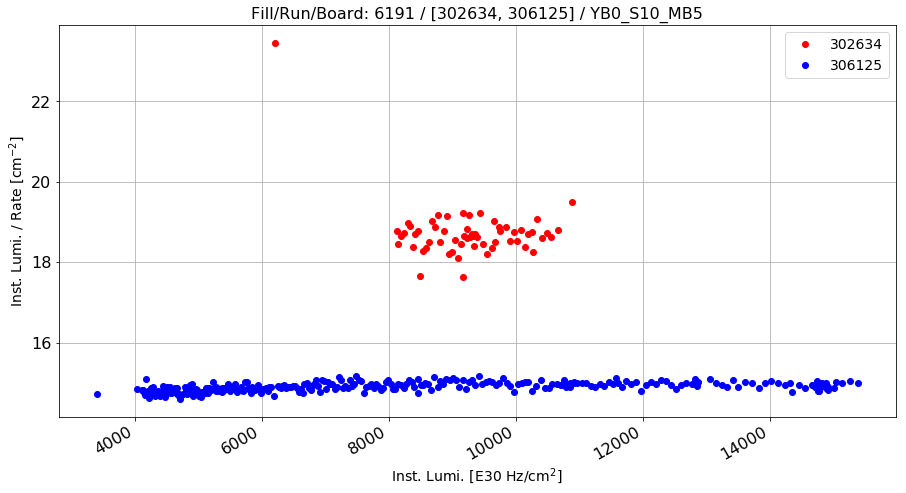

0.256775445186


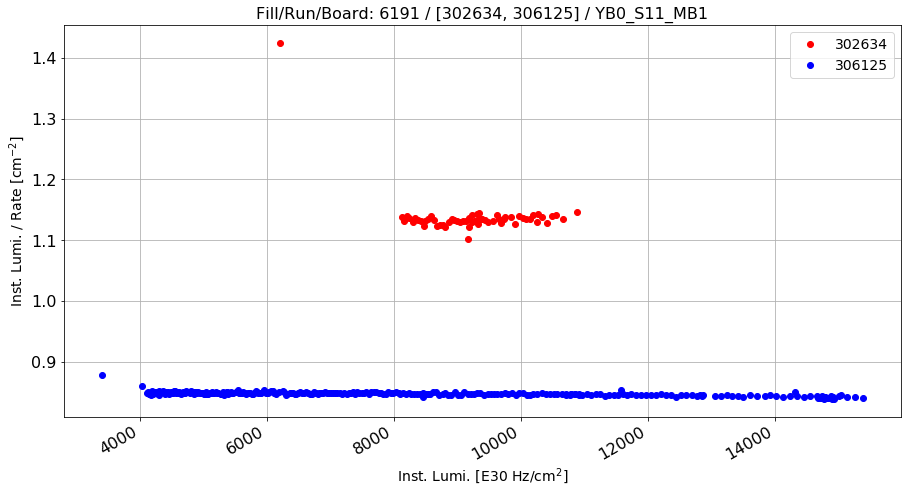

0.343090991511


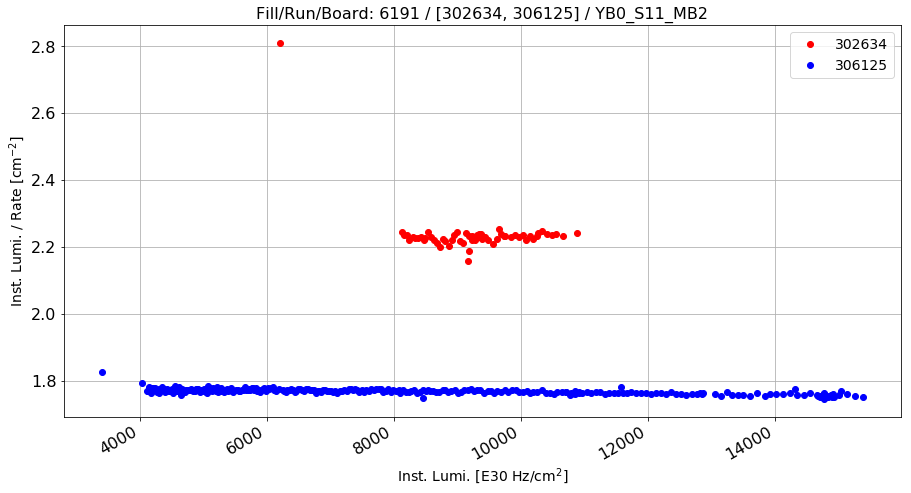

0.265310783351


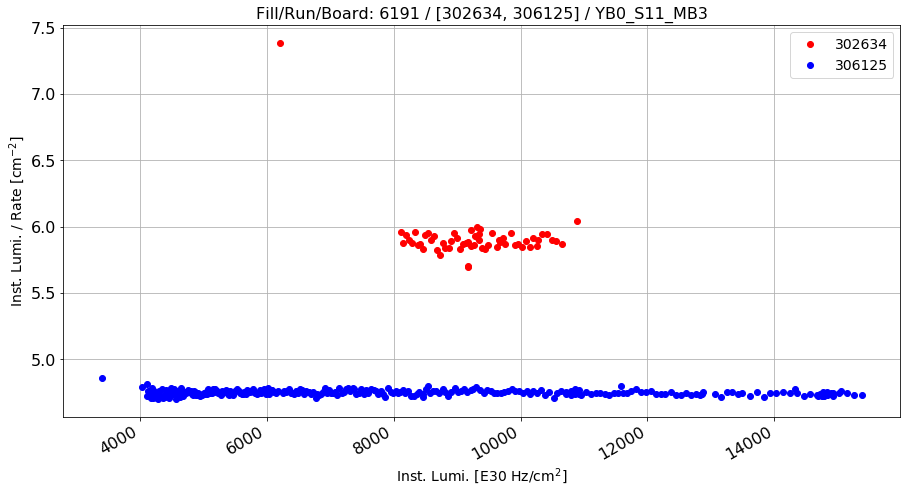

0.245251192808


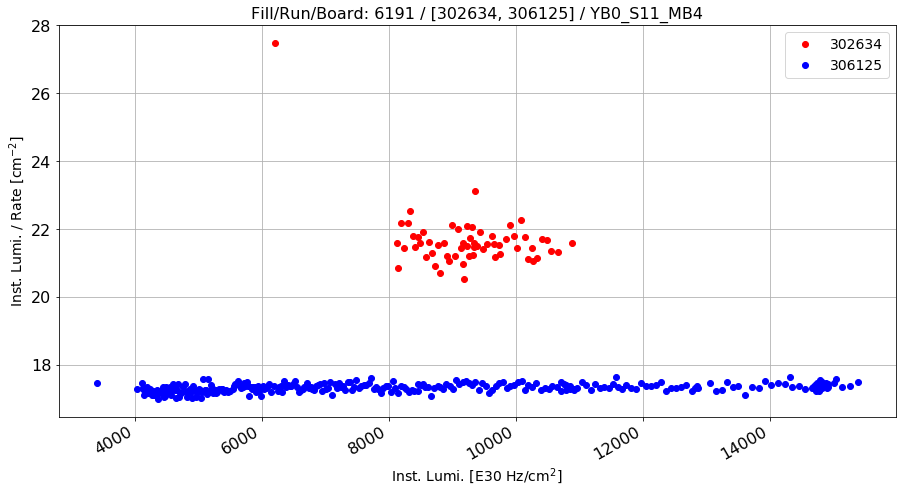

0.249564837266


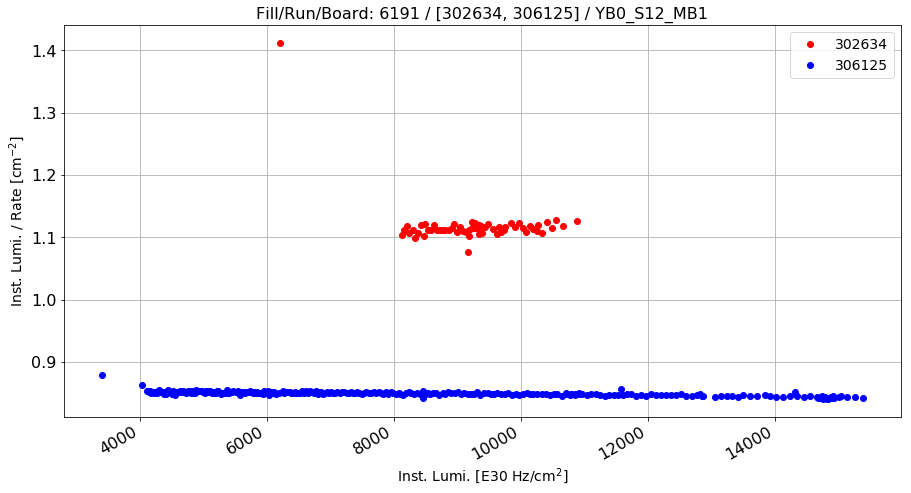

0.316875545947


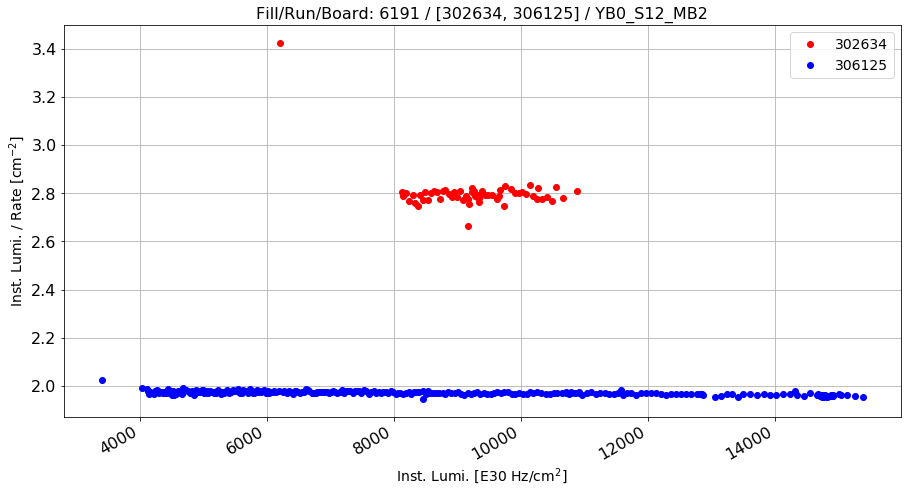

0.420494274259


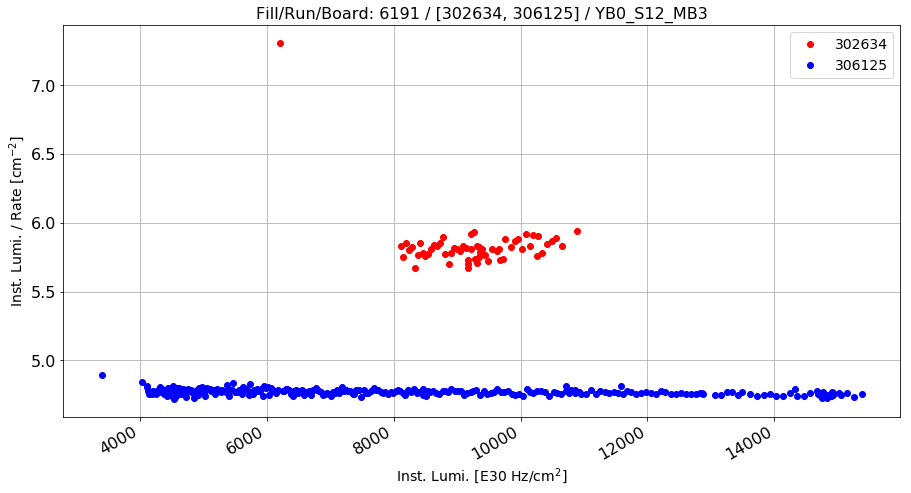

0.22329166755


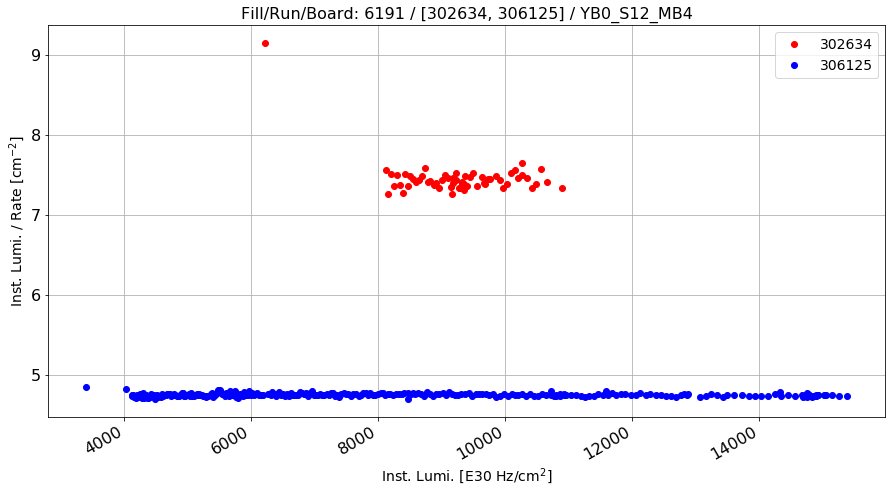

0.569726982697


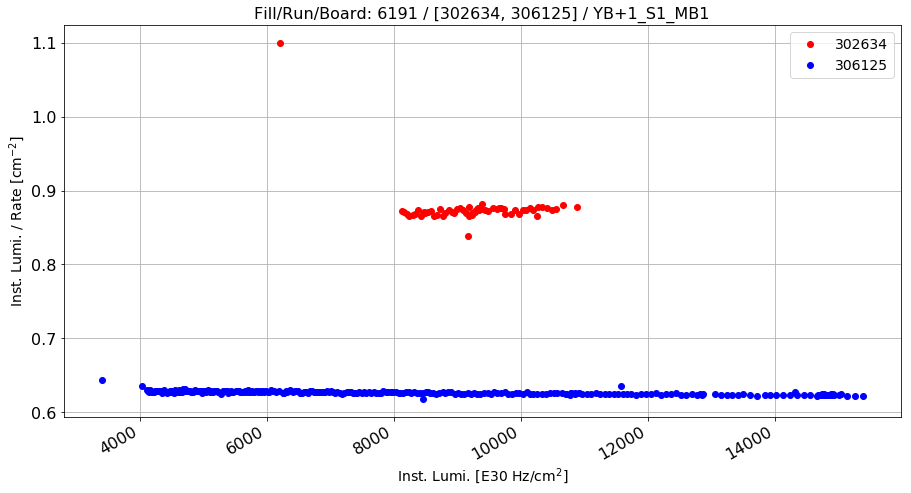

0.397410724969


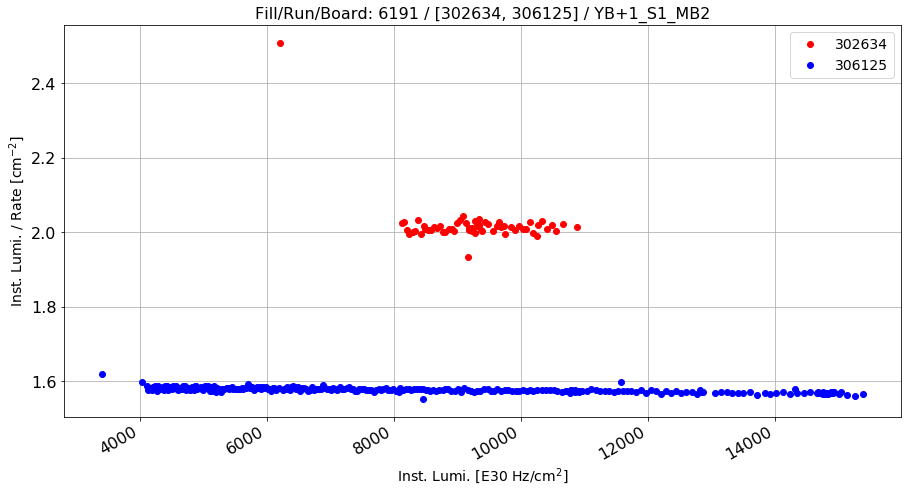

0.280639062784


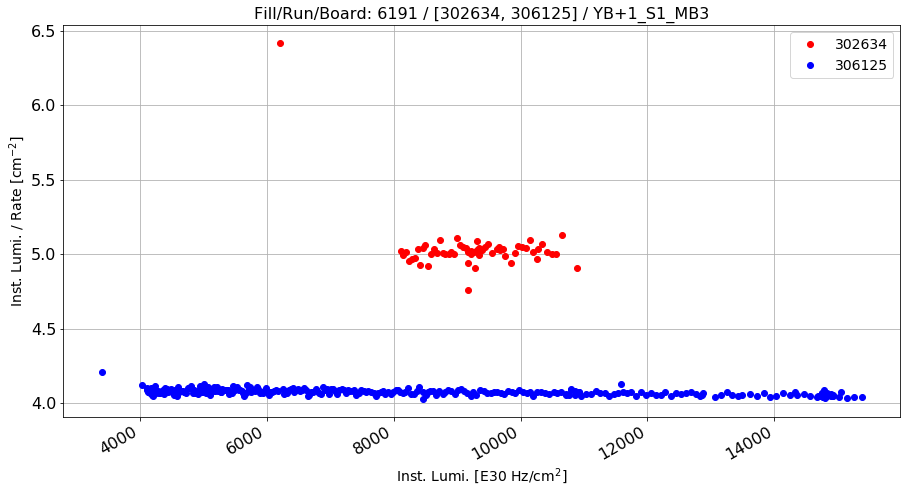

0.235918014238


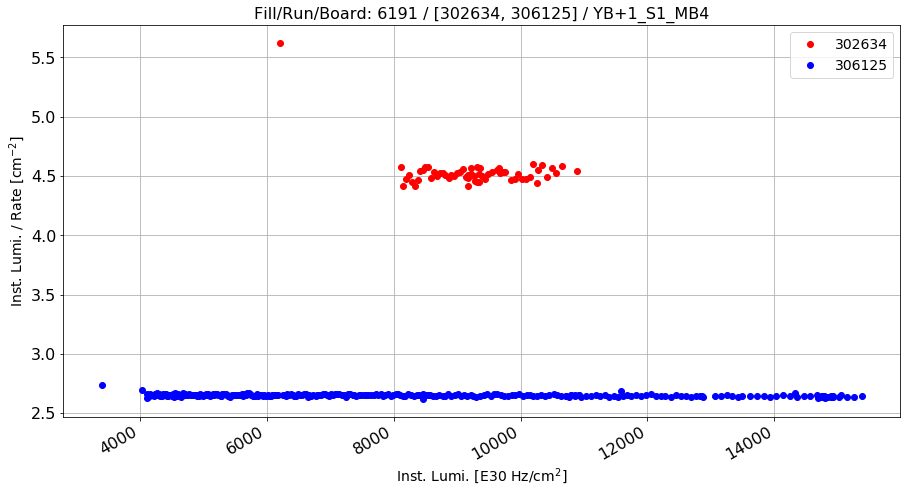

0.710046700792


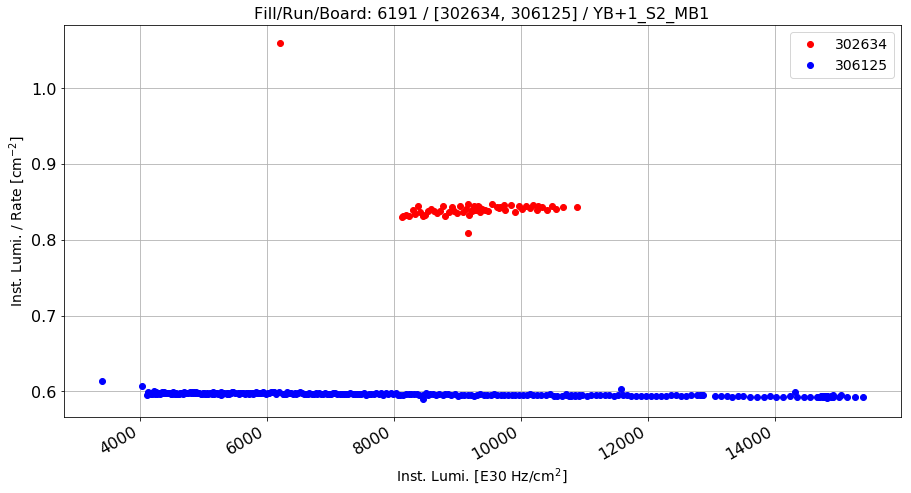

0.413570557867


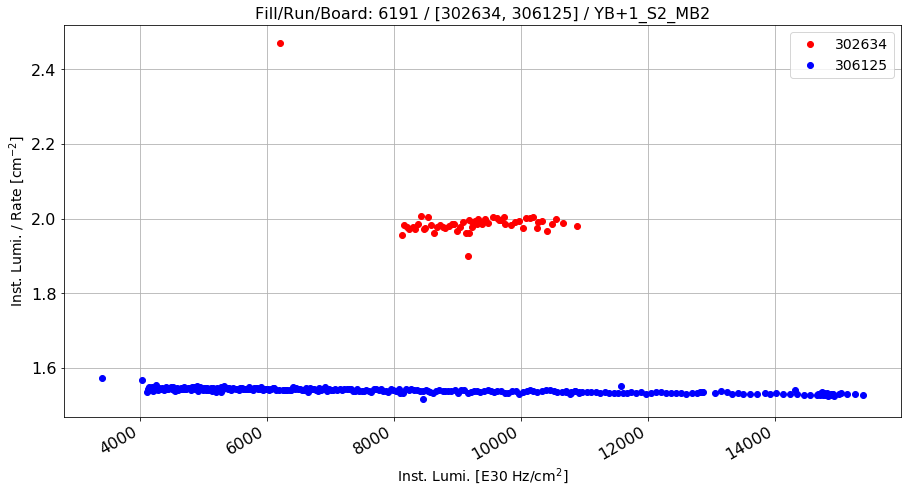

0.294036688292


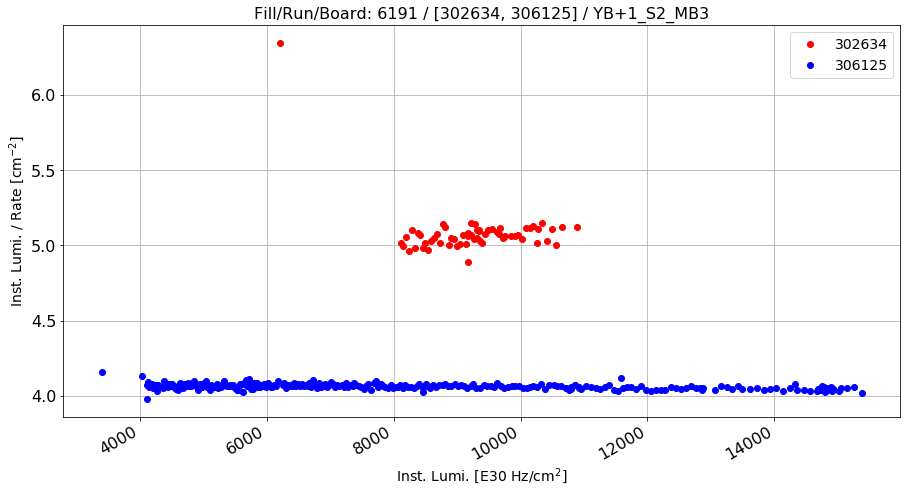

0.251038095567


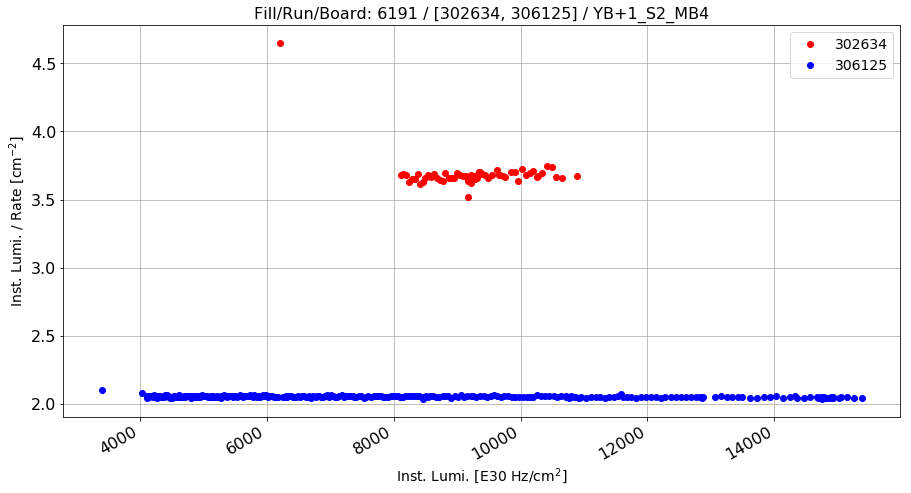

0.795448717578


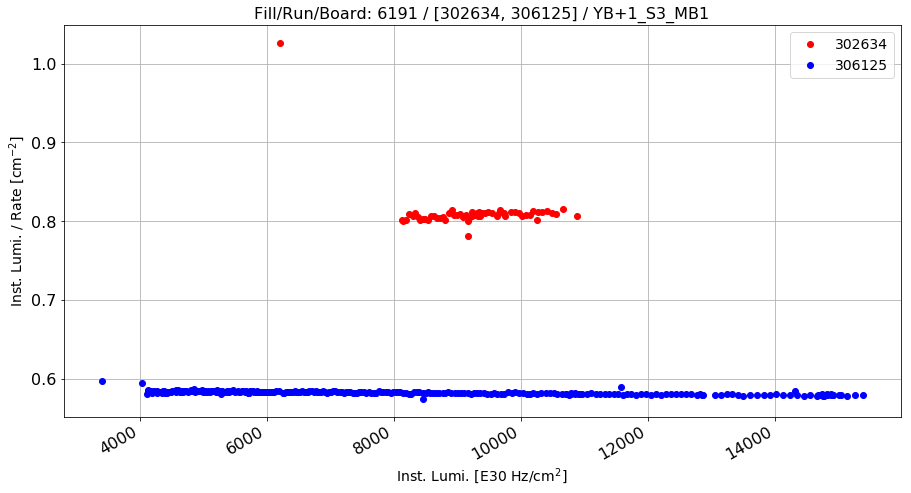

0.392326991599


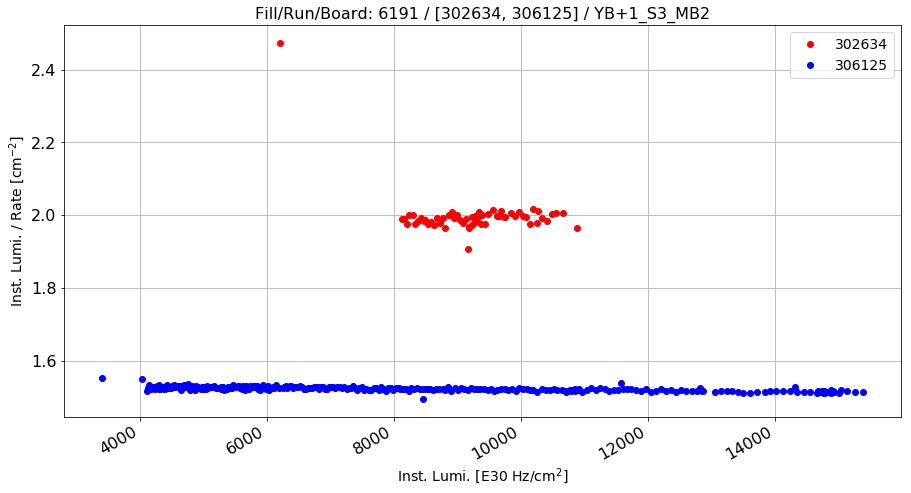

0.311875913551


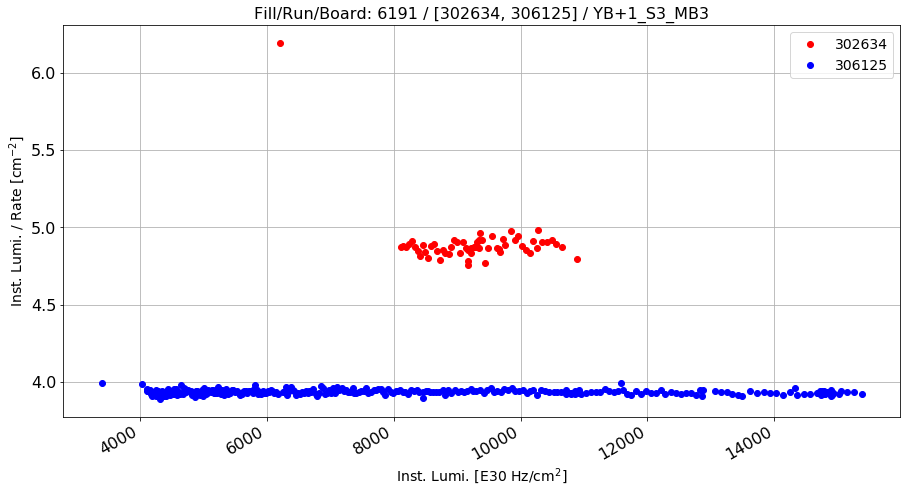

0.243595764146


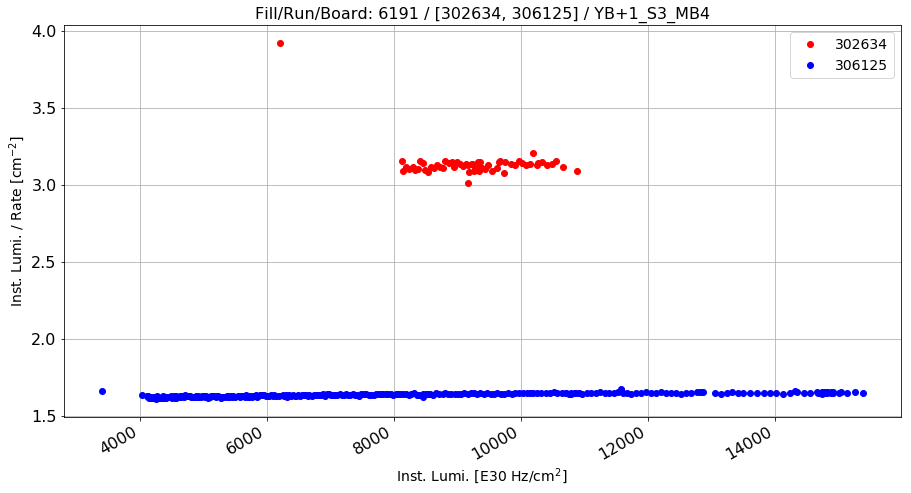

0.91347736361


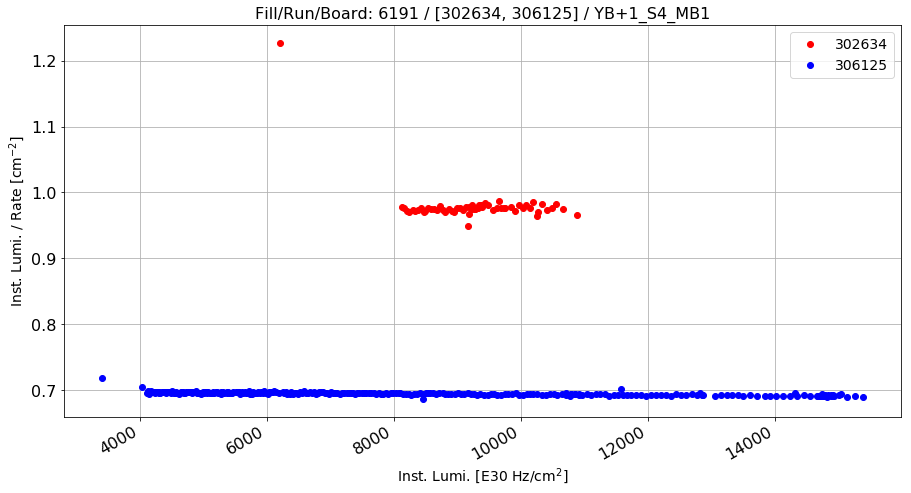

0.40900147358


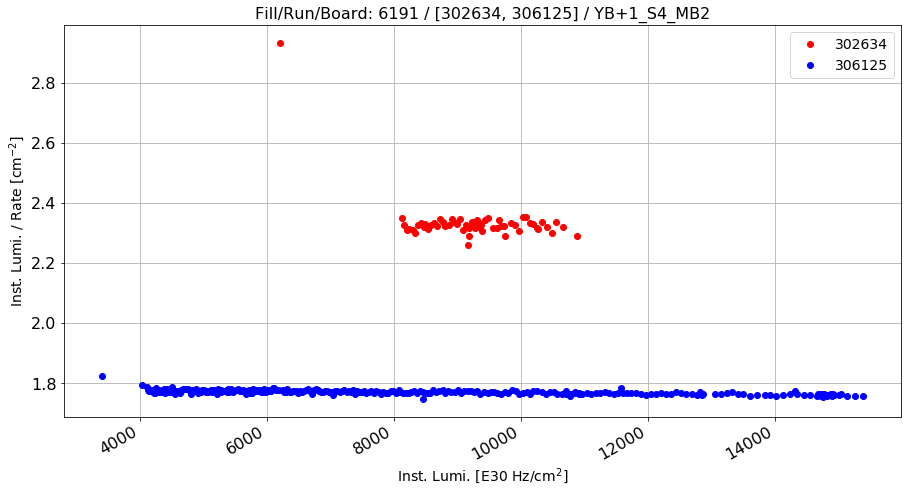

0.31855194618


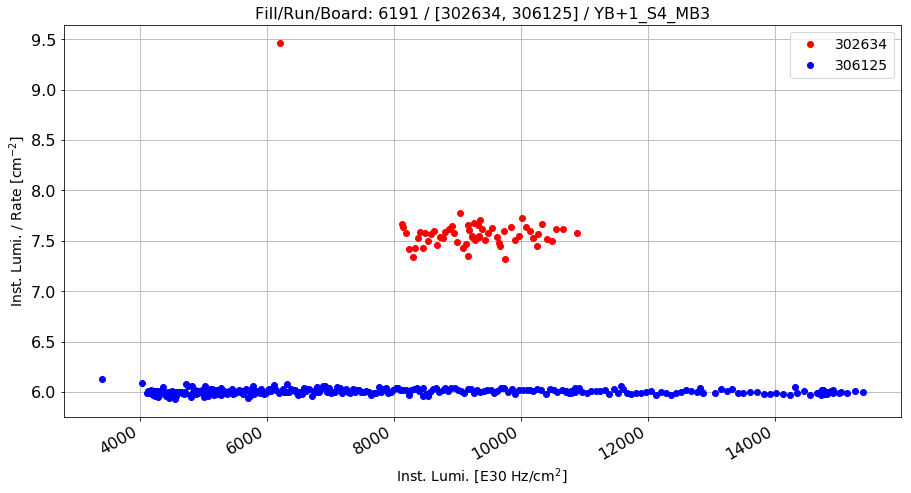

0.262941293504


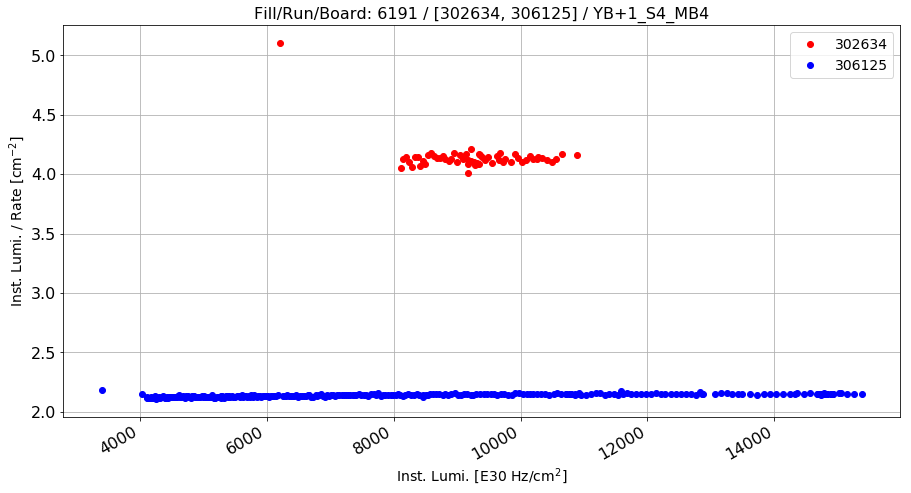

0.936360290409


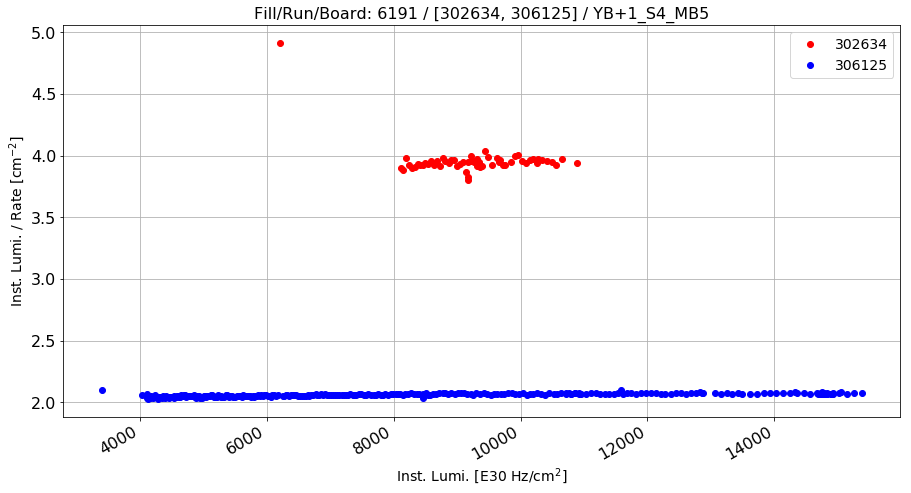

0.919755319904


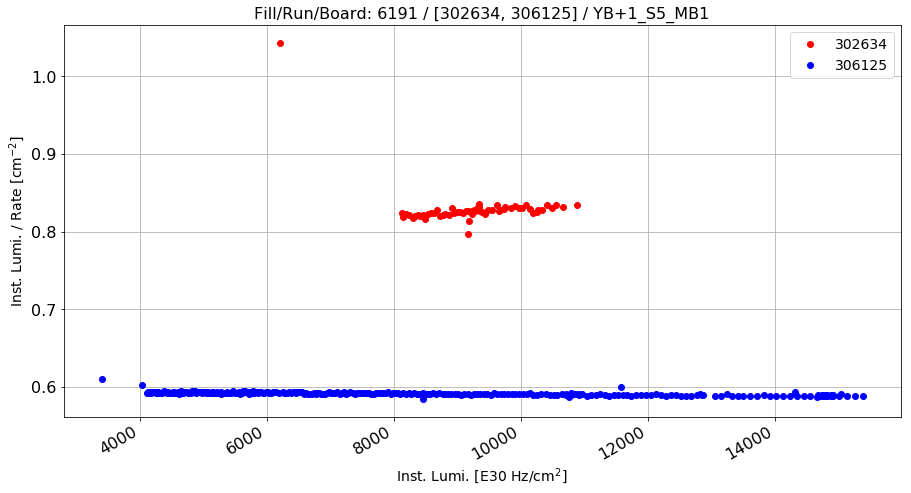

0.402388503844


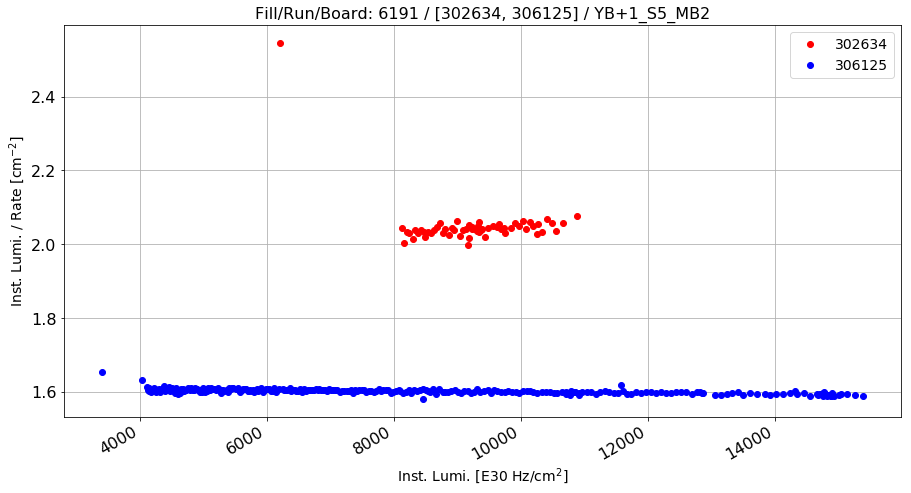

0.278751899381


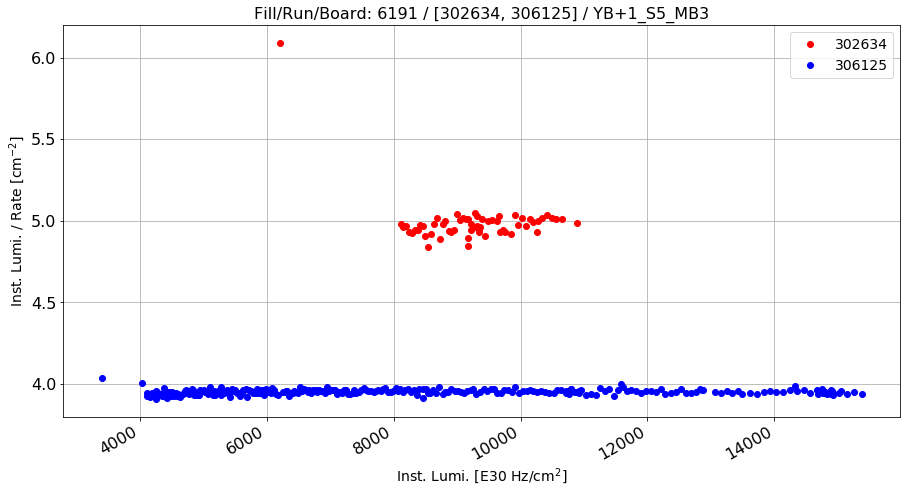

0.262573216116


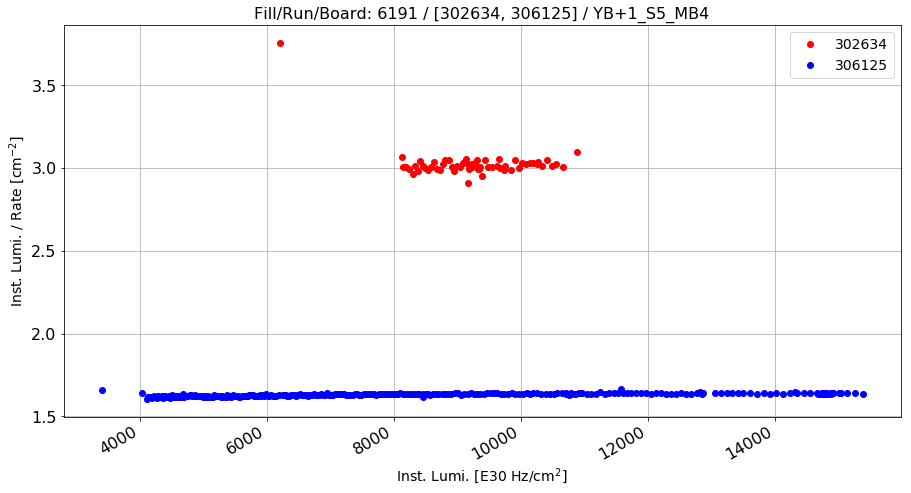

0.855810381107


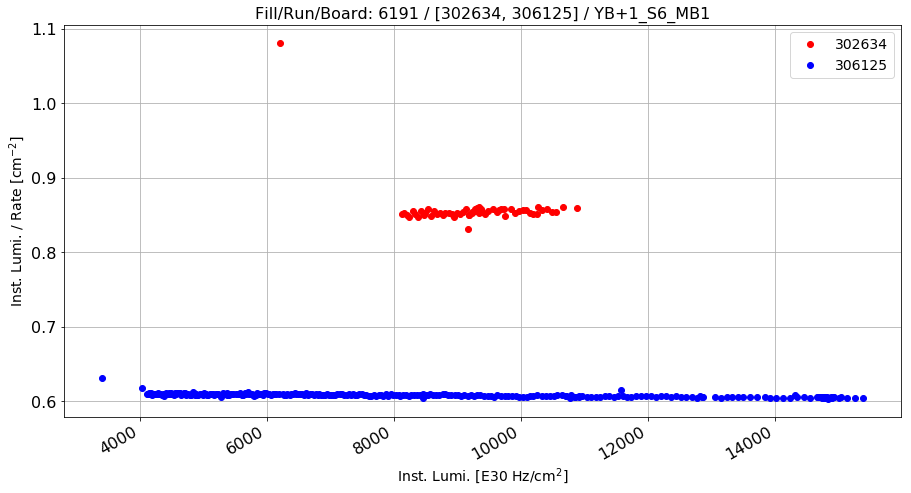

0.409664324562


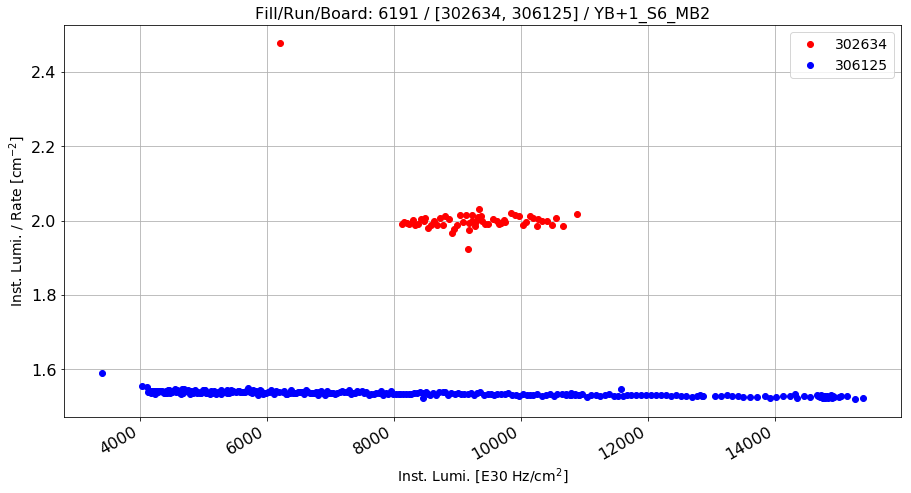

0.305779851646


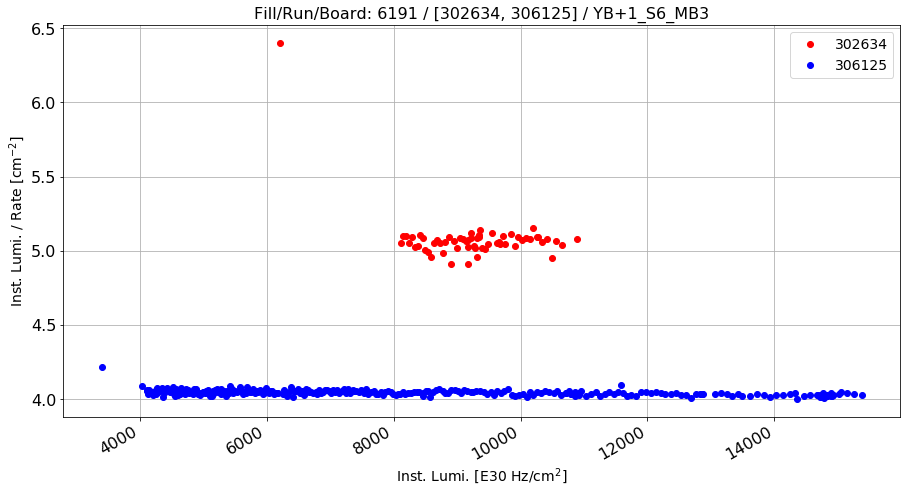

0.255376100268


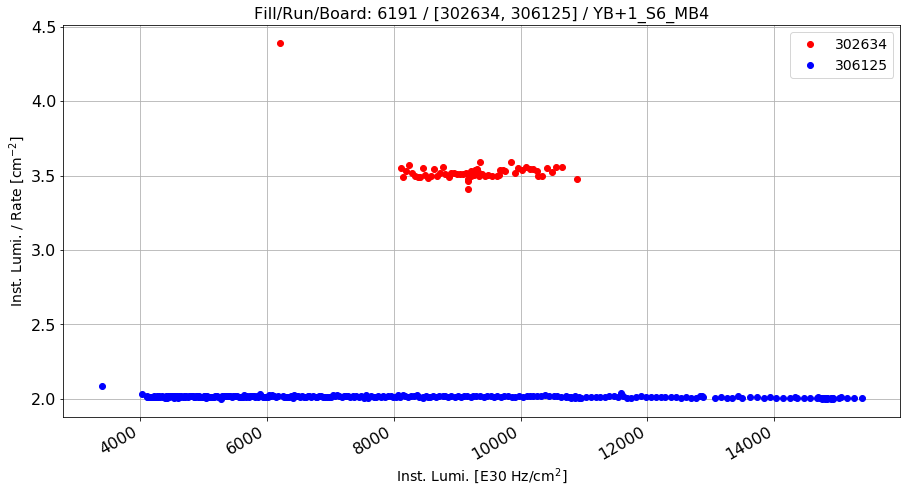

0.75336727585


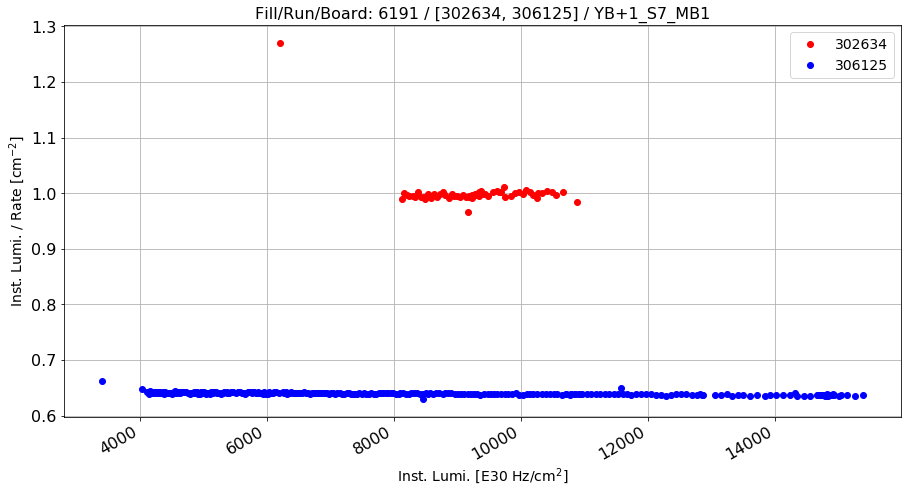

0.565528910391


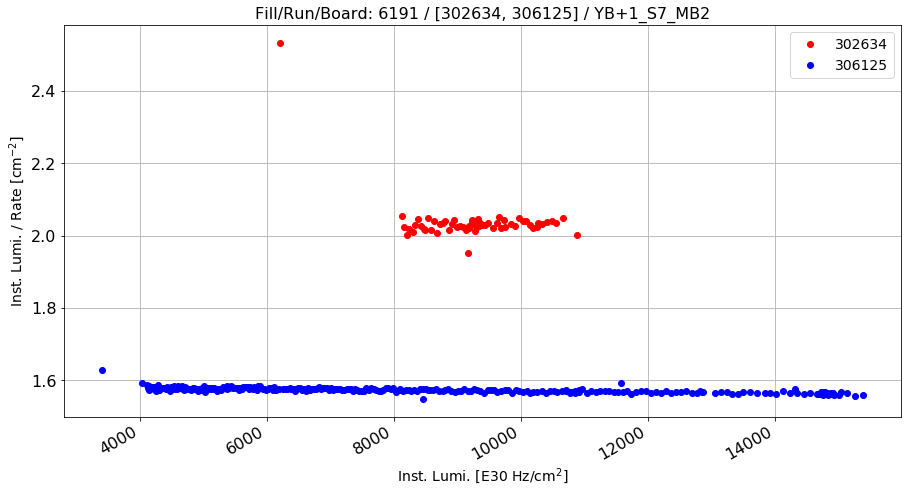

0.294939685243


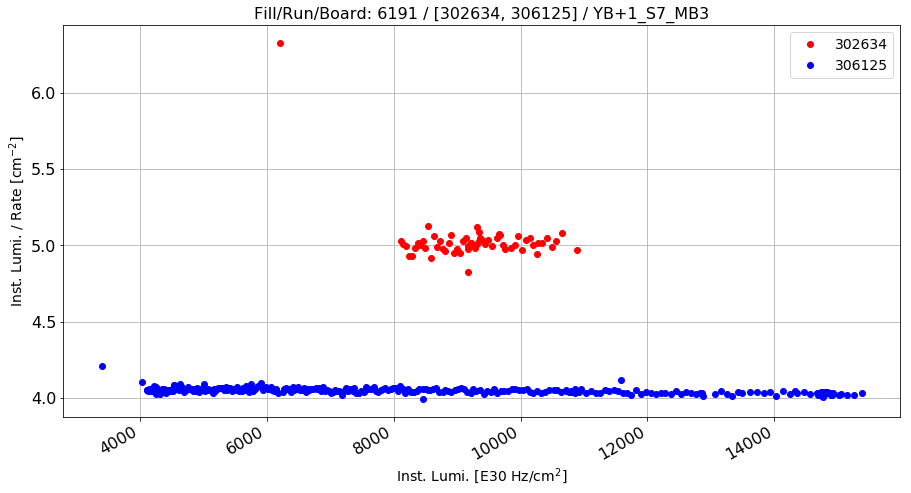

0.242249060587


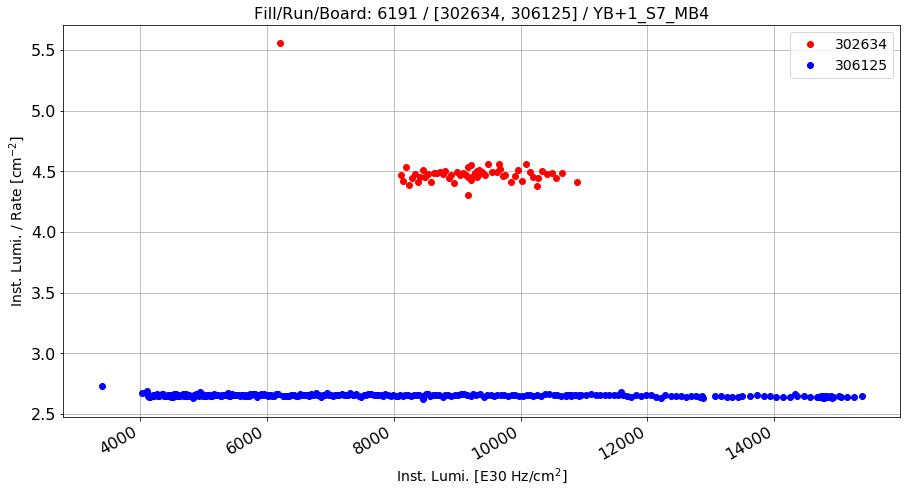

0.692245865149


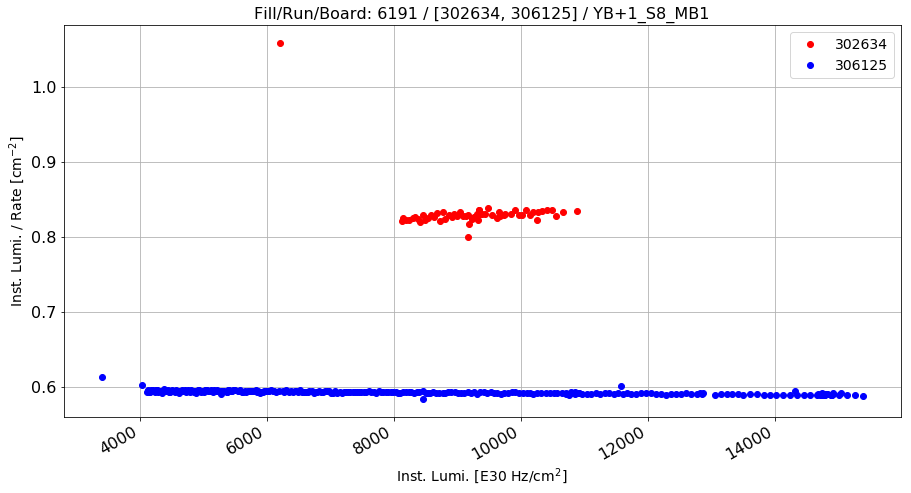

0.403925537677


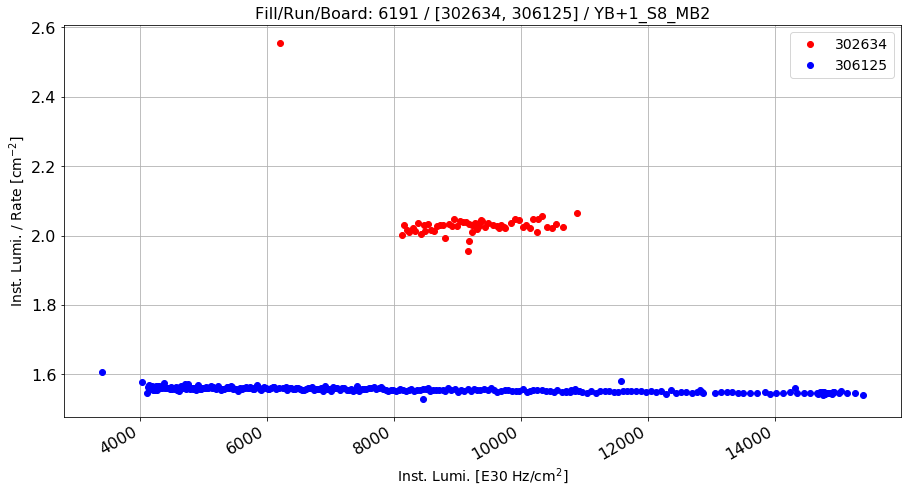

0.308146792978


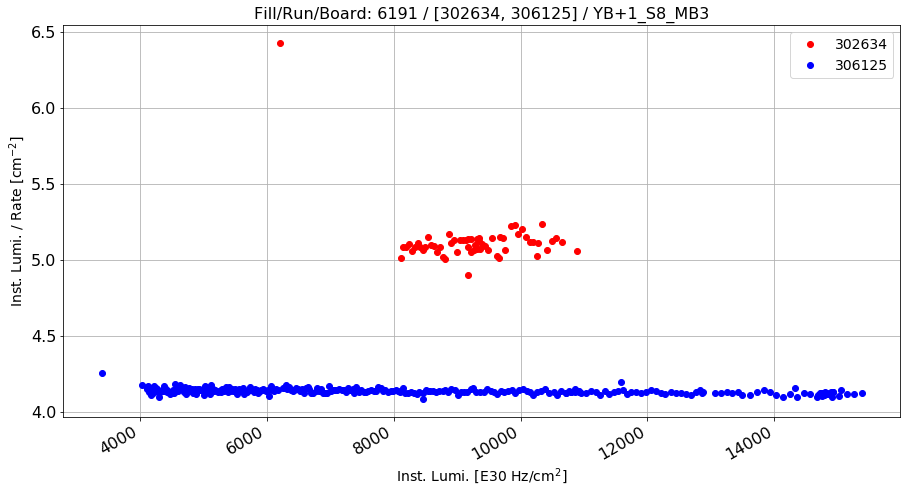

0.238327968985


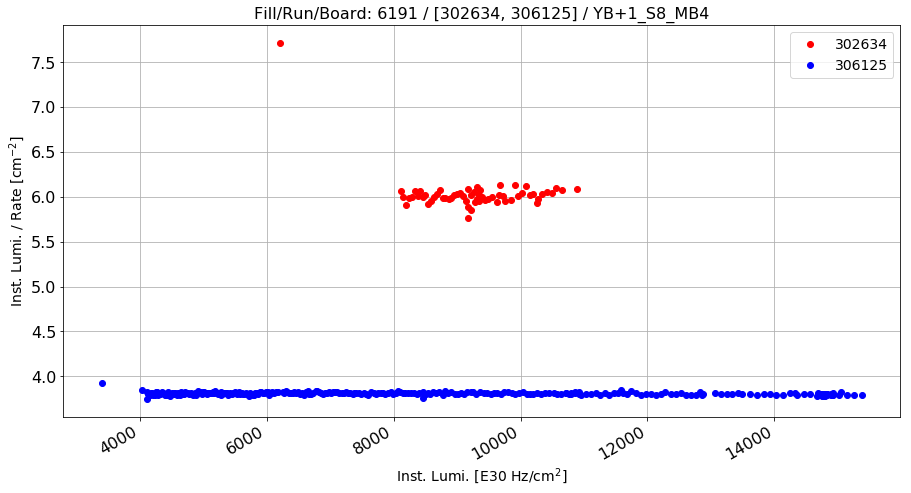

0.584194389498


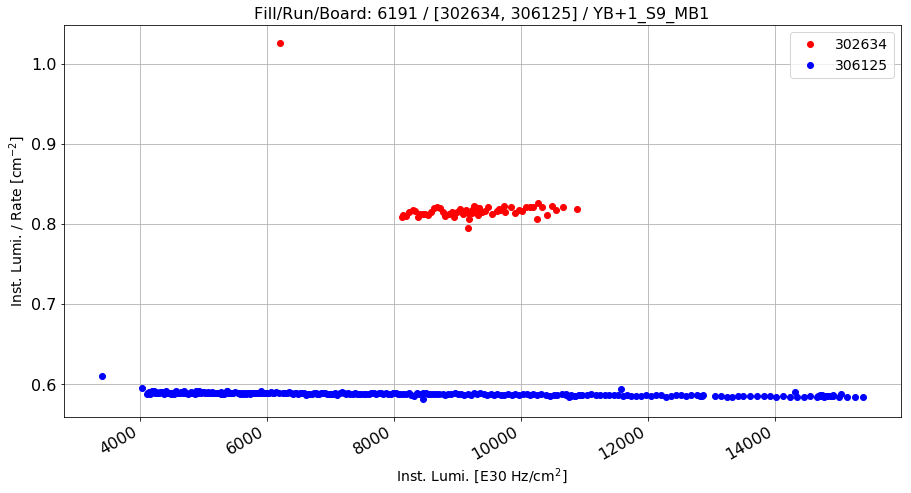

0.393345734825


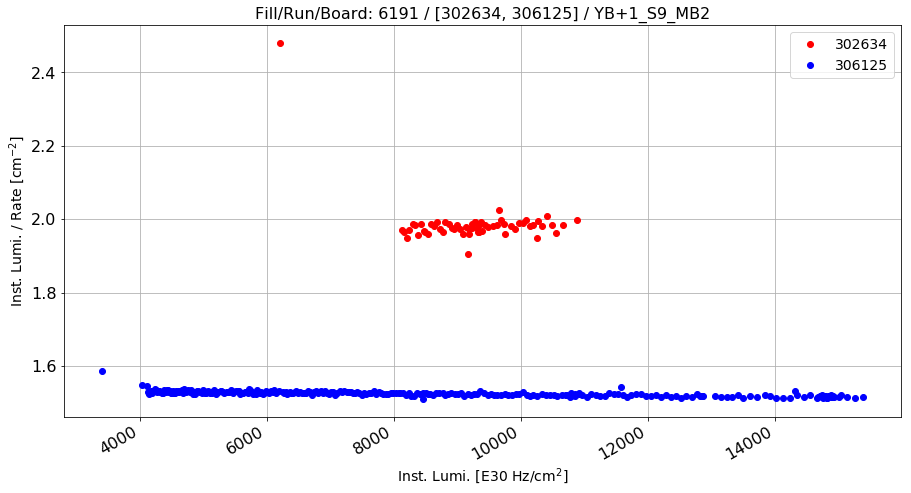

0.302255800244


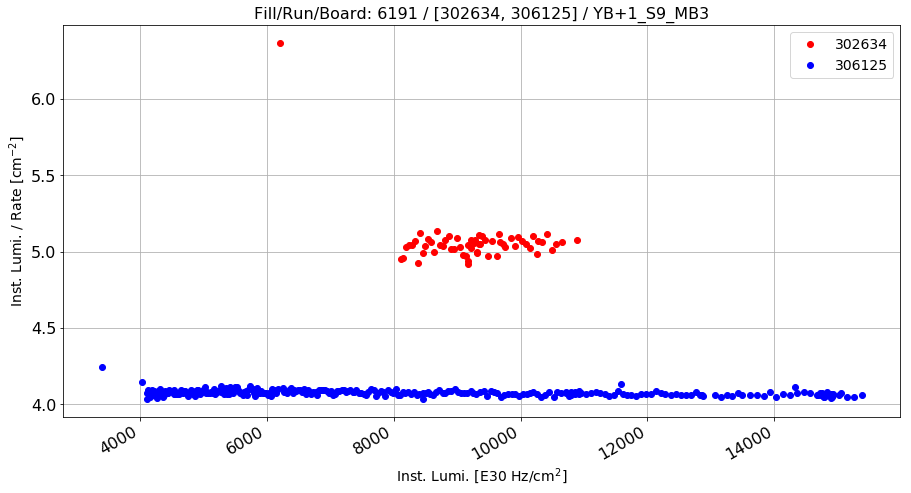

0.242129836595


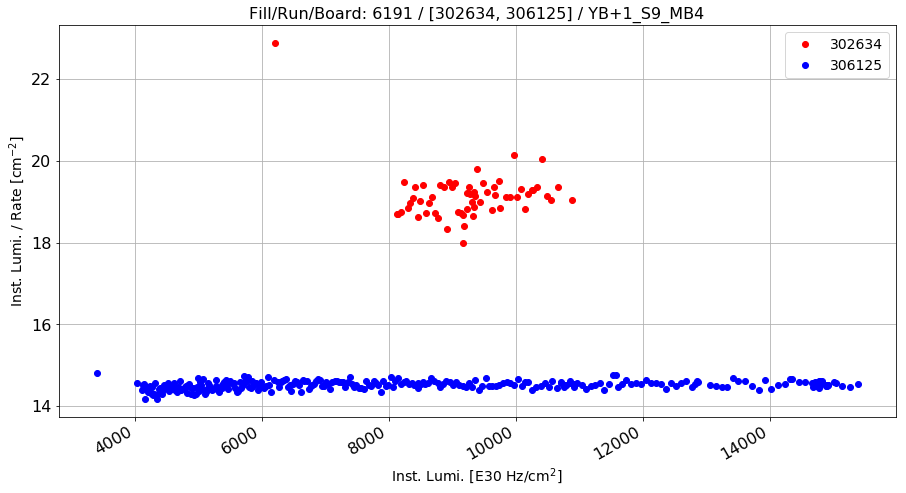

0.319156861647


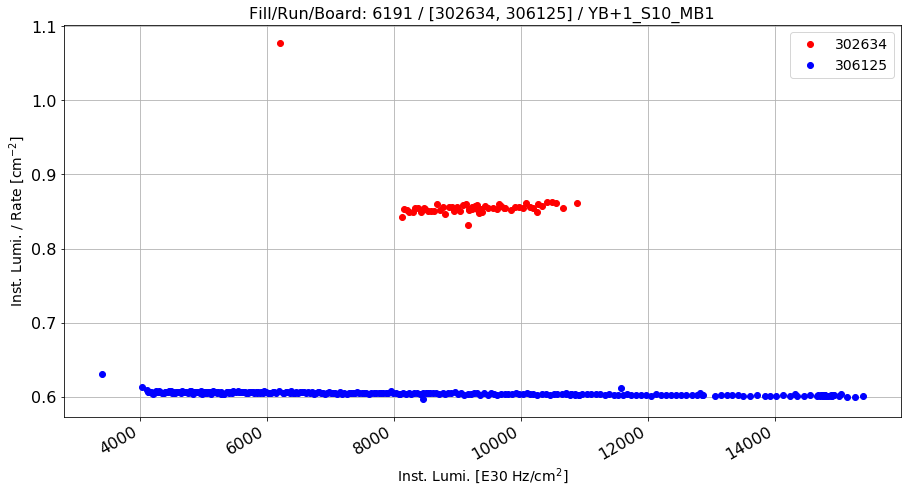

0.418852740919


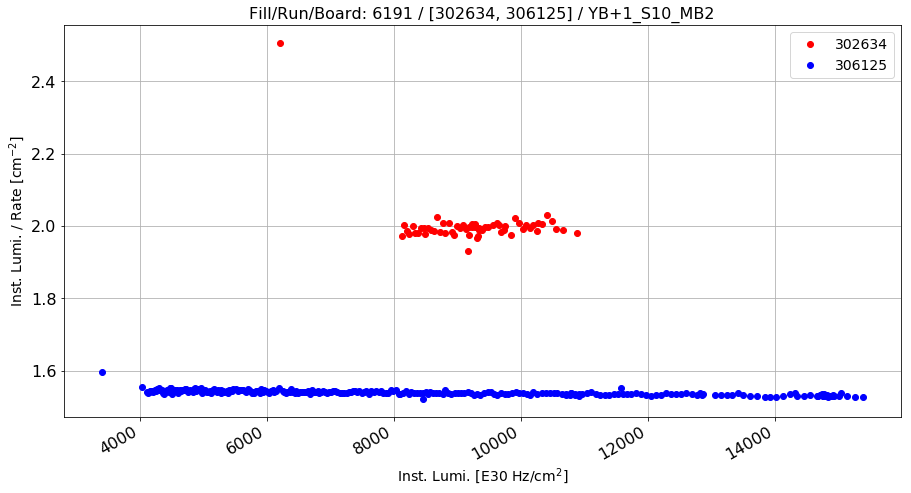

0.299979165328


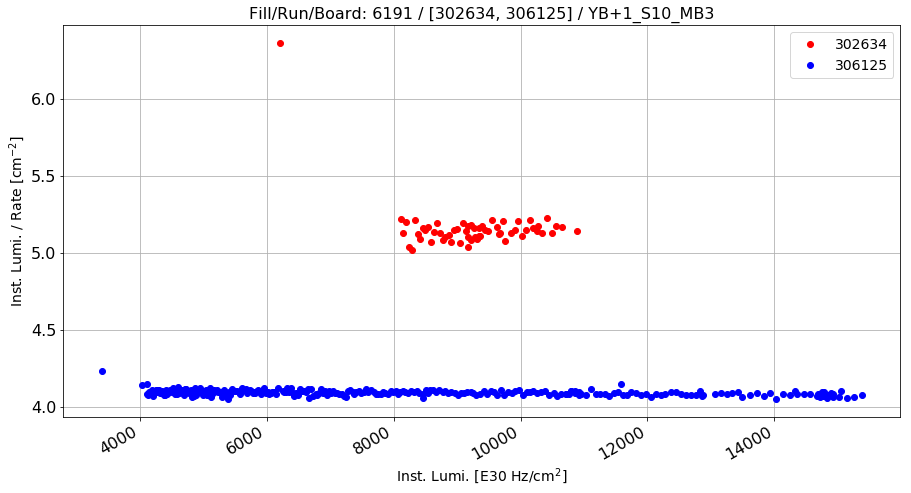

0.260138691087


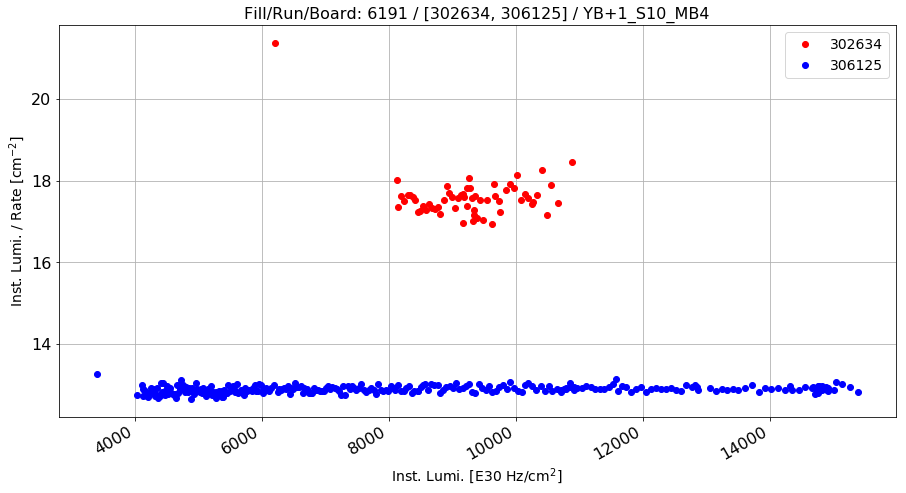

0.365548487826


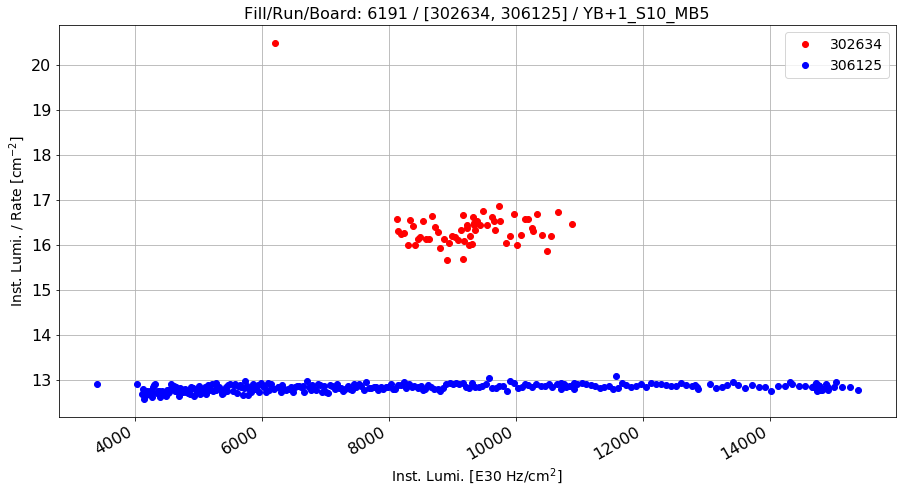

0.277146859514


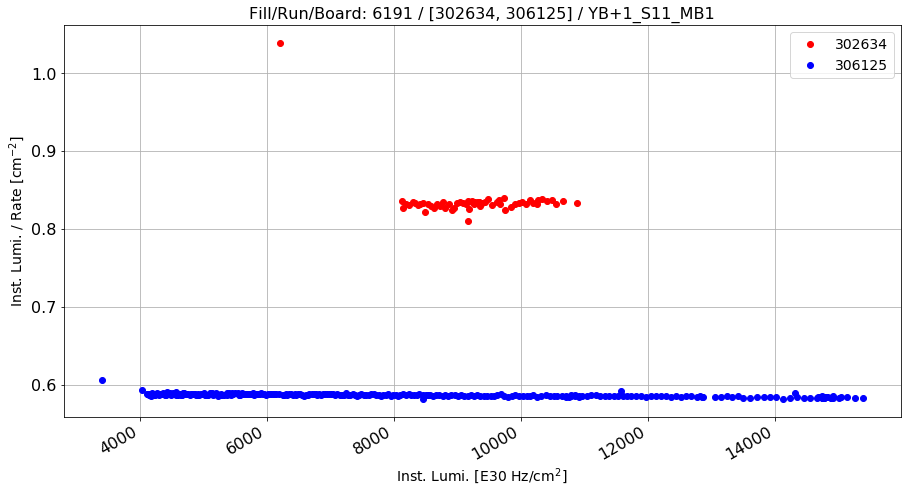

0.424270068477


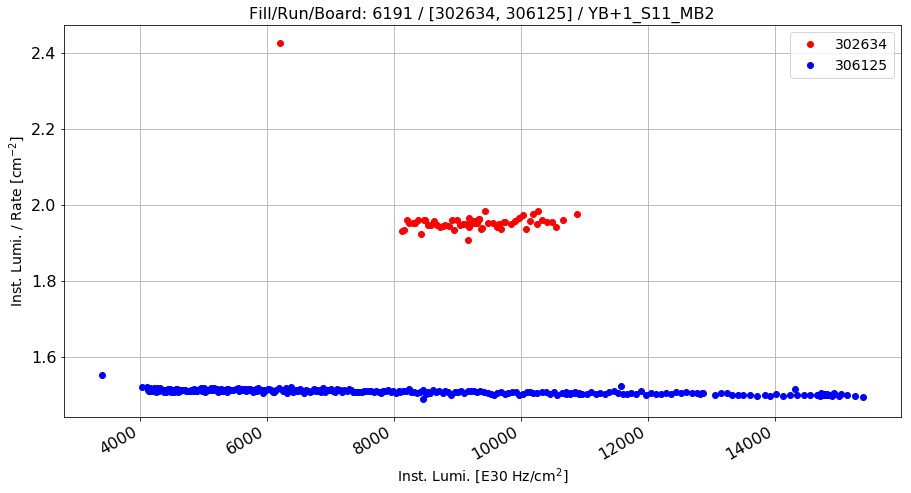

0.299465867919


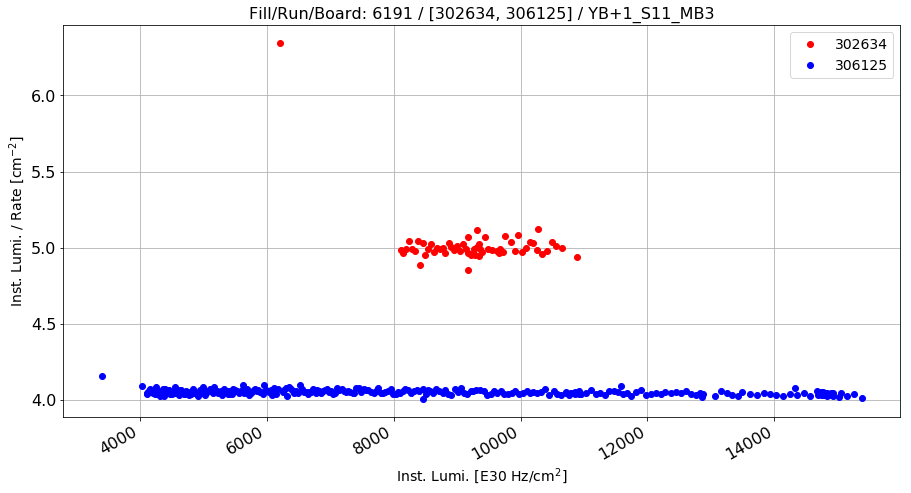

0.238647044421


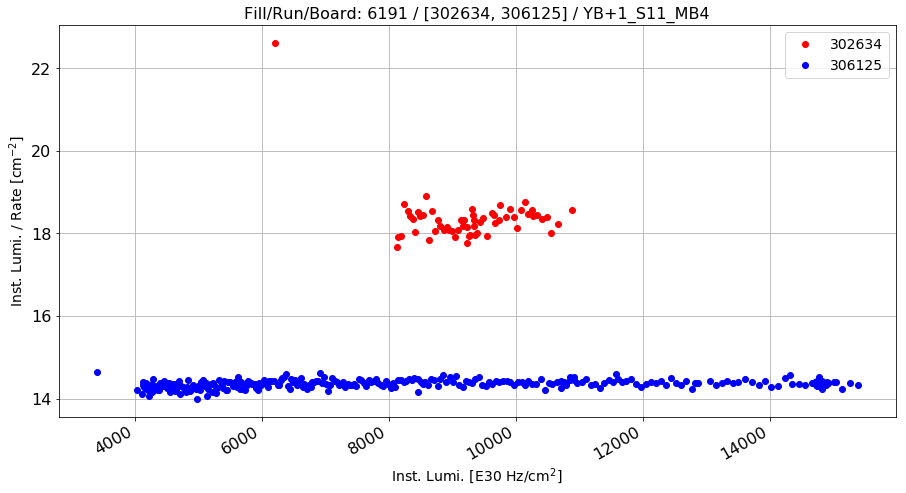

0.277823111555


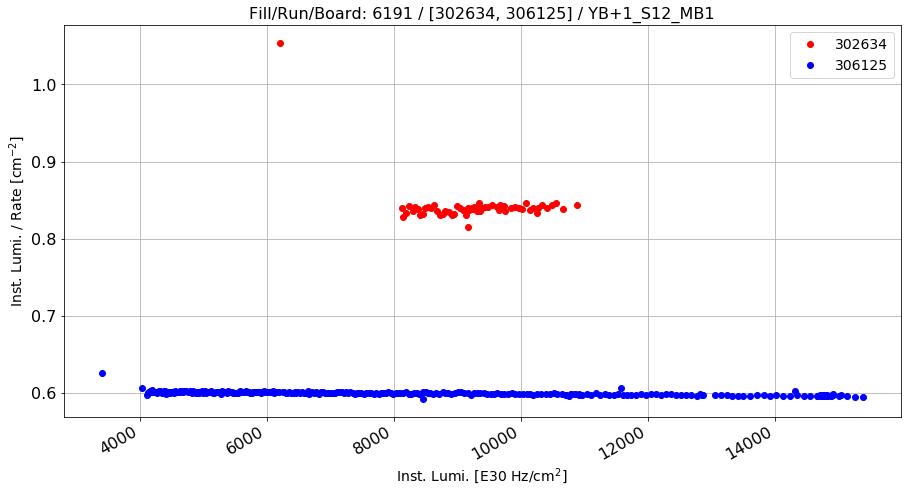

0.403196725973


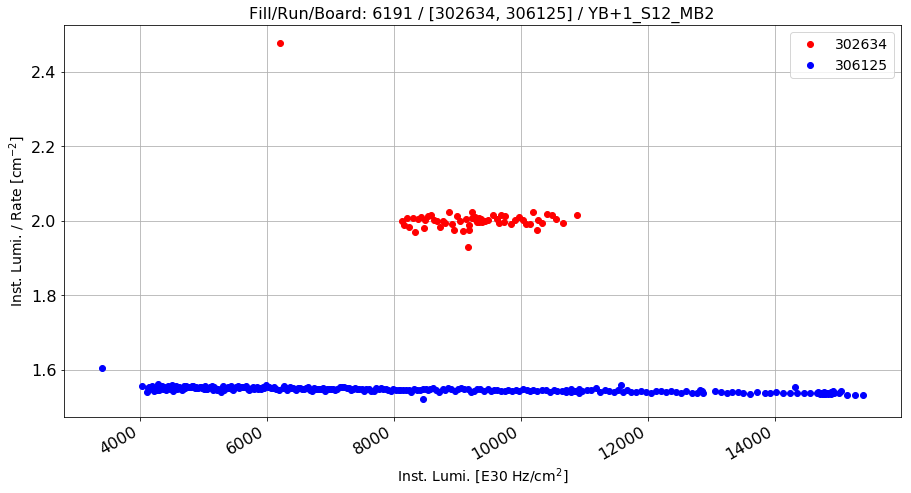

0.297096194983


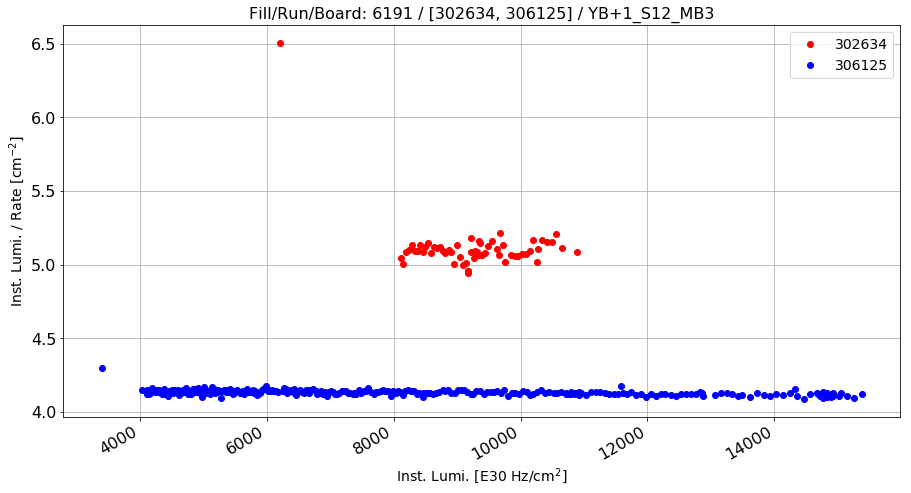

0.237181133981


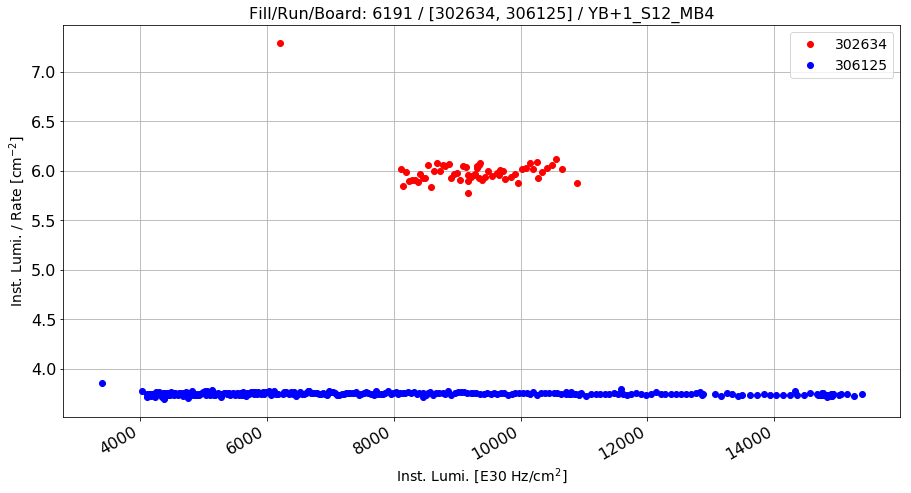

0.599226833599


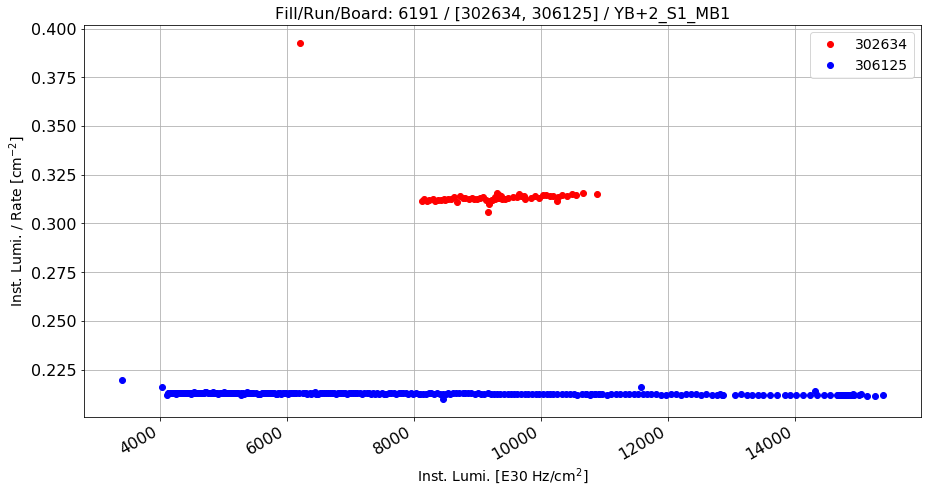

0.477613904612


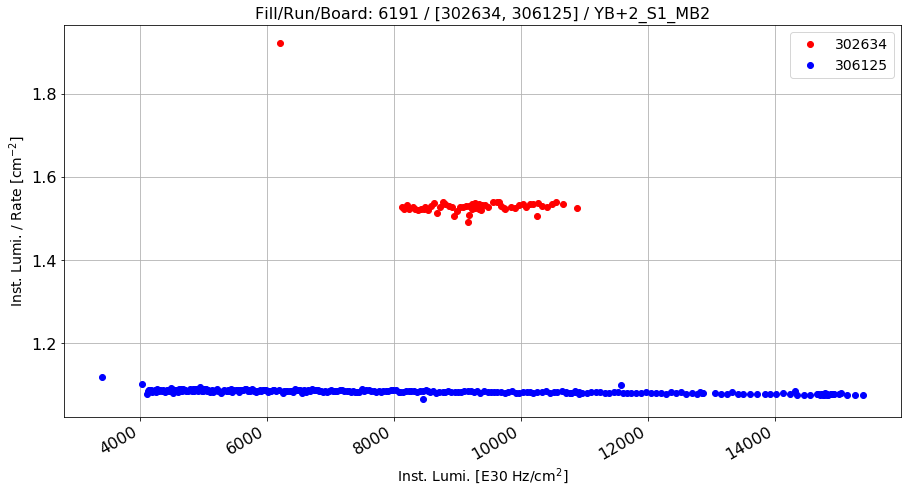

0.415039057015


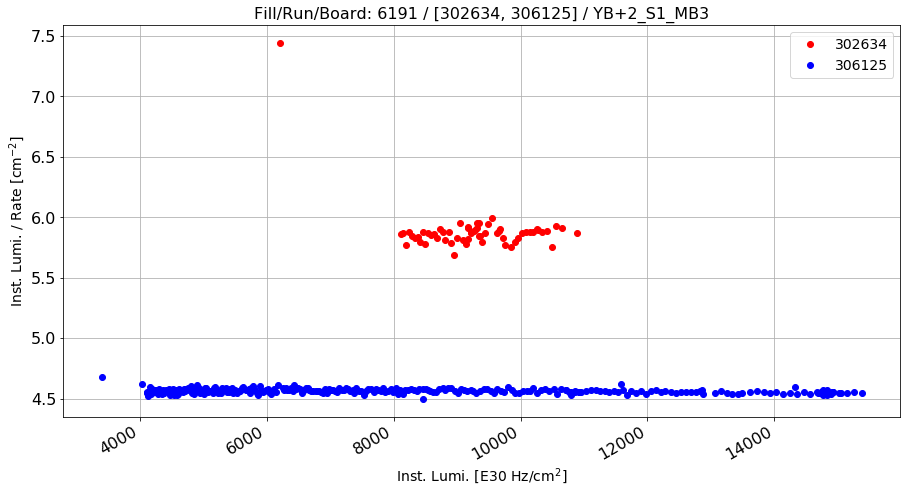

0.289634363136


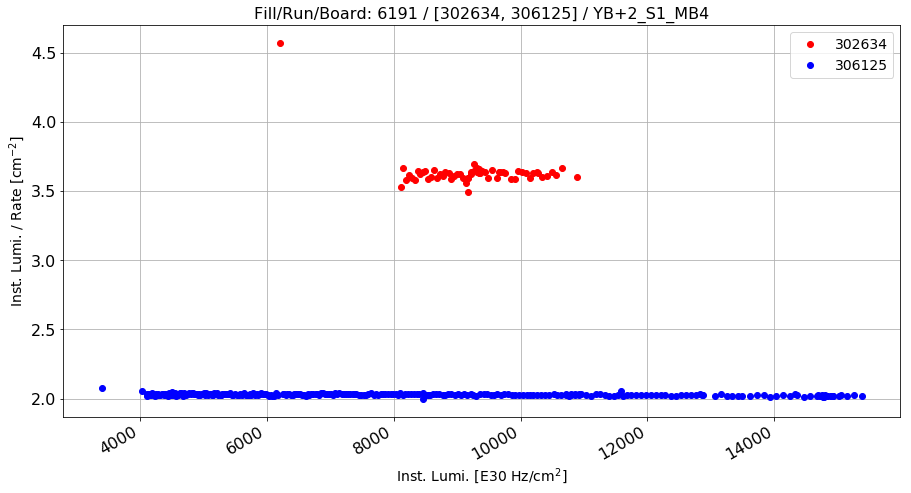

0.791554083097


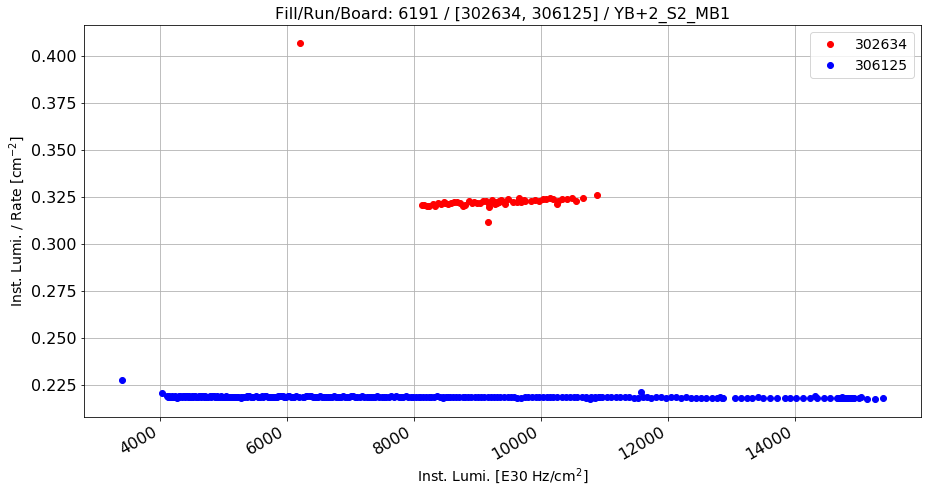

0.479903933561


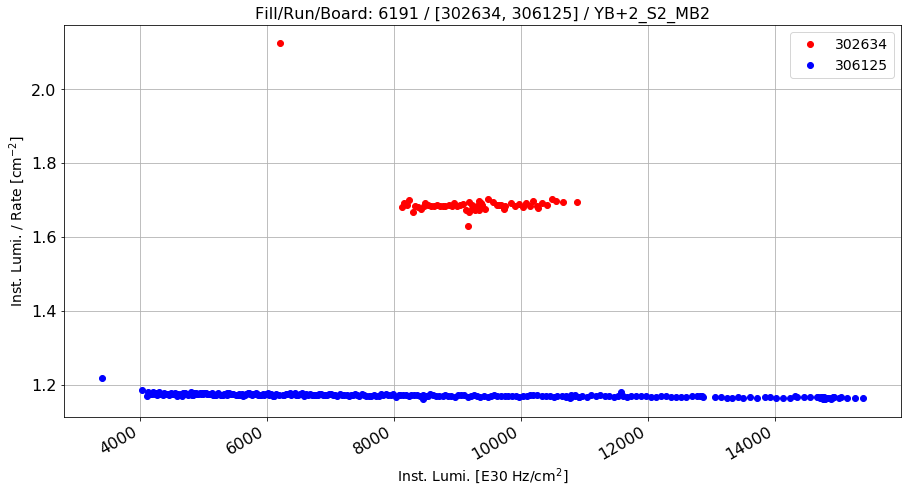

0.444591803372


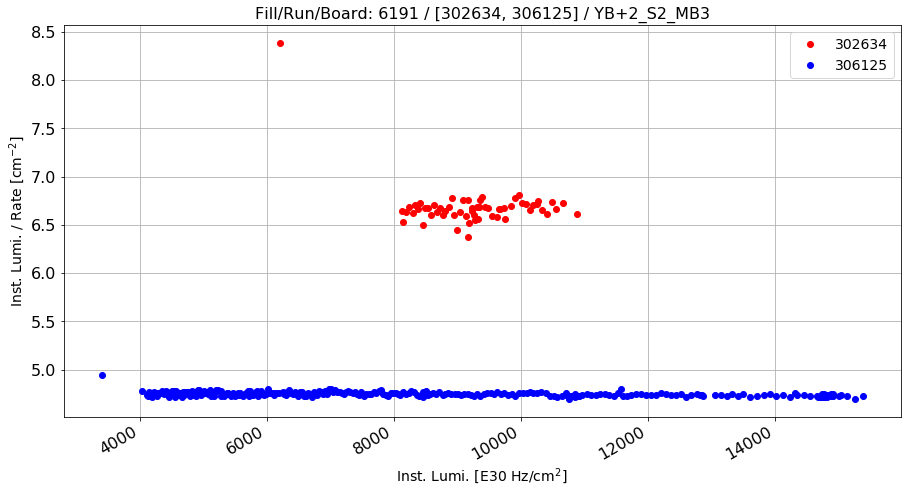

0.407305371587


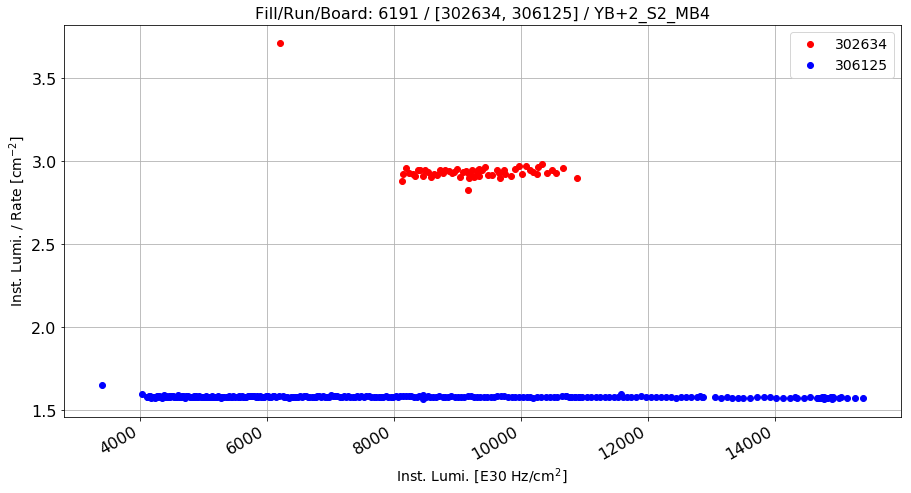

0.863797302615


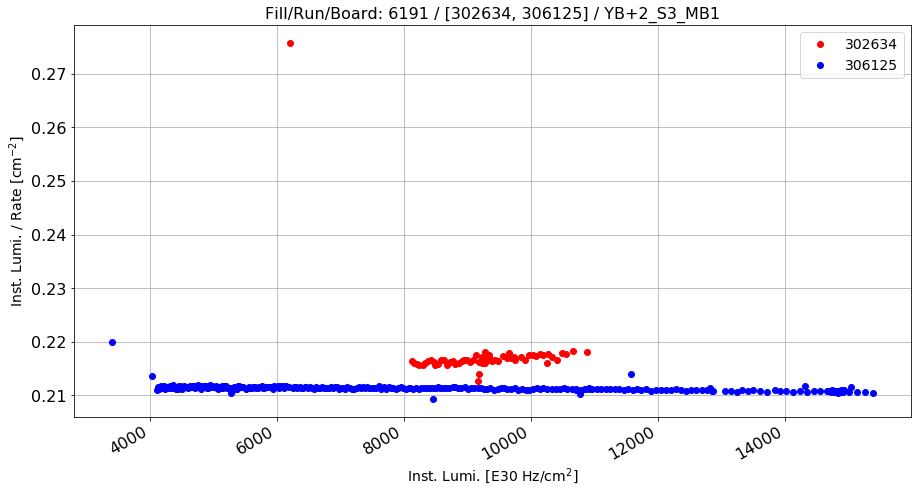

0.0296826856802


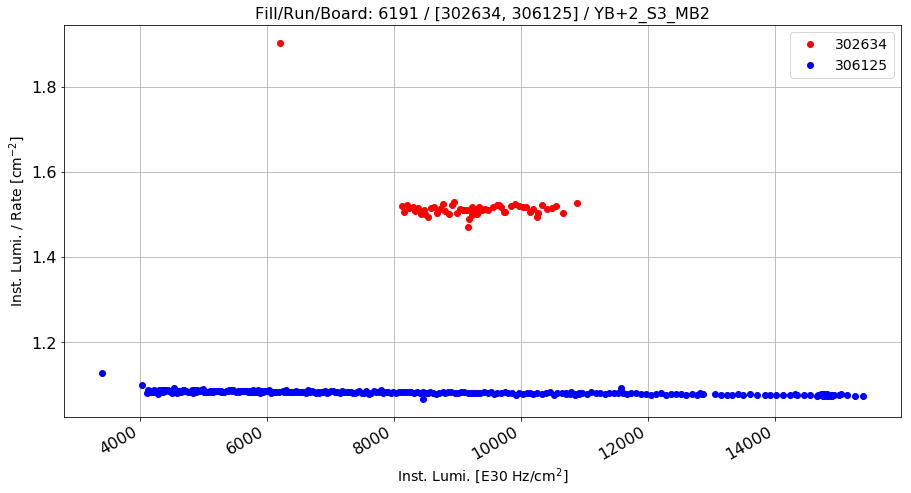

0.402595854138


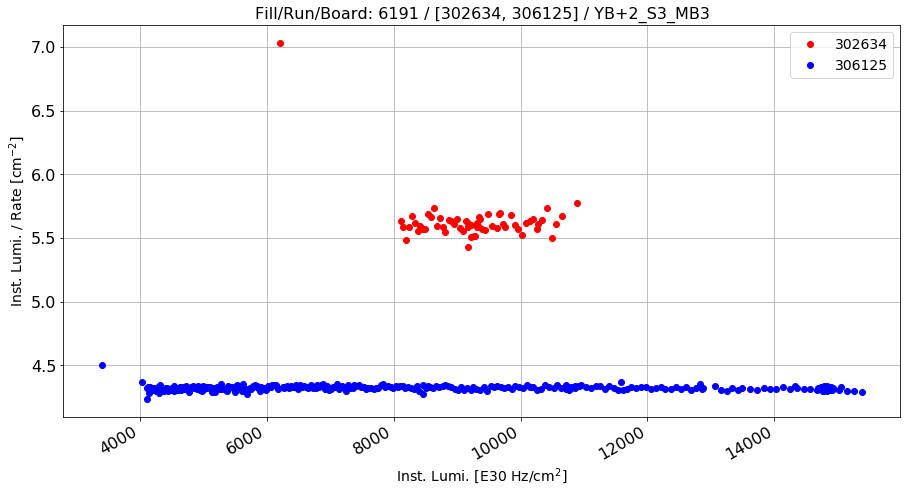

0.30215890747


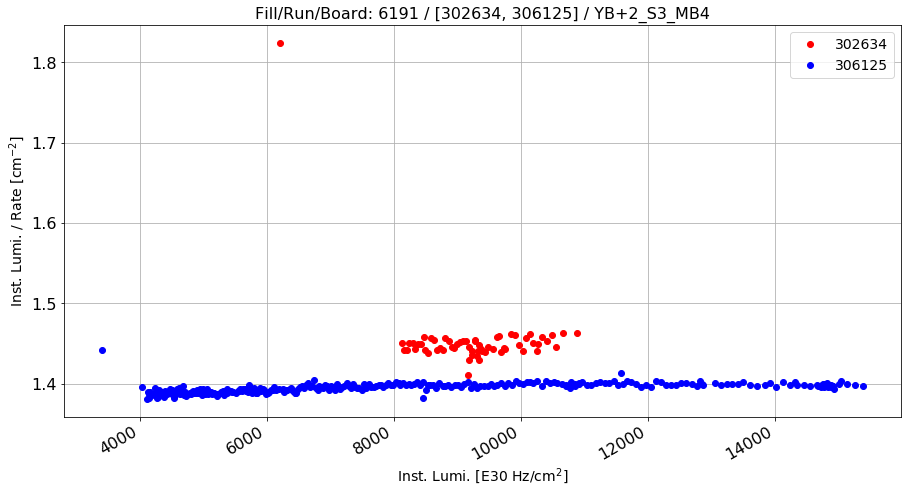

0.0419898562908


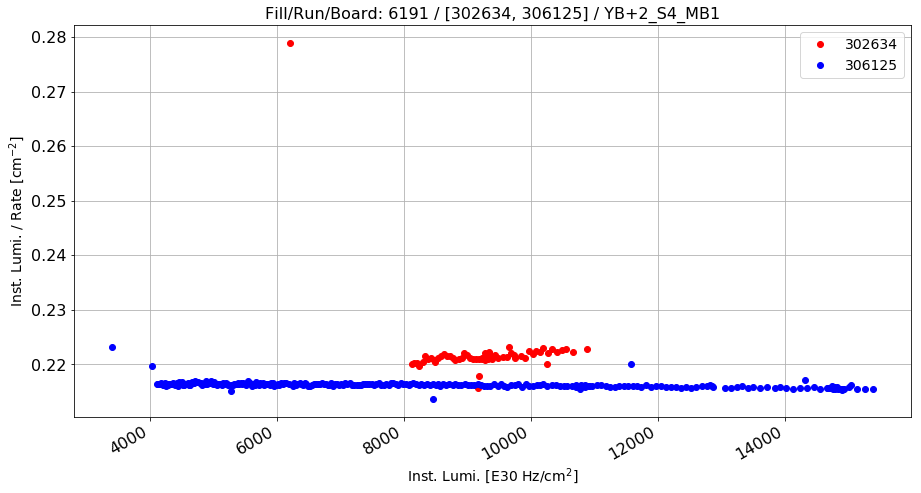

0.0278561462021


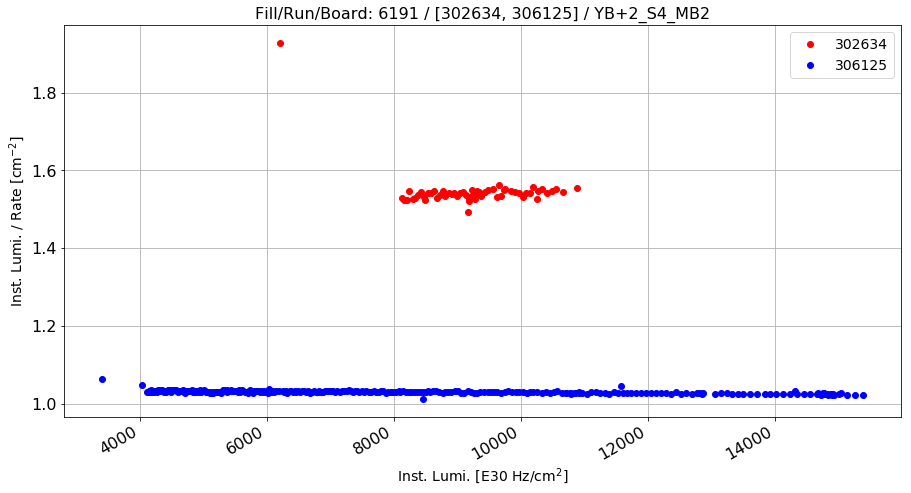

0.500566878643


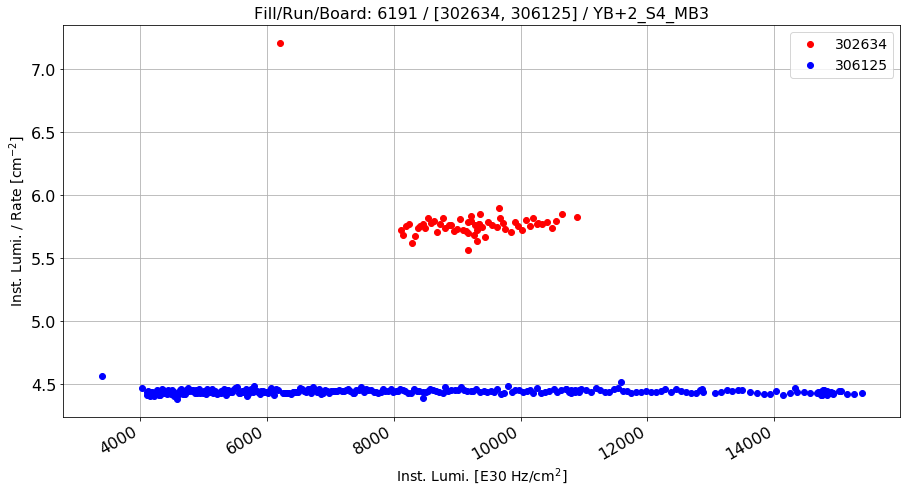

0.301036171345


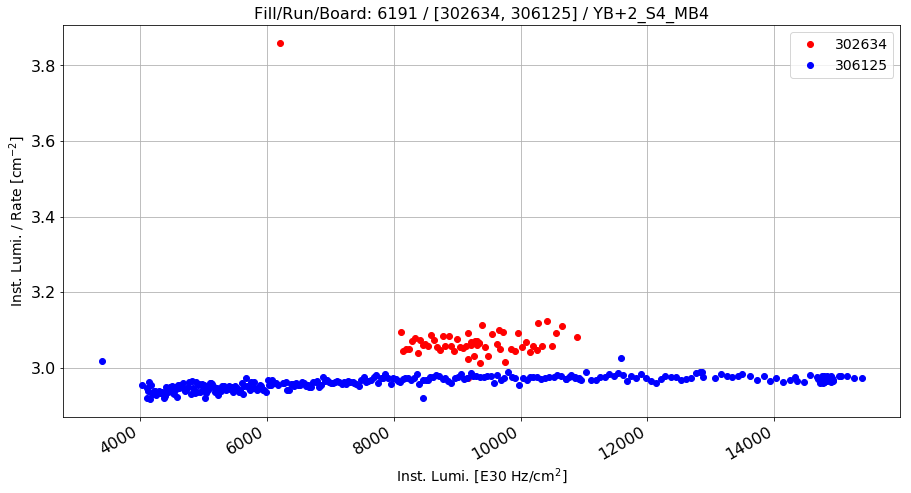

0.0390162423174


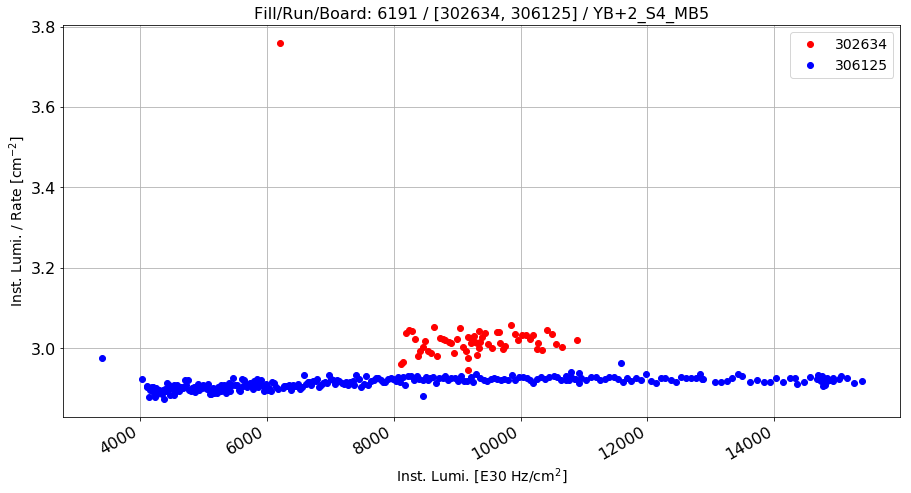

0.0385234216891


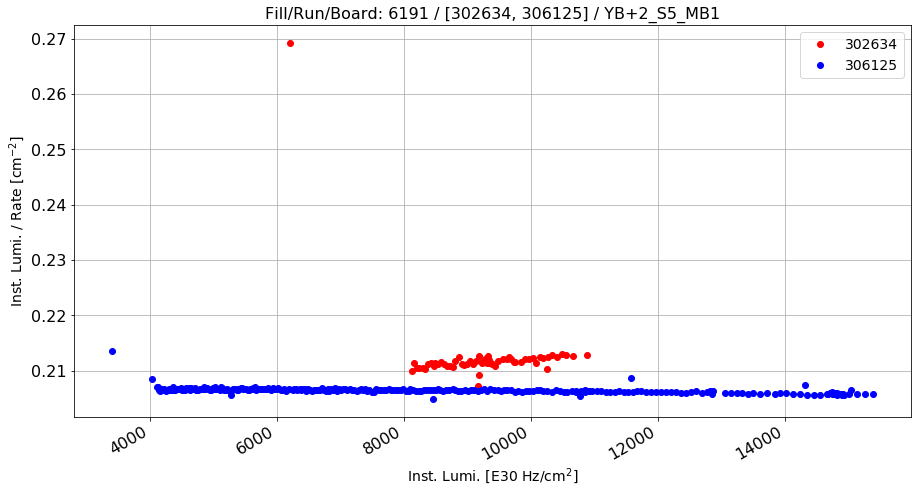

0.0291250311089


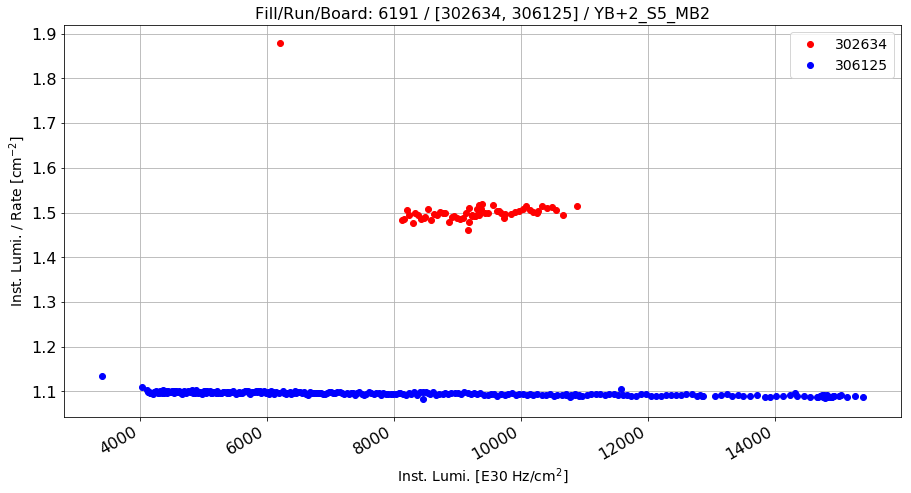

0.373172660957


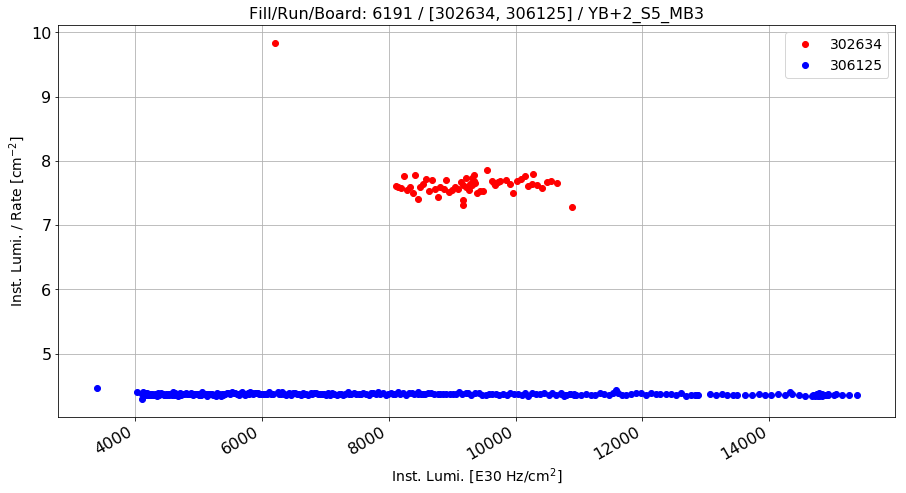

0.75140249082


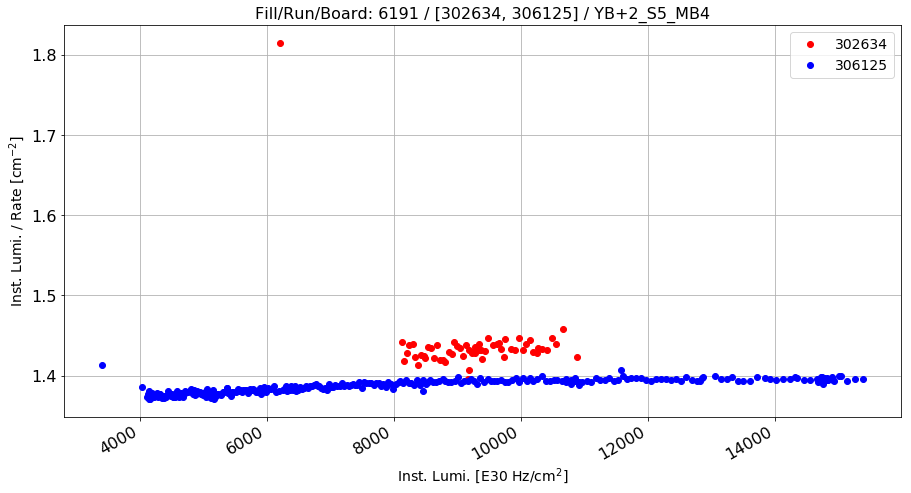

0.0365188364776


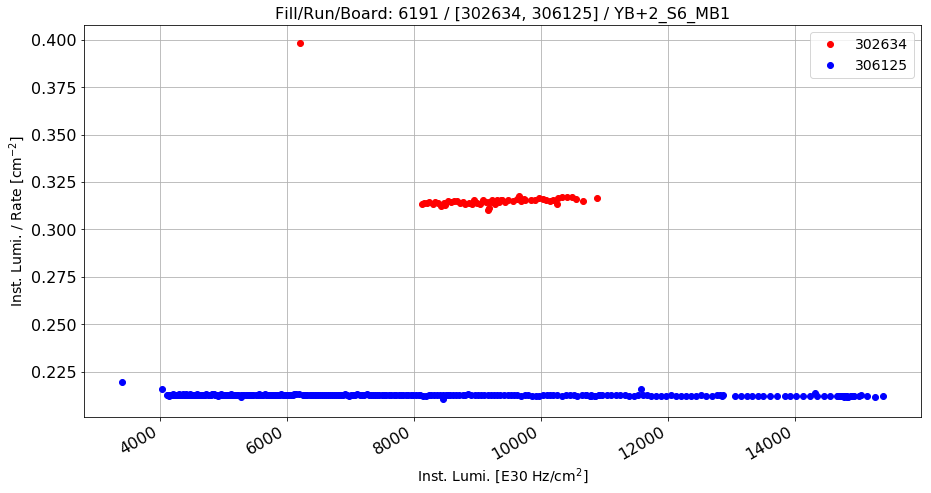

0.486824849837


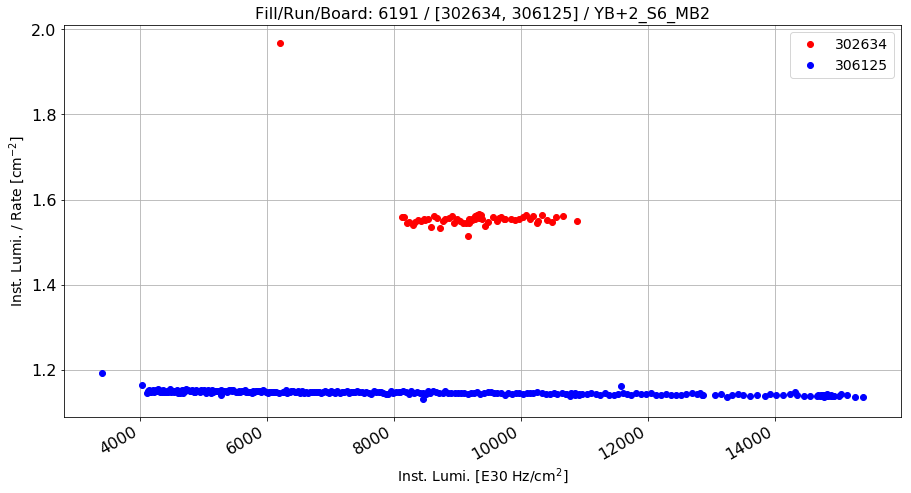

0.360167746912


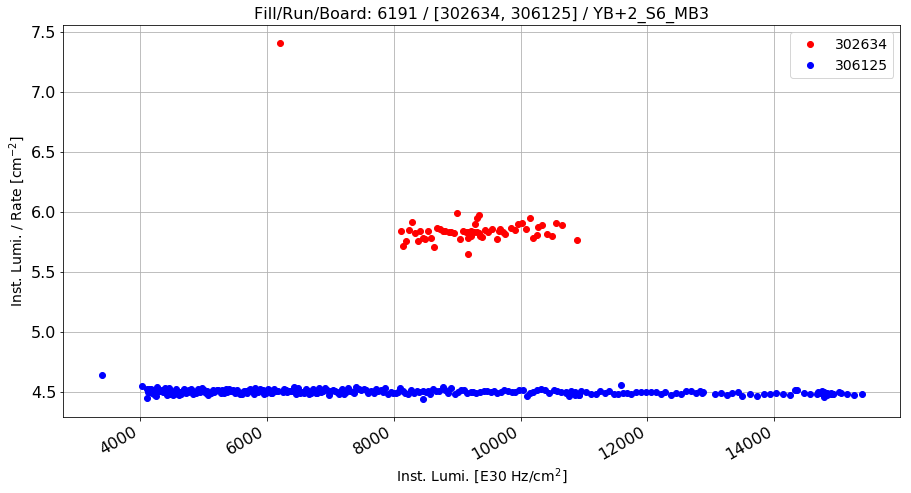

0.301561873322


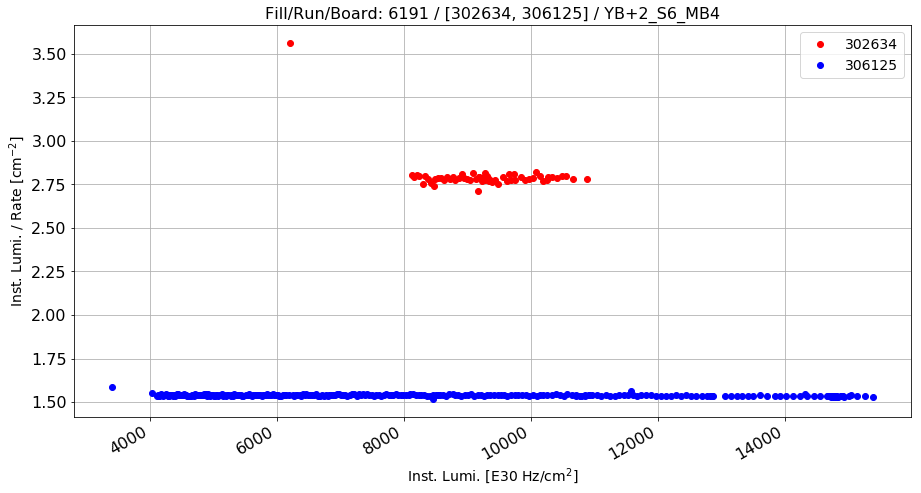

0.816049940772


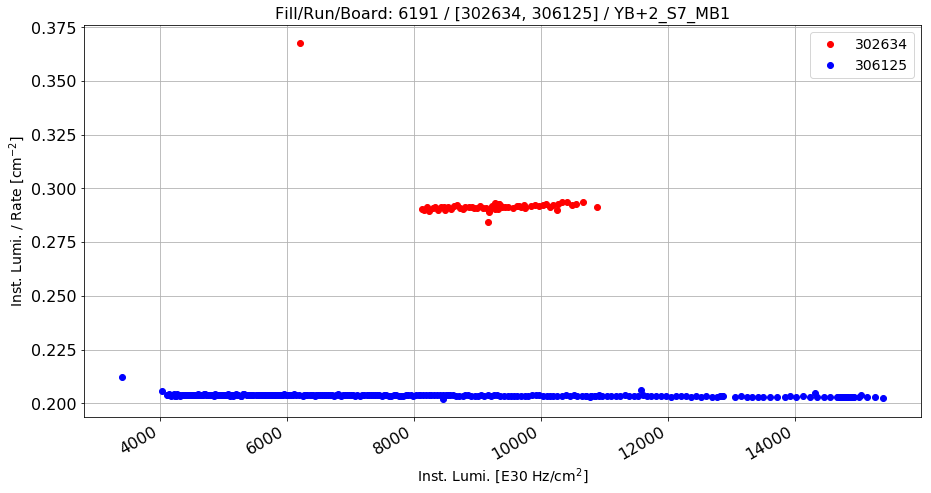

0.436693551289


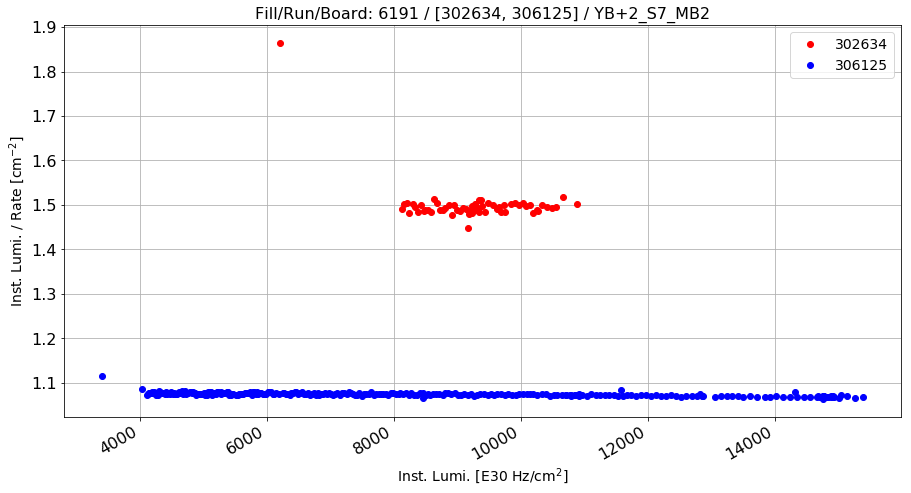

0.396244926784


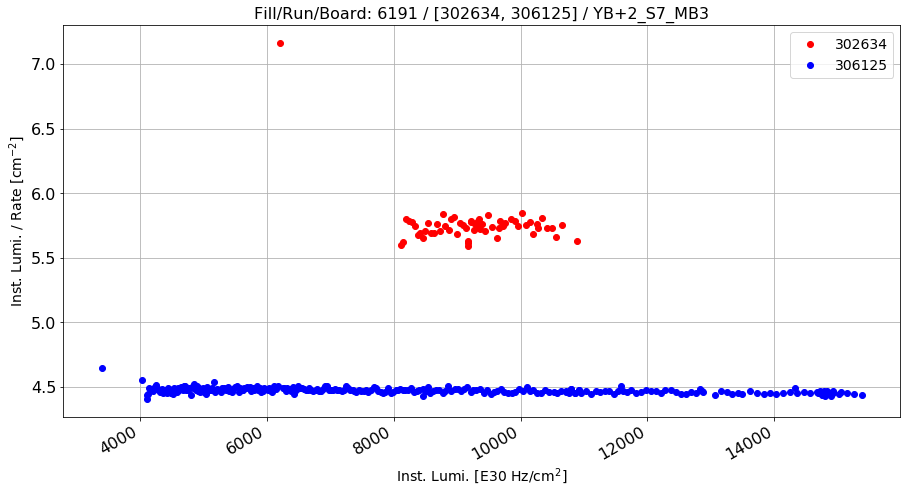

0.287386093921


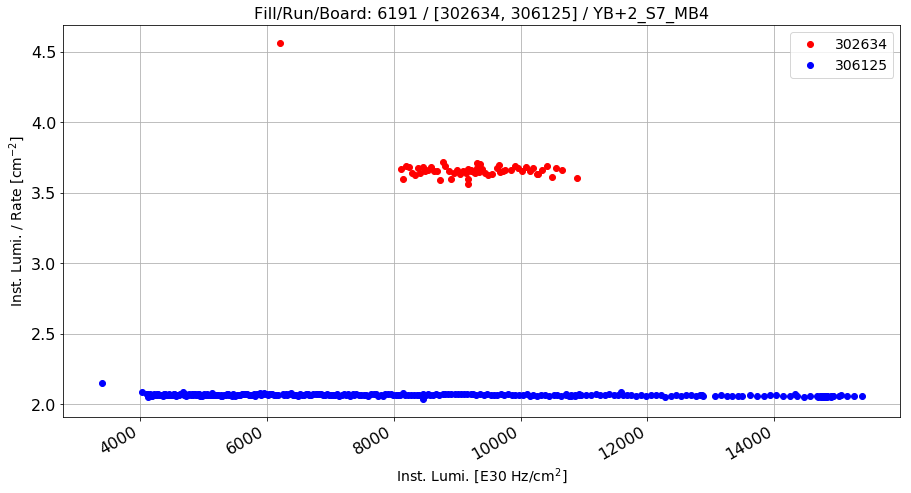

0.775990111368


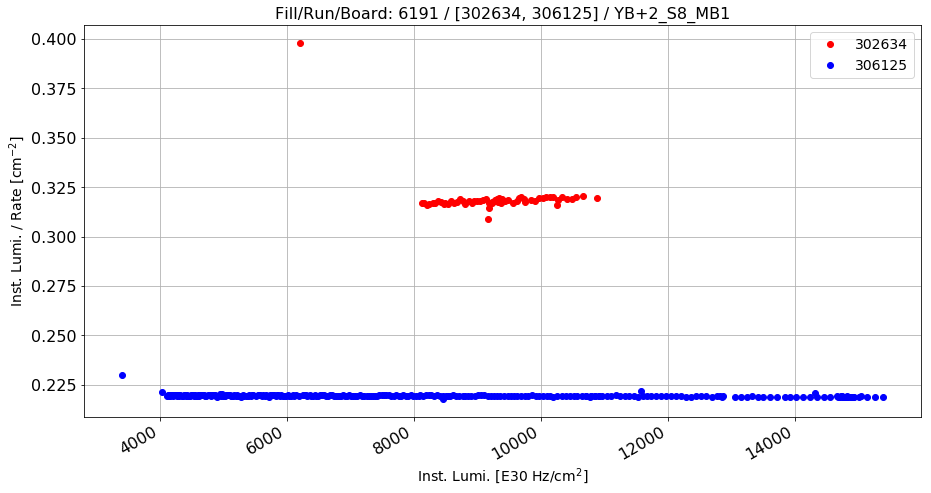

0.454874900204


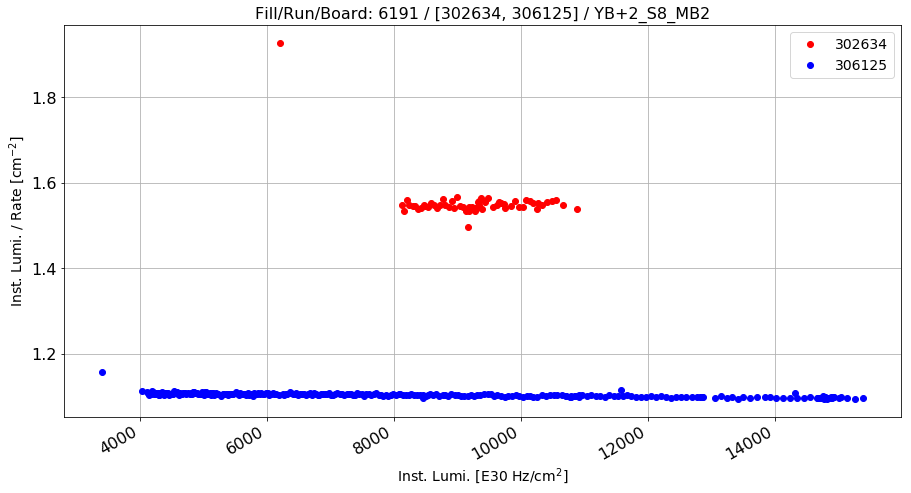

0.40749033242


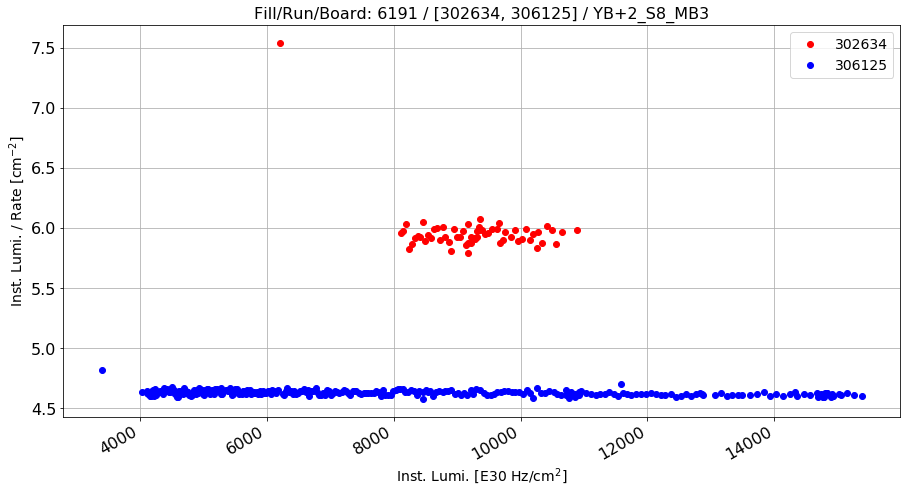

0.288619944579


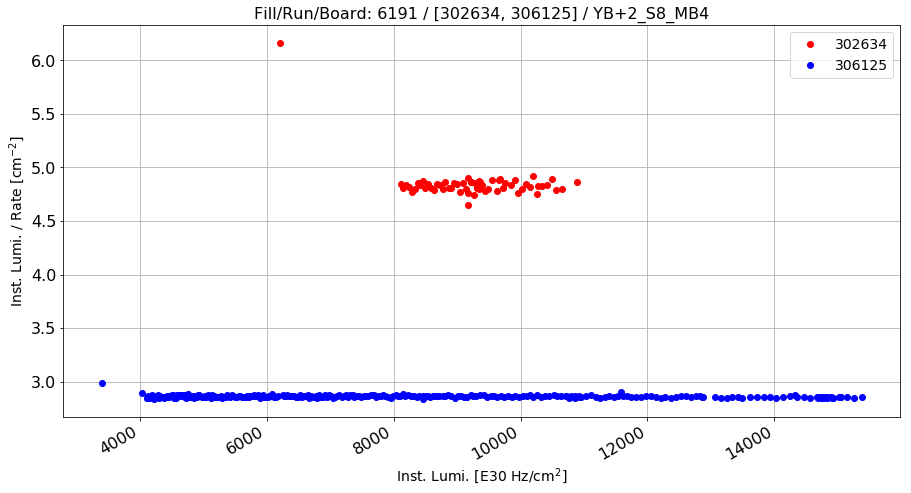

0.693010693517


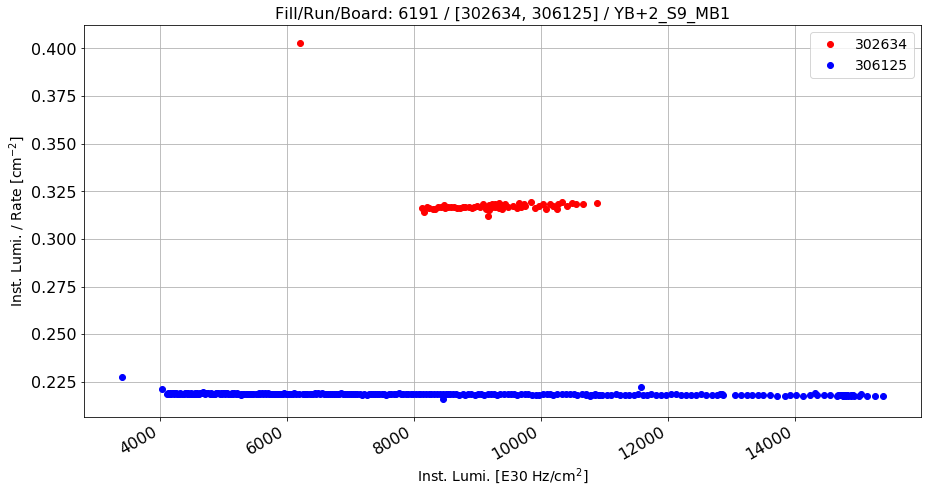

0.456886189917


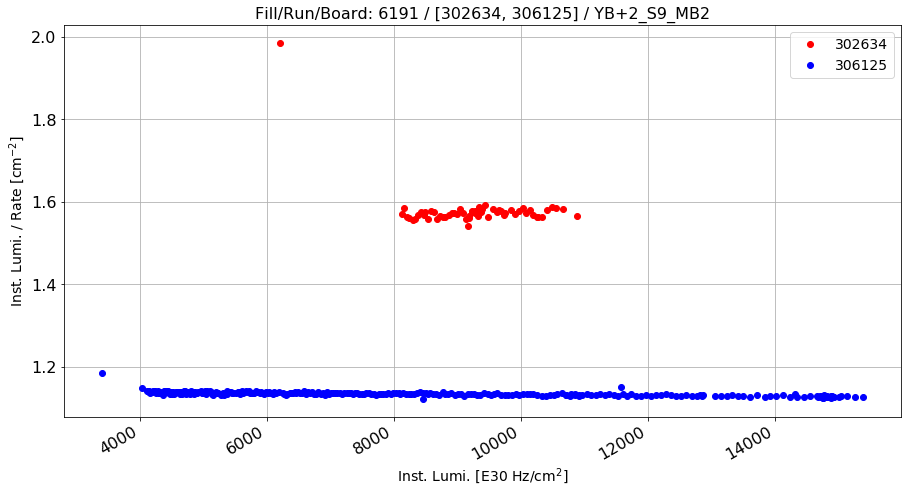

0.390520534151


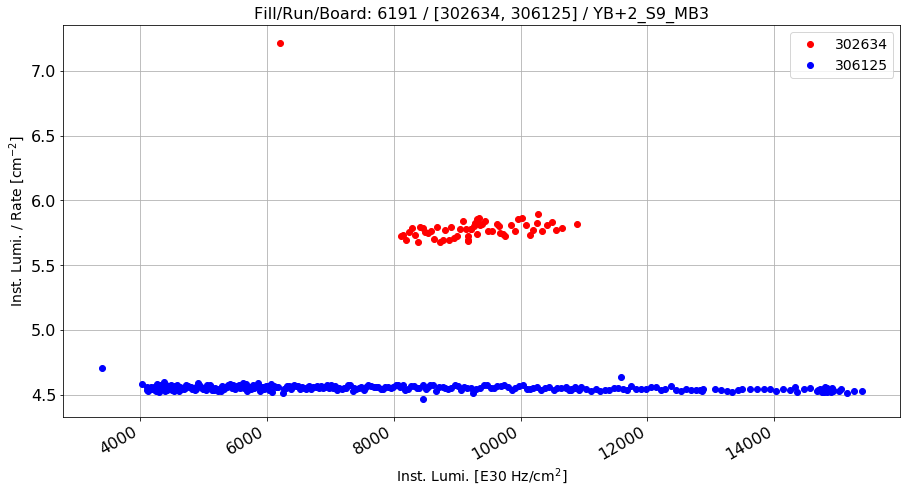

0.273457268052


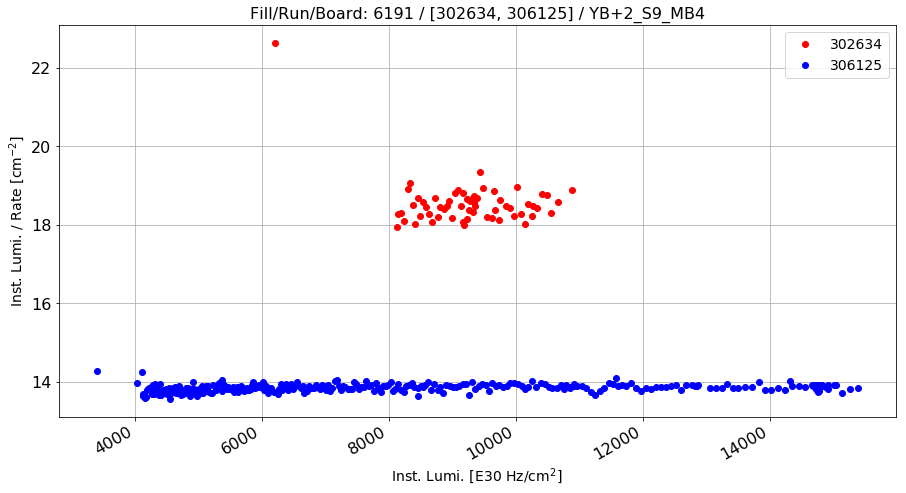

0.339128035833


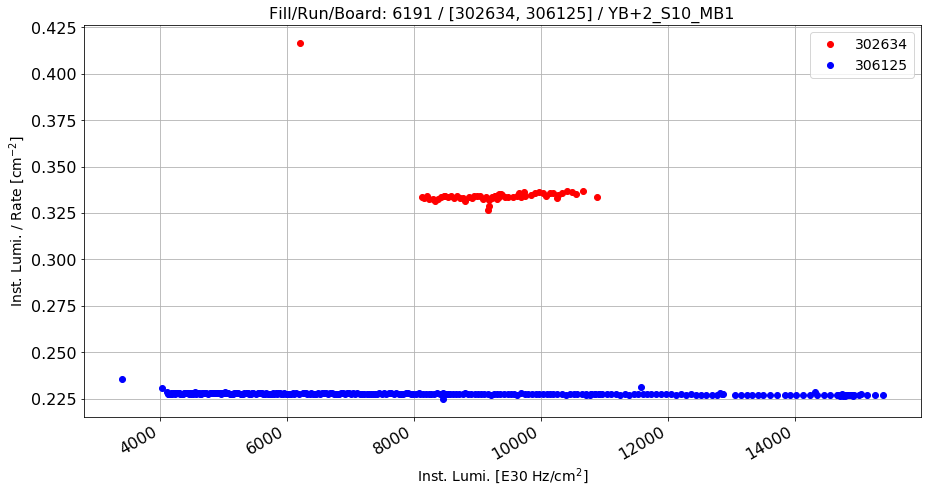

0.473108209644


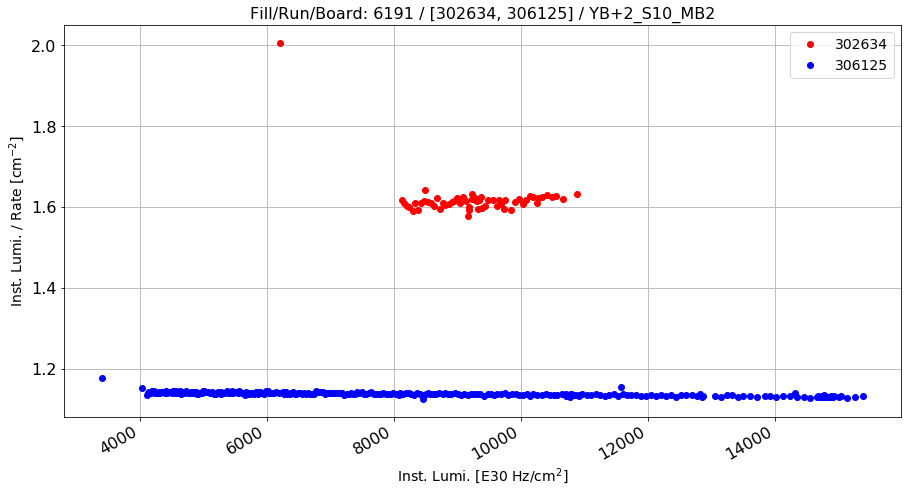

0.422923230195


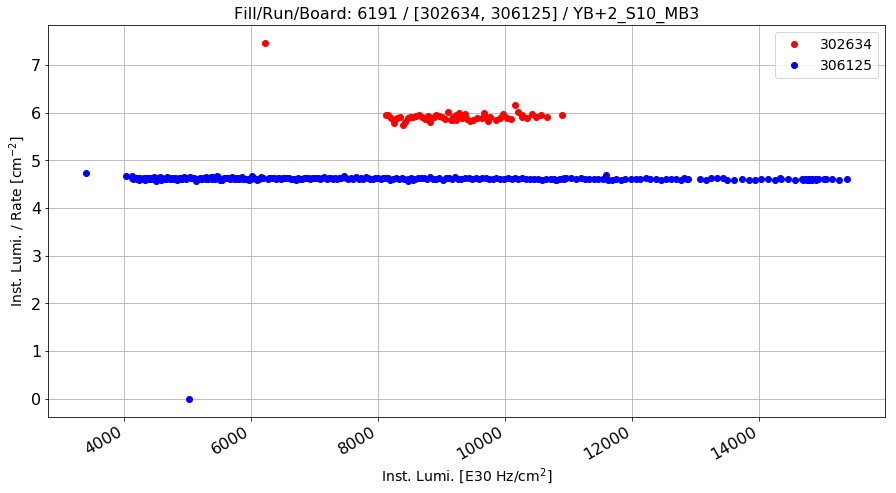

0.28965864242


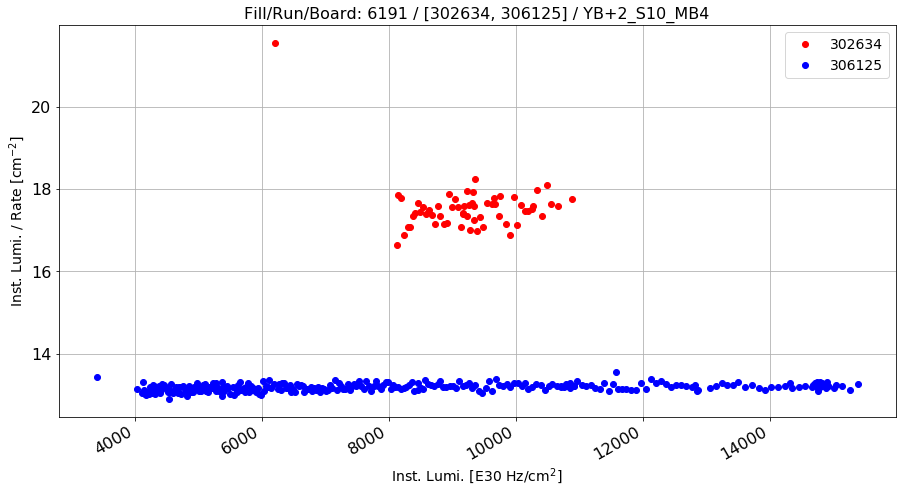

0.330419834154


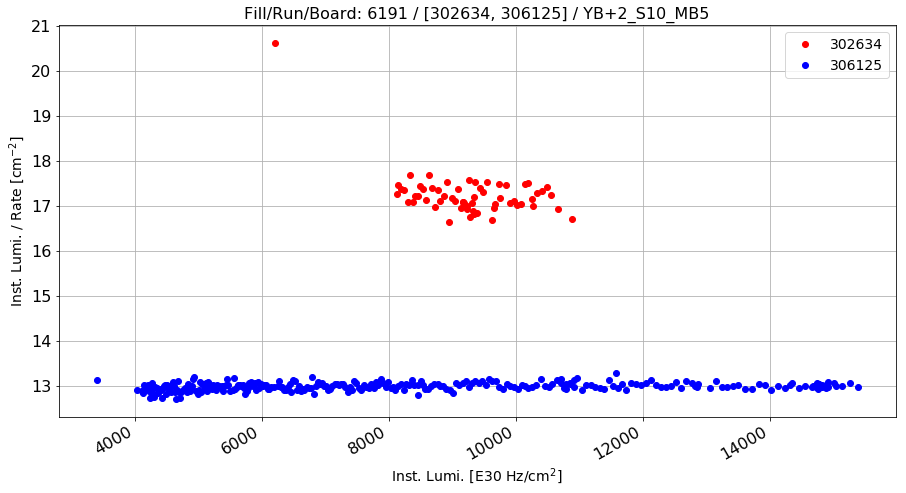

0.327854810991


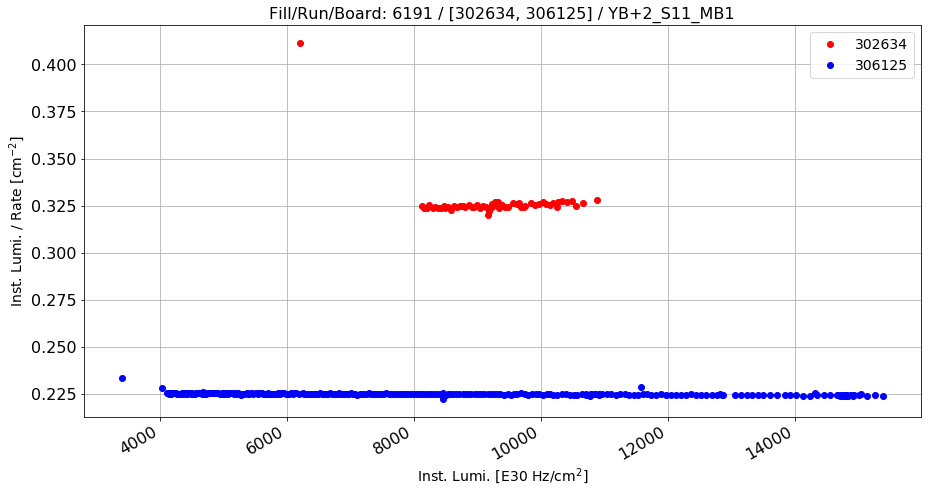

0.450319359458


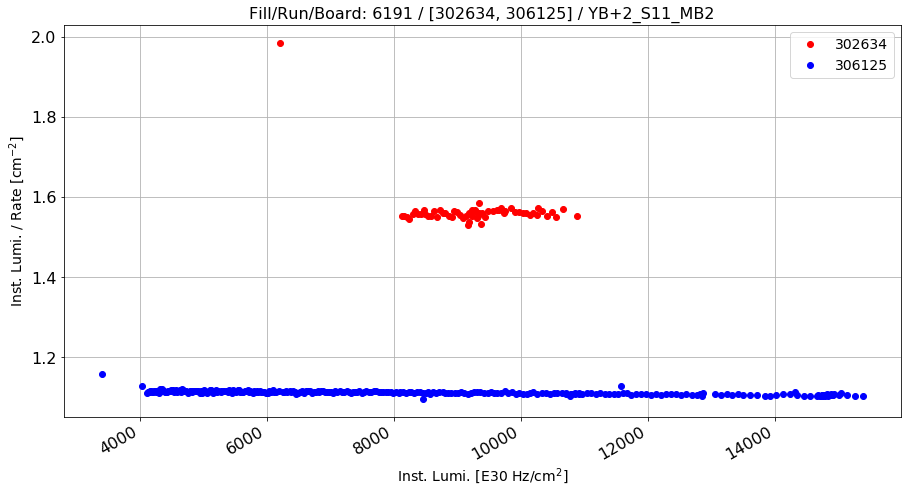

0.407532197116


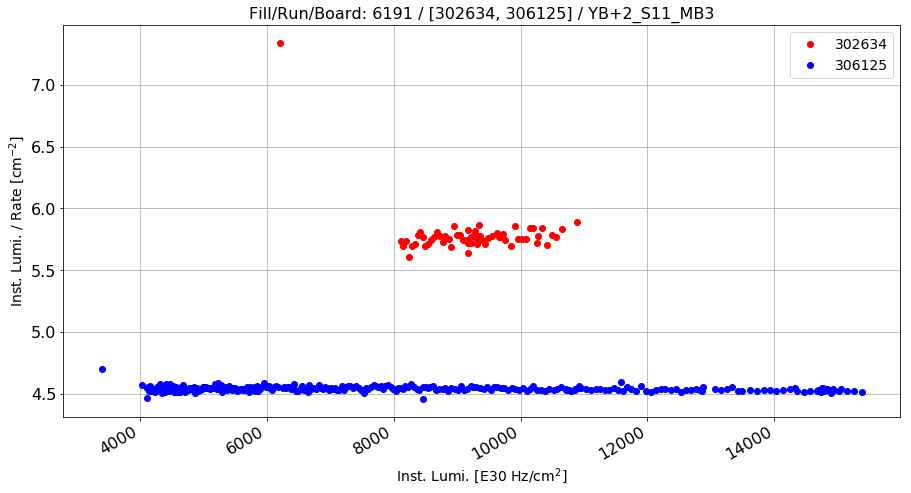

0.274470131953


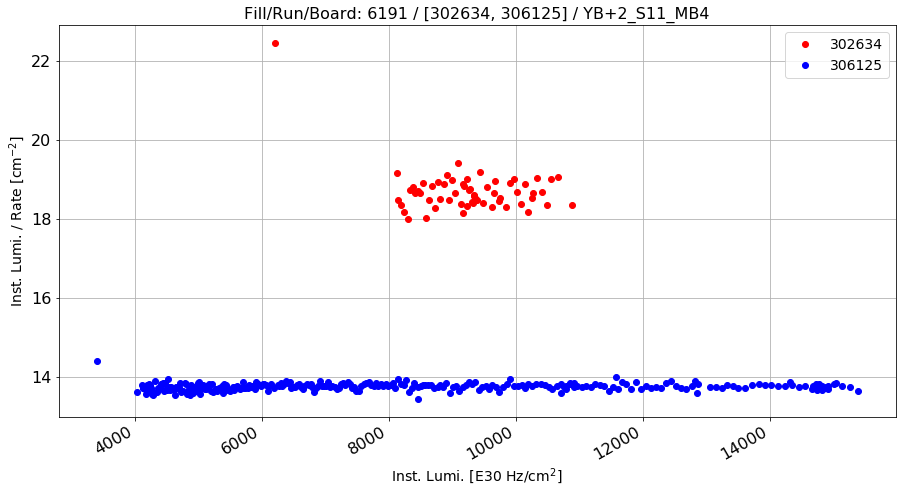

0.359325533158


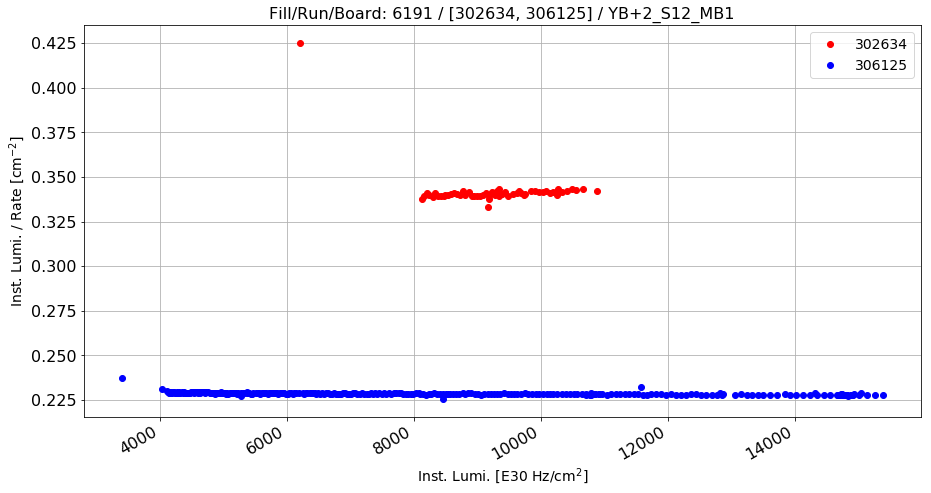

0.495797091891


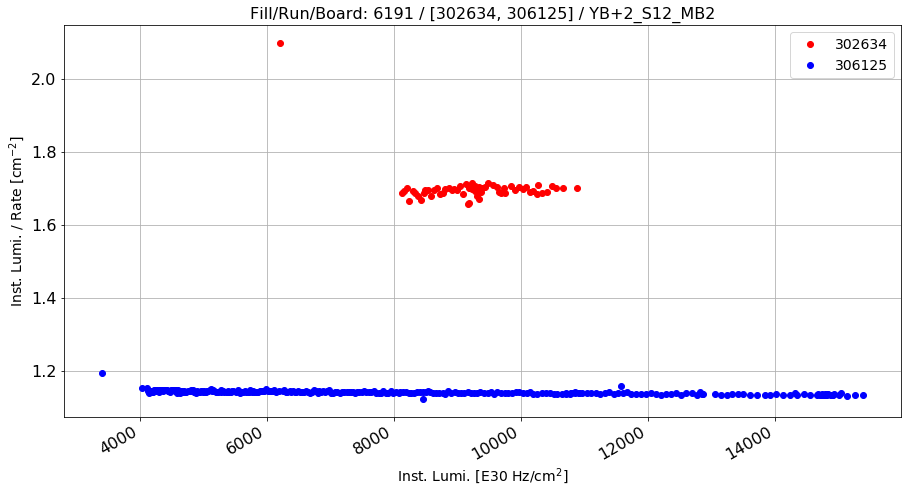

0.48961308785


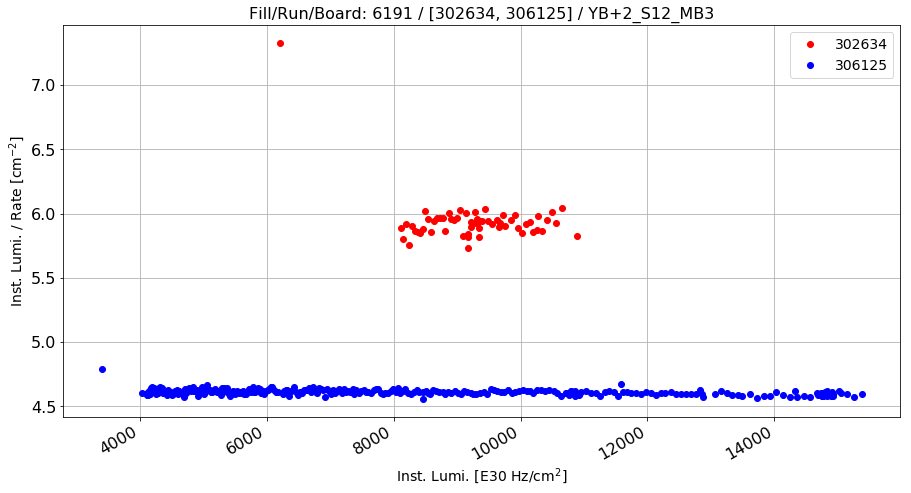

0.288147552393


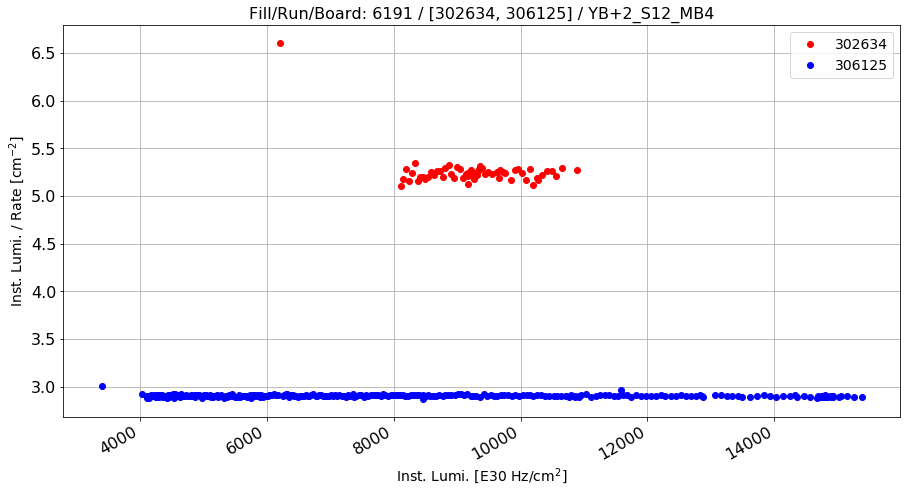

0.808387176621


In [294]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio"])
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[302634, 306125]")+" / " + board + "_MB" + str(k)
            (a, b, c) = plot_ratio_vs_ls(df_rates, [302634, 306125], "lumi", station, board, 0,\
                            "errDT1", "Inst. Lumi. [E30 Hz/cm$^2$]", 
                            "Inst. Lumi. / Rate [cm$^{-2}$]", title, ["ro", "bo"], False)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c},\
                                 ignore_index = True)
            print c

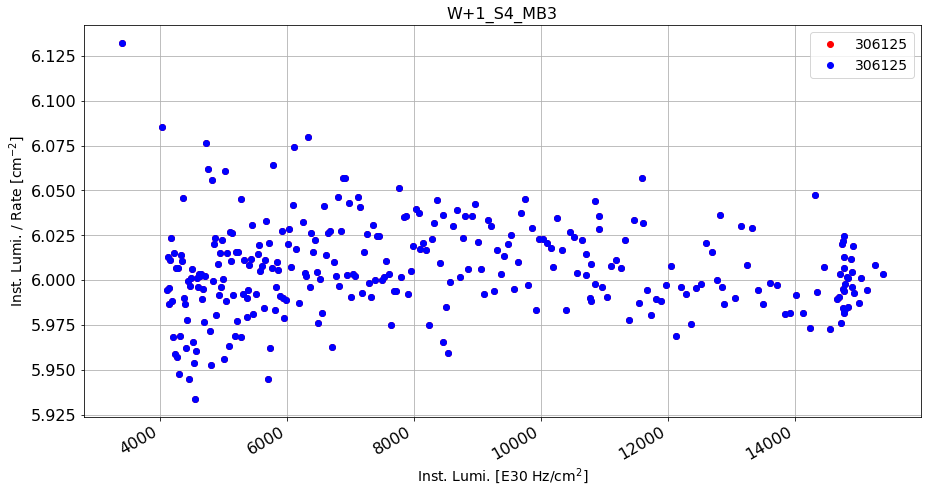

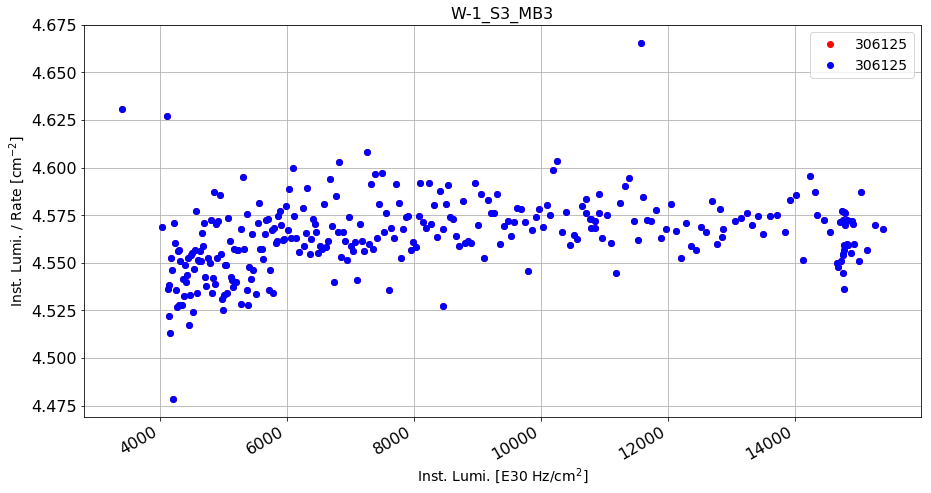

6.00634596659 4.56428523583 0.315944481172


In [162]:
(a1, b1, c1) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB+1_S4", 0,\
                            "errDT3", "Inst. Lumi. [E30 Hz/cm$^2$]", 
                            "Inst. Lumi. / Rate [cm$^{-2}$]", "W+1_S4_MB3", ["ro", "bo"], False)
(a2, b2, c2) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB-1_S3", 0,\
                            "errDT3", "Inst. Lumi. [E30 Hz/cm$^2$]", 
                            "Inst. Lumi. / Rate [cm$^{-2}$]", "W-1_S3_MB3", ["ro", "bo"], False)
print a1, a2, abs(a1-a2)/a2
value = abs(a1-a2)/a2

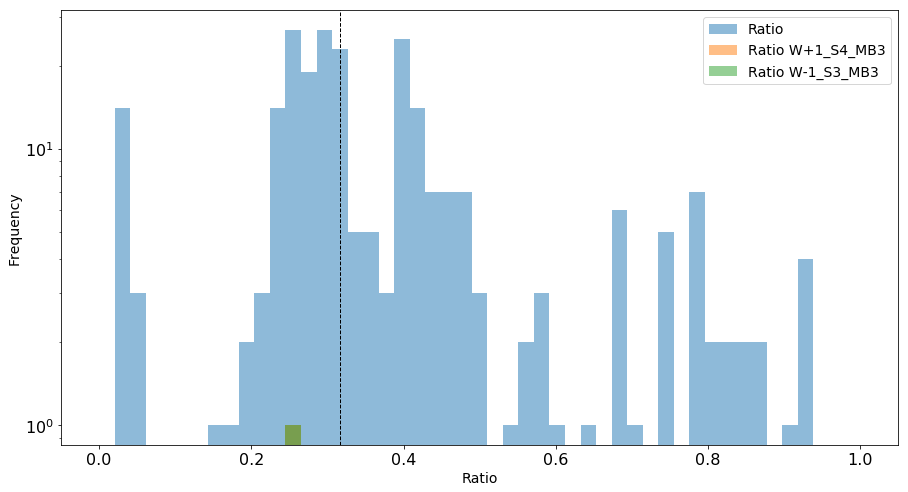

In [295]:
fig, ax = plt.subplots()
ax.set_yscale('log')
bins = np.linspace(0, 1, 50)
rule1 = (ratio.wheel == 1) & (ratio.sector == 4) & (ratio.station == 3)
rule2 = (ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)
plt.hist(ratio["ratio"], bins=bins, alpha=0.5, label="Ratio")
plt.hist(ratio[rule1]["ratio"], bins=bins, alpha=0.5, label="Ratio W+1_S4_MB3")
plt.hist(ratio[rule2]["ratio"], bins=bins, alpha=0.5, label="Ratio W-1_S3_MB3")
plt.title("")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Ratio')
plt.axvline(value, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [296]:
print "Total number of chambers:" ,len(ratio["ratio"].values)
count = np.where(ratio["ratio"].values > value)
print "Chambers over threshold: ", len(count[0])
print "Fraction of chambers over threshold:", float(len(count[0])) / len(ratio["ratio"].values)

Total number of chambers: 250
Chambers over threshold:  126
Fraction of chambers over threshold: 0.504


Create a new dataframe with the input features already organized in a numpy array:

In [50]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

29520
265680


In [51]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt='ro', ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

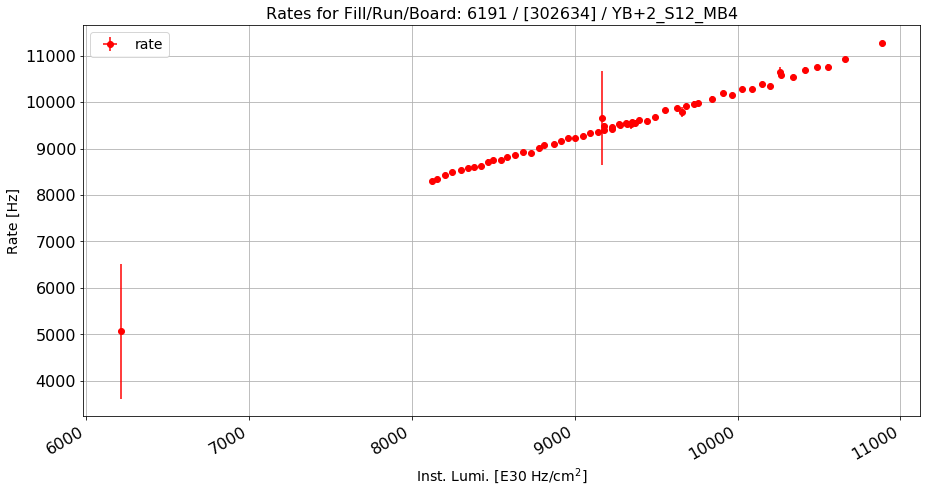

In [52]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[302634]")+" / " + board + "_MB" + str(k)
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [302634],\
                "lumi", "rate", "YB+1_S4", 0, "err", "Inst. Lumi. [E30 Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [53]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["lumi"]/df_rates_new["rate"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["rate"])*np.sqrt(df_rates_new["errLumi"]*df_rates_new["errLumi"] +\
                        df_rates_new["CS"]*df_rates_new["CS"]*df_rates_new["err"]*df_rates_new["err"])

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
4314
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
4314
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [54]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [55]:
print len(array)
print len(df_rates_new)

265680
265680


In [56]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [57]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [58]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

In [312]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print idx, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

Creating train and test samples:

In [314]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [315]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

123000 123000


In [316]:
#Scale the data
def scale_data(data):
    """Scales layer data using MaxAbsScaler"""
    # Need to reshape since scaler works per column
    data = data.reshape(-1, 1)
    scaler = MaxAbsScaler().fit(data)
    return scaler.transform(data).reshape(1, -1)

anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)

normalies["content"] = normalies["content"].apply(np.array)
normalies["content_scaled"] = normalies["content"].apply(scale_data)

In [317]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [318]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 3 3 7121.628625 3.2604384123343406 1258.0 18.4951731154761
 5.661072038950715 0.08326968214722012]
Anomalous chimney:
[2 1 4 3 7121.628625 3.2604384123343406 958.75 10.279574060103016
 7.428035071707954 0.07971485282851005]


In [319]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

During runs 302634 (All LS's) and 302635 (LS <= 404) one layer per station did not reach the correct HV, except for: MB1, MB4 in sectors 3, 4, 5 in wheels 2, -2, 0: 

In [320]:
def assignScore2(df, score, run, ls_in, ls_end, ls_string):
    temp = df.copy()
    rule = (temp["run"] == run)
    if ((ls_in != -1) & (ls_end != -1)):
        rule = rule & (temp[ls_string] >= ls_in) & (temp[ls_string] <= ls_end)
    elif (ls_in != -1):
        rule = rule & (temp[ls_string] >= ls_in)
    elif (ls_end != -1):
        rule = rule & (temp[ls_string] <= ls_end)
    indexes = temp[rule].index
    for w in indexes:
        temp.loc[w, "score"] = score

    #Correct score for the chambers with normal HV
    for i in [-2, 0, 2]: #wheels that are ok
        for j in [3, 4, 5]: #sectors that are ok
            #if (i == 0):
            #    range_ = [1]
            #else:
            #    range_ = [1, 4]
            for k in [1, 4]: #stations that are ok
                rule = (temp["run"] == run) & (temp["wheel"] == i) \
                        & (temp["sector"] == j) & (temp["station"] == k)
                indexes = temp[rule].index
                for w in indexes:
                    temp.loc[w, "score"] = -1
    return temp

In [321]:
rule = ((anomalies["wheel"] == 2) & (anomalies["sector"] == 3) & (anomalies["station"] == 1))
print anomalies[rule]["score"].iloc[1]
temp = assignScore2(anomalies, 1, 302634, -1, -1, "group")
anomalies = temp
#temp = assignScore2(temp, 1, 302635, 1, 404, "group")
anomalies = temp
print anomalies[rule]["score"].iloc[1]

-1
-1


Preparing samples and envirement for making some inference:

In [67]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

Testing on the high rate issue:

In [322]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 302634) | (anomalies.run == 306125)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 90500
Normalies: 76047
Anomalies 14453


In [323]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

Making an inference using the model and the test sample:

In [324]:
ann_model_1 = load_model("./model_keras/ann_1.h5")
ann_model_2 = load_model("./model_keras/ann_2.h5")
ann_model_3 = load_model("./model_keras/ann_3.h5")
ann_model_4 = load_model("./model_keras/ann_4.h5")

In [325]:
layers_test["ann_score_1"] = ann_model_1.predict(np.array(test_x))[:, 1]
layers_test["ann_score_2"] = ann_model_2.predict(np.array(test_x))[:, 1]
layers_test["ann_score_3"] = ann_model_3.predict(np.array(test_x))[:, 1]
layers_test["ann_score_4"] = ann_model_4.predict(np.array(test_x))[:, 1]

In [326]:
cae_model = load_model("./model_keras/cae.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [327]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity
    
print "DNN:"
specificity_ann, sensitivity_ann = benchmark(layers_test["score"], layers_test["ann_score_4"], 0.5)
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.055)

DNN:
Model accuracy: 0.8776
Model sensitivity: 0.2338
Model specificity: 1.0
AE:
Model accuracy: 0.8682
Model sensitivity: 0.1963
Model specificity: 0.9959


In [688]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

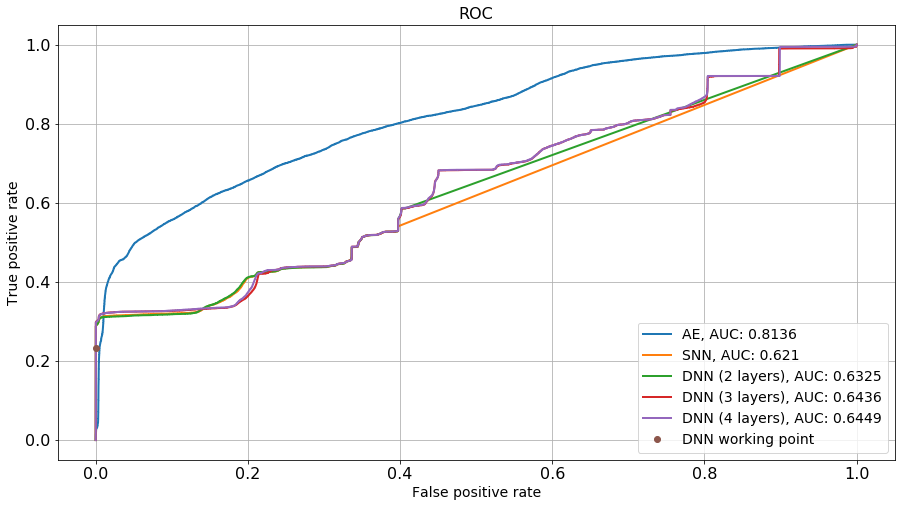

In [689]:
get_roc_curve(layers_test, 
              [
               ("AE", "cae_score"),
               ("SNN", "ann_score_1"),
               ("DNN (2 layers)", "ann_score_2"),
               ("DNN (3 layers)", "ann_score_3"),
               ("DNN (4 layers)", "ann_score_4"),
               ], (specificity_ann, sensitivity_ann))

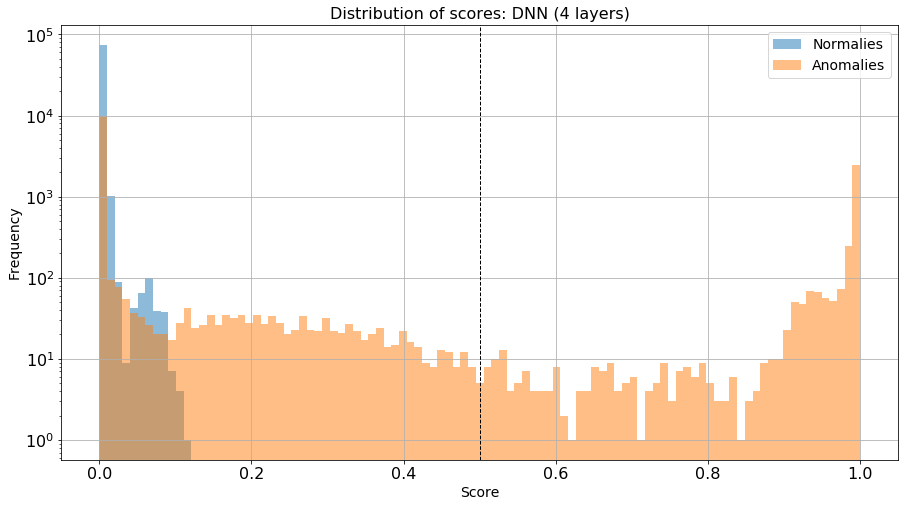

In [690]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["ann_score_4"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["ann_score_4"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: DNN (4 layers)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

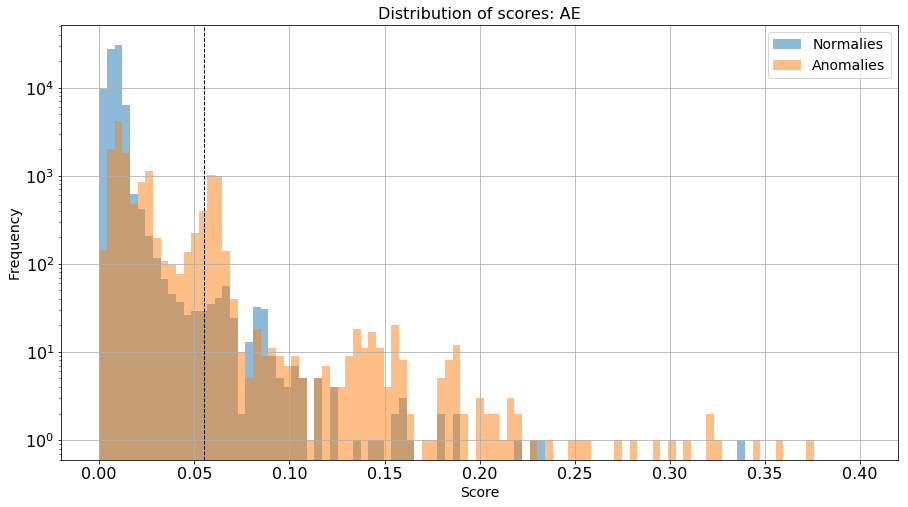

In [691]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.4, 100)
plt.hist(layers_test[layers_test["score"] < 0]["cae_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["cae_score"], bins=bins, alpha=0.5, label="Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

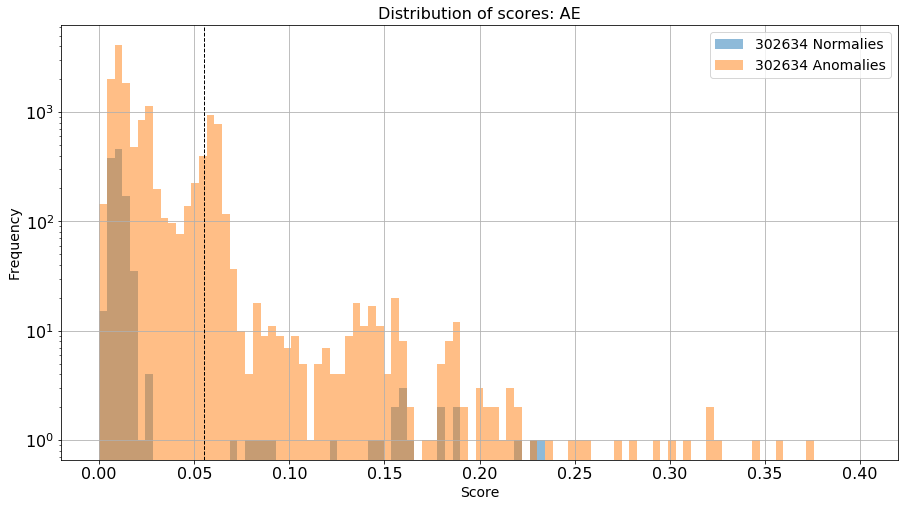

In [692]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.4, 100)
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Normalies")
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Anomalies")
#plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] < 0)]["cae_score"],\
#         bins=bins, alpha=0.5, label="306125 Normalies")
#plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] > 0)]["cae_score"],\
#         bins=bins, alpha=0.5, label="306125 Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

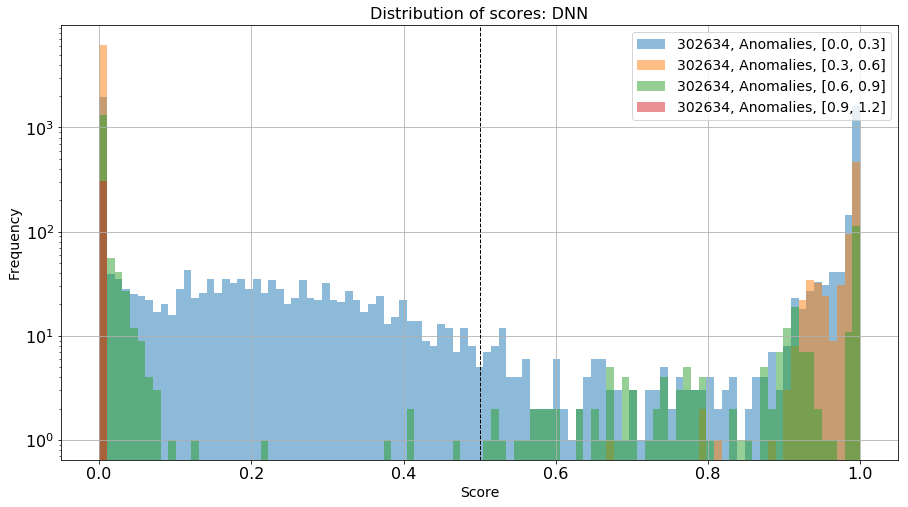

In [693]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 3))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.3))
    plt.hist(layers_test[rule & rule_r ]["ann_score_4"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.3)+"]")
plt.title("Distribution of scores: DNN")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

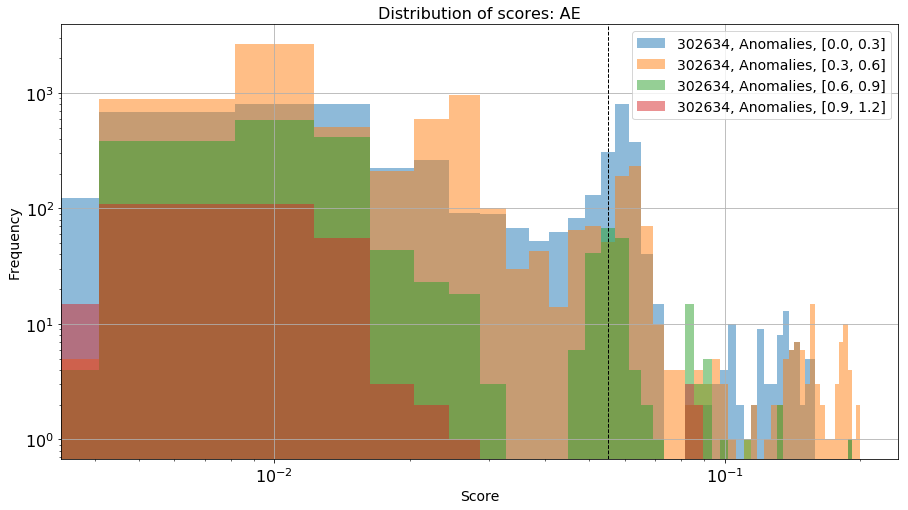

In [694]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
ax.set_xscale('log')
bins = np.linspace(0, 0.2, 50)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 3))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.3))
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.3)+"]")
plt.title("Distribution of scores: AE")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

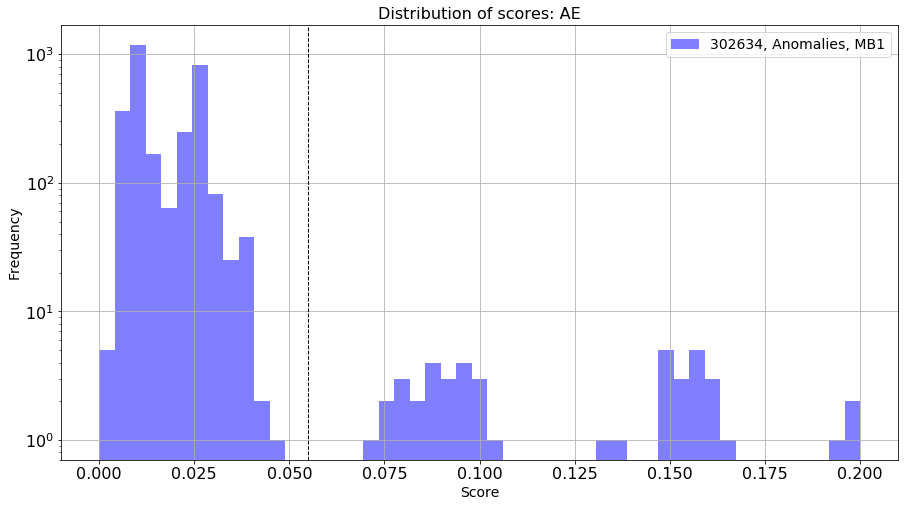

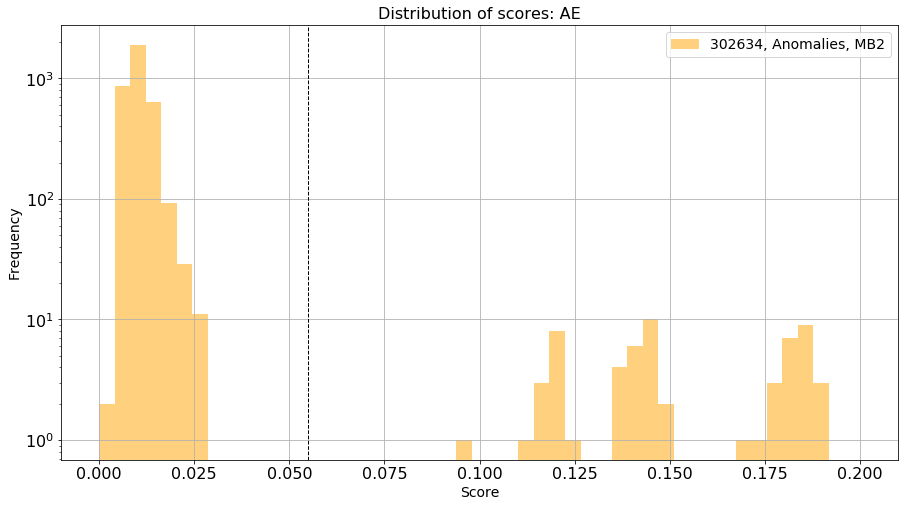

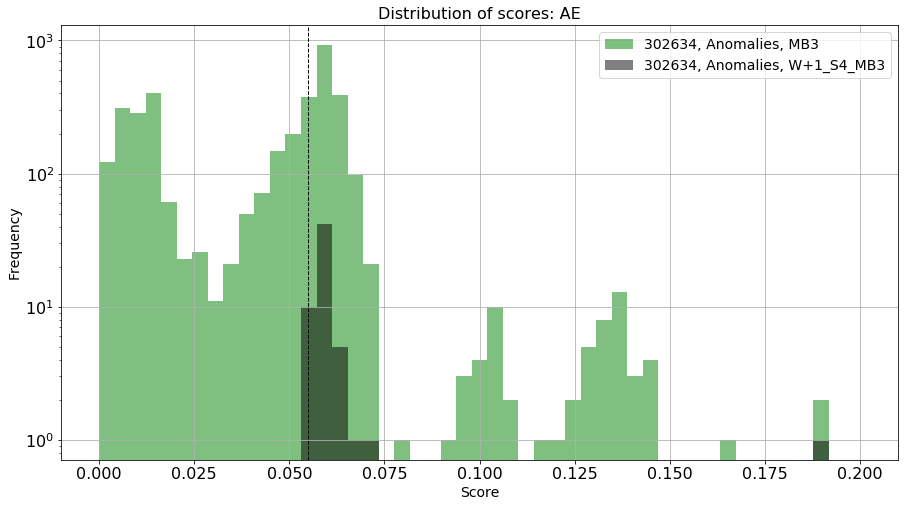

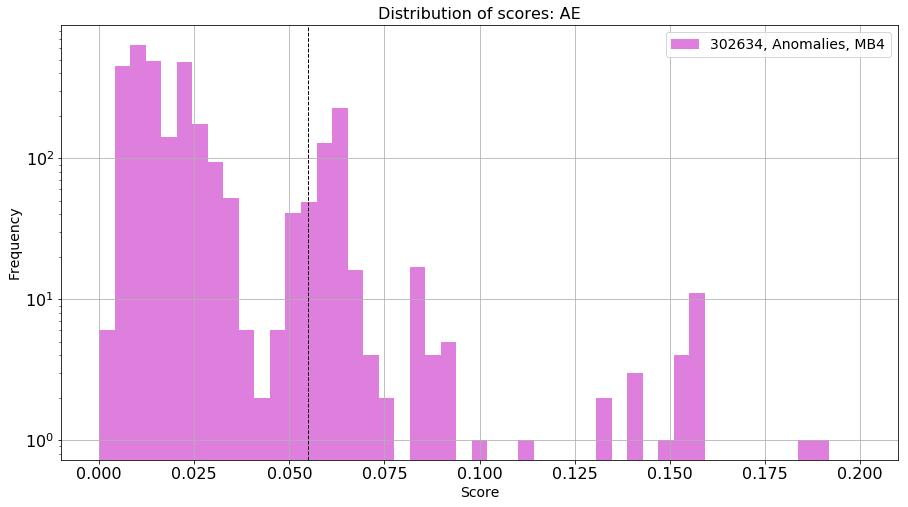

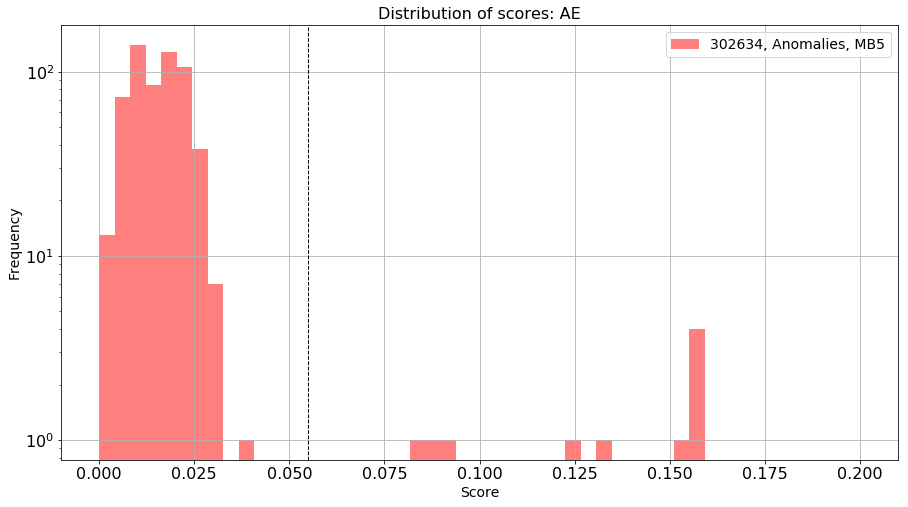

In [695]:
bins = np.linspace(0, 0.2, 50)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
colors = ["b", "orange", "g", "m", "r"]
for h in range(1, 6):
    fig, ax = plt.subplots()
    ax.set_yscale('log')
    ax.grid()
    #ax.set_xscale('log')
    #print h
    rule_r = (layers_test.station == h)
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, MB"+str(h),\
             color=colors[h-1],\
             histtype = "bar")
    if (h ==3):
        rule_k = (layers_test.sector == 4) & (layers_test.wheel == +1)
        plt.hist(layers_test[rule & rule_r & rule_k]["cae_score"],\
             bins=bins, alpha=0.5, label="302634, Anomalies, W+1_S4_MB"+str(h),\
                 color="k",\
                 histtype = "bar")
    plt.title("Distribution of scores: AE")
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Score')
    plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
    plt.show()

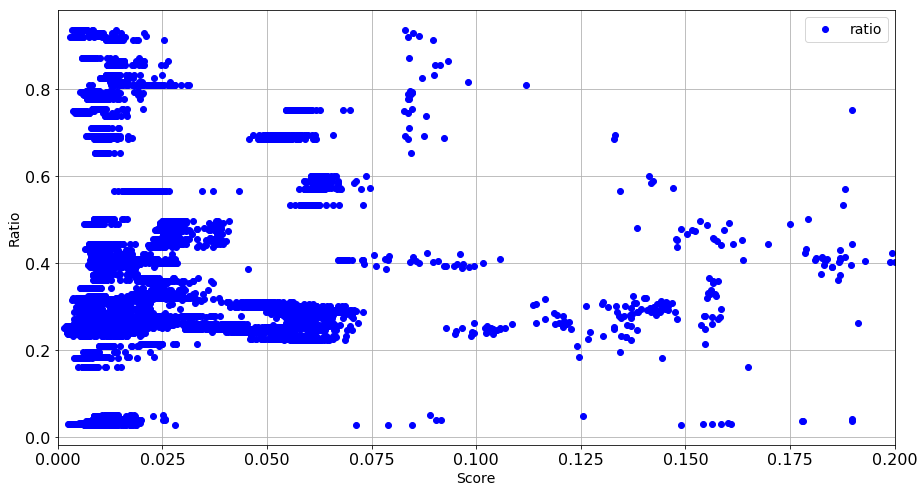

In [434]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Score")
plt.ylabel("Ratio")
plt.xlim(0, 0.2)
ax.grid()
rule = (layers_test.run == 302634) #& (layers_test.board == "YB+1_S3")
plt.plot(layers_test[rule]["cae_score"], layers_test[rule]["ratio"], 'bo')
plt.title("")
plt.legend(loc='best')
plt.show()

In [79]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[  9.99921101e-01   7.88985759e-05]
 [  7.04006089e-01   2.95993911e-01]]


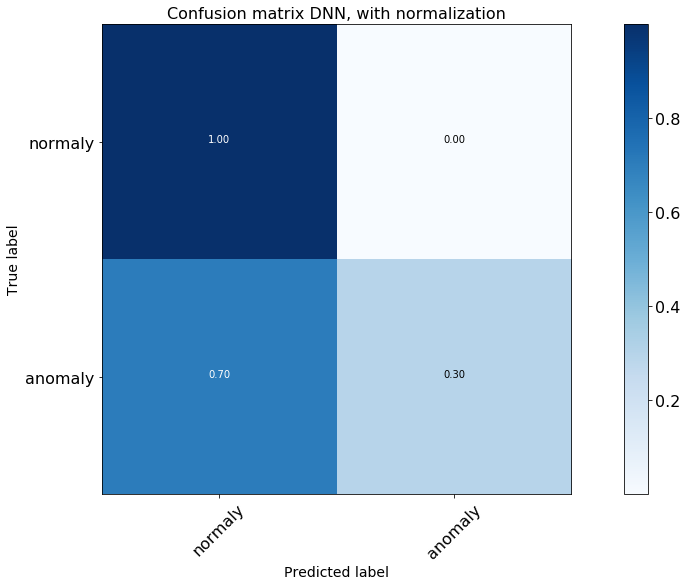

In [183]:
th_DNN = 0.1
y_pred = 2*(layers_test["ann_score_4"] > th_DNN)-1
layers_test["score"] = 2*(layers_test["score"] > th_DNN)-1

cnf_matrix = confusion_matrix(layers_test["score"], y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix DNN, with normalization')

Normalized confusion matrix
[[ 0.99588412  0.00411588]
 [ 0.80370857  0.19629143]]


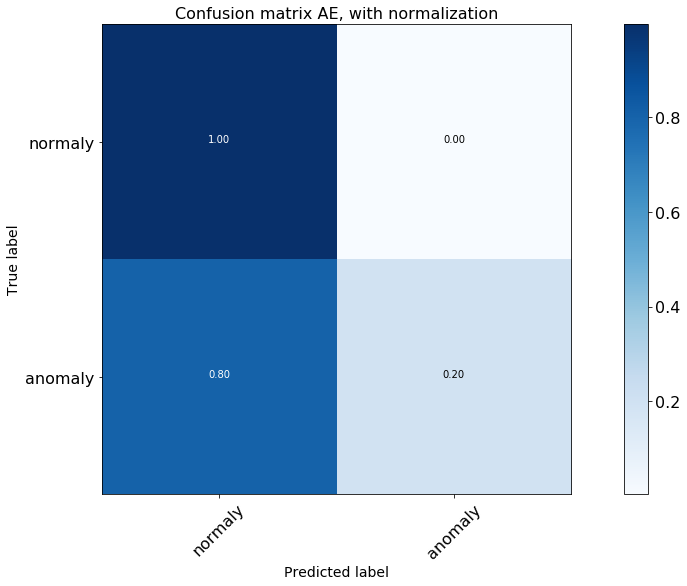

In [413]:
th_AE = 0.055
y_pred = 2*(layers_test["cae_score"] > th_AE)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

In [189]:
print "Number of FPs for the DNN:", len(layers_test[(layers_test["score"] == -1) &\
                                                    (layers_test["ann_score_4"] > th_DNN)])

Number of FPs for the DNN: 6


In [414]:
print "Number of FPs for the AE:", len(layers_test[(layers_test["score"] == -1) &\
                                                   (layers_test["cae_score"] > th_AE)])

Number of FPs for the AE: 313


In [415]:
layers_test["name"] = ("W" + layers_test["wheel"].astype(str) + "_S" + layers_test["sector"].astype(str) +\
       "_St" + layers_test["station"].astype(str))

Where are the FPs located?

In [416]:
def count_fp(df, dis_nn, th, filt):
    df_temp = df[(layers_test["score"] == -1) & (layers_test[dis_nn] > th)].copy()
    df_temp = df_temp.groupby(['run', 'wheel', 'sector', 'station', 'name']).size().reset_index(name='counts')
    if filt:
        df_temp = df_temp[df_temp["counts"] > 1]
    #print df_temp
    return len(df_temp), df_temp

num_fp_ann, fp_ann = count_fp(layers_test, "ann_score_4", th_DNN, False)
num_fp_cae, fp_cae = count_fp(layers_test, "cae_score", th_AE, True)

print "Number of chambers with false positives DNN:", num_fp_ann
print "Number of chambers with false positives AE:", num_fp_cae
fp_cae.set_index("name",drop=True,inplace=True)
fp_ann.set_index("name",drop=True,inplace=True)

Number of chambers with false positives DNN: 1
Number of chambers with false positives AE: 93


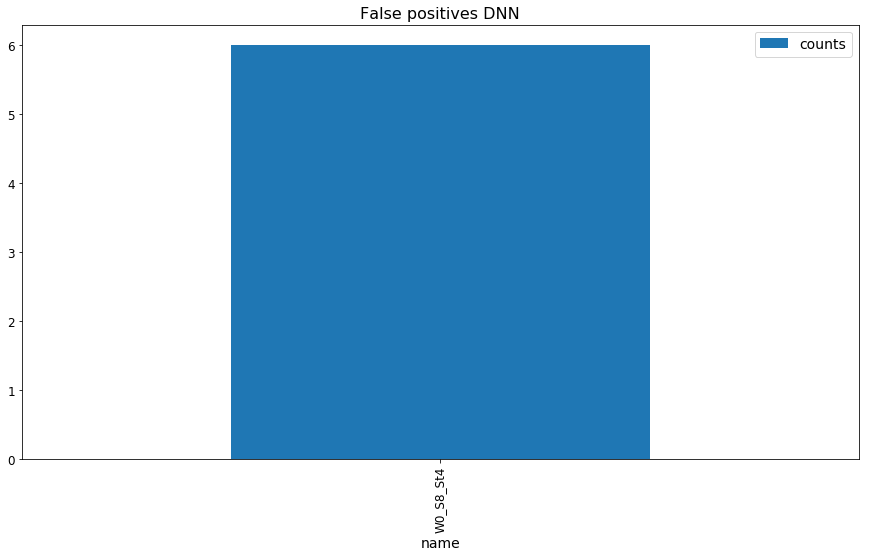

In [193]:
fp_ann["counts"].plot(kind='bar', title ="False positives DNN", legend=True, fontsize=12)

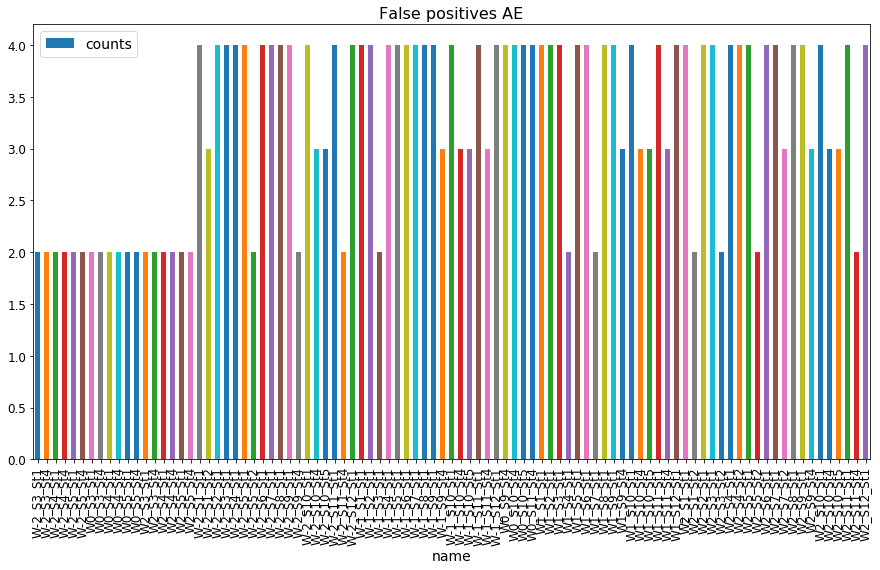

In [417]:
fp_cae["counts"].plot(kind='bar', title ="False positives AE", legend=True, fontsize=12)

In [88]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [405]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [306]:
def plot_scatter_2(df, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule]["ratio"].values)
        if (i == 5):
            tmp = list(temp[rule]["ratio"].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

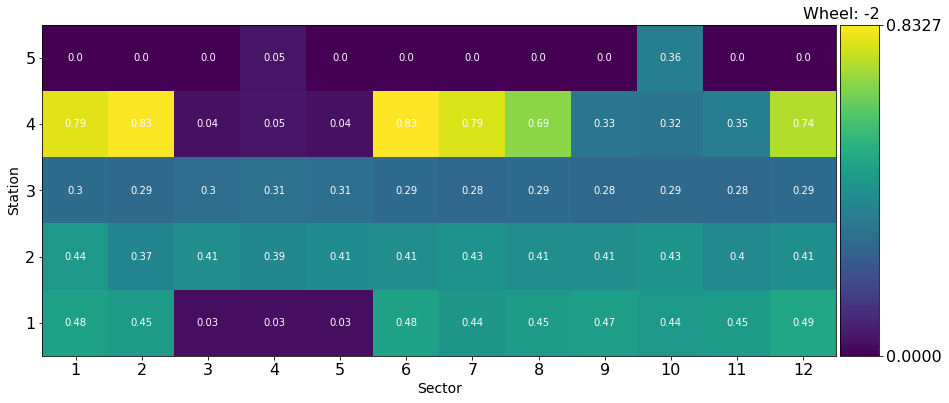

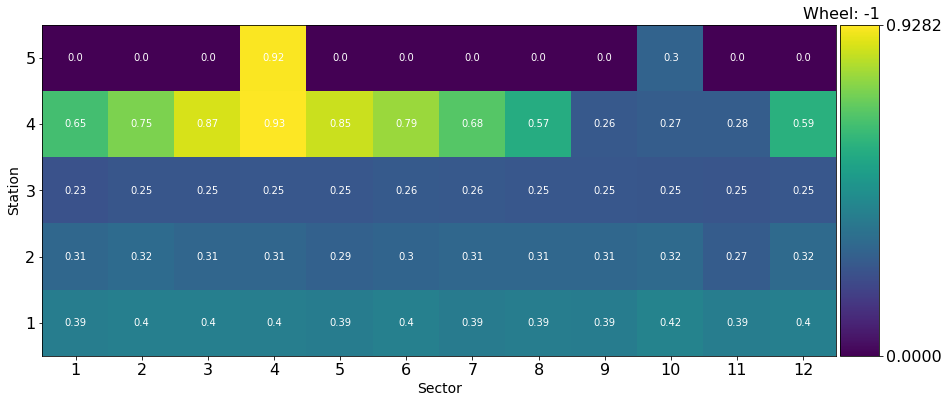

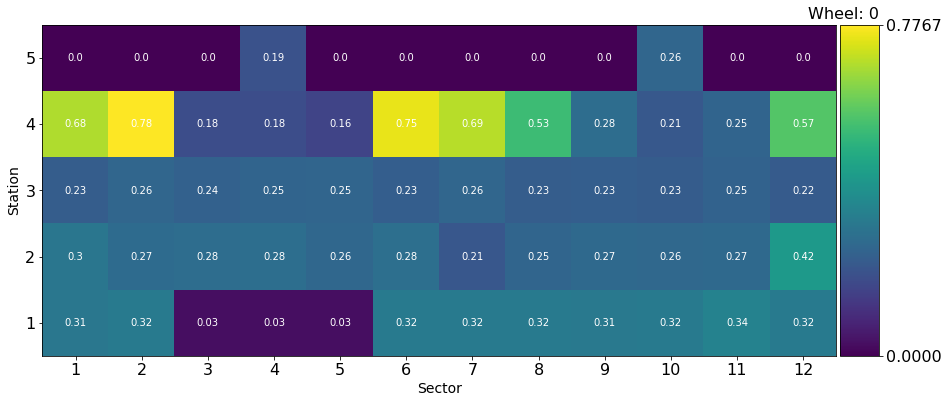

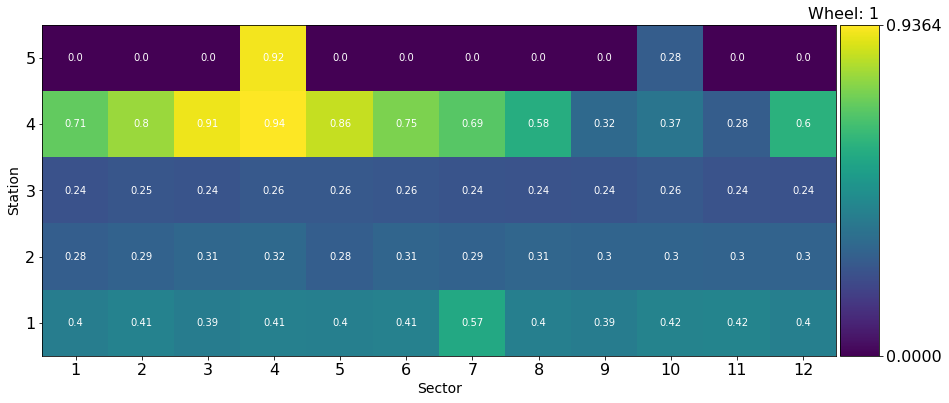

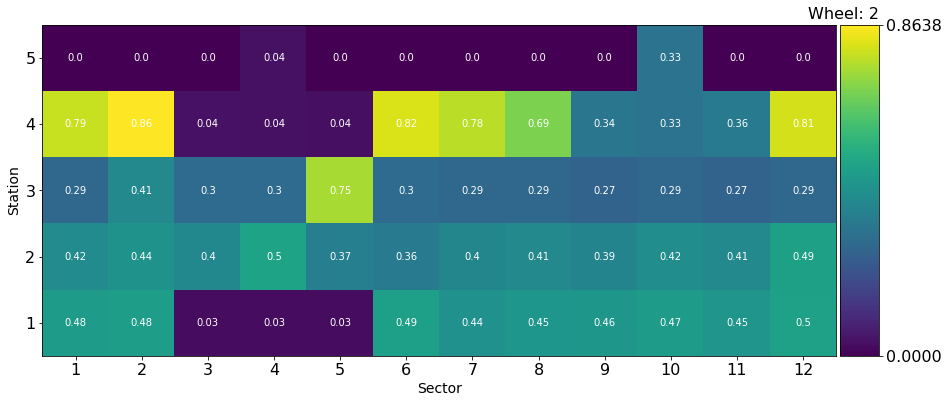

In [418]:
plot_scatter_2(ratio, -2)
plot_scatter_2(ratio, -1)
plot_scatter_2(ratio, 0)
plot_scatter_2(ratio, +1)
plot_scatter_2(ratio, +2)

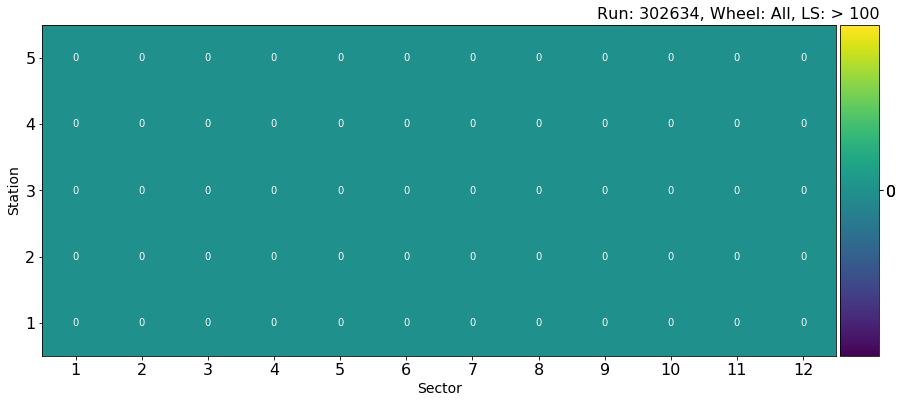

In [419]:
dis_nn = "cae_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -3, 100, -1)

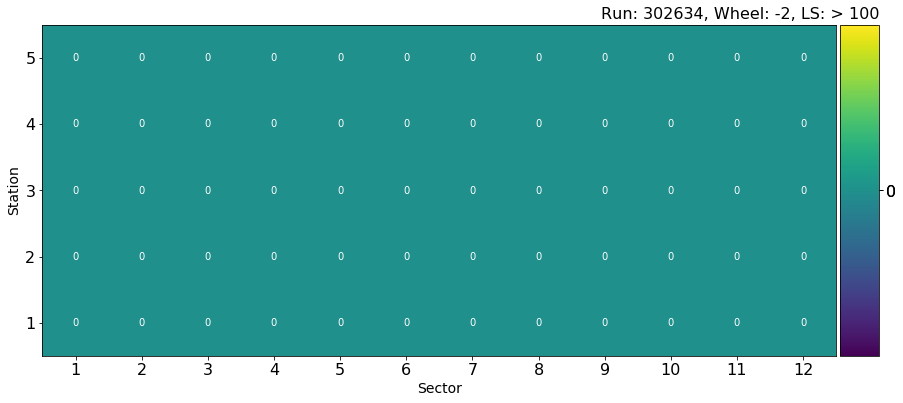

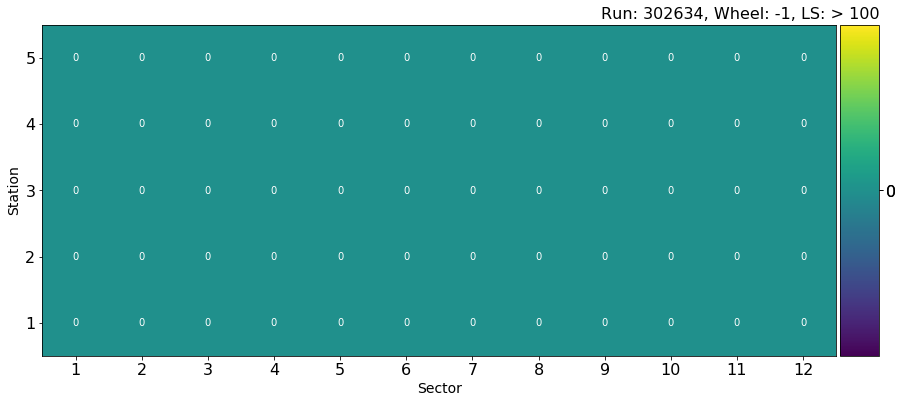

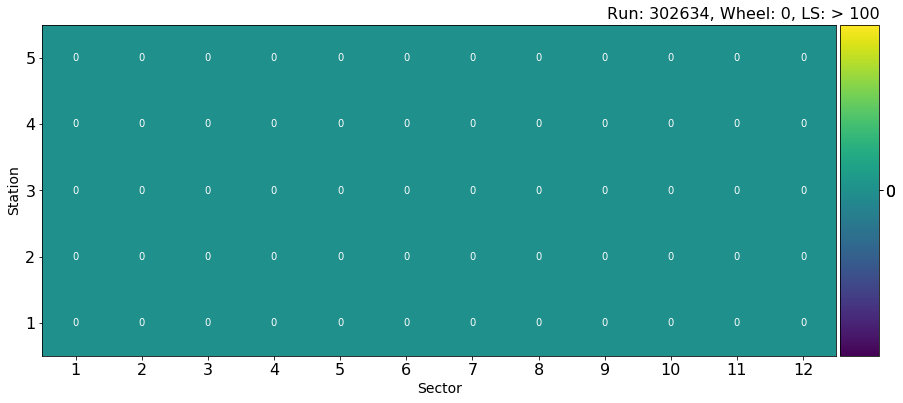

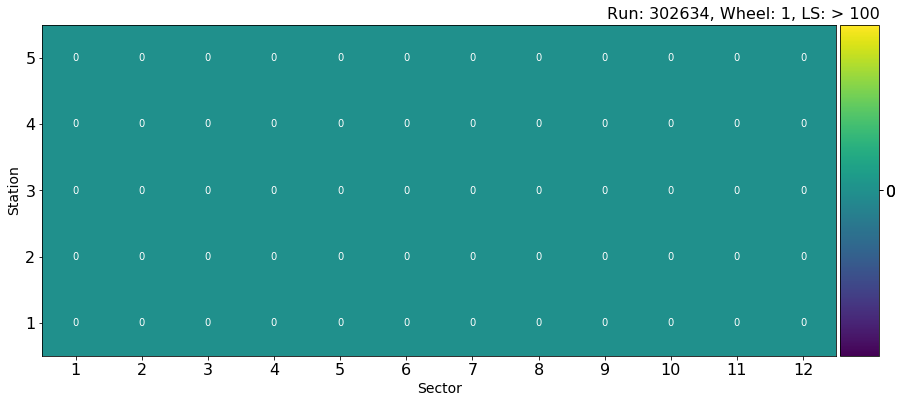

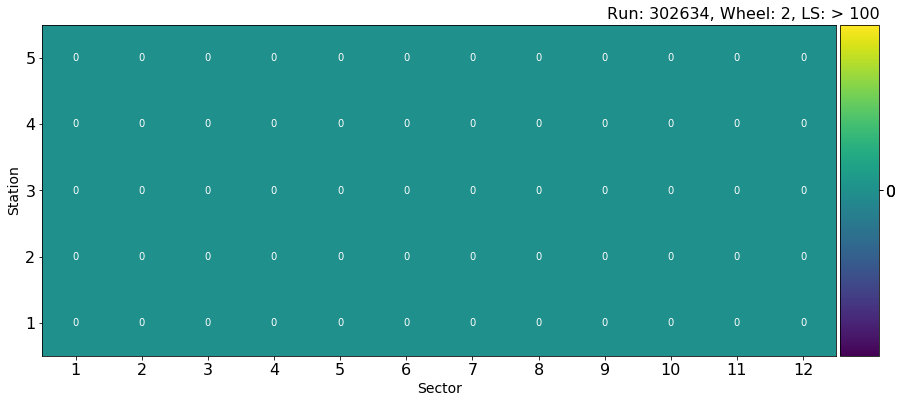

In [420]:
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Looking at how the recognized and unrecognized anomalies are distributed:

ANOMALIES: NOT SELECTED WITH AE


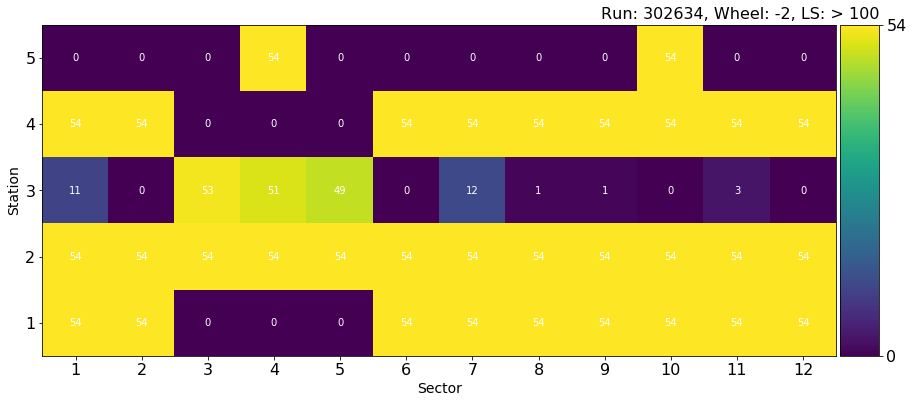

ANOMALIES: SELECTED WITH AE


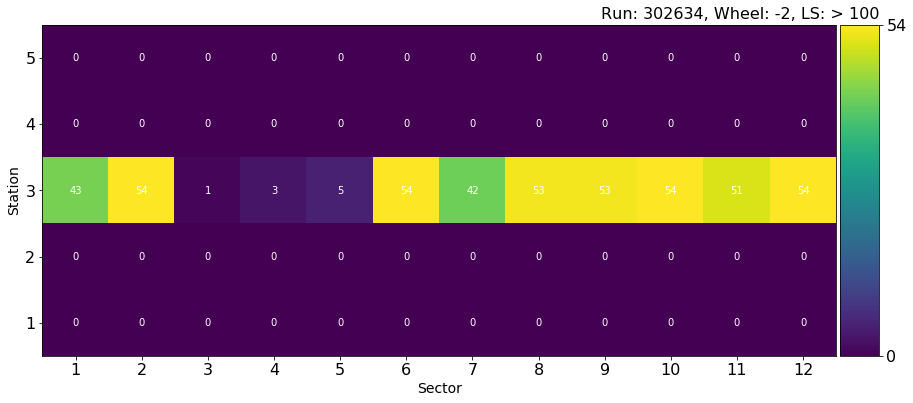

In [421]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


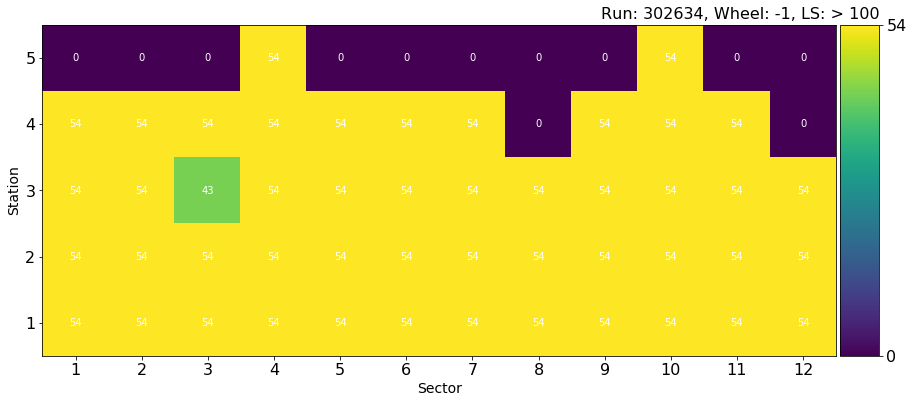

ANOMALIES: SELECTED WITH AE


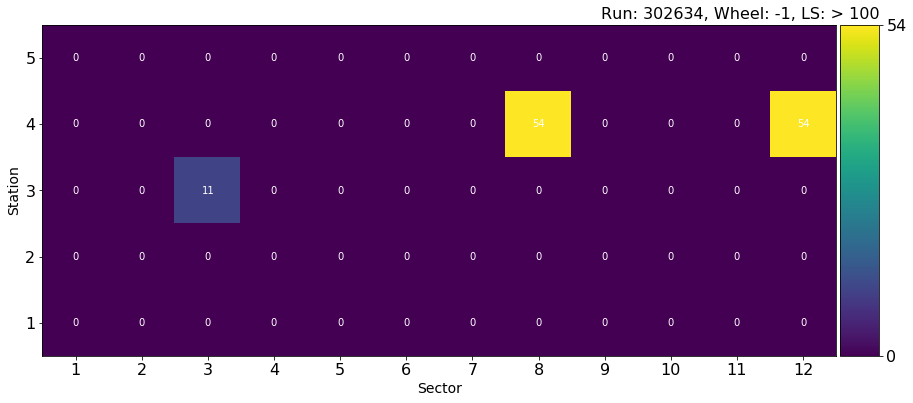

In [422]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


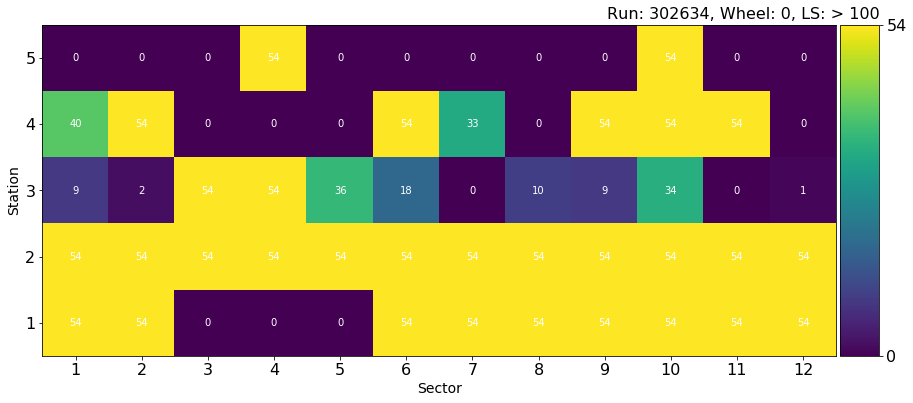

ANOMALIES: SELECTED WITH AE


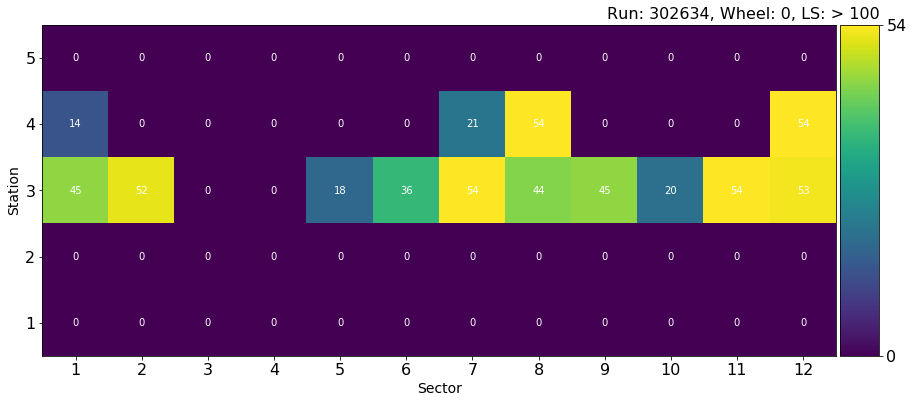

In [423]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


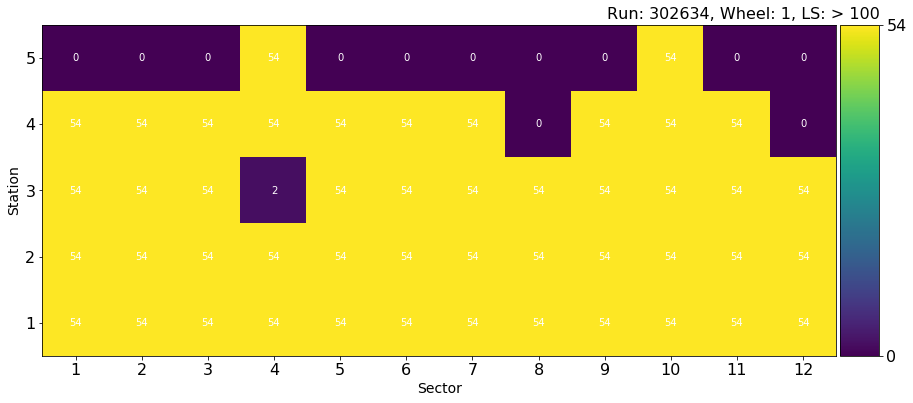

ANOMALIES: SELECTED WITH AE


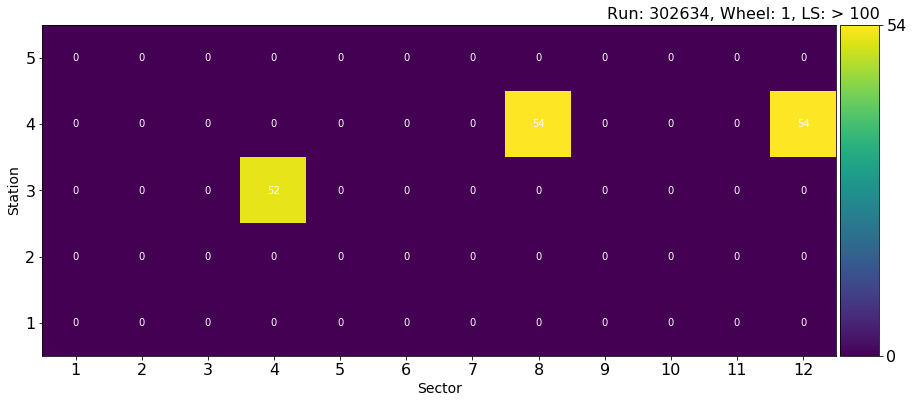

In [424]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


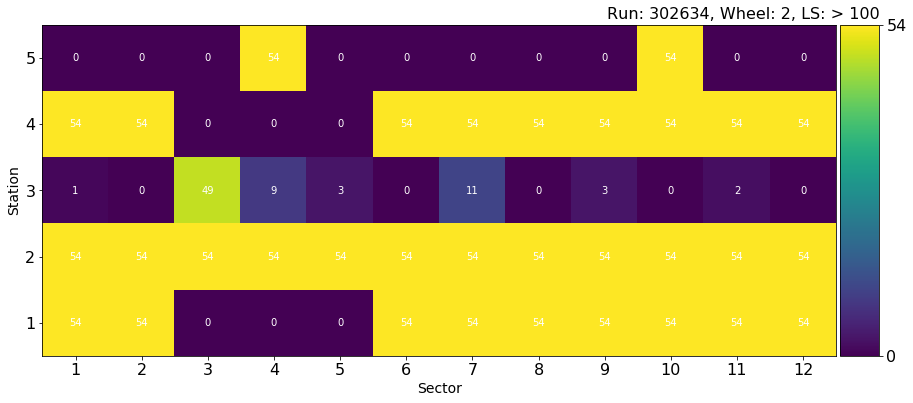

ANOMALIES: SELECTED WITH AE


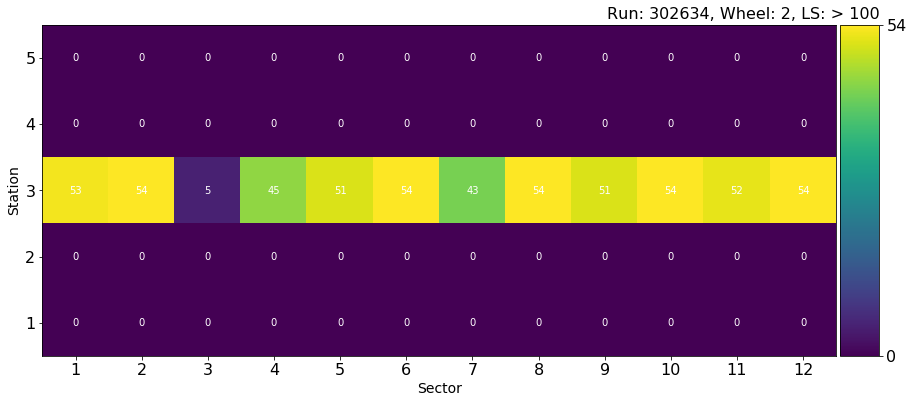

In [425]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Where are the FPs located in time?

In [92]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Average LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

def deduceLS(data):
    return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)

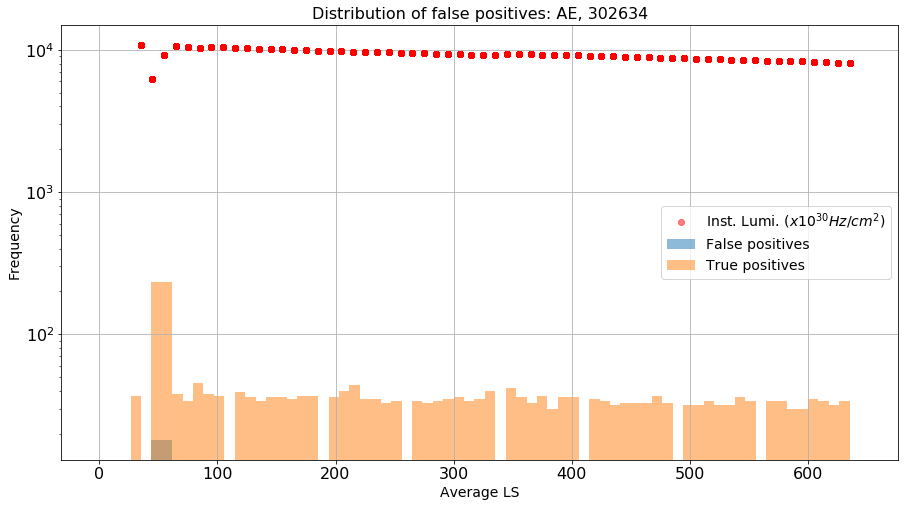

array([  0.,   0.,   0.,   0.,   0.,  18.,  18.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.])

In [223]:
threshold = th_AE
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

Trying unsupervised algorithms:

In [395]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=250, 
                            contamination=0.2
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))

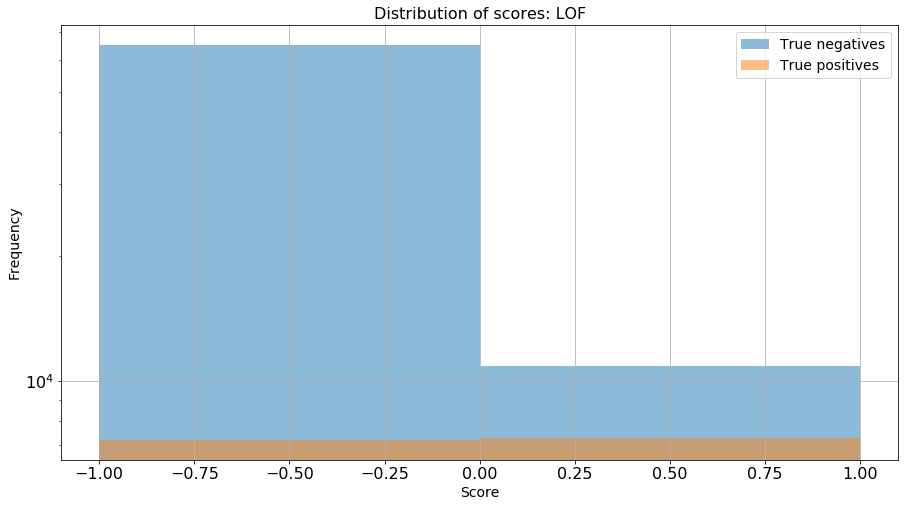

In [696]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="True negatives")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="True positives")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.85762752  0.14237248]
 [ 0.49678267  0.50321733]]


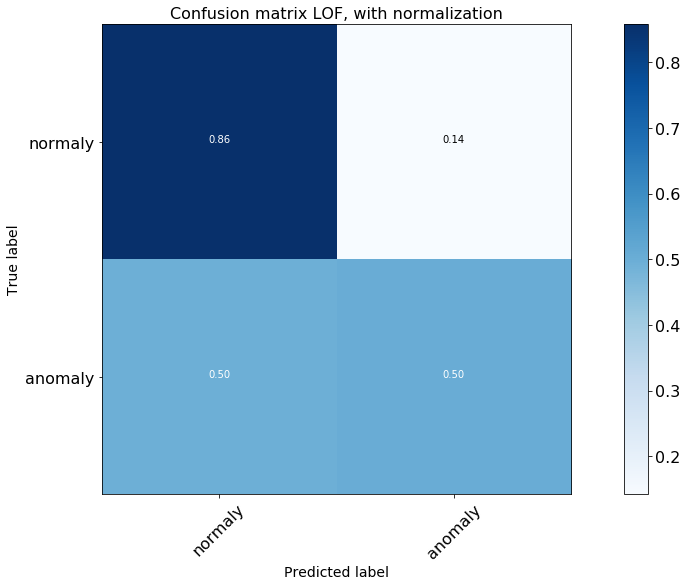

In [397]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

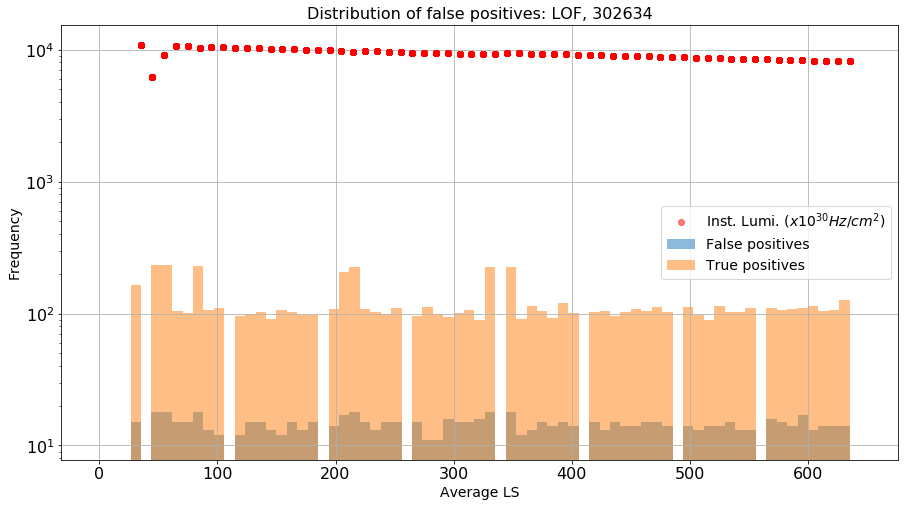

array([  0.,   0.,   0.,  15.,   0.,  18.,  18.,  15.,  15.,  18.,  13.,
        12.,   0.,  12.,  15.,  15.,  13.,  12.,  15.,  13.,  15.,   0.,
        14.,  17.,  18.,  15.,  13.,  15.,  15.,   0.,  15.,  11.,  11.,
        16.,  15.,  15.,  16.,  18.,   0.,  18.,  12.,  13.,  15.,  14.,
        15.,  14.,   0.,  15.,  13.,  15.,  14.,  14.,  15.,  15.,  14.,
         0.,  14.,  13.,  14.,  14.,  15.,  13.,  13.,   0.,  16.,  15.,
        14.,  17.,  13.,  14.,  14.,  14.,   0.])

In [398]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 30 54 23  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 54 48 52  0  0  0  0  0  0  0]]
261


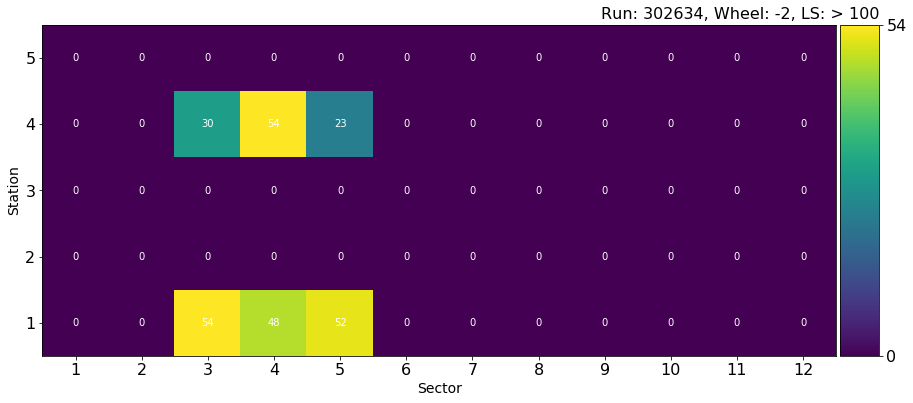

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]]
0


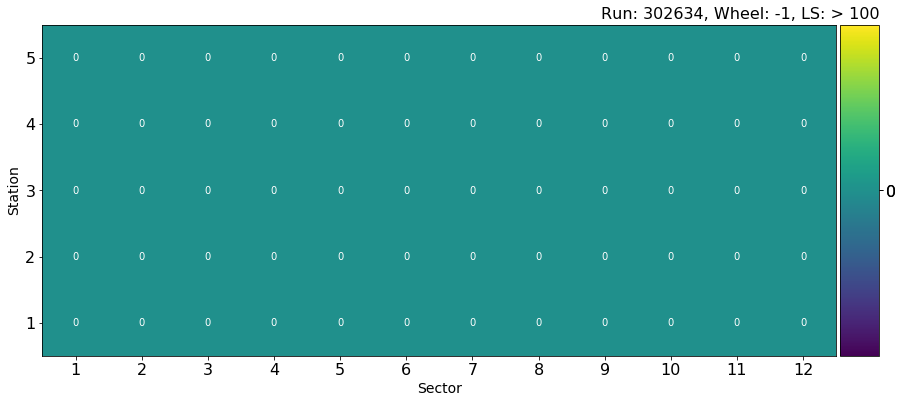

[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 11 48 51  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 45 45 50  0  0  0  0  0  0  0]]
250


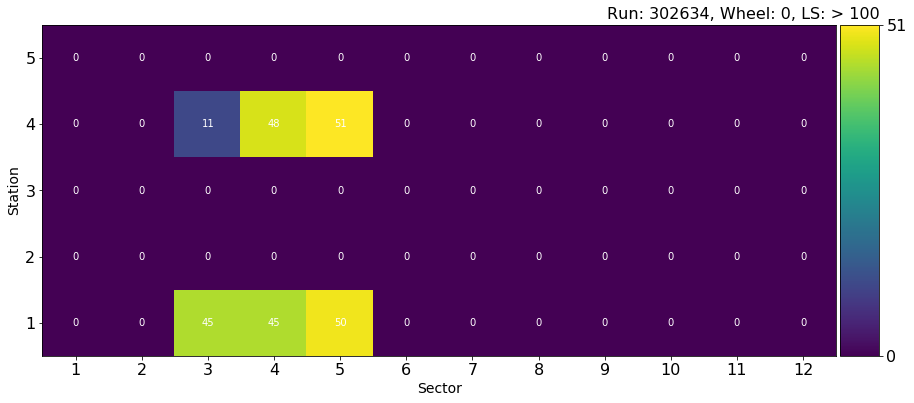

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]]
0


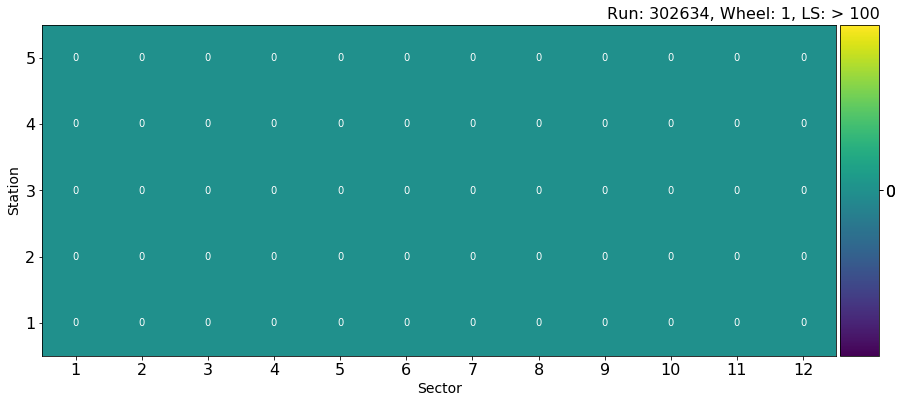

[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 54  5 54  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 52 51 48  0  0  0  0  0  0  0]]
264


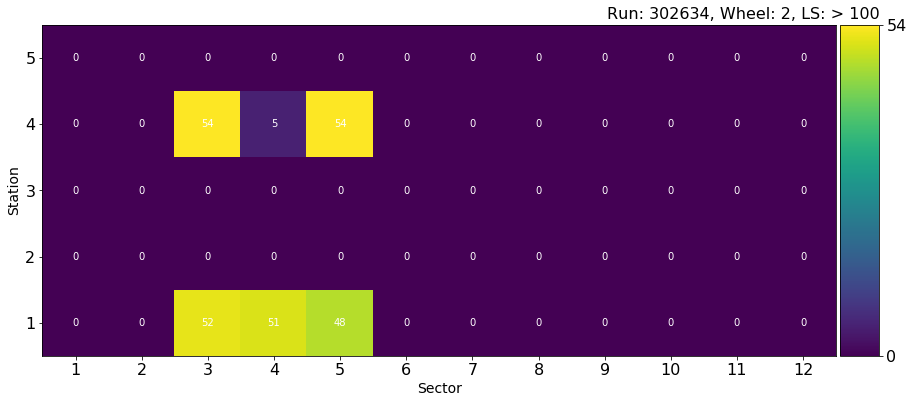

In [400]:
dis_nn = "lof_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > 0)

plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Trying KMeans:

In [673]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans.sav'
k_means = joblib.load(filename)

In [674]:
rule = (layers_test.run == 302634) #& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [675]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_scaled"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

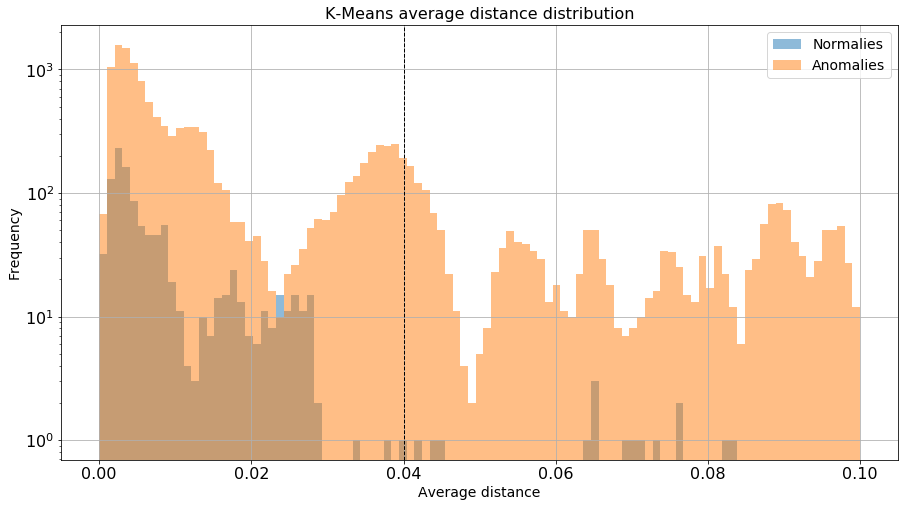

In [699]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.1, 100)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins, alpha=0.5, label="Anomalies")
plt.axvline(0.04, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Average distance')
plt.show()

Normalized confusion matrix
[[ 0.96903461  0.03096539]
 [ 0.82786885  0.17213115]]


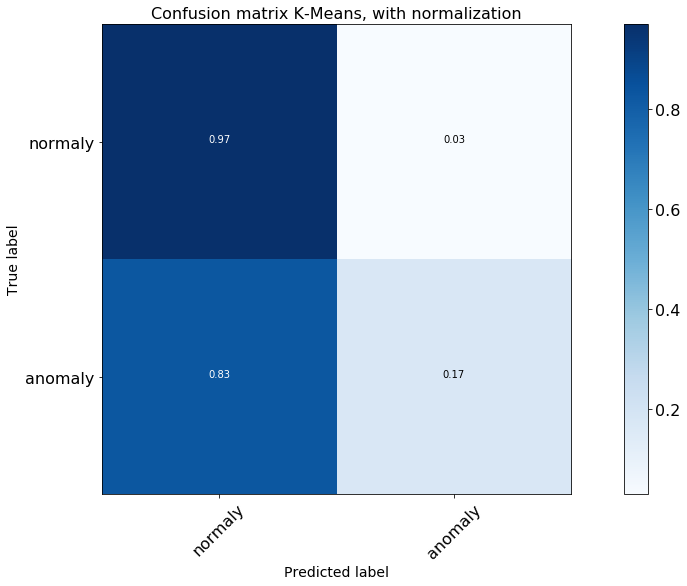

In [687]:
th_km = 0.04
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')